In [ ]:
import numpy as np
import pandas as pd
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize,word_tokenize
from gensim.models import Word2Vec
from keras.models import Sequential, load_model, model_from_config
import keras.backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import cohen_kappa_score

**Preparing Dataset**

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/maindataset/training_set_rel3.tsv", sep='\t', encoding='ISO-8859-1');
df.dropna(axis=1,inplace=True)
df.drop(columns=['domain1_score','rater1_domain1','rater2_domain1'],inplace=True,axis=1)
df.head()
temp = pd.read_csv("/content/drive/MyDrive/maindataset/Processed_data.csv")
temp.drop("Unnamed: 0",inplace=True,axis=1)

In [ ]:
df['domain1_score']=temp['final_score']
df.head()

,essay_id,essay_set,essay,domain1_score
0,1,1,"Dear local newspaper, I think effects computer...",6
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",7
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",5
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",8
4,5,1,"Dear @LOCATION1, I know having computers has a...",6


In [ ]:
df['essay'][0]

"Dear local newspaper, I think effects computers have on people are great learning skills/affects because they give us time to chat with friends/new people, helps us learn about the globe(astronomy) and keeps us out of troble! Thing about! Dont you think so? How would you feel if your teenager is always on the phone with friends! Do you ever time to chat with your friends or buisness partner about things. Well now - there's a new way to chat the computer, theirs plenty of sites on the internet to do so: @ORGANIZATION1, @ORGANIZATION2, @CAPS1, facebook, myspace ect. Just think now while your setting up meeting with your boss on the computer, your teenager is having fun on the phone not rushing to get off cause you want to use it. How did you learn about other countrys/states outside of yours? Well I have by computer/internet, it's a new way to learn about what going on in our time! You might think your child spends a lot of time on the computer, but ask them so question about the econom

In [ ]:
temp.head(1)

,essay_id,essay_set,essay,final_score,clean_essay,char_count,word_count,sent_count,avg_word_len,spell_err_count,noun_count,adj_count,verb_count,adv_count
0,1,1,"Dear local newspaper, I think effects computer...",6,Dear local newspaper I think effects computer...,1441,344,16,4.188953,19,76,75,18,24


In [ ]:
#Make Dataset
y = df['domain1_score']
df.drop('domain1_score',inplace=True,axis=1)
X=df

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.shape

(9083, 3)

**PREPROCESSING**

In [ ]:
train_e = X_train['essay'].tolist()
test_e = X_test['essay'].tolist()

In [ ]:
train_sents=[]
test_sents=[]
import nltk
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english'))
def sent2word(x):
    x=re.sub("[^A-Za-z]"," ",x)
    x.lower()
    filtered_sentence = []
    words=x.split()
    for w in words:
        if w not in stop_words:
            filtered_sentence.append(w)
    return filtered_sentence

def essay2word(essay):
    essay = essay.strip()
    tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')
    raw = tokenizer.tokenize(essay)
    final_words=[]
    for i in raw:
        if(len(i)>0):
            final_words.append(sent2word(i))
    return final_words

for i in train_e:
    train_sents+=essay2word(i)

for i in test_e:
    test_sents+=essay2word(i)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#Training Word2Vec model
num_features = 300
min_word_count = 40
num_workers = 4
context = 10
downsampling = 1e-3

model = Word2Vec(train_sents,
                 workers=num_workers,
                 vector_size=num_features,
                 min_count = min_word_count,
                 window = context,
                 sample = downsampling)

# model.init_sims(replace=True)
model.wv.save_word2vec_format('word2vecmodel.bin', binary=True)

In [ ]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [ ]:
def makeVec(words, model, num_features):
    vec = np.zeros((num_features),dtype="float32")
    noOfWords = 0.
    index2word_set = set(model.wv.index_to_key)
    for i in words:
        if i in index2word_set:
            noOfWords += 1
            # vec = np.add(vec,model.wv[i])
            vec = np.add(vec,model.wv[i])
            # vec += model.wv[i].reshape((1, num_features))
    vec = np.divide(vec,noOfWords)
    return vec


def getVecs(essays, model, num_features):
    c=0
    essay_vecs = np.zeros((len(essays),num_features),dtype="float32")
    for i in essays:
        essay_vecs[c] = makeVec(i, model, num_features)
        c+=1
    return essay_vecs


clean_train=[]
for i in train_e:
    clean_train.append(sent2word(i))
training_vectors = getVecs(clean_train, model, num_features)

clean_test=[]

for i in test_e:
    clean_test.append(sent2word(i))
testing_vectors = getVecs(clean_test, model, num_features)

In [ ]:
training_vectors.shape

(9083, 300)

In [ ]:
training_vectors = np.array(training_vectors)
testing_vectors = np.array(testing_vectors)

# Reshaping train and test vectors to 3 dimensions. (1 represnts one timestep)
training_vectors = np.reshape(training_vectors, (training_vectors.shape[0], 1, training_vectors.shape[1]))
testing_vectors = np.reshape(testing_vectors, (testing_vectors.shape[0], 1, testing_vectors.shape[1]))
# lstm_model = get_model()

**scratch code implementation**

Custom lstm

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer
import tensorflow.keras.backend as K

class CustomLSTM(Layer):
    def __init__(self, units, **kwargs):
        self.units = units
        super(CustomLSTM, self).__init__(**kwargs)

    def build(self, input_shape):
        self.kernel = self.add_weight(shape=(input_shape[-1], self.units * 4),
                                      initializer='uniform',
                                      name='kernel')
        self.recurrent_kernel = self.add_weight(shape=(self.units, self.units * 4),
                                                initializer='uniform',
                                                name='recurrent_kernel')
        self.bias = self.add_weight(shape=(self.units * 4,),
                                    initializer='zeros',
                                    name='bias')
        self.built = True

    def call(self, inputs, training=None, mask=None):
        h_tm1 = K.zeros_like(inputs[:, 0, :self.units])
        c_tm1 = K.zeros_like(inputs[:, 0, :self.units])

        def _step(inputs, states):
            h_tm1, c_tm1 = states

            z = K.dot(inputs, self.kernel) + K.dot(h_tm1, self.recurrent_kernel) + self.bias
            z0, z1, z2, z3 = z[:, :self.units], z[:, self.units:2 * self.units], z[:, 2 * self.units:3 * self.units], z[:, 3 * self.units:]

            i = K.sigmoid(z0)
            f = K.sigmoid(z1)
            c = f * c_tm1 + i * K.tanh(z2)
            o = K.sigmoid(z3)
            h = o * K.tanh(c)

            return h, [h, c]

        last_output, outputs, states = K.rnn(_step, inputs, [h_tm1, c_tm1])
        return last_output

    def compute_output_shape(self, input_shape):
        return input_shape[0], self.units


 Custom Dropout Layer

In [ ]:
import tensorflow as tf

class CustomDropout(Layer):
    def __init__(self, rate, **kwargs):
        super(CustomDropout, self).__init__(**kwargs)
        self.rate = rate

    def call(self, inputs, training=None):
        if training:
            return tf.nn.dropout(inputs, rate=self.rate)
        return inputs

    def get_config(self):
        config = super(CustomDropout, self).get_config()
        config.update({'rate': self.rate})
        return config


custom dense layer

In [ ]:
class CustomDense(Layer):
    def __init__(self, units, activation=None, **kwargs):
        super(CustomDense, self).__init__(**kwargs)
        self.units = units
        self.activation = activation  # Assign the activation function

    def build(self, input_shape):
        self.kernel = self.add_weight(shape=(input_shape[-1], self.units),
                                      initializer='glorot_uniform',
                                      trainable=True,
                                      name='kernel')
        self.bias = self.add_weight(shape=(self.units,),
                                    initializer='zeros',
                                    trainable=True,
                                    name='bias')
        self.built = True

    def call(self, inputs):
        output = K.dot(inputs, self.kernel) + self.bias
        if self.activation is not None:  # Check if activation function is provided
            output = self.activation(output)  # Apply activation function if provided
        return output

    def get_config(self):
        config = super(CustomDense, self).get_config()
        config.update({'units': self.units, 'activation': self.activation})
        return config


Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 7ms/step - loss: 11.7155 - mae: 2.7270 - val_loss: 6.1084 - val_mae: 1.9941
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.4872 - mae: 1.8684 - val_loss: 5.4011 - val_mae: 1.8580
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.9885 - mae: 1.7678 - val_loss: 4.9564 - val_mae: 1.7558
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.7179 - mae: 1.7138 - val_loss: 4.6078 - val_mae: 1.6713
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4863 - mae: 1.6558 - val_loss: 4.4916 - val_mae: 1.6570
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3615 - mae: 1.6295 - val_loss: 4.3193 - val_mae: 1.6127
Epoch 7/10
128/128 [==============================] - 1s 8ms/step - loss: 4.3150 - mae: 1.6238 - val_loss: 4.2466 - 

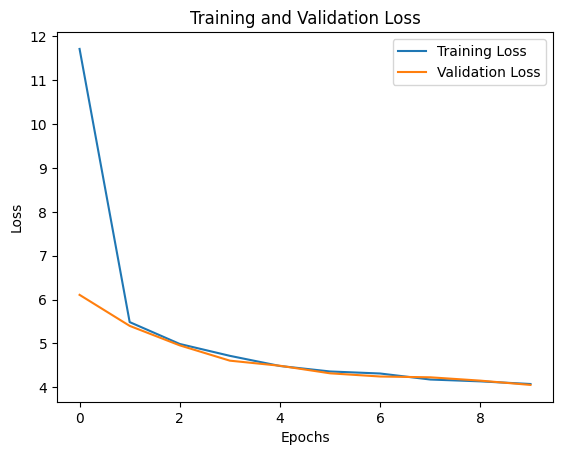

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5088771272076091
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 7ms/step - loss: 10.9501 - mse: 10.9501 - val_loss: 6.0190 - val_mse: 6.0190
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.3810 - mse: 5.3810 - val_loss: 5.2890 - val_mse: 5.2890
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8705 - mse: 4.8705 - val_loss: 4.8052 - val_mse: 4.8052
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.6108 - mse: 4.6108 - val_loss: 4.5991 - val_mse: 4.5991
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4238 - mse: 4.4238 - val_loss: 4.4533 - val_mse: 4.4533
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2918 - mse: 4.2918 - val_loss: 4.2497 - val_mse: 4.2497
Epo

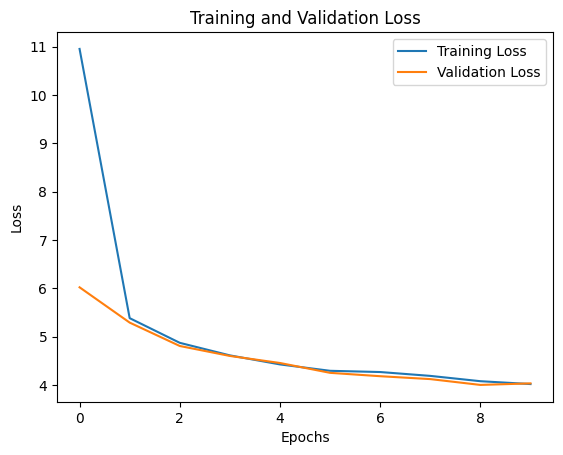

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5104501400786894
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.7990 - mae: 2.5084 - val_loss: 6.1451 - val_mae: 2.0308
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5667 - mae: 1.9084 - val_loss: 5.7882 - val_mae: 1.9456
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 5.3386 - mae: 1.8549 - val_loss: 5.5517 - val_mae: 1.8925
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1791 - mae: 1.8197 - val_loss: 5.4065 - val_mae: 1.8683
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 5.0074 - mae: 1.7822 - val_loss: 5.1974 - val_mae: 1.8183
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8523 - mae: 1.7510 - val_loss: 5.0385 - val_mae: 1.7812
Epoch 

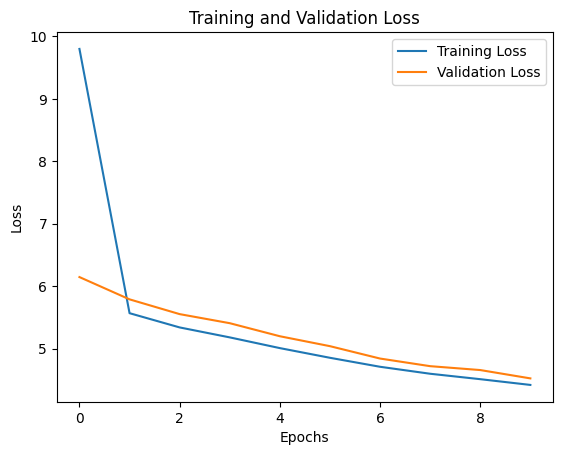

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4206728478984273
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 9.4891 - mse: 9.4891 - val_loss: 6.1087 - val_mse: 6.1087
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5444 - mse: 5.5444 - val_loss: 5.7298 - val_mse: 5.7298
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 5.3017 - mse: 5.3017 - val_loss: 5.5085 - val_mse: 5.5085
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1204 - mse: 5.1204 - val_loss: 5.3117 - val_mse: 5.3117
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.9563 - mse: 4.9563 - val_loss: 5.1150 - val_mse: 5.1150
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.7926 - mse: 4.7926 - val_loss: 4.9486 - val_mse: 4.9486
Epoch 

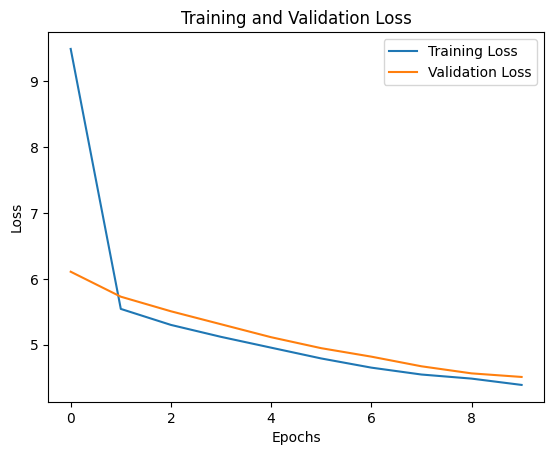

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4111747778927263
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.7582 - mae: 2.4906 - val_loss: 5.6879 - val_mae: 1.9228
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0794 - mae: 1.7879 - val_loss: 4.8386 - val_mae: 1.7265
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.5318 - mae: 1.6611 - val_loss: 4.4581 - val_mae: 1.6462
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2976 - mae: 1.6136 - val_loss: 4.3244 - val_mae: 1.6238
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.1702 - mae: 1.5912 - val_loss: 4.0980 - val_mae: 1.5640
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.1197 - mae: 1.5787 - val_loss: 4.0951 - val_mae: 1.5792
Ep

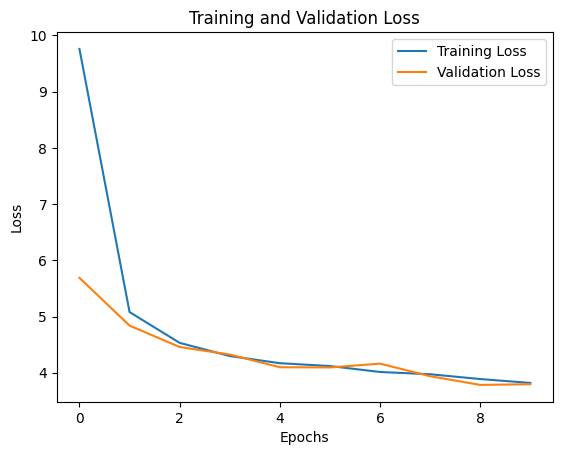

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5593860217133897
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 9.2685 - mse: 9.2685 - val_loss: 5.7423 - val_mse: 5.7423
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.0401 - mse: 5.0401 - val_loss: 4.8167 - val_mse: 4.8167
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.5251 - mse: 4.5251 - val_loss: 4.4899 - val_mse: 4.4899
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2924 - mse: 4.2924 - val_loss: 4.3206 - val_mse: 4.3206
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.1897 - mse: 4.1897 - val_loss: 4.2470 - val_mse: 4.2470
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.1123 - mse: 4.1123 - val_loss: 4.0599 - val_mse: 4.0599
Ep

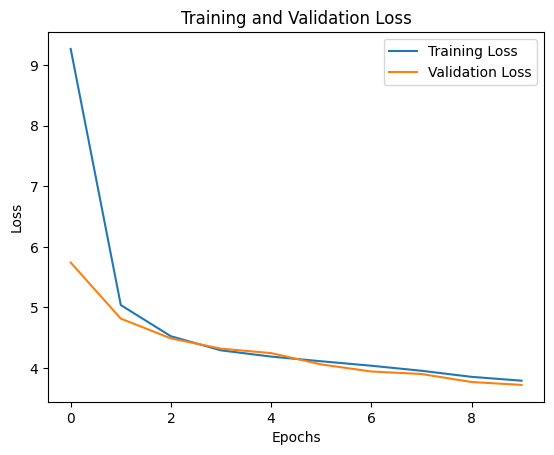

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5534259373253622
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 33.1047 - mae: 5.2273 - val_loss: 29.0300 - val_mae: 4.8378
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 24.3882 - mae: 4.3646 - val_loss: 22.1440 - val_mae: 4.1266
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 18.6958 - mae: 3.7375 - val_loss: 17.4229 - val_mae: 3.6199
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 14.8506 - mae: 3.3097 - val_loss: 14.2074 - val_mae: 3.2611
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 12.2206 - mae: 2.9956 - val_loss: 12.0167 - val_mae: 2.9838
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 10.4821 - mae: 2.7598 - val_loss: 10.5241 - val_ma

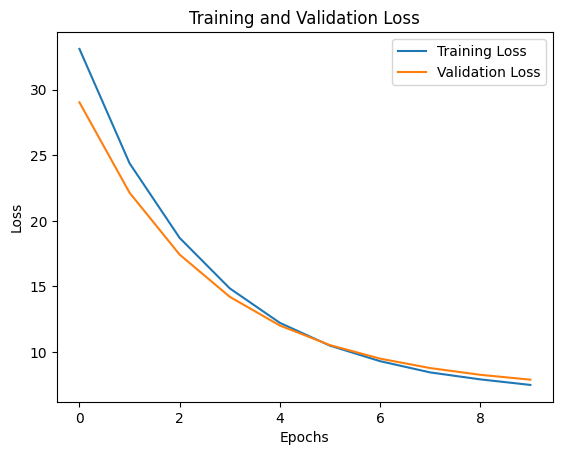

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.02026255303327651
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 33.7930 - mse: 33.7930 - val_loss: 30.2461 - val_mse: 30.2461
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 25.7703 - mse: 25.7703 - val_loss: 23.6797 - val_mse: 23.6797
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 20.2593 - mse: 20.2593 - val_loss: 18.9639 - val_mse: 18.9639
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 16.3046 - mse: 16.3046 - val_loss: 15.5942 - val_mse: 15.5942
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 13.5005 - mse: 13.5005 - val_loss: 13.2026 - val_mse: 13.2026
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 11.5466 - mse: 11.5466 - val_loss: 11.4

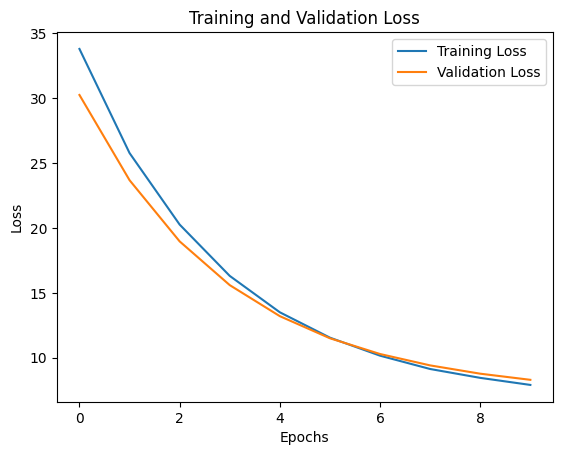

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.005930036458956733
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 40.0116 - mae: 5.8266 - val_loss: 41.1442 - val_mae: 5.8909
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 39.8771 - mae: 5.8152 - val_loss: 40.9529 - val_mae: 5.8754
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 39.6655 - mae: 5.7973 - val_loss: 40.6953 - val_mae: 5.8542
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 39.3944 - mae: 5.7744 - val_loss: 40.3897 - val_mae: 5.8291
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 39.0863 - mae: 5.7480 - val_loss: 40.0633 - val_mae: 5.8021
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 38.7694 - mae: 5.7209 - val_loss: 39.7313 - va

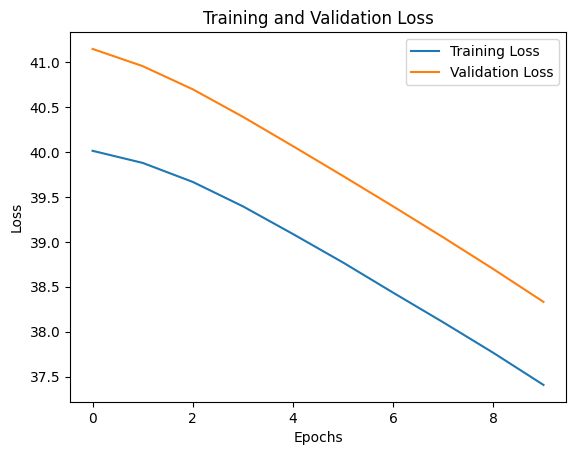

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: -0.0008728470912948705
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 39.9877 - mse: 39.9877 - val_loss: 41.1319 - val_mse: 41.1319
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 39.8348 - mse: 39.8348 - val_loss: 40.9085 - val_mse: 40.9085
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 39.5905 - mse: 39.5905 - val_loss: 40.6418 - val_mse: 40.6418
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 39.3037 - mse: 39.3037 - val_loss: 40.3465 - val_mse: 40.3465
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 38.9841 - mse: 38.9841 - val_loss: 40.0009 - val_mse: 40.0009
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 38.6263 - mse: 38.6263 - val_loss: 

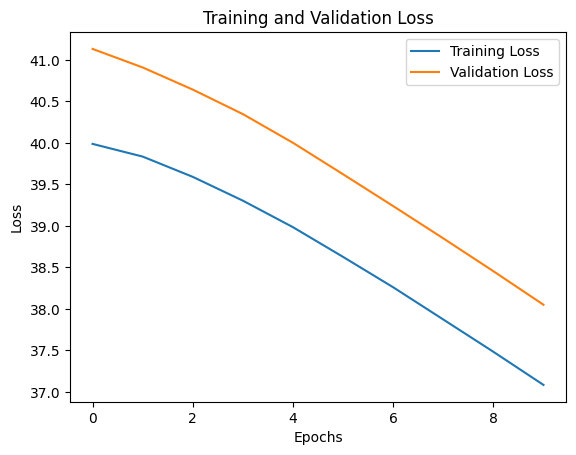

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: -0.0008363282248735615
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 14.2482 - mae: 3.0899 - val_loss: 6.7795 - val_mae: 2.1366
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 6.0023 - mae: 1.9786 - val_loss: 6.1181 - val_mae: 2.0099
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 5.5962 - mae: 1.8983 - val_loss: 5.7347 - val_mae: 1.9289
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 5.3418 - mae: 1.8411 - val_loss: 5.4361 - val_mae: 1.8633
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 5.1252 - mae: 1.7975 - val_loss: 5.2086 - val_mae: 1.8151
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.9223 - mae: 1.7569 - val_loss: 5.0356 - val_mae: 1.784

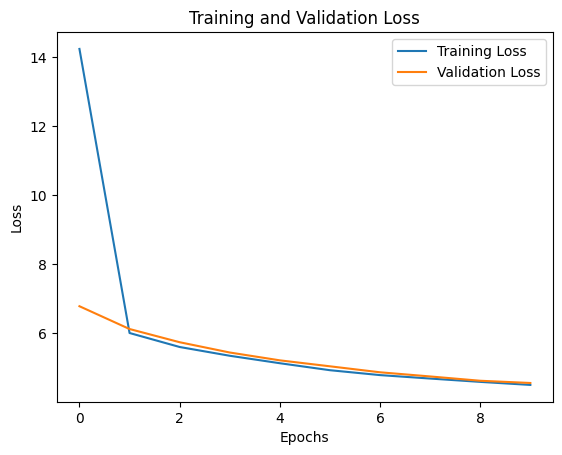

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.43220075701034266
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 9ms/step - loss: 13.7877 - mse: 13.7877 - val_loss: 6.6607 - val_mse: 6.6607
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.9113 - mse: 5.9113 - val_loss: 6.0497 - val_mse: 6.0497
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 5.5354 - mse: 5.5354 - val_loss: 5.6810 - val_mse: 5.6810
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 5.2545 - mse: 5.2545 - val_loss: 5.3931 - val_mse: 5.3931
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.0681 - mse: 5.0681 - val_loss: 5.1388 - val_mse: 5.1388
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8737 - mse: 4.8737 - val_loss: 4.9815 - val_mse: 4.9815

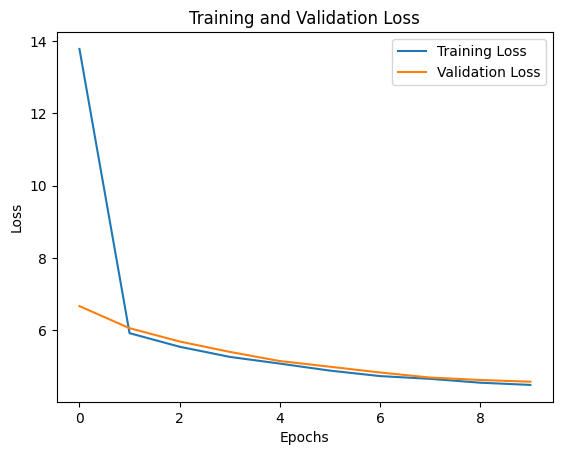

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4215154783864741
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 11.9285 - mae: 2.7463 - val_loss: 6.1455 - val_mae: 2.0045
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.4198 - mae: 1.8624 - val_loss: 5.3435 - val_mae: 1.8437
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9583 - mae: 1.7591 - val_loss: 4.8932 - val_mae: 1.7488
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.6226 - mae: 1.6922 - val_loss: 4.5658 - val_mae: 1.6613
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.4288 - mae: 1.6430 - val_loss: 4.3820 - val_mae: 1.6267
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3334 - mae: 1.6238 - val_loss: 4.2671 - val_mae: 1.6066
Ep

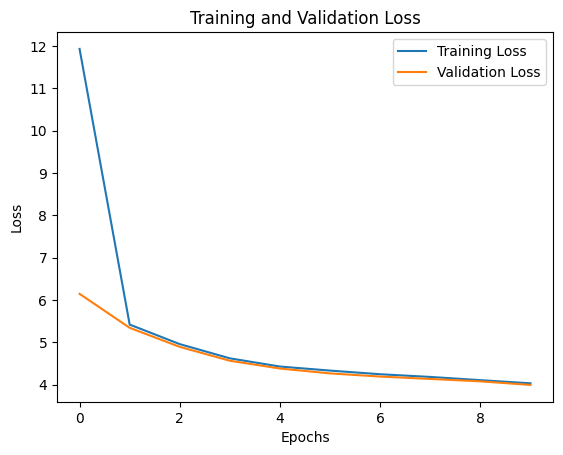

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5159241213049361
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 12.0107 - mse: 12.0107 - val_loss: 6.1399 - val_mse: 6.1399
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.3811 - mse: 5.3811 - val_loss: 5.3738 - val_mse: 5.3738
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.8975 - mse: 4.8975 - val_loss: 4.8629 - val_mse: 4.8629
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.5895 - mse: 4.5895 - val_loss: 4.5313 - val_mse: 4.5313
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.4082 - mse: 4.4082 - val_loss: 4.3614 - val_mse: 4.3614
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2718 - mse: 4.2718 - val_loss: 4.2500 - val_mse: 4.2500
E

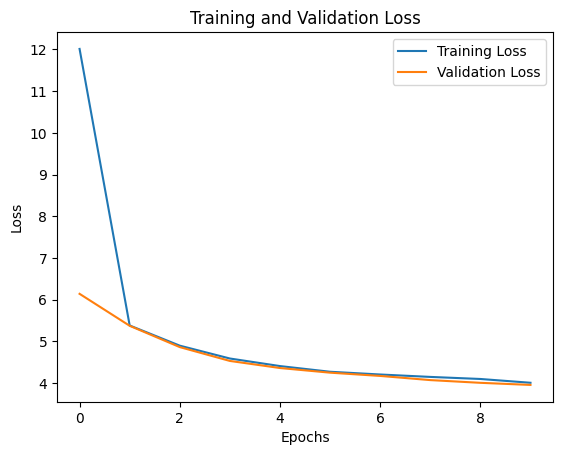

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5179436497310672
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 11.4893 - mae: 2.6890 - val_loss: 6.0788 - val_mae: 1.9944
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.4506 - mae: 1.8654 - val_loss: 5.2959 - val_mae: 1.8215
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9378 - mae: 1.7550 - val_loss: 4.8715 - val_mae: 1.7267
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.6878 - mae: 1.6976 - val_loss: 4.5381 - val_mae: 1.6553
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4216 - mae: 1.6414 - val_loss: 4.3771 - val_mae: 1.6221
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3609 - mae: 1.6287 - val_loss: 4.3208 - val_mae: 1.6263
Ep

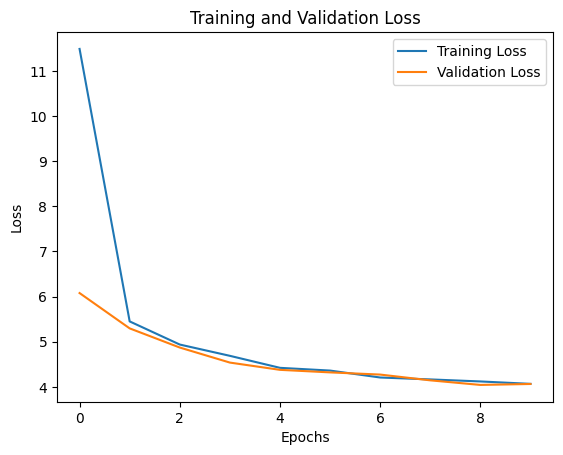

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.49851451978278727
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 11.3991 - mse: 11.3991 - val_loss: 6.0244 - val_mse: 6.0244
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.4150 - mse: 5.4150 - val_loss: 5.3070 - val_mse: 5.3070
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9286 - mse: 4.9286 - val_loss: 4.8732 - val_mse: 4.8732
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.6307 - mse: 4.6307 - val_loss: 4.5908 - val_mse: 4.5908
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4272 - mse: 4.4272 - val_loss: 4.4674 - val_mse: 4.4674
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3280 - mse: 4.3280 - val_loss: 4.3411 - val_mse: 4.3411


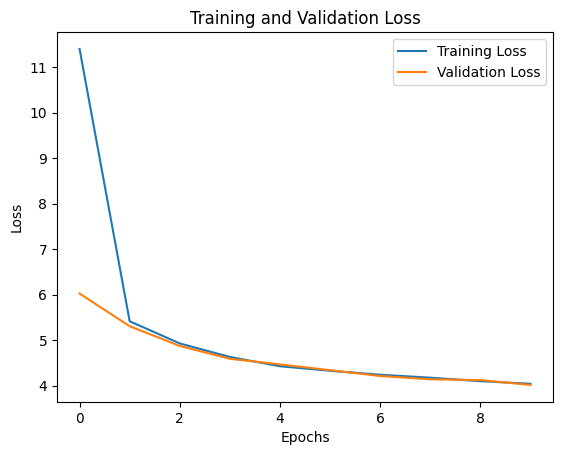

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5016708782177106
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 6s 13ms/step - loss: 9.6114 - mae: 2.4864 - val_loss: 6.0945 - val_mae: 2.0120
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.5383 - mae: 1.9025 - val_loss: 5.7612 - val_mae: 1.9429
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 5.3142 - mae: 1.8518 - val_loss: 5.5377 - val_mae: 1.8935
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1145 - mae: 1.8065 - val_loss: 5.3728 - val_mae: 1.8594
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9809 - mae: 1.7746 - val_loss: 5.1662 - val_mae: 1.8157
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.8253 - mae: 1.7426 - val_loss: 5.0175 - val_mae: 1.7825
Epo

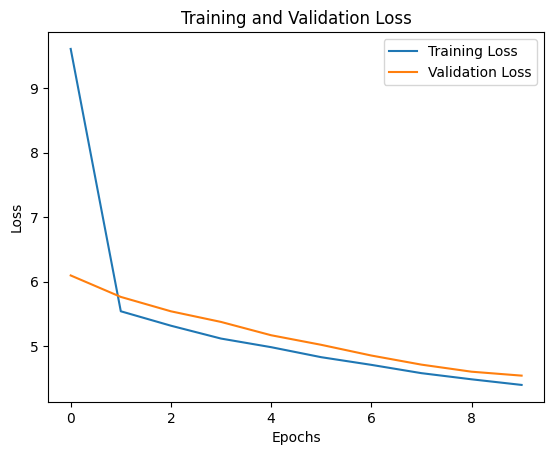

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4175728949687477
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 9.2012 - mse: 9.2012 - val_loss: 6.0784 - val_mse: 6.0784
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5334 - mse: 5.5334 - val_loss: 5.7176 - val_mse: 5.7176
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 5.2961 - mse: 5.2961 - val_loss: 5.5172 - val_mse: 5.5172
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0719 - mse: 5.0719 - val_loss: 5.2916 - val_mse: 5.2916
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9523 - mse: 4.9523 - val_loss: 5.1226 - val_mse: 5.1226
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.8010 - mse: 4.8010 - val_loss: 4.9678 - val_mse: 4.9678
Epo

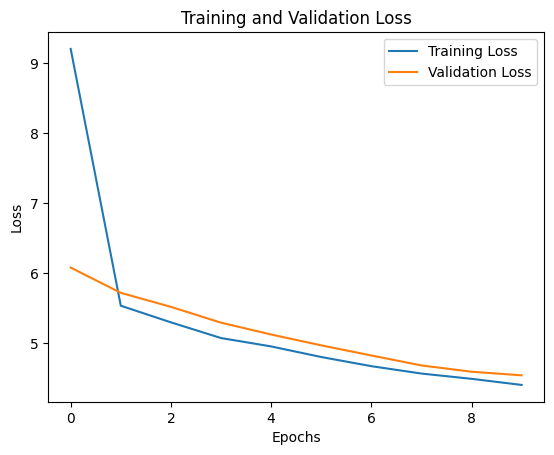

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.416940035920606
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.7940 - mae: 2.4920 - val_loss: 5.6474 - val_mae: 1.9002
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9968 - mae: 1.7694 - val_loss: 4.8243 - val_mae: 1.7143
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.5140 - mae: 1.6584 - val_loss: 4.4197 - val_mae: 1.6328
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3100 - mae: 1.6180 - val_loss: 4.2597 - val_mae: 1.6106
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.1695 - mae: 1.5882 - val_loss: 4.1594 - val_mae: 1.5878
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.0789 - mae: 1.5727 - val_loss: 4.0483 - val_mae: 1.5703
E

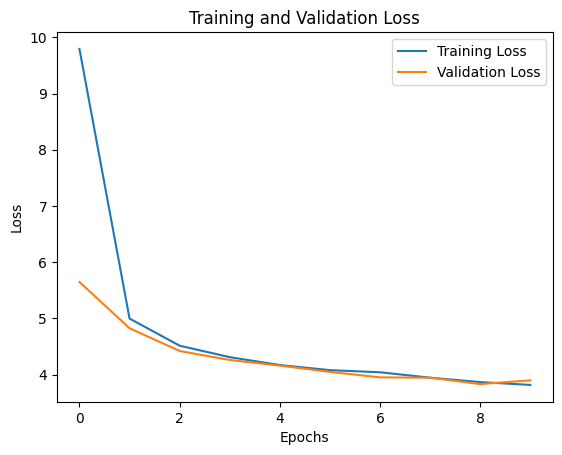

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5681756956978035
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.3977 - mse: 9.3977 - val_loss: 5.6821 - val_mse: 5.6821
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.0296 - mse: 5.0296 - val_loss: 4.7974 - val_mse: 4.7974
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5408 - mse: 4.5408 - val_loss: 4.4525 - val_mse: 4.4525
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3100 - mse: 4.3100 - val_loss: 4.2851 - val_mse: 4.2851
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2011 - mse: 4.2011 - val_loss: 4.2527 - val_mse: 4.2527
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.1222 - mse: 4.1222 - val_loss: 4.0165 - val_mse: 4.01

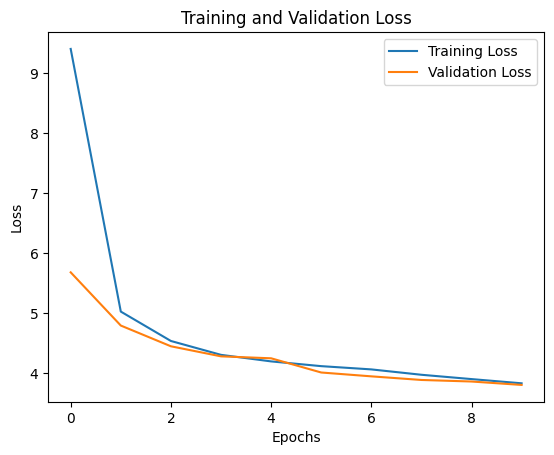

122/122 [==============================] - 0s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5452485897555825
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 2s 8ms/step - loss: 32.9611 - mae: 5.2144 - val_loss: 28.7176 - val_mae: 4.8120
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 23.9981 - mae: 4.3286 - val_loss: 21.6735 - val_mae: 4.0838
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 18.2304 - mae: 3.6962 - val_loss: 16.9201 - val_mae: 3.5706
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 14.3518 - mae: 3.2566 - val_loss: 13.7458 - val_mae: 3.2103
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 11.7816 - mae: 2.9425 - val_loss: 11.6219 - val_mae: 2.9320
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 10.0700 - mae: 2.7007 - val_loss: 10.1949 - val_

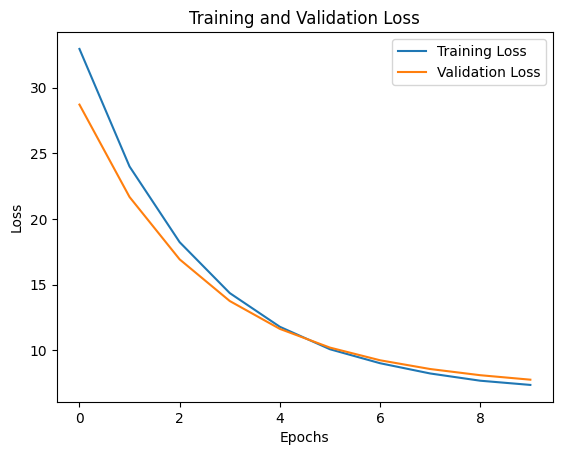

122/122 [==============================] - 1s 6ms/step
Quadratic Weighted Kappa (QWK) Score: 0.03220605723118919
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 8ms/step - loss: 33.0132 - mse: 33.0132 - val_loss: 28.9605 - val_mse: 28.9605
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 24.2723 - mse: 24.2723 - val_loss: 22.0286 - val_mse: 22.0286
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 18.5759 - mse: 18.5759 - val_loss: 17.2947 - val_mse: 17.2947
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 14.7154 - mse: 14.7154 - val_loss: 14.0952 - val_mse: 14.0952
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 12.1048 - mse: 12.1048 - val_loss: 11.9237 - val_mse: 11.9237
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 10.4114 - mse: 10.4114 - val_loss: 10

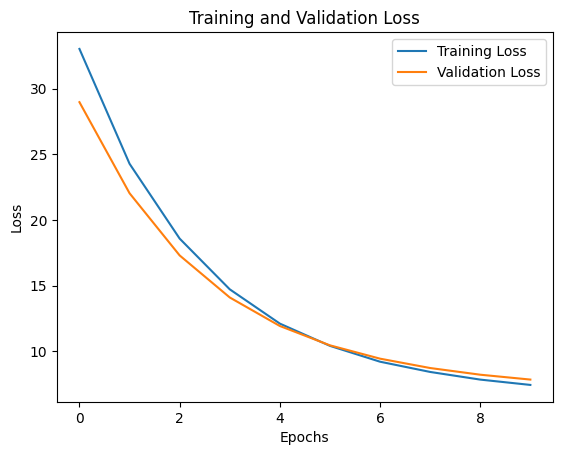

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.027134808032266866
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 10ms/step - loss: 39.7655 - mae: 5.8072 - val_loss: 40.8651 - val_mae: 5.8699
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 39.6004 - mae: 5.7939 - val_loss: 40.6859 - val_mae: 5.8559
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 39.4077 - mae: 5.7785 - val_loss: 40.4938 - val_mae: 5.8409
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 39.2092 - mae: 5.7623 - val_loss: 40.2895 - val_mae: 5.8248
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 39.0061 - mae: 5.7459 - val_loss: 40.0748 - val_mae: 5.8079
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 38.7832 - mae: 5.7279 - val_loss: 39.8498 - 

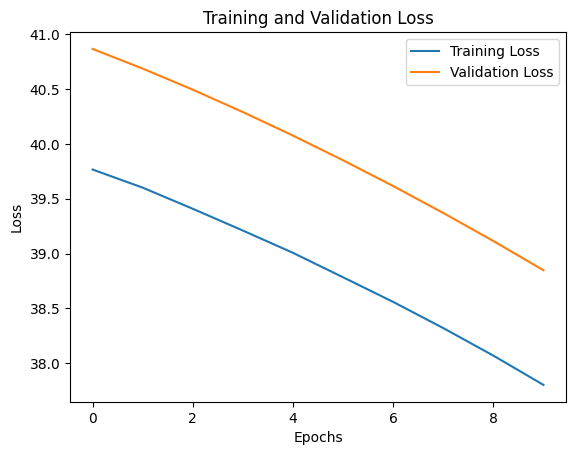

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: -3.816526833366751e-05
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 40.0750 - mse: 40.0750 - val_loss: 41.1540 - val_mse: 41.1540
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 39.9000 - mse: 39.9000 - val_loss: 40.9677 - val_mse: 40.9677
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 39.7012 - mse: 39.7012 - val_loss: 40.7692 - val_mse: 40.7692
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 39.5051 - mse: 39.5051 - val_loss: 40.5601 - val_mse: 40.5601
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 39.2915 - mse: 39.2915 - val_loss: 40.3402 - val_mse: 40.3402
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 39.0675 - mse: 39.0675 - val_lo

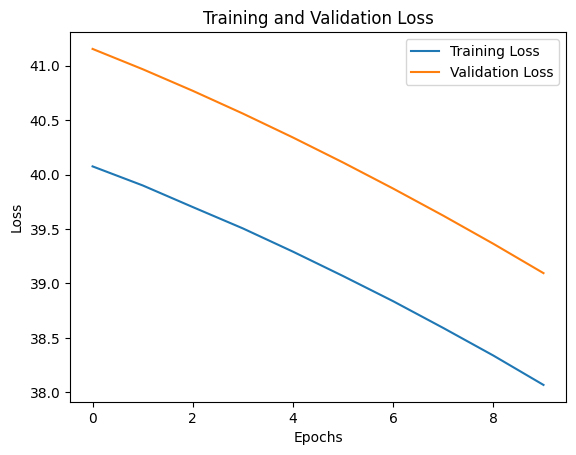

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.00011275519535591805
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 14.3617 - mae: 3.1010 - val_loss: 6.7514 - val_mae: 2.1336
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.9818 - mae: 1.9795 - val_loss: 6.0760 - val_mae: 1.9967
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 5.6046 - mae: 1.8985 - val_loss: 5.7234 - val_mae: 1.9287
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3220 - mae: 1.8436 - val_loss: 5.4452 - val_mae: 1.8543
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 5.1449 - mae: 1.8008 - val_loss: 5.1910 - val_mae: 1.8103
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9168 - mae: 1.7533 - val_loss: 5.0027 - val_mae: 1.

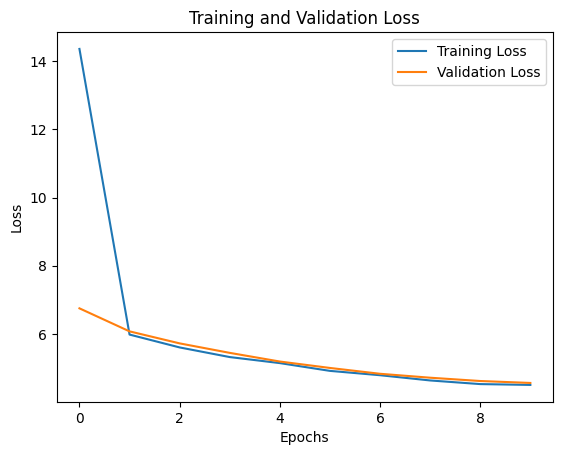

122/122 [==============================] - 1s 7ms/step
Quadratic Weighted Kappa (QWK) Score: 0.42991363229064705
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 11ms/step - loss: 14.6821 - mse: 14.6821 - val_loss: 6.8277 - val_mse: 6.8277
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 6.0177 - mse: 6.0177 - val_loss: 6.1164 - val_mse: 6.1164
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 5.6440 - mse: 5.6440 - val_loss: 5.7615 - val_mse: 5.7615
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 5.3558 - mse: 5.3558 - val_loss: 5.5097 - val_mse: 5.5097
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 5.1258 - mse: 5.1258 - val_loss: 5.2213 - val_mse: 5.2213
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9398 - mse: 4.9398 - val_loss: 5.0614 - val_mse: 5.06

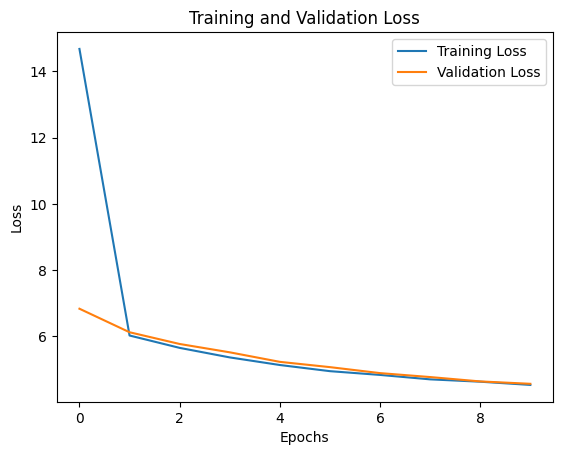

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4252915615632963
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 6s 17ms/step - loss: 11.9678 - mae: 2.7608 - val_loss: 6.1101 - val_mae: 2.0021
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3996 - mae: 1.8546 - val_loss: 5.3042 - val_mae: 1.8383
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9128 - mae: 1.7522 - val_loss: 4.8959 - val_mae: 1.7530
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.5430 - mae: 1.6749 - val_loss: 4.5476 - val_mae: 1.6540
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.4816 - mae: 1.6526 - val_loss: 4.4087 - val_mae: 1.6367
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.3286 - mae: 1.6243 - val_loss: 4.3467 - val_mae: 1.6276

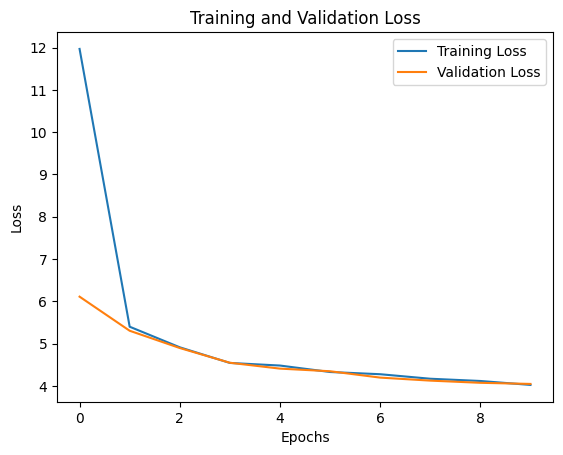

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5042333281547726
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 12.1859 - mse: 12.1859 - val_loss: 6.1145 - val_mse: 6.1145
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.4426 - mse: 5.4426 - val_loss: 5.3547 - val_mse: 5.3547
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9799 - mse: 4.9799 - val_loss: 4.9172 - val_mse: 4.9172
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.6475 - mse: 4.6475 - val_loss: 4.5499 - val_mse: 4.5499
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4657 - mse: 4.4657 - val_loss: 4.3784 - val_mse: 4.3784
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.3398 - mse: 4.3398 - val_loss: 4.2764 - val_mse: 4.2764

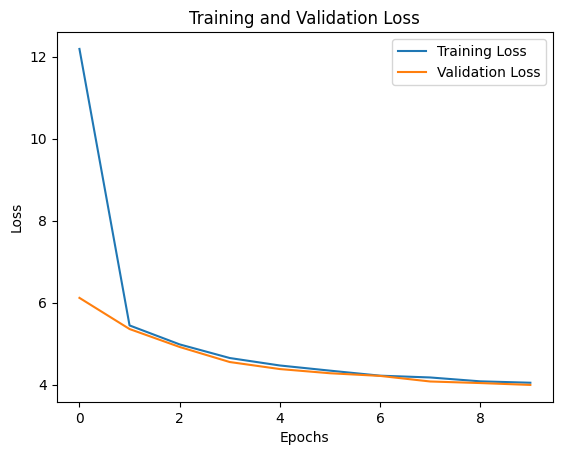

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4996840104387391
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 30.2502 - mae: 4.9740 - val_loss: 30.5346 - val_mae: 4.9905
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4848 - mae: 4.9047 - val_loss: 30.5242 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4790 - mae: 4.9042 - val_loss: 30.5213 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4769 - mae: 4.9040 - val_loss: 30.5201 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4759 - mae: 4.9039 - val_loss: 30.5195 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4754 - mae: 4.9038 - val_loss: 30.5191 - val_mae:

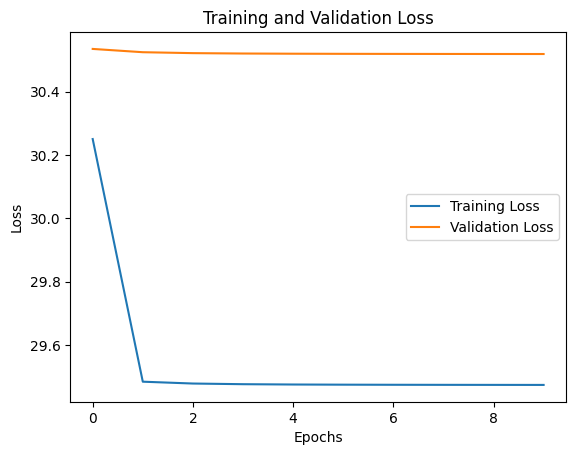

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 32ms/step - loss: 30.2174 - mse: 30.2174 - val_loss: 30.5333 - val_mse: 30.5333
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4840 - mse: 29.4840 - val_loss: 30.5238 - val_mse: 30.5238
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4786 - mse: 29.4786 - val_loss: 30.5211 - val_mse: 30.5211
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4767 - mse: 29.4767 - val_loss: 30.5199 - val_mse: 30.5199
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4758 - mse: 29.4758 - val_loss: 30.5194 - val_mse: 30.5194
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4753 - mse: 29.4753 - val_loss: 30.5

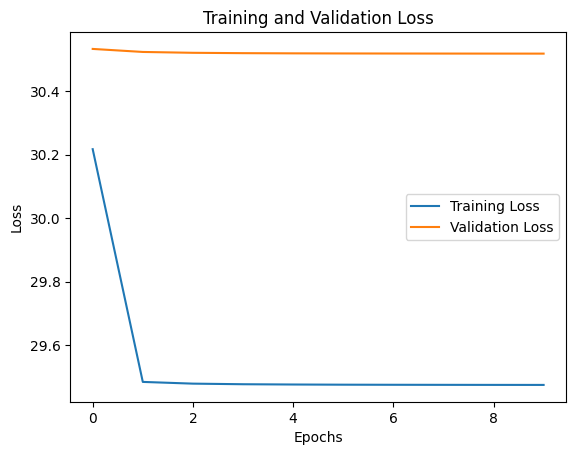

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 30.1493 - mae: 4.9659 - val_loss: 30.6180 - val_mae: 4.9983
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5406 - mae: 4.9101 - val_loss: 30.5645 - val_mae: 4.9933
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5109 - mae: 4.9073 - val_loss: 30.5478 - val_mae: 4.9918
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4994 - mae: 4.9061 - val_loss: 30.5397 - val_mae: 4.9910
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4931 - mae: 4.9055 - val_loss: 30.5350 - val_mae: 4.9906
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4894 - mae: 4.9052 - val_loss: 30.5320 - val_mae

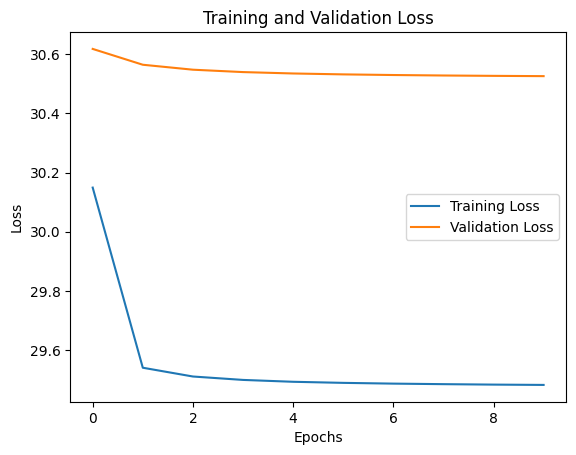

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 30.2300 - mse: 30.2300 - val_loss: 30.6335 - val_mse: 30.6335
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5507 - mse: 29.5507 - val_loss: 30.5713 - val_mse: 30.5713
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5161 - mse: 29.5161 - val_loss: 30.5520 - val_mse: 30.5520
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5029 - mse: 29.5029 - val_loss: 30.5427 - val_mse: 30.5427
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4958 - mse: 29.4958 - val_loss: 30.5373 - val_mse: 30.5373
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4915 - mse: 29.4915 - val_loss: 30.533

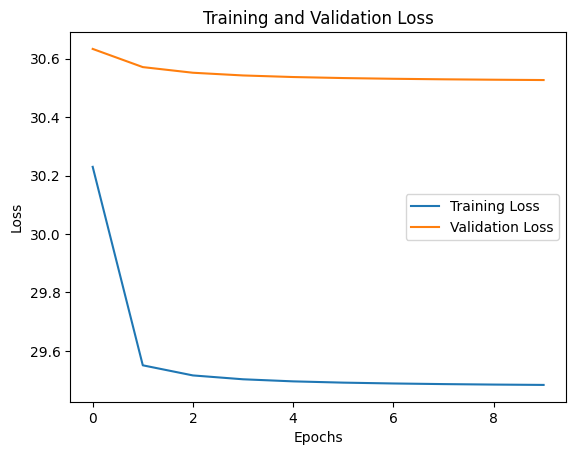

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 29.9679 - mae: 4.9484 - val_loss: 30.5197 - val_mae: 4.9891
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 29.4745 - mae: 4.9038 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 3/10
128/128 [==============================] - 2s 16ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 12ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 2s 15ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182

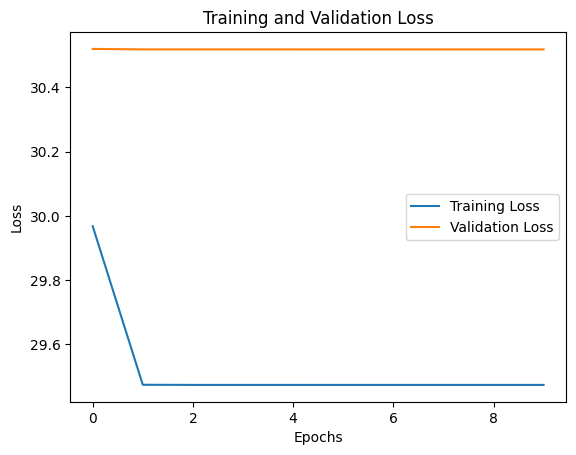

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 29.9178 - mse: 29.9178 - val_loss: 30.5195 - val_mse: 30.5195
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4745 - mse: 29.4745 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30

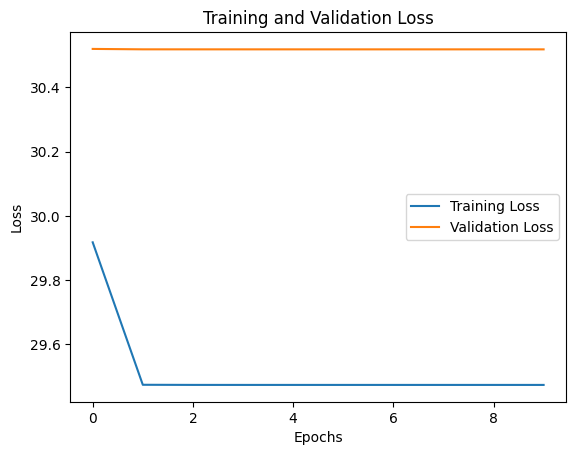

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 35.4809 - mae: 5.4471 - val_loss: 33.9632 - val_mae: 5.2986
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 31.9070 - mae: 5.1307 - val_loss: 32.2983 - val_mae: 5.1510
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 30.8751 - mae: 5.0354 - val_loss: 31.6529 - val_mae: 5.0927
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 30.4209 - mae: 4.9931 - val_loss: 31.3287 - val_mae: 5.0631
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 30.1772 - mae: 4.9700 - val_loss: 31.1386 - val_mae: 5.0458
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 30.0280 - mae: 4.9561 - val_loss: 31.0153 - val

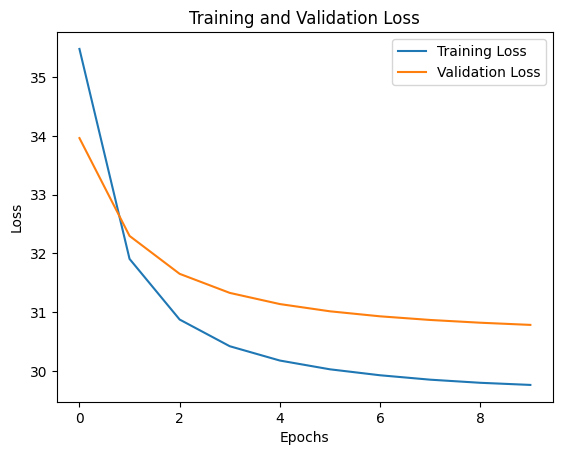

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 35.0881 - mse: 35.0881 - val_loss: 33.7144 - val_mse: 33.7144
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 31.7360 - mse: 31.7360 - val_loss: 32.1744 - val_mse: 32.1744
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 30.7806 - mse: 30.7806 - val_loss: 31.5793 - val_mse: 31.5793
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 30.3626 - mse: 30.3626 - val_loss: 31.2787 - val_mse: 31.2787
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 30.1365 - mse: 30.1365 - val_loss: 31.1016 - val_mse: 31.1016
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.9946 - mse: 29.9946 - val_loss: 30

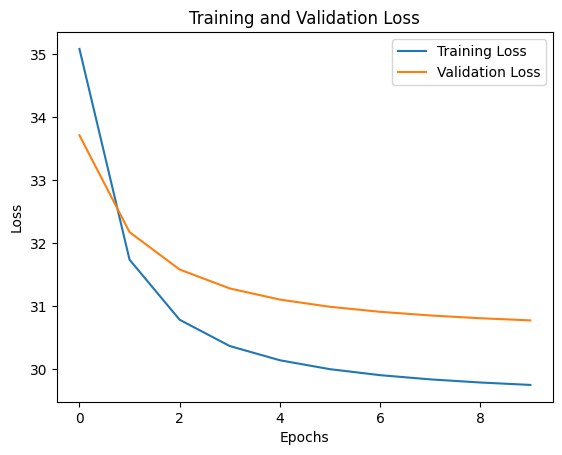

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 40.0627 - mae: 5.8341 - val_loss: 41.1896 - val_mae: 5.8973
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 39.8921 - mae: 5.8197 - val_loss: 41.0184 - val_mae: 5.8834
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 39.7225 - mae: 5.8057 - val_loss: 40.8346 - val_mae: 5.8687
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 39.5342 - mae: 5.7902 - val_loss: 40.6402 - val_mae: 5.8534
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 39.3412 - mae: 5.7745 - val_loss: 40.4367 - val_mae: 5.8374
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 39.1351 - mae: 5.7578 - val_loss: 40.2248 - v

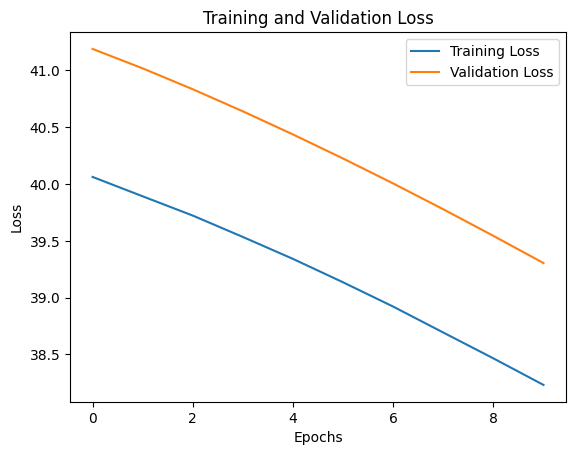

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 39.8530 - mse: 39.8530 - val_loss: 40.9638 - val_mse: 40.9638
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 39.6748 - mse: 39.6748 - val_loss: 40.7761 - val_mse: 40.7761
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 39.4771 - mse: 39.4771 - val_loss: 40.5767 - val_mse: 40.5767
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 39.2800 - mse: 39.2800 - val_loss: 40.3678 - val_mse: 40.3678
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 39.0650 - mse: 39.0650 - val_loss: 40.1500 - val_mse: 40.1500
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 38.8458 - mse: 38.8458 - val_loss

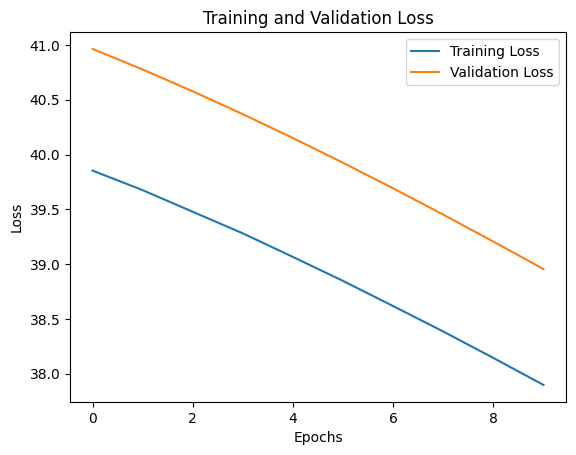

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 30.5967 - mae: 5.0072 - val_loss: 30.5904 - val_mae: 4.9955
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.5208 - mae: 4.9081 - val_loss: 30.5476 - val_mae: 4.9916
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4974 - mae: 4.9059 - val_loss: 30.5352 - val_mae: 4.9905
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4885 - mae: 4.9051 - val_loss: 30.5294 - val_mae: 4.9900
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4842 - mae: 4.9047 - val_loss: 30.5262 - val_mae: 4.9897
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4816 - mae: 4.9044 - val_loss: 30.5242 - 

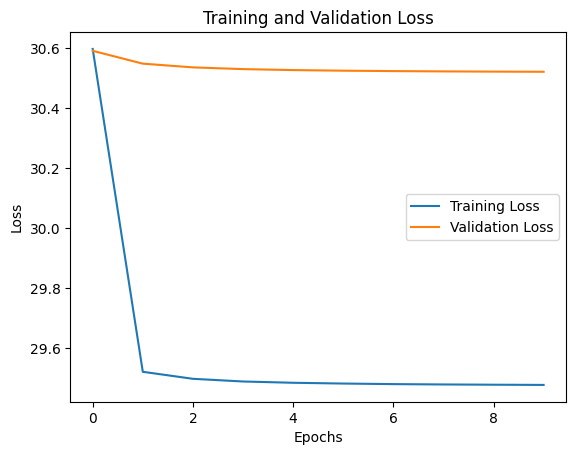

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 30.5881 - mse: 30.5881 - val_loss: 30.5929 - val_mse: 30.5929
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5219 - mse: 29.5219 - val_loss: 30.5489 - val_mse: 30.5489
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4982 - mse: 29.4982 - val_loss: 30.5357 - val_mse: 30.5357
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4891 - mse: 29.4891 - val_loss: 30.5297 - val_mse: 30.5297
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4847 - mse: 29.4847 - val_loss: 30.5263 - val_mse: 30.5263
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 29.4817 - mse: 29.4817 - val_loss: 3

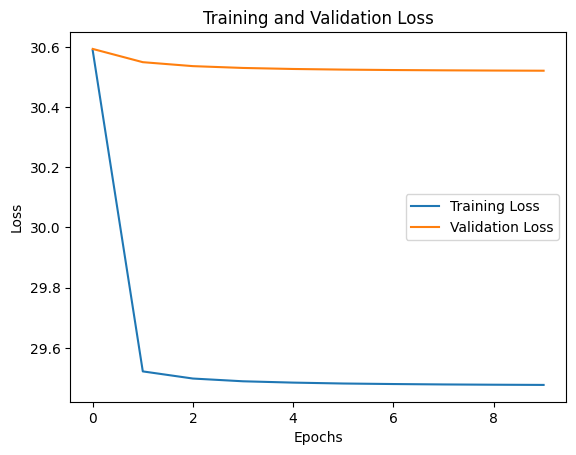

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 30.3721 - mae: 4.9847 - val_loss: 30.5371 - val_mae: 4.9907
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4860 - mae: 4.9048 - val_loss: 30.5249 - val_mae: 4.9896
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4793 - mae: 4.9042 - val_loss: 30.5216 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4771 - mae: 4.9040 - val_loss: 30.5203 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4760 - mae: 4.9039 - val_loss: 30.5196 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4755 - mae: 4.9039 - val_loss: 30.5192 - val_

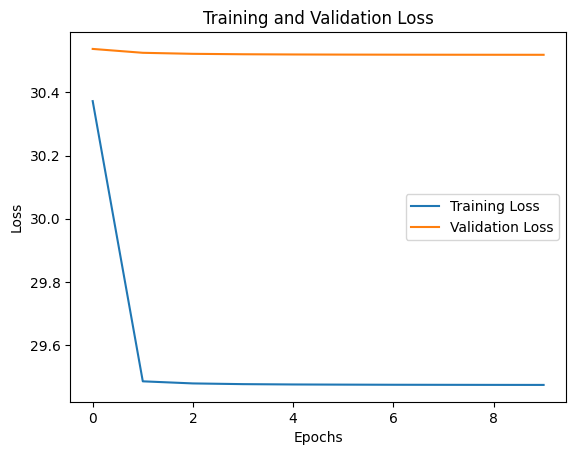

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 10ms/step - loss: 30.4905 - mse: 30.4905 - val_loss: 30.5389 - val_mse: 30.5389
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4870 - mse: 29.4870 - val_loss: 30.5253 - val_mse: 30.5253
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4796 - mse: 29.4796 - val_loss: 30.5218 - val_mse: 30.5218
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4772 - mse: 29.4772 - val_loss: 30.5204 - val_mse: 30.5204
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4762 - mse: 29.4762 - val_loss: 30.5197 - val_mse: 30.5197
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4755 - mse: 29.4755 - val_loss: 30.

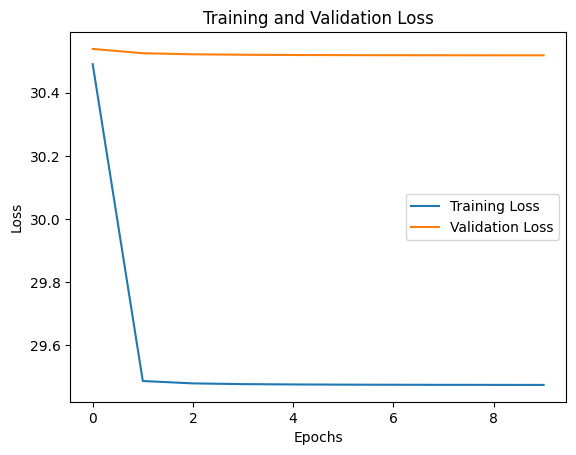

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 30.1898 - mae: 4.9703 - val_loss: 30.5476 - val_mae: 4.9917
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4917 - mae: 4.9054 - val_loss: 30.5284 - val_mae: 4.9899
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4820 - mae: 4.9045 - val_loss: 30.5235 - val_mae: 4.9895
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4786 - mae: 4.9041 - val_loss: 30.5216 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4772 - mae: 4.9040 - val_loss: 30.5205 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4763 - mae: 4.9039 - val_loss: 30.5199 - v

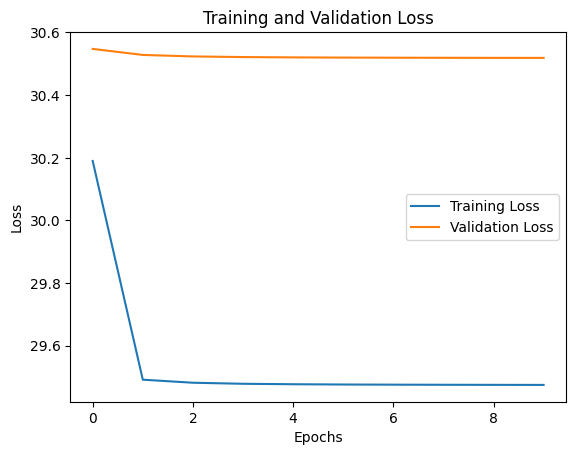

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 30.1227 - mse: 30.1227 - val_loss: 30.5437 - val_mse: 30.5437
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4897 - mse: 29.4897 - val_loss: 30.5271 - val_mse: 30.5271
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4810 - mse: 29.4810 - val_loss: 30.5229 - val_mse: 30.5229
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4781 - mse: 29.4781 - val_loss: 30.5211 - val_mse: 30.5211
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4768 - mse: 29.4768 - val_loss: 30.5202 - val_mse: 30.5202
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4760 - mse: 29.4760 - val_loss: 3

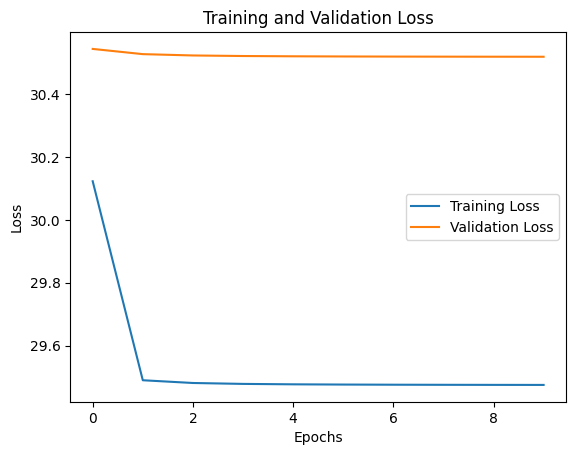

122/122 [==============================] - 0s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 31.1783 - mae: 5.0642 - val_loss: 31.0243 - val_mae: 5.0357
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.7868 - mae: 4.9337 - val_loss: 30.7219 - val_mae: 5.0078
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 29.6281 - mae: 4.9184 - val_loss: 30.6387 - val_mae: 5.0001
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5732 - mae: 4.9132 - val_loss: 30.6017 - val_mae: 4.9967
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5460 - mae: 4.9106 - val_loss: 30.5812 - val_mae: 4.9948
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5302 - mae: 4.9091 - val_loss: 30.5683 - val

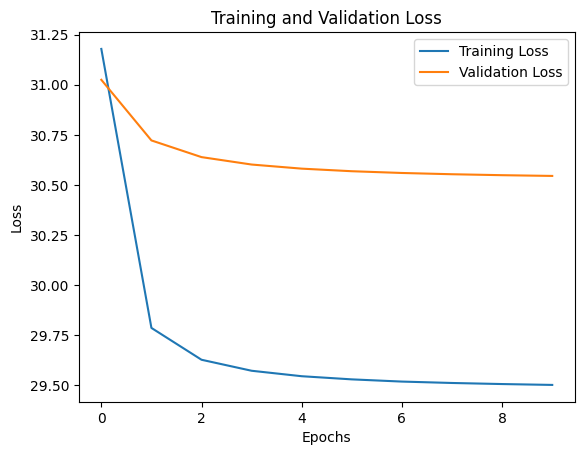

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 31.1712 - mse: 31.1712 - val_loss: 31.0270 - val_mse: 31.0270
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 29.7897 - mse: 29.7897 - val_loss: 30.7231 - val_mse: 30.7231
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 29.6294 - mse: 29.6294 - val_loss: 30.6393 - val_mse: 30.6393
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 29.5739 - mse: 29.5739 - val_loss: 30.6021 - val_mse: 30.6021
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 29.5467 - mse: 29.5467 - val_loss: 30.5814 - val_mse: 30.5814
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.5305 - mse: 29.5305 - val_loss: 30

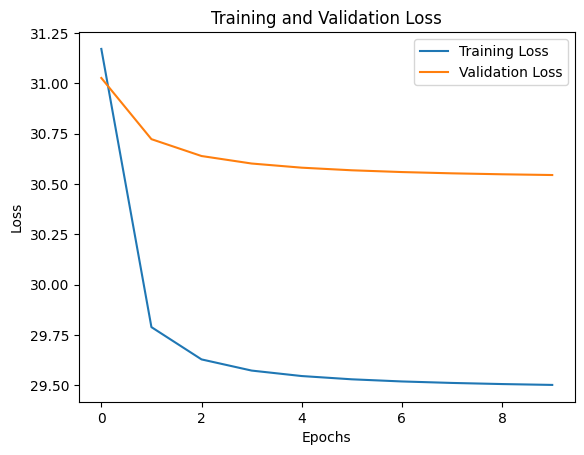

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 29.8986 - mae: 4.9436 - val_loss: 30.5242 - val_mae: 4.9896
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4760 - mae: 4.9039 - val_loss: 30.5185 - val_mae: 4.9890
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4743 - mae: 4.9037 - val_loss: 30.5183 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - 

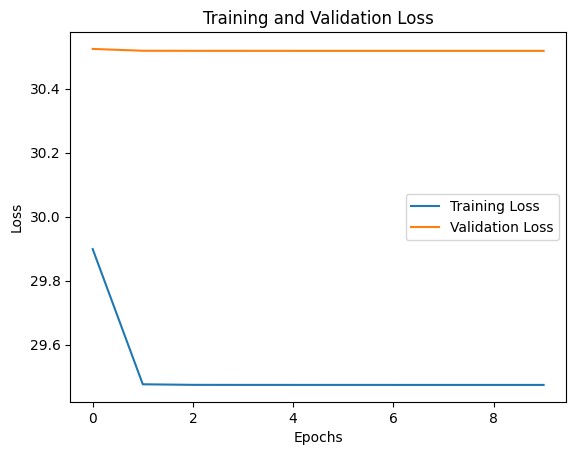

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 29.8683 - mse: 29.8683 - val_loss: 30.5231 - val_mse: 30.5231
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4757 - mse: 29.4757 - val_loss: 30.5185 - val_mse: 30.5185
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4743 - mse: 29.4743 - val_loss: 30.5183 - val_mse: 30.5183
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4741 - mse: 29.4741 - val_loss:

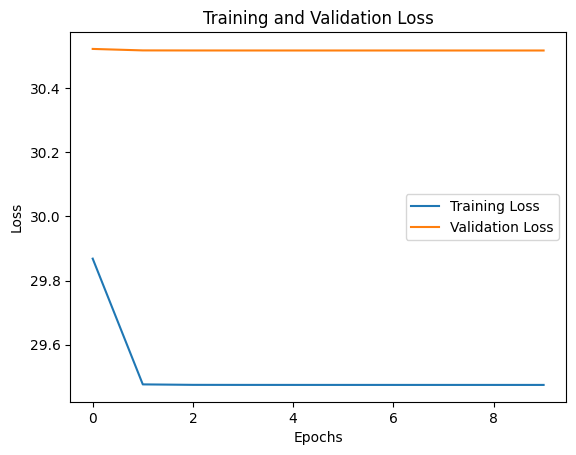

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 33.7404 - mae: 5.2985 - val_loss: 34.2023 - val_mae: 5.3213
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 32.6145 - mae: 5.1974 - val_loss: 33.2613 - val_mae: 5.2385
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 31.8373 - mae: 5.1263 - val_loss: 32.6184 - val_mae: 5.1811
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 31.3071 - mae: 5.0774 - val_loss: 32.1740 - val_mae: 5.1410
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 30.9385 - mae: 5.0428 - val_loss: 31.8593 - val_mae: 5.1124
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 30.6755 - mae: 5.0180 - val_loss: 31.6302 - 

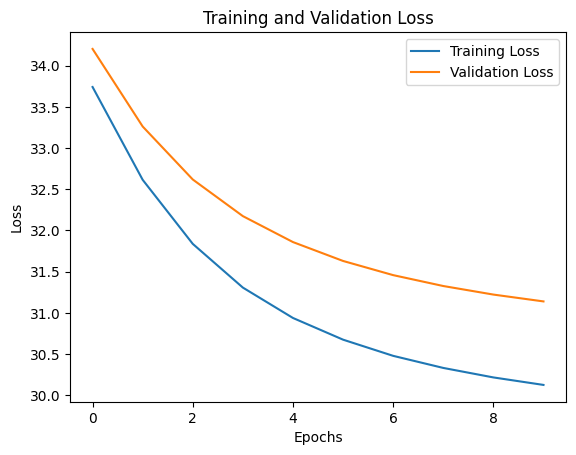

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 33.8306 - mse: 33.8306 - val_loss: 34.2912 - val_mse: 34.2912
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 32.7003 - mse: 32.7003 - val_loss: 33.3451 - val_mse: 33.3451
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 31.9161 - mse: 31.9161 - val_loss: 32.6910 - val_mse: 32.6910
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 31.3765 - mse: 31.3765 - val_loss: 32.2347 - val_mse: 32.2347
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 30.9895 - mse: 30.9895 - val_loss: 31.9101 - val_mse: 31.9101
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 30.7223 - mse: 30.7223 - val_loss:

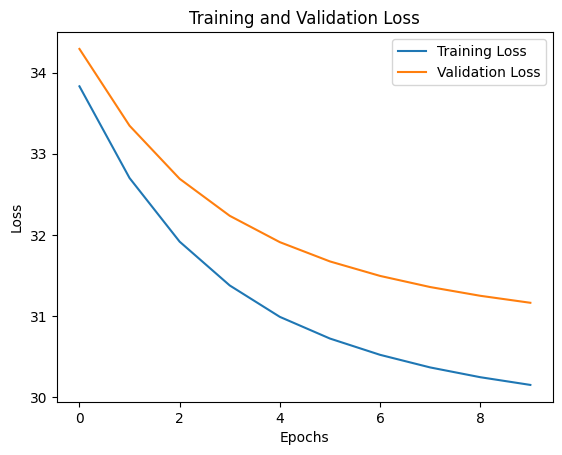

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 34.5304 - mae: 5.3689 - val_loss: 35.6211 - val_mae: 5.4439
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 34.4878 - mae: 5.3653 - val_loss: 35.5774 - val_mae: 5.4402
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 34.4434 - mae: 5.3614 - val_loss: 35.5306 - val_mae: 5.4362
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 34.3944 - mae: 5.3571 - val_loss: 35.4811 - val_mae: 5.4320
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 34.3444 - mae: 5.3527 - val_loss: 35.4292 - val_mae: 5.4276
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 34.2916 - mae: 5.3481 - val_loss: 35.3751 

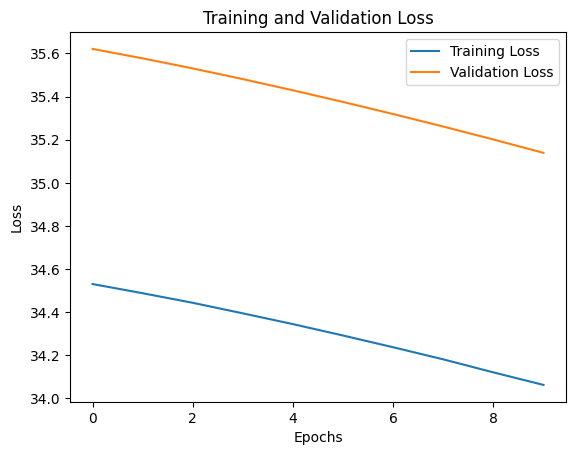

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 11ms/step - loss: 34.5416 - mse: 34.5416 - val_loss: 35.6307 - val_mse: 35.6307
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 34.5027 - mse: 34.5027 - val_loss: 35.5906 - val_mse: 35.5906
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 34.4623 - mse: 34.4623 - val_loss: 35.5482 - val_mse: 35.5482
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 34.4183 - mse: 34.4183 - val_loss: 35.5035 - val_mse: 35.5035
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 34.3723 - mse: 34.3723 - val_loss: 35.4567 - val_mse: 35.4567
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 34.3249 - mse: 34.3249 - val_los

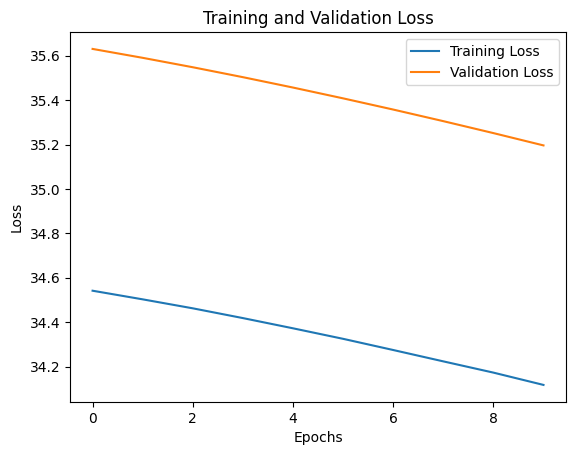

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 30.3797 - mae: 4.9878 - val_loss: 30.6037 - val_mae: 4.9968
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 29.5265 - mae: 4.9087 - val_loss: 30.5507 - val_mae: 4.9920
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 29.4989 - mae: 4.9061 - val_loss: 30.5368 - val_mae: 4.9907
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 29.4895 - mae: 4.9052 - val_loss: 30.5305 - val_mae: 4.9901
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4850 - mae: 4.9047 - val_loss: 30.5270 - val_mae: 4.9898
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4821 - mae: 4.9045 - val_loss: 30.5248

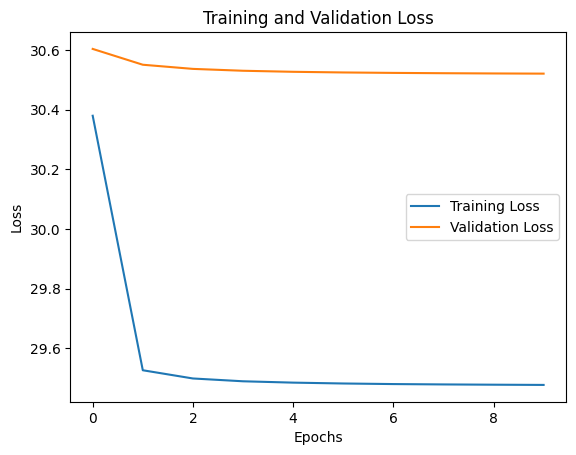

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 30.4432 - mse: 30.4432 - val_loss: 30.6125 - val_mse: 30.6125
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 29.5308 - mse: 29.5308 - val_loss: 30.5540 - val_mse: 30.5540
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 29.5014 - mse: 29.5014 - val_loss: 30.5385 - val_mse: 30.5385
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4910 - mse: 29.4910 - val_loss: 30.5317 - val_mse: 30.5317
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 29.4860 - mse: 29.4860 - val_loss: 30.5279 - val_mse: 30.5279
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4828 - mse: 29.4828 - val_l

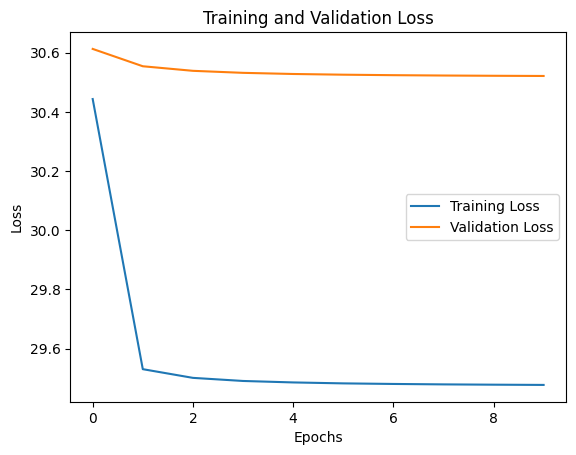

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 30.2583 - mae: 4.9775 - val_loss: 30.5489 - val_mae: 4.9918
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4924 - mae: 4.9055 - val_loss: 30.5286 - val_mae: 4.9900
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4821 - mae: 4.9045 - val_loss: 30.5236 - val_mae: 4.9895
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 29.4788 - mae: 4.9042 - val_loss: 30.5216 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 29.4771 - mae: 4.9040 - val_loss: 30.5205 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 2s 13ms/step - loss: 29.4763 - mae: 4.9039 - val_loss: 30.5199 

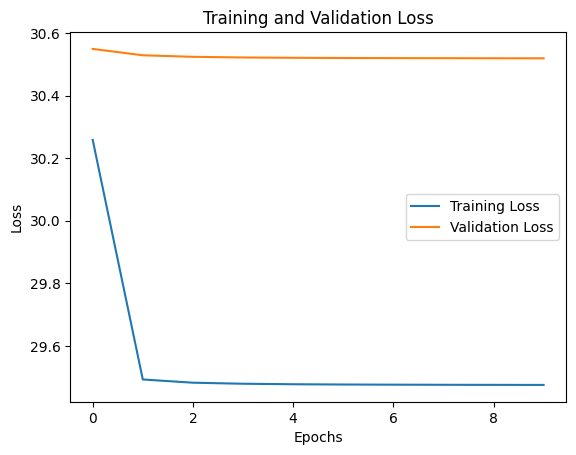

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 30.2142 - mse: 30.2142 - val_loss: 30.5474 - val_mse: 30.5474
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4913 - mse: 29.4913 - val_loss: 30.5281 - val_mse: 30.5281
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4816 - mse: 29.4816 - val_loss: 30.5234 - val_mse: 30.5234
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 29.4785 - mse: 29.4785 - val_loss: 30.5214 - val_mse: 30.5214
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4770 - mse: 29.4770 - val_loss: 30.5204 - val_mse: 30.5204
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 29.4762 - mse: 29.4762 - val_loss: 

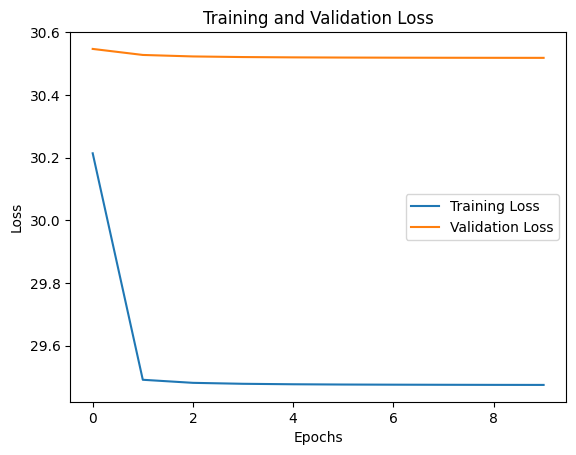

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 2.6571 - mae: 2.6571 - val_loss: 1.9239 - val_mae: 1.9239
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8051 - mae: 1.8051 - val_loss: 1.7528 - val_mae: 1.7528
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7205 - mae: 1.7205 - val_loss: 1.6768 - val_mae: 1.6768
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6660 - mae: 1.6660 - val_loss: 1.6323 - val_mae: 1.6323
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6308 - mae: 1.6308 - val_loss: 1.5968 - val_mae: 1.5968
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6080 - mae: 1.6080 - val_loss: 1.5721 - val_mae: 1.5721


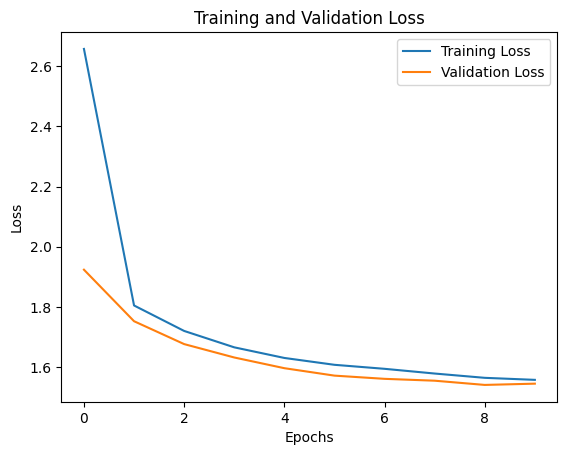

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5296601295267743
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 2.6455 - mse: 11.3662 - val_loss: 1.9373 - val_mse: 6.0272
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.8161 - mse: 5.4326 - val_loss: 1.7586 - val_mse: 5.2963
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7257 - mse: 5.0284 - val_loss: 1.7145 - val_mse: 4.9532
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6735 - mse: 4.7638 - val_loss: 1.6421 - val_mse: 4.6577
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6363 - mse: 4.5538 - val_loss: 1.6050 - val_mse: 4.4575
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6121 - mse: 4.4091 - val_loss: 1.6007 - val_mse: 4.3598
E

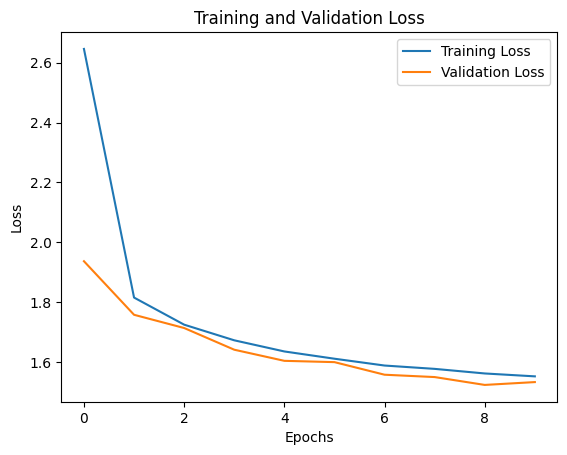

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5260209122956166
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.9810 - mae: 4.9810 - val_loss: 4.1107 - val_mae: 4.1107
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 3.2323 - mae: 3.2323 - val_loss: 2.7249 - val_mae: 2.7249
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 2.3343 - mae: 2.3343 - val_loss: 2.2357 - val_mae: 2.2357
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 2.0817 - mae: 2.0817 - val_loss: 2.1052 - val_mae: 2.1052
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9960 - mae: 1.9960 - val_loss: 2.0297 - val_mae: 2.0297
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.9397 - mae: 1.9397 - val_loss: 1.9673 - val_mae: 1.9673
Epoc

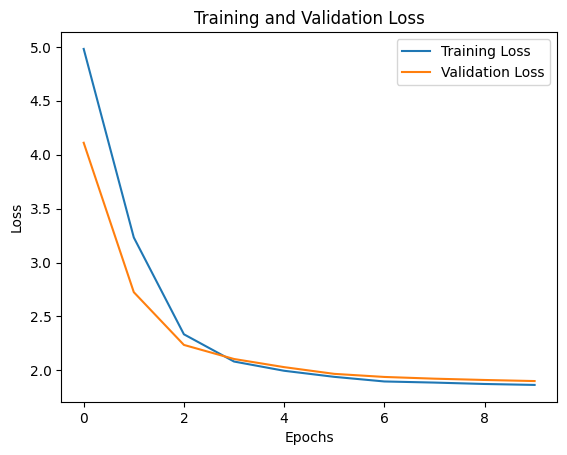

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.17507783852065617
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.9905 - mse: 30.6845 - val_loss: 4.0958 - val_mse: 21.9488
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 3.2266 - mse: 14.6080 - val_loss: 2.7162 - val_mse: 10.4734
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 2.3252 - mse: 7.8551 - val_loss: 2.2293 - val_mse: 7.2167
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 2.0779 - mse: 6.4291 - val_loss: 2.0946 - val_mse: 6.6459
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9858 - mse: 6.1692 - val_loss: 2.0138 - val_mse: 6.4911
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.9380 - mse: 6.1797 - val_loss: 1.9581 - val_mse: 6.4119

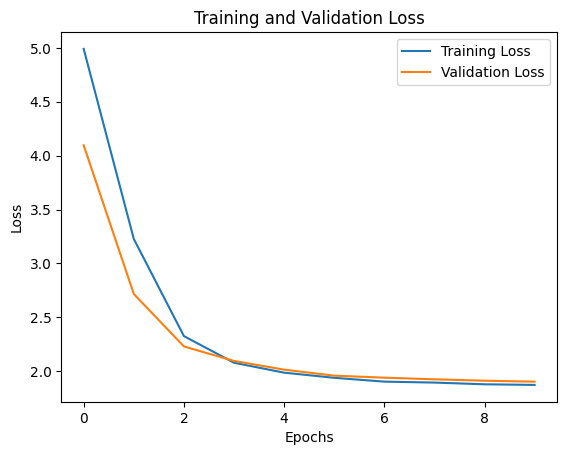

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.1648846083675286
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 2.4342 - mae: 2.4342 - val_loss: 1.8693 - val_mae: 1.8693
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.7686 - mae: 1.7686 - val_loss: 1.6987 - val_mae: 1.6987
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6795 - mae: 1.6795 - val_loss: 1.6450 - val_mae: 1.6450
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6395 - mae: 1.6395 - val_loss: 1.5961 - val_mae: 1.5961
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6108 - mae: 1.6108 - val_loss: 1.5842 - val_mae: 1.5842
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5886 - mae: 1.5886 - val_loss: 1.5631 - val_mae: 1.563

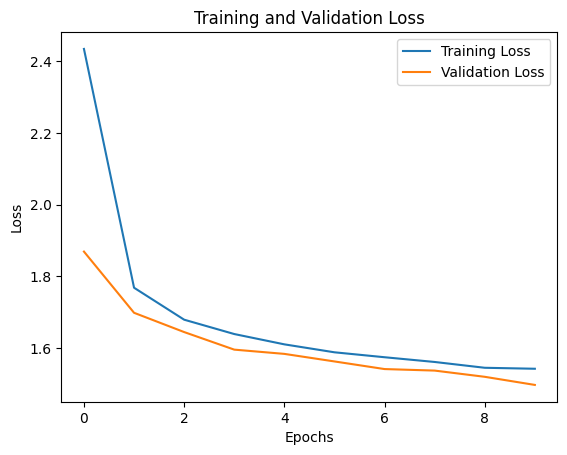

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.54285581165024
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 2.4701 - mse: 10.0158 - val_loss: 1.8641 - val_mse: 5.7737
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7593 - mse: 5.1976 - val_loss: 1.7163 - val_mse: 5.0973
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6836 - mse: 4.8598 - val_loss: 1.6577 - val_mse: 4.8190
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6376 - mse: 4.6164 - val_loss: 1.6051 - val_mse: 4.5021
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6189 - mse: 4.4539 - val_loss: 1.5875 - val_mse: 4.3546
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5952 - mse: 4.3345 - val_loss: 1.5546 - val_mse: 4.1750


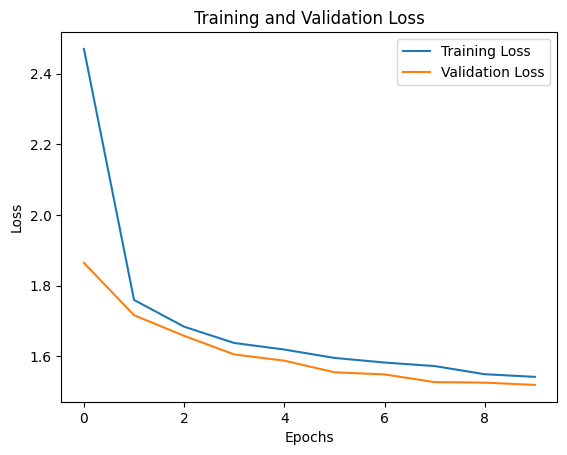

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5340036852367123
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 5.7573 - mae: 5.7573 - val_loss: 5.7342 - val_mae: 5.7342
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 5.5675 - mae: 5.5675 - val_loss: 5.5481 - val_mae: 5.5481
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 5.3764 - mae: 5.3764 - val_loss: 5.3580 - val_mae: 5.3580
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 5.1797 - mae: 5.1797 - val_loss: 5.1617 - val_mae: 5.1617
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9760 - mae: 4.9760 - val_loss: 4.9599 - val_mae: 4.9599
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7685 - mae: 4.7685 - val_loss: 4.7533 - val_mae: 4.7533
E

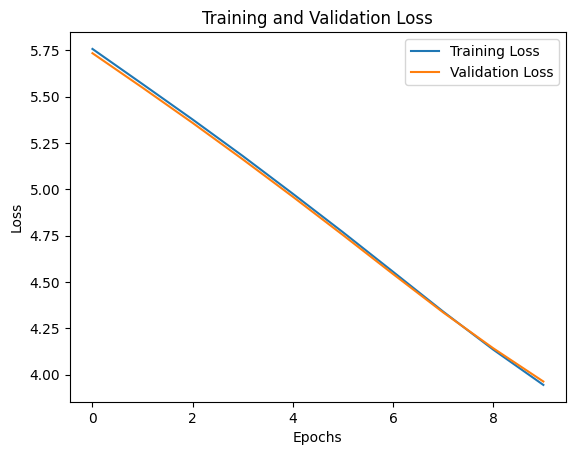

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.017492589740357056
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.7283 - mse: 38.7781 - val_loss: 5.6750 - val_mse: 38.4162
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.4819 - mse: 35.8715 - val_loss: 5.4352 - val_mse: 35.5657
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 5.2368 - mse: 33.1179 - val_loss: 5.1938 - val_mse: 32.8417
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9885 - mse: 30.4822 - val_loss: 4.9498 - val_mse: 30.2361
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.7405 - mse: 27.9863 - val_loss: 4.7047 - val_mse: 27.7656
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.4911 - mse: 25.6054 - val_loss: 4.4623 - va

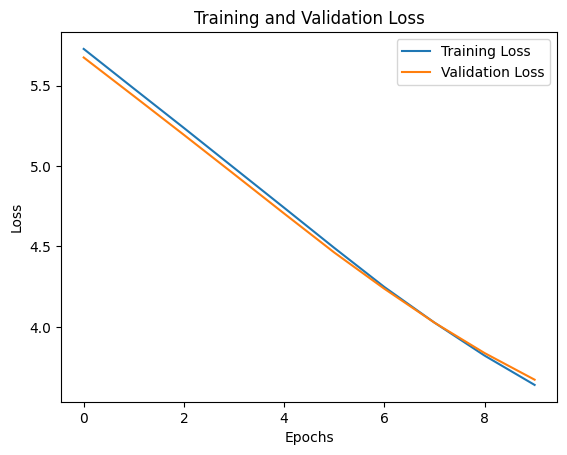

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.029604039362864265
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.8275 - mae: 5.8275 - val_loss: 5.8953 - val_mae: 5.8953
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8187 - mae: 5.8187 - val_loss: 5.8831 - val_mae: 5.8831
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8043 - mae: 5.8043 - val_loss: 5.8649 - val_mae: 5.8649
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7840 - mae: 5.7840 - val_loss: 5.8433 - val_mae: 5.8433
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7615 - mae: 5.7615 - val_loss: 5.8201 - val_mae: 5.8201
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7379 - mae: 5.7379 - val_loss: 5.7960 - val_mae: 5.

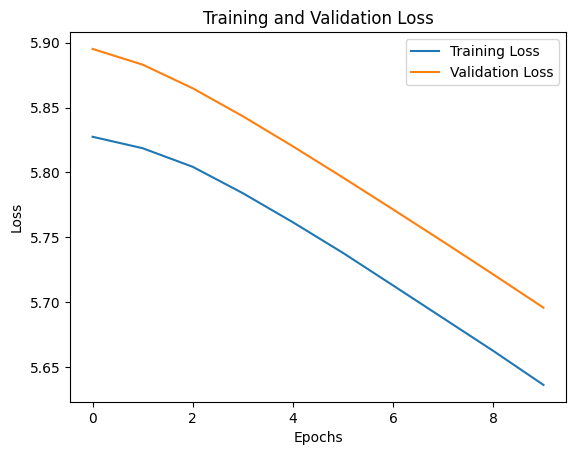

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 5.8241 - mse: 39.9587 - val_loss: 5.8915 - val_mse: 41.1262
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8180 - mse: 39.8765 - val_loss: 5.8845 - val_mse: 41.0248
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.8097 - mse: 39.7647 - val_loss: 5.8751 - val_mse: 40.8930
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7992 - mse: 39.6227 - val_loss: 5.8637 - val_mse: 40.7371
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.7862 - mse: 39.4568 - val_loss: 5.8489 - val_mse: 40.5389
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.7684 - mse: 39.2279 - val_loss: 5.8283

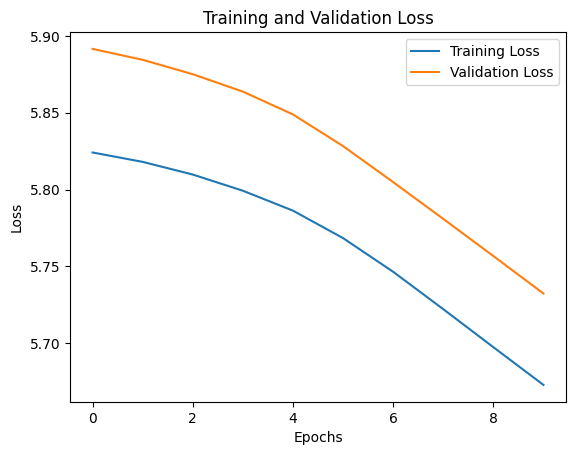

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 3.0616 - mae: 3.0616 - val_loss: 2.0742 - val_mae: 2.0742
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.9399 - mae: 1.9399 - val_loss: 1.9235 - val_mae: 1.9235
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8538 - mae: 1.8538 - val_loss: 1.8518 - val_mae: 1.8518
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7987 - mae: 1.7987 - val_loss: 1.7859 - val_mae: 1.7859
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7539 - mae: 1.7539 - val_loss: 1.7407 - val_mae: 1.7407
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.7175 - mae: 1.7175 - val_loss: 1.7086 - val_mae: 1.708

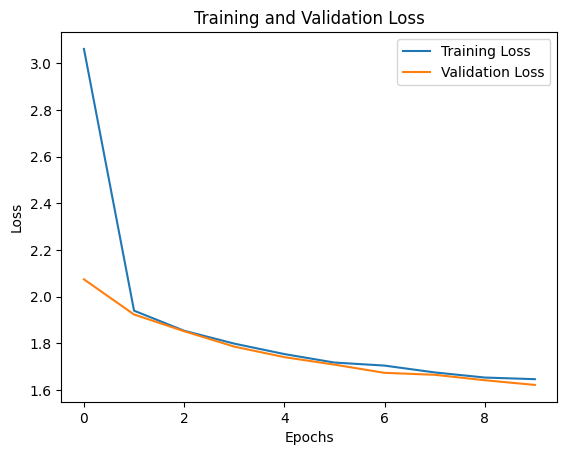

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.44491791452164053
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 2.9841 - mse: 13.6570 - val_loss: 2.0491 - val_mse: 6.7048
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.9303 - mse: 6.0403 - val_loss: 1.9212 - val_mse: 5.9557
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8528 - mse: 5.6580 - val_loss: 1.8407 - val_mse: 5.6641
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7852 - mse: 5.3494 - val_loss: 1.7801 - val_mse: 5.4088
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.7531 - mse: 5.1667 - val_loss: 1.7360 - val_mse: 5.1670
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.7071 - mse: 4.9335 - val_loss: 1.7035 - val_mse: 4.9

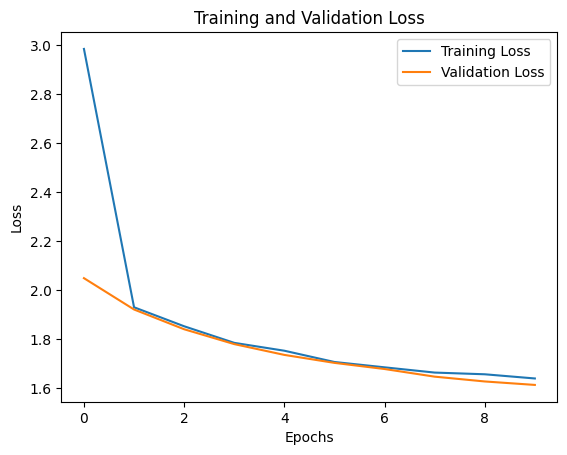

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4539009737251619
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.7011 - mae: 2.7011 - val_loss: 1.9321 - val_mae: 1.9321
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8102 - mae: 1.8102 - val_loss: 1.7597 - val_mae: 1.7597
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7144 - mae: 1.7144 - val_loss: 1.6690 - val_mae: 1.6690
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6606 - mae: 1.6606 - val_loss: 1.6388 - val_mae: 1.6388
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6233 - mae: 1.6233 - val_loss: 1.6016 - val_mae: 1.6016
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5993 - mae: 1.5993 - val_loss: 1.5686 - val_mae: 1.5686
E

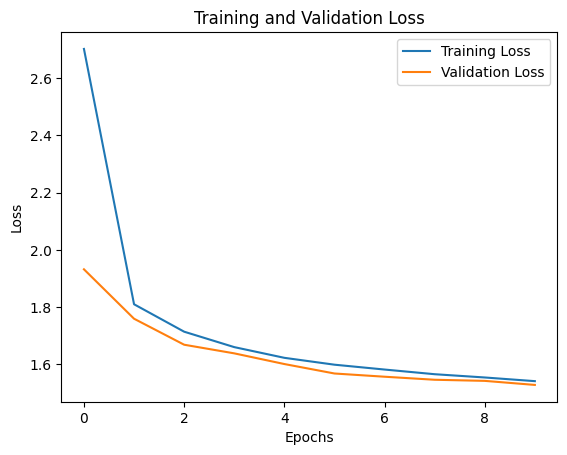

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5387958911904513
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.7263 - mse: 11.9850 - val_loss: 1.9196 - val_mse: 6.0252
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.8198 - mse: 5.4988 - val_loss: 1.7657 - val_mse: 5.3381
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7210 - mse: 4.9930 - val_loss: 1.7111 - val_mse: 4.9899
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6743 - mse: 4.7592 - val_loss: 1.6389 - val_mse: 4.6267
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6425 - mse: 4.5637 - val_loss: 1.6097 - val_mse: 4.4324
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6083 - mse: 4.3719 - val_loss: 1.5724 - val_mse: 4.2767


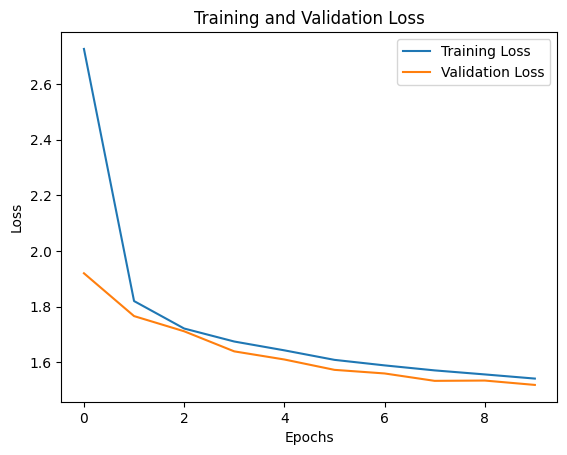

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5379711696186276
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.6918 - mae: 2.6918 - val_loss: 1.9414 - val_mae: 1.9414
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8217 - mae: 1.8217 - val_loss: 1.7619 - val_mae: 1.7619
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7237 - mae: 1.7237 - val_loss: 1.6931 - val_mae: 1.6931
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6759 - mae: 1.6759 - val_loss: 1.6447 - val_mae: 1.6447
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6332 - mae: 1.6332 - val_loss: 1.6180 - val_mae: 1.6180
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6107 - mae: 1.6107 - val_loss: 1.5893 - val_mae: 1.5893
E

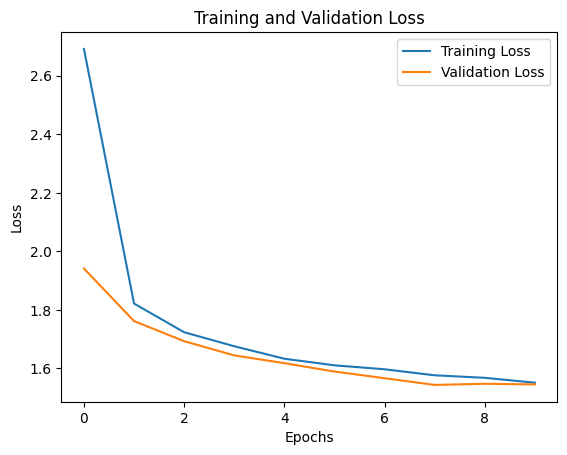

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5302516130693173
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 13ms/step - loss: 2.6847 - mse: 11.6581 - val_loss: 1.9232 - val_mse: 5.9707
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8149 - mse: 5.4882 - val_loss: 1.7684 - val_mse: 5.3549
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7156 - mse: 4.9903 - val_loss: 1.6780 - val_mse: 4.8772
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6652 - mse: 4.7123 - val_loss: 1.6277 - val_mse: 4.5839
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6381 - mse: 4.5414 - val_loss: 1.6073 - val_mse: 4.4078
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6124 - mse: 4.4066 - val_loss: 1.5853 - val_mse: 4.275

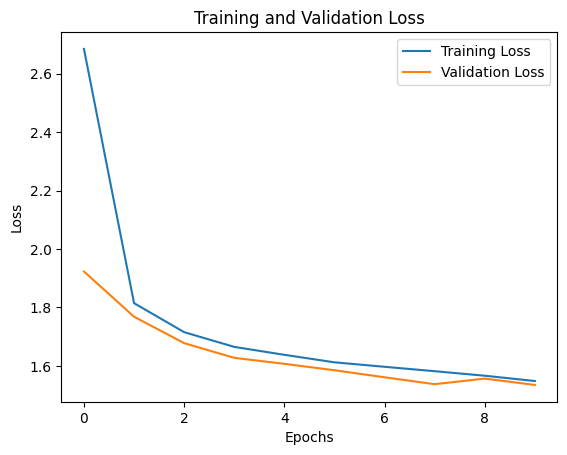

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.523603756924206
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 4.9288 - mae: 4.9288 - val_loss: 4.0601 - val_mae: 4.0601
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 3.1964 - mae: 3.1964 - val_loss: 2.6959 - val_mae: 2.6959
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2.3048 - mae: 2.3048 - val_loss: 2.2235 - val_mae: 2.2235
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 2.0720 - mae: 2.0720 - val_loss: 2.0919 - val_mae: 2.0919
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9904 - mae: 1.9904 - val_loss: 2.0148 - val_mae: 2.0148
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9329 - mae: 1.9329 - val_loss: 1.9678 - val_mae: 1.9678
Epo

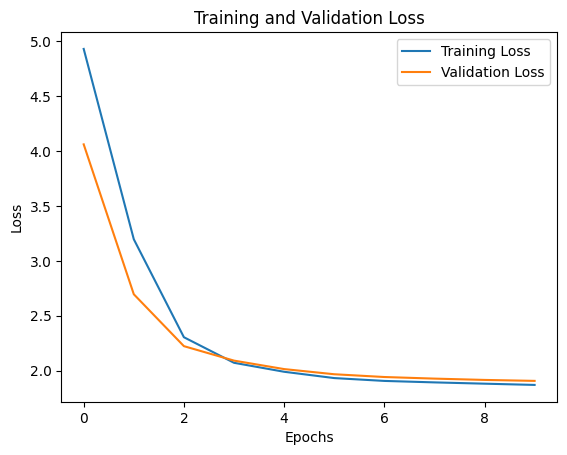

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.1662793971016806
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 4.9377 - mse: 30.2084 - val_loss: 4.0467 - val_mse: 21.5009
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 3.1842 - mse: 14.2346 - val_loss: 2.6815 - val_mse: 10.1971
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2.2901 - mse: 7.6203 - val_loss: 2.2137 - val_mse: 7.1080
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 2.0687 - mse: 6.3617 - val_loss: 2.0805 - val_mse: 6.5750
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9745 - mse: 6.1498 - val_loss: 2.0003 - val_mse: 6.4579
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9216 - mse: 6.1443 - val_loss: 1.9539 - val_mse: 6.395

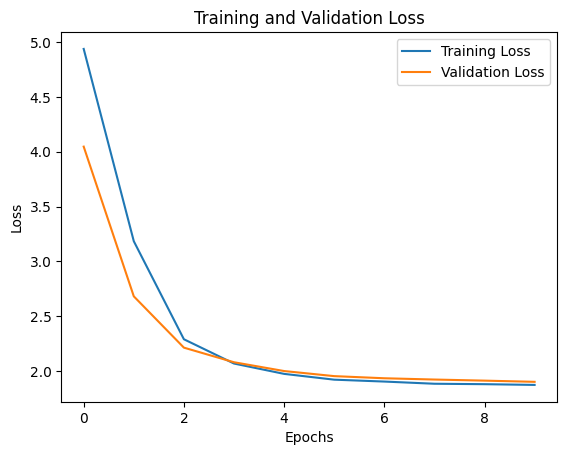

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.16462095824748224
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 2.4537 - mae: 2.4537 - val_loss: 1.8848 - val_mae: 1.8848
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7720 - mae: 1.7720 - val_loss: 1.6973 - val_mae: 1.6973
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6828 - mae: 1.6828 - val_loss: 1.6369 - val_mae: 1.6369
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6399 - mae: 1.6399 - val_loss: 1.6322 - val_mae: 1.6322
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6208 - mae: 1.6208 - val_loss: 1.6152 - val_mae: 1.6152
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6008 - mae: 1.6008 - val_loss: 1.5809 - val_mae: 1.58

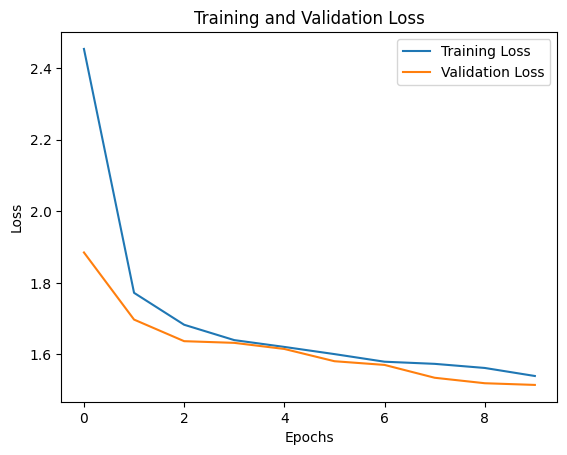

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5397485051941193
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 2.4508 - mse: 9.7047 - val_loss: 1.8859 - val_mse: 5.7941
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 1.7704 - mse: 5.2201 - val_loss: 1.6879 - val_mse: 5.0160
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6826 - mse: 4.8570 - val_loss: 1.6132 - val_mse: 4.6247
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6279 - mse: 4.5234 - val_loss: 1.5882 - val_mse: 4.4837
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6048 - mse: 4.3939 - val_loss: 1.5840 - val_mse: 4.3257
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5857 - mse: 4.2851 - val_loss: 1.5357 - val_mse: 4.164

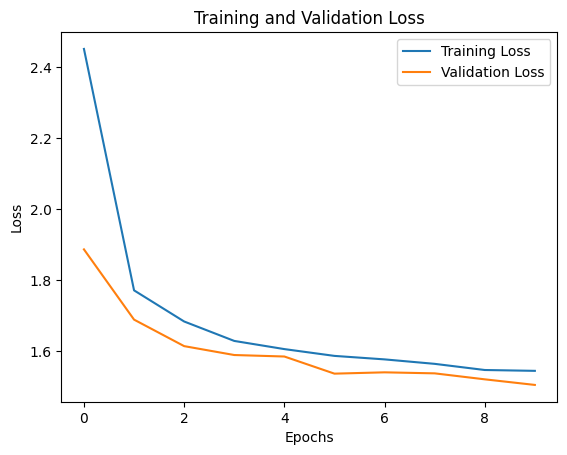

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5231011039523259
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 7s 16ms/step - loss: 5.7110 - mae: 5.7110 - val_loss: 5.6822 - val_mae: 5.6822
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.5122 - mae: 5.5122 - val_loss: 5.4894 - val_mae: 5.4894
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3123 - mae: 5.3123 - val_loss: 5.2914 - val_mae: 5.2914
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1078 - mae: 5.1078 - val_loss: 5.0885 - val_mae: 5.0885
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8991 - mae: 4.8991 - val_loss: 4.8813 - val_mae: 4.8813
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6851 - mae: 4.6851 - val_loss: 4.6701 - val_mae: 

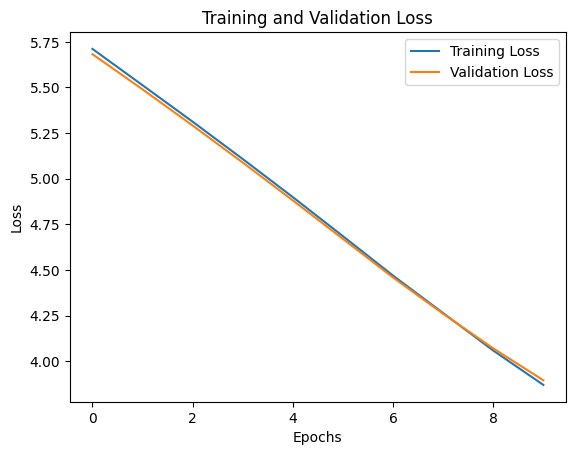

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.01924827336825552
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.7199 - mse: 38.6796 - val_loss: 5.6810 - val_mse: 38.4981
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.5038 - mse: 36.1252 - val_loss: 5.4734 - val_mse: 36.0184
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2925 - mse: 33.7412 - val_loss: 5.2642 - val_mse: 33.6290
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.0749 - mse: 31.3867 - val_loss: 5.0515 - val_mse: 31.3123
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8561 - mse: 29.1476 - val_loss: 4.8357 - val_mse: 29.0760
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6398 - mse: 27.0219 - val_loss: 4.618

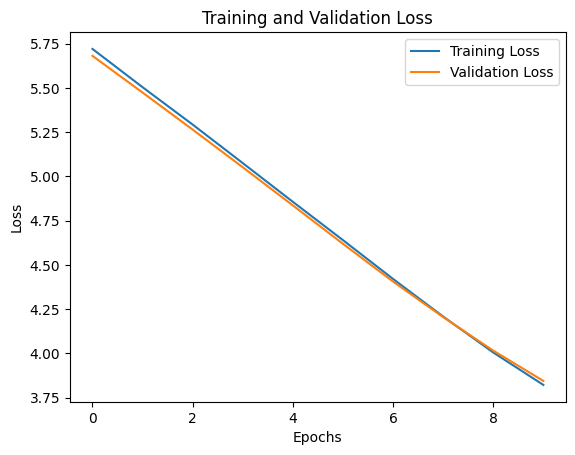

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: -0.02191764858573797
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.8561 - mae: 5.8561 - val_loss: 5.9164 - val_mae: 5.9164
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8414 - mae: 5.8414 - val_loss: 5.9020 - val_mae: 5.9020
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.8268 - mae: 5.8268 - val_loss: 5.8874 - val_mae: 5.8874
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8121 - mae: 5.8121 - val_loss: 5.8725 - val_mae: 5.8725
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7963 - mae: 5.7963 - val_loss: 5.8573 - val_mae: 5.8573
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.7805 - mae: 5.7805 - val_loss: 5.8413 - val_mae: 

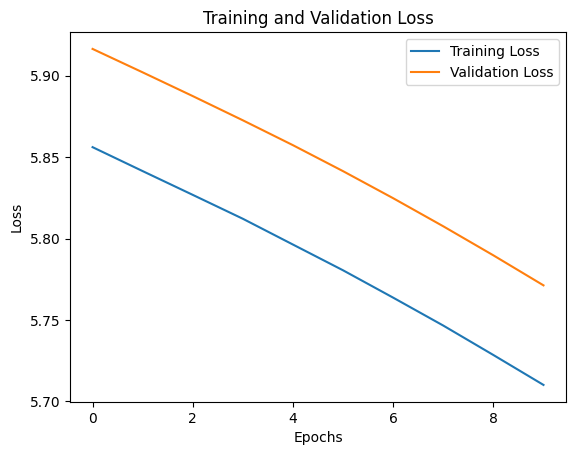

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.8411 - mse: 40.2108 - val_loss: 5.9034 - val_mse: 41.3240
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8277 - mse: 40.0546 - val_loss: 5.8901 - val_mse: 41.1635
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8144 - mse: 39.8951 - val_loss: 5.8763 - val_mse: 40.9938
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.7996 - mse: 39.7170 - val_loss: 5.8622 - val_mse: 40.8175
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.7854 - mse: 39.5441 - val_loss: 5.8476 - val_mse: 40.6330
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 5.7699 - mse: 39.3559 - val_loss: 5.832

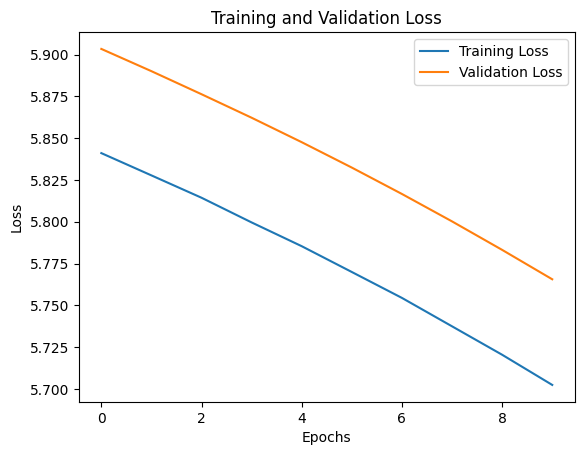

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 3.0714 - mae: 3.0714 - val_loss: 2.0797 - val_mae: 2.0797
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.9446 - mae: 1.9446 - val_loss: 1.9248 - val_mae: 1.9248
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.8515 - mae: 1.8515 - val_loss: 1.8465 - val_mae: 1.8465
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7921 - mae: 1.7921 - val_loss: 1.7859 - val_mae: 1.7859
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7502 - mae: 1.7502 - val_loss: 1.7392 - val_mae: 1.7392
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.7171 - mae: 1.7171 - val_loss: 1.7107 - val_mae: 1

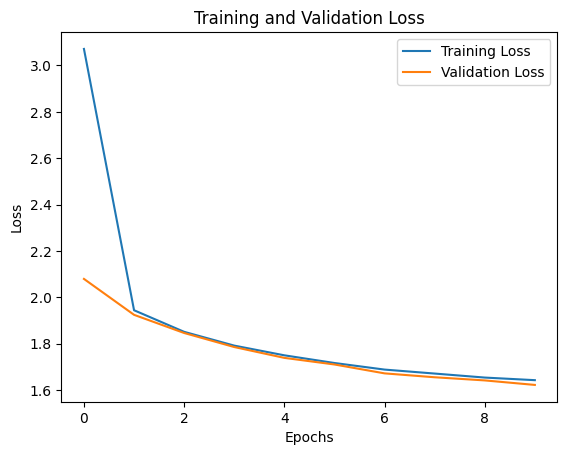

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.44908359600313374
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 3.0919 - mse: 14.4870 - val_loss: 2.0838 - val_mse: 6.7040
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.9427 - mse: 6.0739 - val_loss: 1.9229 - val_mse: 5.9746
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.8581 - mse: 5.6613 - val_loss: 1.8476 - val_mse: 5.6506
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7950 - mse: 5.3885 - val_loss: 1.7916 - val_mse: 5.4305
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7517 - mse: 5.1672 - val_loss: 1.7470 - val_mse: 5.2233
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7239 - mse: 5.0125 - val_loss: 1.7125 - val_mse: 5.

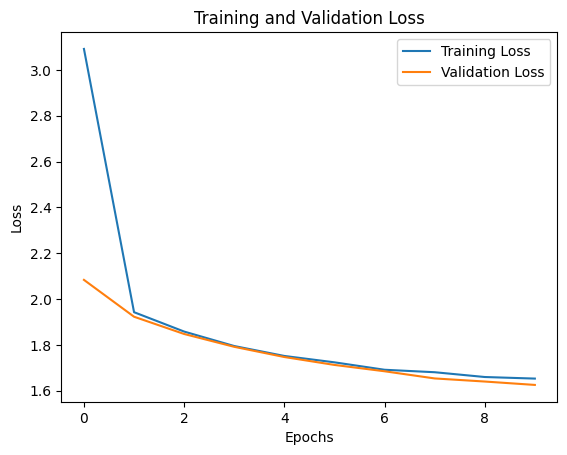

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4475379621938361
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 2.7195 - mae: 2.7195 - val_loss: 1.9219 - val_mae: 1.9219
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.8069 - mae: 1.8069 - val_loss: 1.7701 - val_mae: 1.7701
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 1.7153 - mae: 1.7153 - val_loss: 1.6773 - val_mae: 1.6773
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.6620 - mae: 1.6620 - val_loss: 1.6293 - val_mae: 1.6293
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 1.6289 - mae: 1.6289 - val_loss: 1.5923 - val_mae: 1.5923
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: 1.6075 - mae: 1.6075 - val_loss: 1.5691 - val_mae: 1.

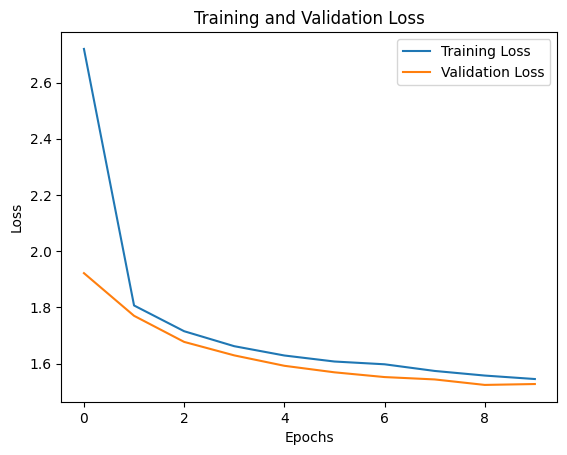

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.54652910333924
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 2.7340 - mse: 12.1733 - val_loss: 1.9337 - val_mse: 6.0388
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 1.8109 - mse: 5.4732 - val_loss: 1.7631 - val_mse: 5.2861
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.7127 - mse: 4.9623 - val_loss: 1.6840 - val_mse: 4.9240
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.6615 - mse: 4.7592 - val_loss: 1.6307 - val_mse: 4.5982
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6326 - mse: 4.5605 - val_loss: 1.5987 - val_mse: 4.4184
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6071 - mse: 4.4328 - val_loss: 1.5768 - val_mse: 4.2

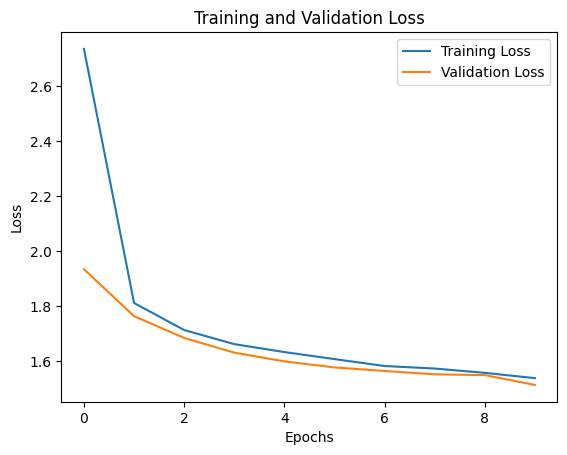

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5438087967486086
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 4.9718 - mae: 4.9718 - val_loss: 4.9903 - val_mae: 4.9903
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9046 - mae: 4.9046 - val_loss: 4.9895 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9041 - mae: 4.9041 - val_loss: 4.9893 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9892 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9891 - val_mae: 4.9891
E

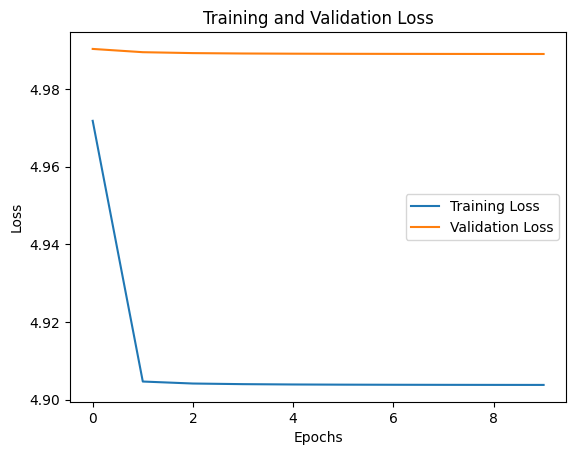

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 4.9693 - mse: 30.2040 - val_loss: 4.9903 - val_mse: 30.5327
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9046 - mse: 29.4839 - val_loss: 4.9895 - val_mse: 30.5236
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9041 - mse: 29.4785 - val_loss: 4.9893 - val_mse: 30.5210
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9040 - mse: 29.4767 - val_loss: 4.9892 - val_mse: 30.5199
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9039 - mse: 29.4757 - val_loss: 4.9891 - val_mse: 30.5193
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mse: 29.4753 - val_loss: 4.9891 - val_

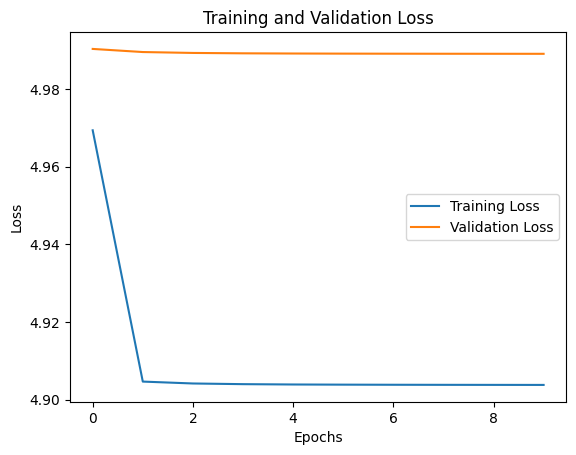

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.2945 - mae: 5.2945 - val_loss: 5.1367 - val_mae: 5.1367
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0026 - mae: 5.0026 - val_loss: 5.0546 - val_mae: 5.0546
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9563 - mae: 4.9563 - val_loss: 5.0296 - val_mae: 5.0296
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9387 - mae: 4.9387 - val_loss: 5.0180 - val_mae: 5.0180
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9298 - mae: 4.9298 - val_loss: 5.0114 - val_mae: 5.0114
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9243 - mae: 4.9243 - val_loss: 5.0071 - val_mae: 5.0071
E

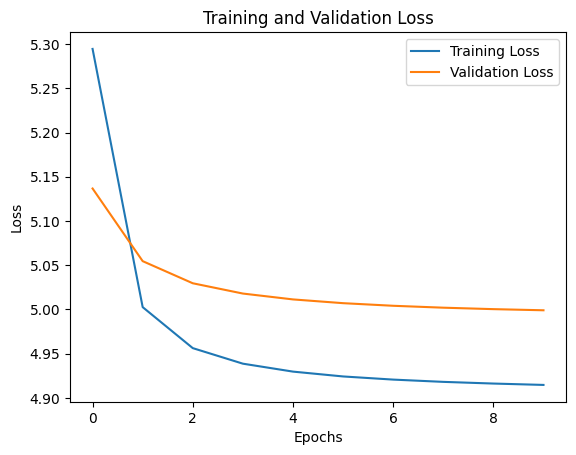

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.2950 - mse: 33.7824 - val_loss: 5.1346 - val_mse: 32.1204
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0017 - mse: 30.5168 - val_loss: 5.0535 - val_mse: 31.2241
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9554 - mse: 30.0231 - val_loss: 5.0290 - val_mse: 30.9553
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9383 - mse: 29.8404 - val_loss: 5.0175 - val_mse: 30.8304
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9295 - mse: 29.7470 - val_loss: 5.0110 - val_mse: 30.7590
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9240 - mse: 29.6896 - val_loss: 5.0068 - val_ms

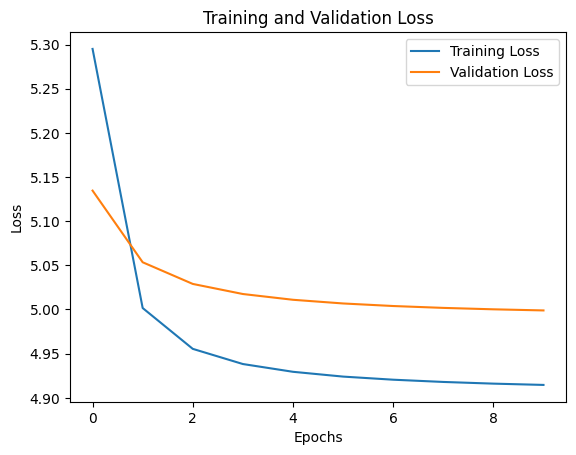

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 4.9521 - mae: 4.9521 - val_loss: 4.9895 - val_mae: 4.9895
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9037 - mae: 4.9037 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9037 - mae: 4.9037 - val_loss: 4.9890 - val_mae: 4.9

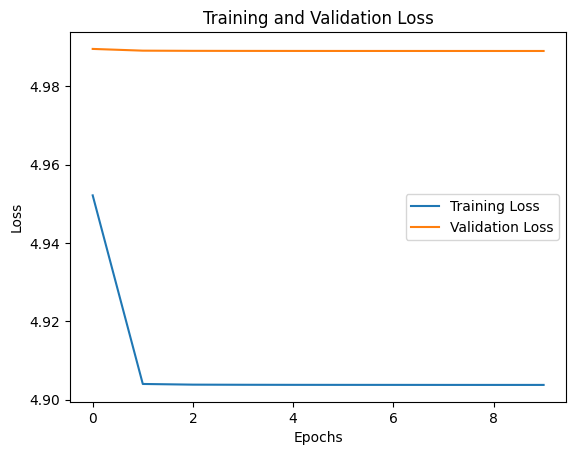

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.9558 - mse: 30.0619 - val_loss: 4.9896 - val_mse: 30.5245
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9040 - mse: 29.4769 - val_loss: 4.9891 - val_mse: 30.5192
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mse: 29.4749 - val_loss: 4.9890 - val_mse: 30.5186
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mse: 29.4746 - val_loss: 4.9890 - val_mse: 30.5185
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9037 - mse: 29.4744 - val_loss: 4.9890 - val_mse: 30.5184
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9037 - mse: 29.4743 - val_loss: 4.9890 - va

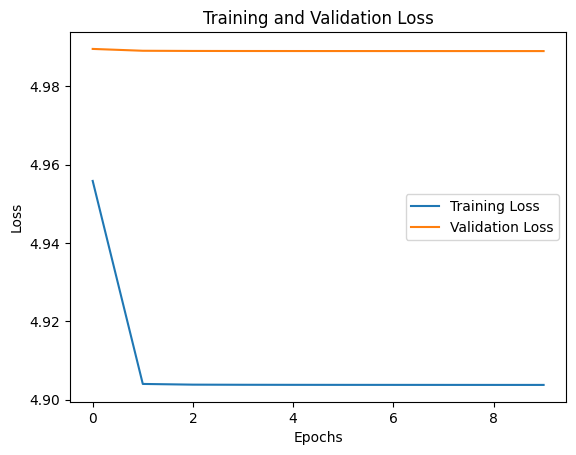

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 5.7087 - mae: 5.7087 - val_loss: 5.6823 - val_mae: 5.6823
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.5292 - mae: 5.5292 - val_loss: 5.5276 - val_mae: 5.5276
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3907 - mae: 5.3907 - val_loss: 5.4108 - val_mae: 5.4108
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2884 - mae: 5.2884 - val_loss: 5.3252 - val_mae: 5.3252
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2134 - mae: 5.2134 - val_loss: 5.2627 - val_mae: 5.2627
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.1583 - mae: 5.1583 - val_loss: 5.2164 - val_mae: 5.21

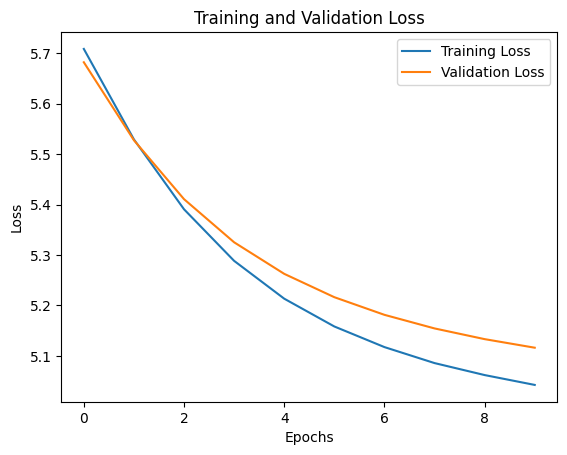

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.7154 - mse: 38.6581 - val_loss: 5.6843 - val_mse: 38.5615
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.5267 - mse: 36.4120 - val_loss: 5.5227 - val_mse: 36.6118
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3830 - mse: 34.7571 - val_loss: 5.4027 - val_mse: 35.1993
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2785 - mse: 33.5790 - val_loss: 5.3161 - val_mse: 34.1970
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2034 - mse: 32.7355 - val_loss: 5.2537 - val_mse: 33.4819
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 5.1491 - mse: 32.1334 - val_loss: 5.2079 - va

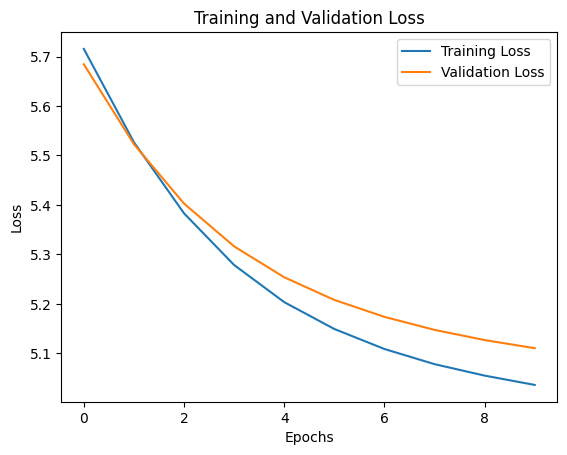

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 5.8717 - mae: 5.8717 - val_loss: 5.9320 - val_mae: 5.9320
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8586 - mae: 5.8586 - val_loss: 5.9180 - val_mae: 5.9180
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.8439 - mae: 5.8439 - val_loss: 5.9037 - val_mae: 5.9037
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.8292 - mae: 5.8292 - val_loss: 5.8889 - val_mae: 5.8889
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8135 - mae: 5.8135 - val_loss: 5.8736 - val_mae: 5.8736
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 5.7978 - mae: 5.7978 - val_loss: 5.8578 - val_mae:

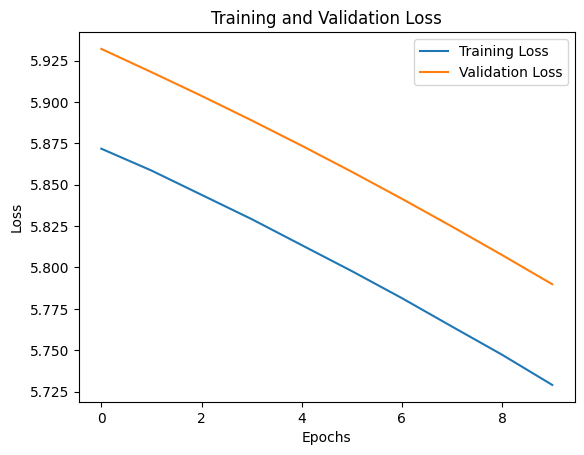

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.8511 - mse: 40.2983 - val_loss: 5.9120 - val_mse: 41.4007
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8390 - mse: 40.1553 - val_loss: 5.8994 - val_mse: 41.2421
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.8252 - mse: 39.9882 - val_loss: 5.8862 - val_mse: 41.0748
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.8117 - mse: 39.8213 - val_loss: 5.8723 - val_mse: 40.8986
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7968 - mse: 39.6404 - val_loss: 5.8578 - val_mse: 40.7146
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.7818 - mse: 39.4554 - val_loss: 5.8427 

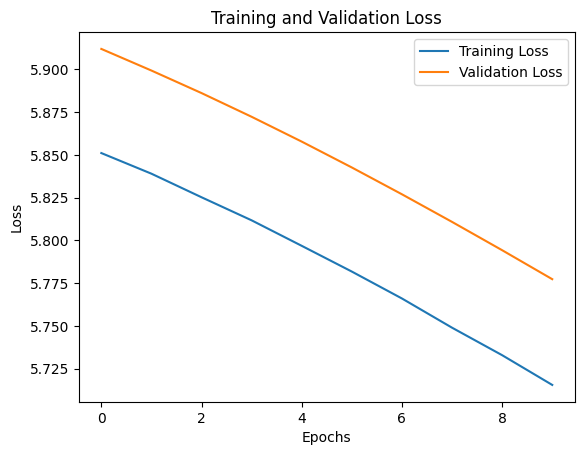

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 14ms/step - loss: 5.0034 - mae: 5.0034 - val_loss: 4.9951 - val_mae: 4.9951
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9079 - mae: 4.9079 - val_loss: 4.9915 - val_mae: 4.9915
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9058 - mae: 4.9058 - val_loss: 4.9905 - val_mae: 4.9905
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9050 - mae: 4.9050 - val_loss: 4.9900 - val_mae: 4.9900
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9046 - mae: 4.9046 - val_loss: 4.9897 - val_mae: 4.9897
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9044 - mae: 4.9044 - val_loss: 4.9895 - val_mae: 4.98

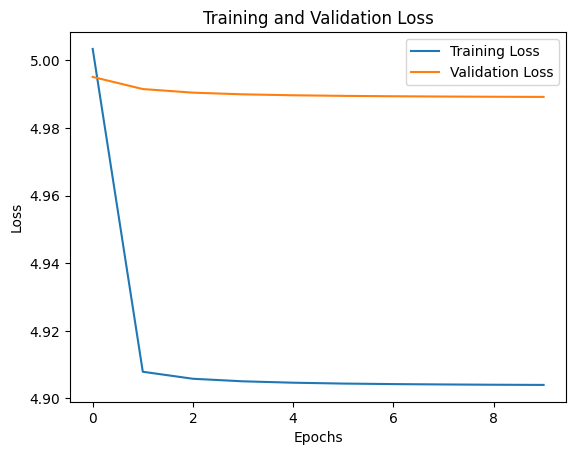

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.9964 - mse: 30.4883 - val_loss: 4.9946 - val_mse: 30.5815
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9075 - mse: 29.5152 - val_loss: 4.9913 - val_mse: 30.5447
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9057 - mse: 29.4953 - val_loss: 4.9904 - val_mse: 30.5335
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9049 - mse: 29.4874 - val_loss: 4.9899 - val_mse: 30.5283
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9046 - mse: 29.4834 - val_loss: 4.9896 - val_mse: 30.5255
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9043 - mse: 29.4809 - val_loss: 4.9895 - va

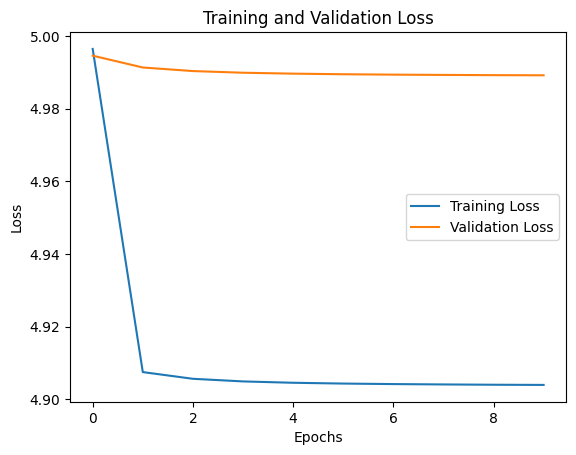

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.9951 - mae: 4.9951 - val_loss: 4.9907 - val_mae: 4.9907
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9048 - mae: 4.9048 - val_loss: 4.9896 - val_mae: 4.9896
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9042 - mae: 4.9042 - val_loss: 4.9893 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9892 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9891 - val_mae: 4.9891

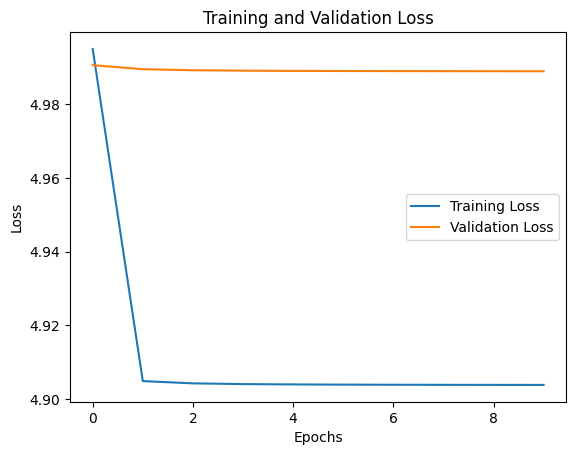

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.9848 - mse: 30.3675 - val_loss: 4.9906 - val_mse: 30.5359
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9047 - mse: 29.4853 - val_loss: 4.9895 - val_mse: 30.5243
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9042 - mse: 29.4789 - val_loss: 4.9893 - val_mse: 30.5213
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 4.9040 - mse: 29.4768 - val_loss: 4.9892 - val_mse: 30.5201
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.9039 - mse: 29.4759 - val_loss: 4.9891 - val_mse: 30.5195
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9038 - mse: 29.4754 - val_loss: 4.9891 -

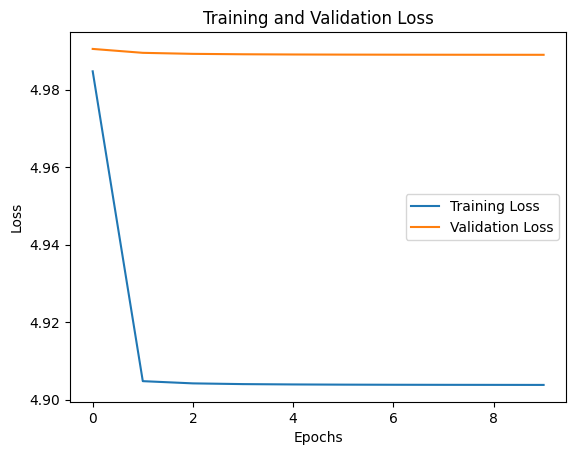

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 4.9641 - mae: 4.9641 - val_loss: 4.9913 - val_mae: 4.9913
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9052 - mae: 4.9052 - val_loss: 4.9898 - val_mae: 4.9898
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9044 - mae: 4.9044 - val_loss: 4.9894 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9041 - mae: 4.9041 - val_loss: 4.9893 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9892 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae: 4.98

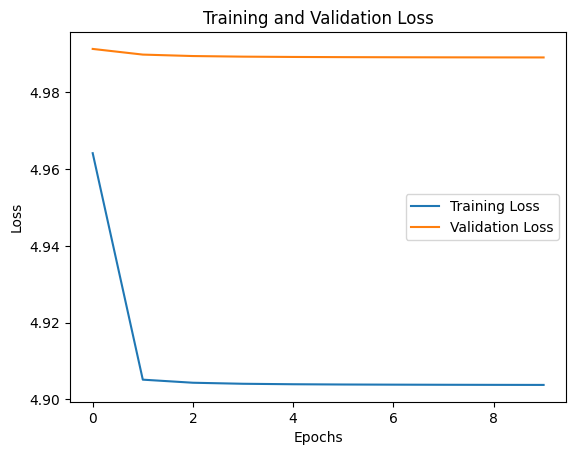

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.9668 - mse: 30.1617 - val_loss: 4.9915 - val_mse: 30.5462
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9053 - mse: 29.4910 - val_loss: 4.9899 - val_mse: 30.5279
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9044 - mse: 29.4815 - val_loss: 4.9895 - val_mse: 30.5233
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9041 - mse: 29.4784 - val_loss: 4.9893 - val_mse: 30.5214
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9040 - mse: 29.4770 - val_loss: 4.9892 - val_mse: 30.5204
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9039 - mse: 29.4761 - val_loss: 4.9891 - v

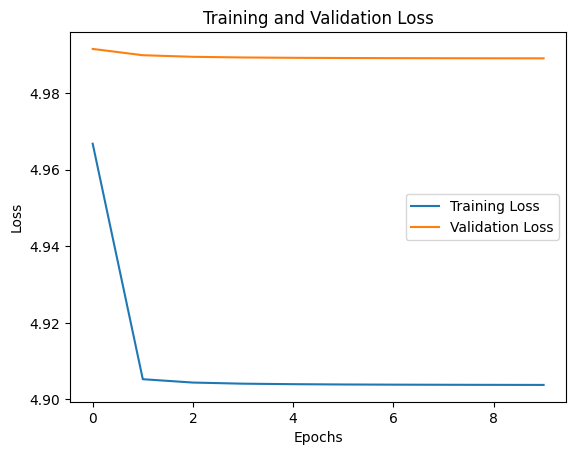

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 5.3087 - mae: 5.3087 - val_loss: 5.3344 - val_mae: 5.3344
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2094 - mae: 5.2094 - val_loss: 5.2469 - val_mae: 5.2469
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 5.1318 - mae: 5.1318 - val_loss: 5.1822 - val_mae: 5.1822
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0762 - mae: 5.0762 - val_loss: 5.1369 - val_mae: 5.1369
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0373 - mae: 5.0373 - val_loss: 5.1053 - val_mae: 5.1053
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 5.0104 - mae: 5.0104 - val_loss: 5.0829 - val_mae: 5.082

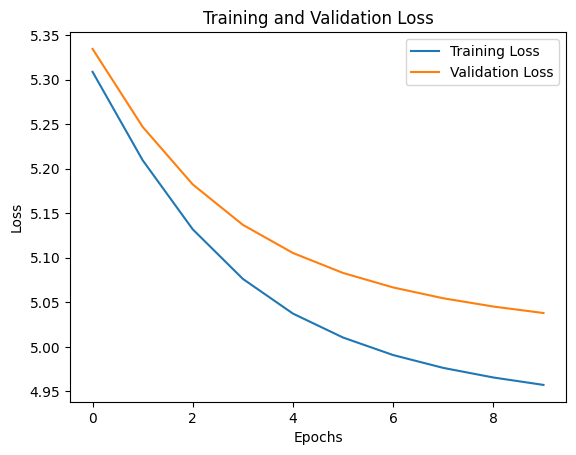

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 5.3123 - mse: 33.9085 - val_loss: 5.3330 - val_mse: 34.3548
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.2051 - mse: 32.7153 - val_loss: 5.2401 - val_mse: 33.2971
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 5.1242 - mse: 31.8303 - val_loss: 5.1739 - val_mse: 32.5545
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0679 - mse: 31.2242 - val_loss: 5.1290 - val_mse: 32.0552
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0301 - mse: 30.8168 - val_loss: 5.0984 - val_mse: 31.7172
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.0040 - mse: 30.5387 - val_loss: 5.0770 - val

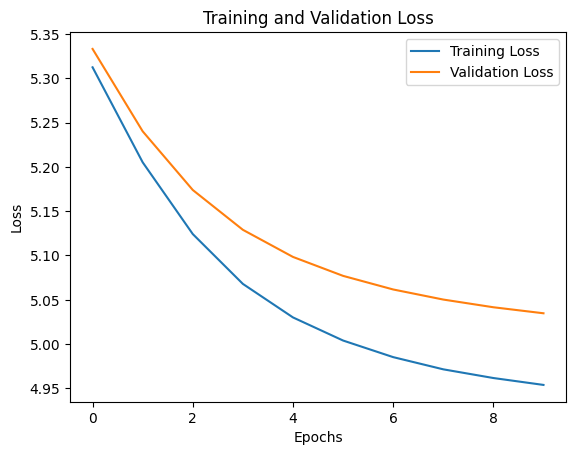

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.9629 - mae: 4.9629 - val_loss: 4.9918 - val_mae: 4.9918
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9049 - mae: 4.9049 - val_loss: 4.9894 - val_mae: 4.9894
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9890 - val_mae: 4

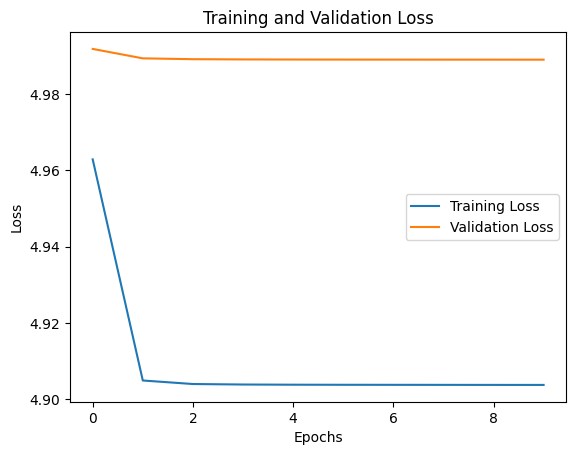

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.9626 - mse: 30.1041 - val_loss: 4.9919 - val_mse: 30.5504
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9049 - mse: 29.4872 - val_loss: 4.9894 - val_mse: 30.5223
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9040 - mse: 29.4770 - val_loss: 4.9891 - val_mse: 30.5198
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9039 - mse: 29.4755 - val_loss: 4.9891 - val_mse: 30.5192
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mse: 29.4751 - val_loss: 4.9891 - val_mse: 30.5189
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9038 - mse: 29.4748 - val_loss: 4.9890 

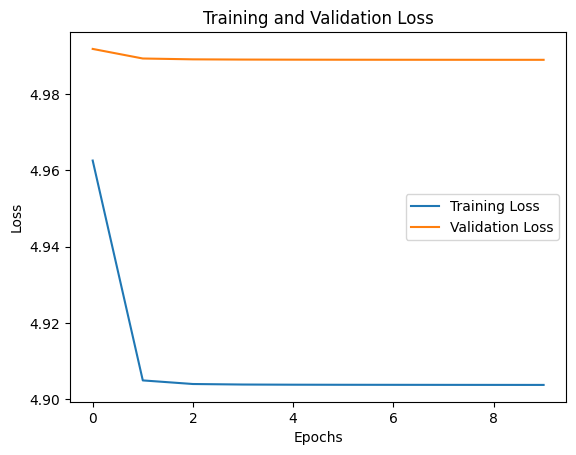

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 5.3650 - mae: 5.3650 - val_loss: 5.4341 - val_mae: 5.4341
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3503 - mae: 5.3503 - val_loss: 5.4204 - val_mae: 5.4204
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3365 - mae: 5.3365 - val_loss: 5.4073 - val_mae: 5.4073
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3234 - mae: 5.3234 - val_loss: 5.3945 - val_mae: 5.3945
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3103 - mae: 5.3103 - val_loss: 5.3818 - val_mae: 5.3818
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2972 - mae: 5.2972 - val_loss: 5.3692 - val_mae: 

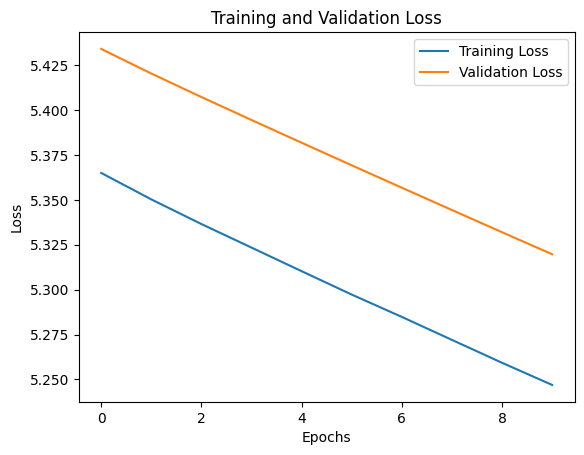

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 5.3632 - mse: 34.4713 - val_loss: 5.4314 - val_mse: 35.4857
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3471 - mse: 34.2903 - val_loss: 5.4165 - val_mse: 35.3124
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3325 - mse: 34.1252 - val_loss: 5.4022 - val_mse: 35.1473
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3181 - mse: 33.9629 - val_loss: 5.3883 - val_mse: 34.9862
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3039 - mse: 33.8063 - val_loss: 5.3745 - val_mse: 34.8280
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2901 - mse: 33.6516 - val_loss: 5.3610 -

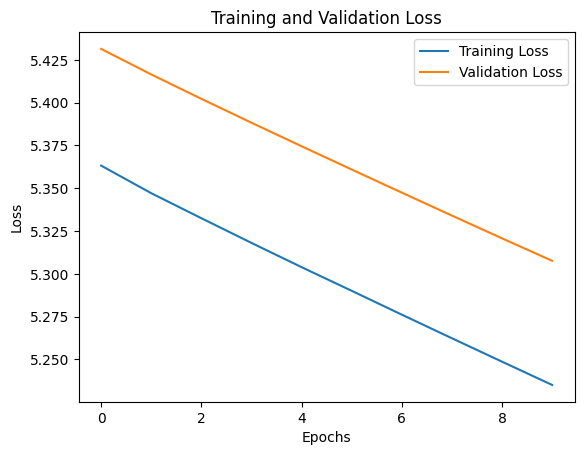

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 16ms/step - loss: 5.3676 - mae: 5.3676 - val_loss: 5.4434 - val_mae: 5.4434
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 5.3657 - mae: 5.3657 - val_loss: 5.4415 - val_mae: 5.4415
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 5.3638 - mae: 5.3638 - val_loss: 5.4396 - val_mae: 5.4396
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3617 - mae: 5.3617 - val_loss: 5.4376 - val_mae: 5.4376
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3596 - mae: 5.3596 - val_loss: 5.4355 - val_mae: 5.4355
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3575 - mae: 5.3575 - val_loss: 5.4333 - val_

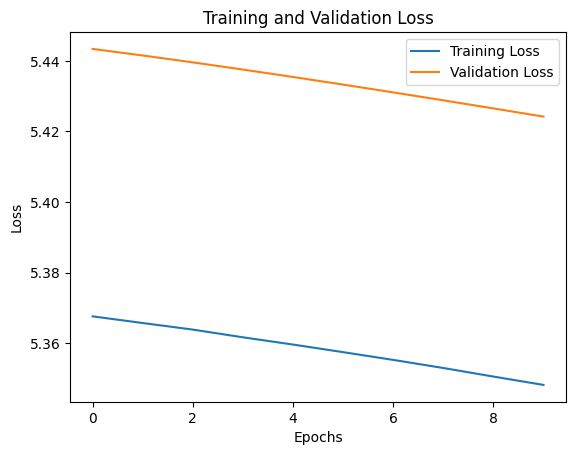

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 18ms/step - loss: 5.3751 - mse: 34.6161 - val_loss: 5.4499 - val_mse: 35.7111
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 5.3725 - mse: 34.5870 - val_loss: 5.4473 - val_mse: 35.6808
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 5.3698 - mse: 34.5561 - val_loss: 5.4446 - val_mse: 35.6487
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 5.3669 - mse: 34.5240 - val_loss: 5.4417 - val_mse: 35.6153
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 5.3639 - mse: 34.4898 - val_loss: 5.4387 - val_mse: 35.5806
Epoch 6/10
128/128 [==============================] - 2s 13ms/step - loss: 5.3608 - mse: 34.4545 - val_loss: 5.

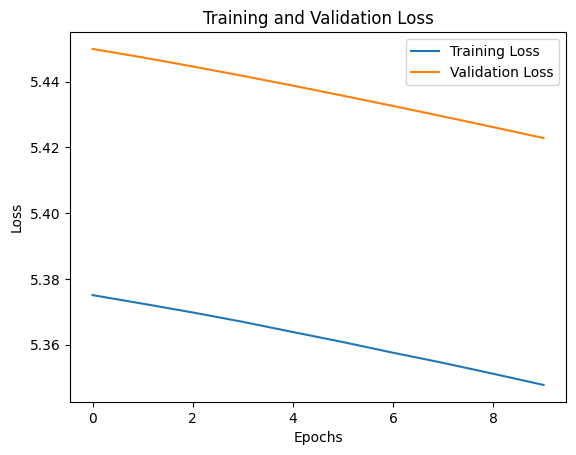

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.0002006702562714624
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.9857 - mae: 4.9857 - val_loss: 4.9960 - val_mae: 4.9960
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.9082 - mae: 4.9082 - val_loss: 4.9917 - val_mae: 4.9917
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.9059 - mae: 4.9059 - val_loss: 4.9906 - val_mae: 4.9906
Epoch 4/10
128/128 [==============================] - 2s 14ms/step - loss: 4.9051 - mae: 4.9051 - val_loss: 4.9900 - val_mae: 4.9900
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9046 - mae: 4.9046 - val_loss: 4.9897 - val_mae: 4.9897
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9044 - mae: 4.9044 - val_loss: 4.9896 - val_ma

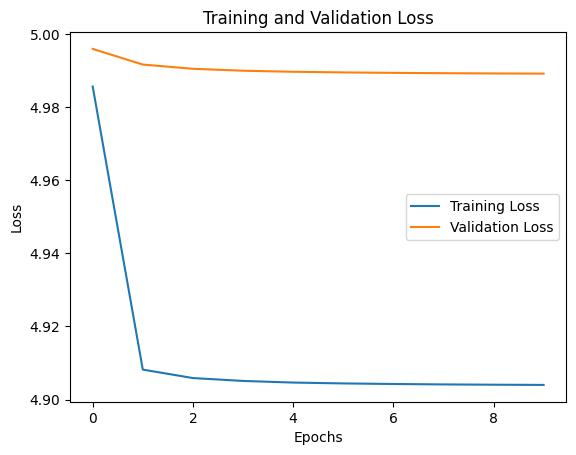

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.9828 - mse: 30.3311 - val_loss: 4.9959 - val_mse: 30.5956
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 4.9081 - mse: 29.5219 - val_loss: 4.9917 - val_mse: 30.5487
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9059 - mse: 29.4980 - val_loss: 4.9906 - val_mse: 30.5356
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9051 - mse: 29.4889 - val_loss: 4.9900 - val_mse: 30.5298
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9047 - mse: 29.4844 - val_loss: 4.9897 - val_mse: 30.5265
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9044 - mse: 29.4816 - val_loss: 4.98

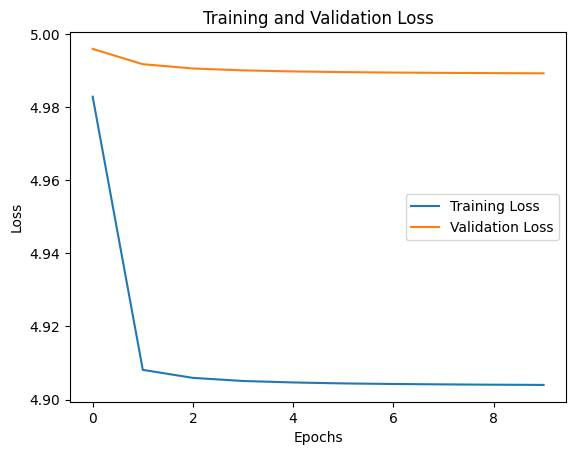

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.9722 - mae: 4.9722 - val_loss: 4.9915 - val_mae: 4.9915
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 4.9053 - mae: 4.9053 - val_loss: 4.9899 - val_mae: 4.9899
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.9044 - mae: 4.9044 - val_loss: 4.9895 - val_mae: 4.9895
Epoch 4/10
128/128 [==============================] - 2s 14ms/step - loss: 4.9041 - mae: 4.9041 - val_loss: 4.9893 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9892 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae

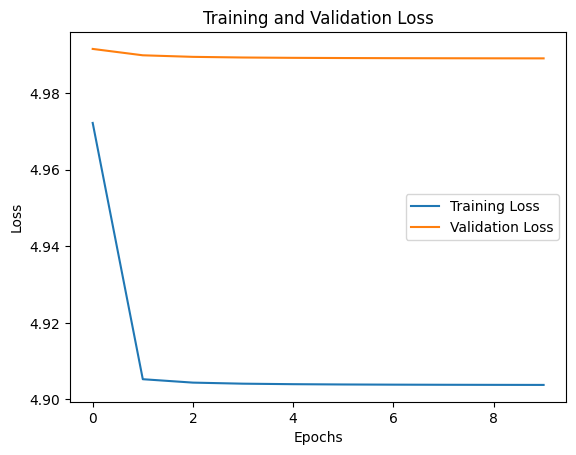

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.9664 - mse: 30.1465 - val_loss: 4.9912 - val_mse: 30.5427
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9051 - mse: 29.4888 - val_loss: 4.9898 - val_mse: 30.5266
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9043 - mse: 29.4806 - val_loss: 4.9894 - val_mse: 30.5226
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9041 - mse: 29.4778 - val_loss: 4.9892 - val_mse: 30.5210
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9040 - mse: 29.4766 - val_loss: 4.9892 - val_mse: 30.5201
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.9039 - mse: 29.4759 - val_loss: 4.989

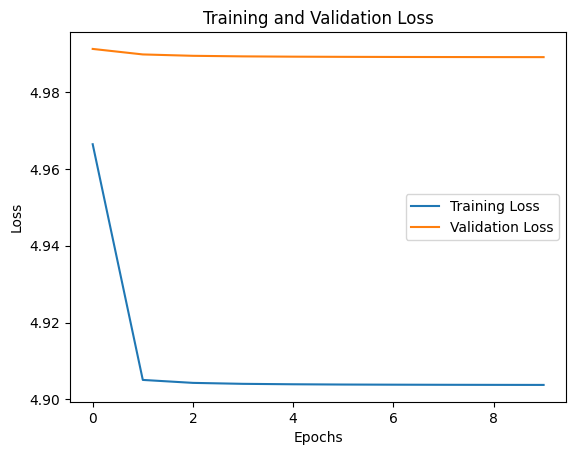

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 14ms/step - loss: 9685.9600 - mae: 5.8375 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 8386.7422 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 96.6966 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 96.6967 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 2338.2629 - mae: 5.8376 - val

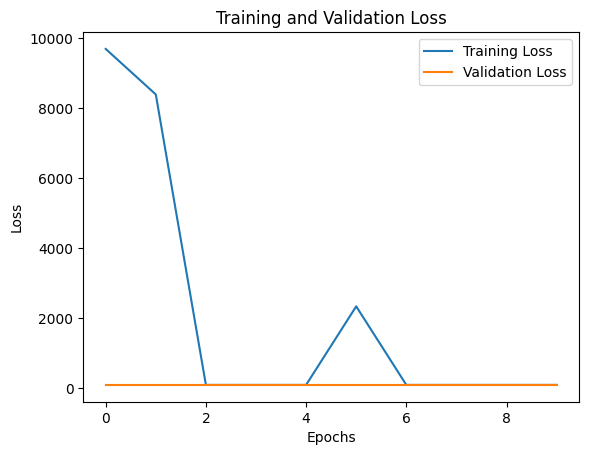

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 19847.2988 - mse: 40.1370 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.149

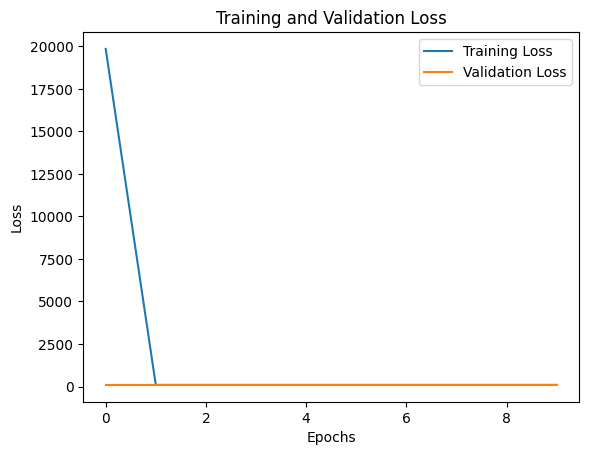

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2900.0901 - mae: 5.8375 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95

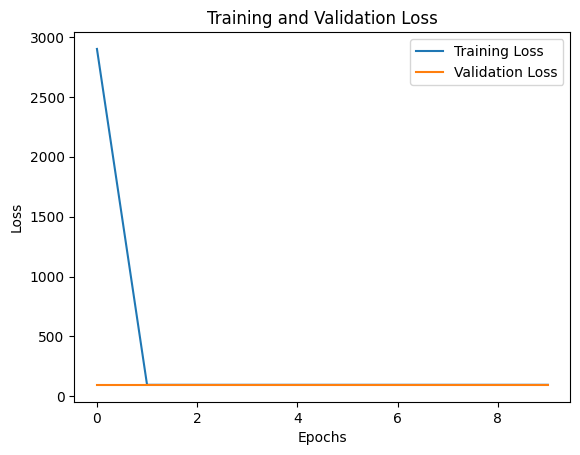

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 10ms/step - loss: 112295.4688 - mse: 40.1273 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494 -

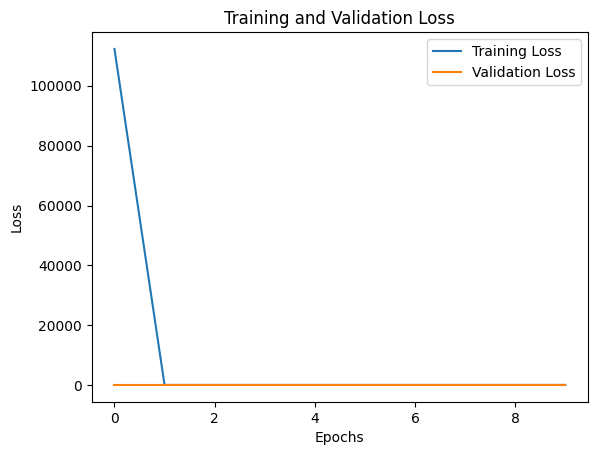

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 16870.0156 - mae: 5.8373 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 844540.6250 - mae: 5.7809 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6941 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6945 - mae: 5.8376 - val

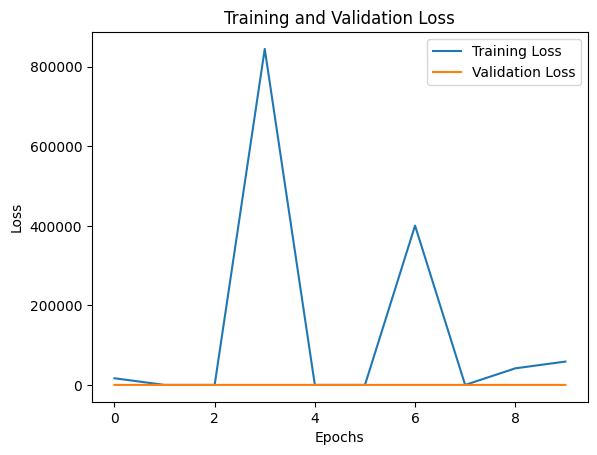

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.00019709429339753726
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 21747.7324 - mse: 40.1467 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6964 - mse: 40.1493 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 74059.7578 - mse: 40.0820 - val_loss: 343200.7188 - val_mse: 40.8545
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 45251.8789 - mse: 40.0853 - val_loss: 95.7745 - val_mse: 41.3011
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.4615 - mse: 40.0355 - val_loss: 1036472.7500 - val_mse: 40.4391
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 6676

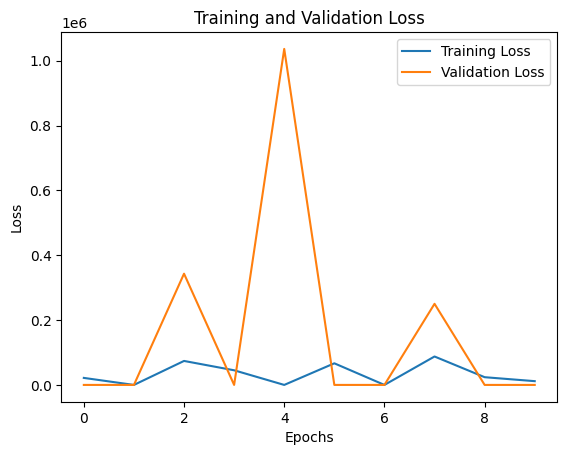

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 1.7484212370133534e-06
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 16116.7871 - mae: 5.8346 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6948 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6948 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6954 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6949 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6950 - mae: 5.8376 - val_lo

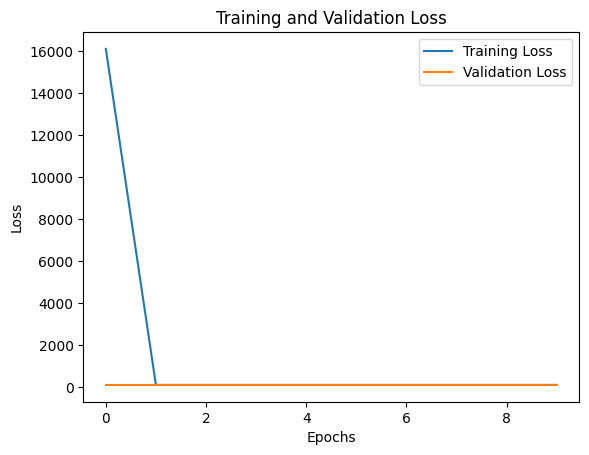

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 41507.6133 - mse: 40.1050 - val_loss: 95.8137 - val_mse: 41.3257
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 2668.8926 - mse: 40.1408 - val_loss: 95.8133 - val_mse: 41.3255
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 915.3068 - mse: 40.1416 - val_loss: 95.8143 - val_mse: 41.3260
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6834 - mse: 40.1443 - val_loss: 95.8143 - val_mse: 41.3260
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6853 - mse: 40.1443 - val_loss: 95.8143 - val_mse: 41.3260
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6846 - mse: 40.

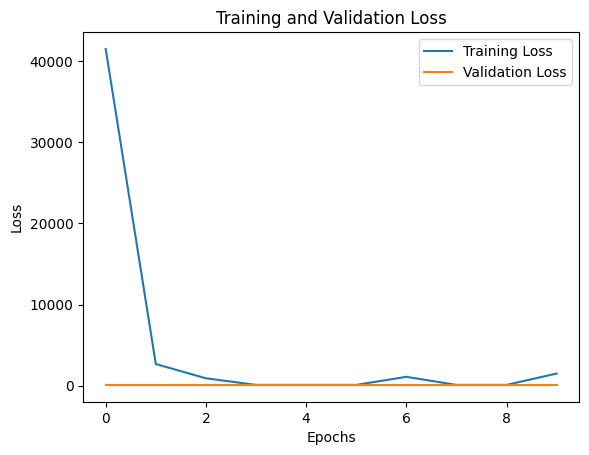

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 173261.2812 - mae: 5.8283 - val_loss: 189642.1875 - val_mae: 5.8999
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 143711.9531 - mae: 5.8297 - val_loss: 151117.2188 - val_mae: 5.9006
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 152422.8750 - mae: 5.8304 - val_loss: 121590.7344 - val_mae: 5.9010
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 107855.2891 - mae: 5.8309 - val_loss: 102552.1250 - val_mae: 5.9014
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 109067.8047 - mae: 5.8314 - val_loss: 87056.4688 - val_mae: 5.9017
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - 

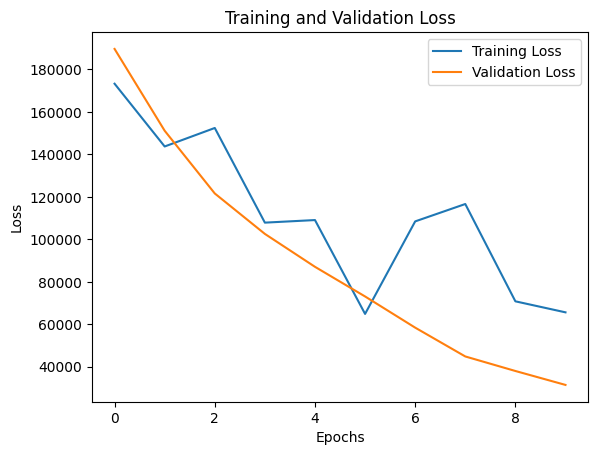

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 970710.0000 - mse: 39.9530 - val_loss: 1017758.2500 - val_mse: 41.1914
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 687156.3125 - mse: 39.9967 - val_loss: 661312.8750 - val_mse: 41.2358
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 459415.6250 - mse: 40.0335 - val_loss: 446596.4062 - val_mse: 41.2626
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 300571.5000 - mse: 40.0528 - val_loss: 322920.3750 - val_mse: 41.2781
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 237208.6719 - mse: 40.0661 - val_loss: 224261.6562 - val_mse: 41.2909
Epoch 6/10
128/128 [==============================] - 1s

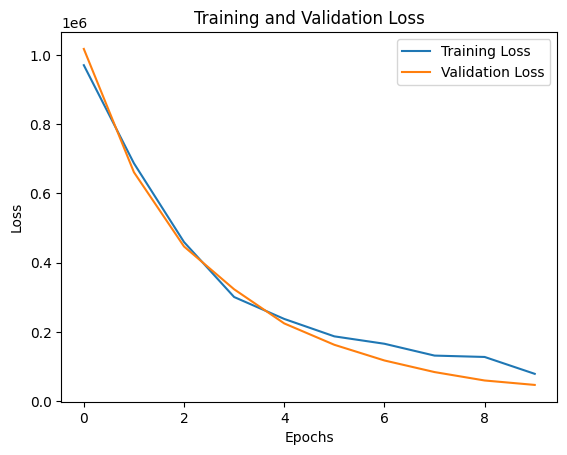

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 25802.3789 - mae: 5.8373 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6958 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6961 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6964 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6961 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6961 - mae: 5.8376 - val_los

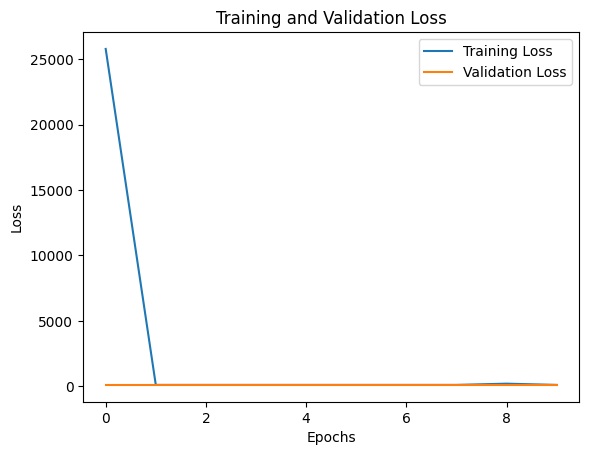

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 25886.6992 - mse: 40.1460 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6967 - mse: 40.1493 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494

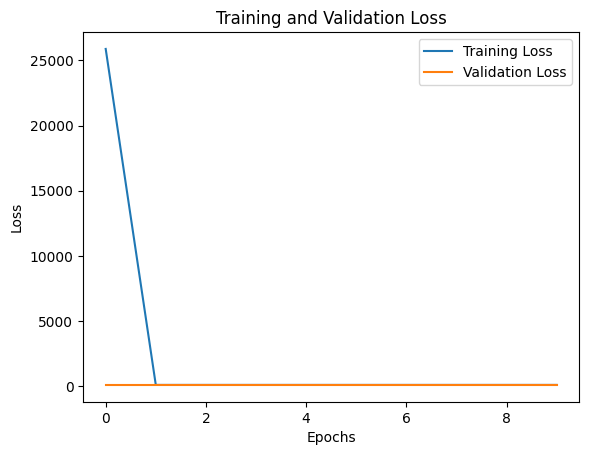

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 13701.2852 - mae: 5.8373 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 3364.0886 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6952 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6950 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 96.6949 - mae: 5.8376 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 96.6953 - mae: 5.8376 - va

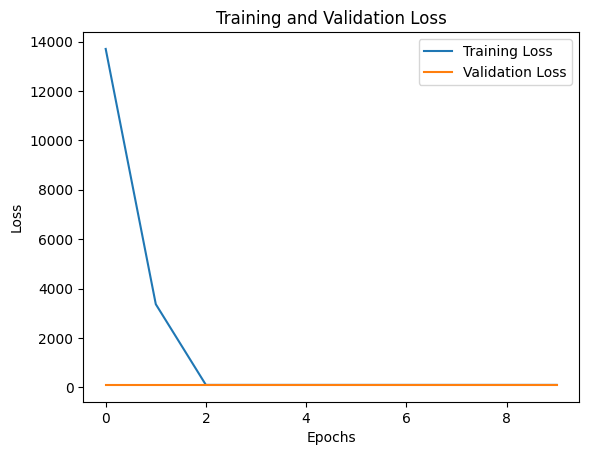

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 17ms/step - loss: 39355.1484 - mse: 40.1459 - val_loss: 95.8195 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6967 - mse: 40.1493 - val_loss: 95.8195 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6967 - mse: 40.1494 - val_loss: 95.8195 - val_mse: 41.3289
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 96.6967 - mse: 40.1493 - val_loss: 95.8195 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8195 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 96.6967 - mse: 40.

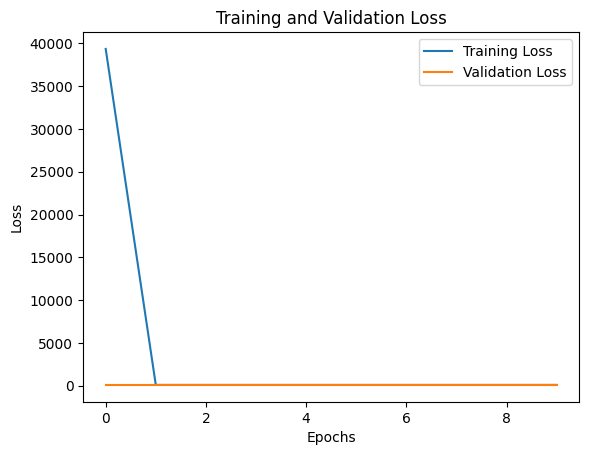

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 1151656.2500 - mae: 5.8380 - val_loss: 774959.3125 - val_mae: 5.9050
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 482010.5312 - mae: 5.8352 - val_loss: 363025.0000 - val_mae: 5.9039
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 281375.5625 - mae: 5.8382 - val_loss: 156892.3438 - val_mae: 5.9010
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 176010.6562 - mae: 5.8354 - val_loss: 90290.9688 - val_mae: 5.9037
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 131038.8594 - mae: 5.8376 - val_loss: 107104.6328 - val_mae: 5.9033
Epoch 6/10
128/128 [==============================] - 1s 11ms/step

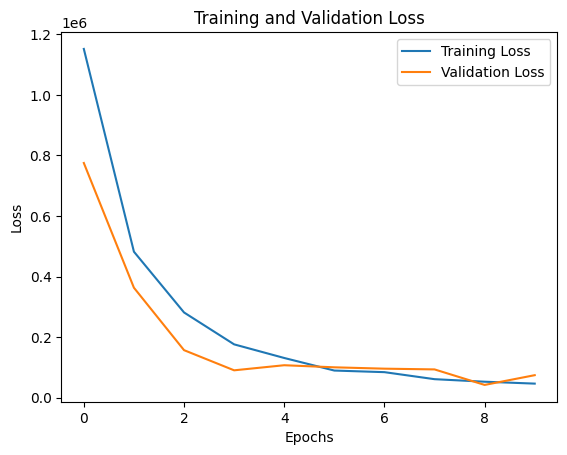

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 13ms/step - loss: 1243886.6250 - mse: 39.9777 - val_loss: 678830.9375 - val_mse: 41.4021
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 588402.7500 - mse: 40.1670 - val_loss: 527701.5625 - val_mse: 41.2392
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 330176.2188 - mse: 40.1351 - val_loss: 241056.5781 - val_mse: 41.3113
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 239217.0938 - mse: 40.1327 - val_loss: 161512.6094 - val_mse: 41.3580
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 168410.6875 - mse: 40.1494 - val_loss: 114189.4375 - val_mse: 41.3758
Epoch 6/10
128/128 [==============================] - 1s 

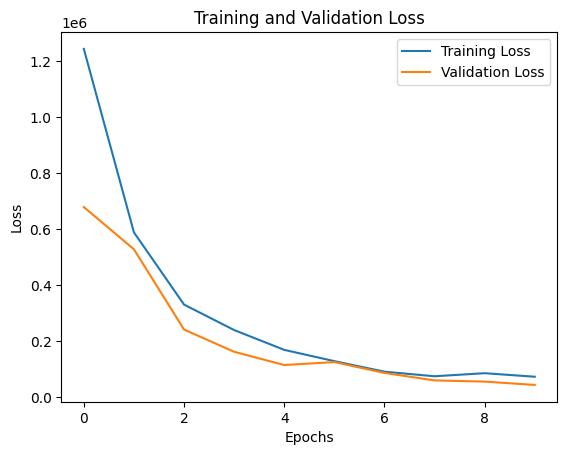

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 12ms/step - loss: 133016387059712.0000 - mae: 4137659.0000 - val_loss: 632532114604032.0000 - val_mae: 15109861.0000
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 131497755410432.0000 - mae: 3840086.0000 - val_loss: 150098789007360.0000 - val_mae: 3618184.5000
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 138249427222528.0000 - mae: 4275464.0000 - val_loss: 205610586996736.0000 - val_mae: 4906236.5000
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 111337766125568.0000 - mae: 3594033.7500 - val_loss: 108366898659328.0000 - val_mae: 2600088.0000
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 123073294499840.

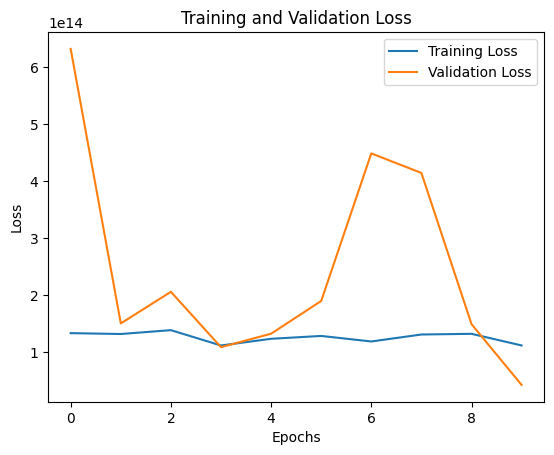

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.0005285699643060582
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 132105585557504.0000 - mse: 23294925340672.0000 - val_loss: 111713357660160.0000 - val_mse: 7186562416640.0000
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 117348698685440.0000 - mse: 20306129321984.0000 - val_loss: 131143965868032.0000 - val_mse: 8806280986624.0000
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 119253877391360.0000 - mse: 17782722789376.0000 - val_loss: 78711223222272.0000 - val_mse: 3571674513408.0000
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 104035524804608.0000 - mse: 18533664686080.0000 - val_loss: 42505114484736.0000 - val_mse: 1246121951232.0000
Epoch 5/10
128/128 [======================

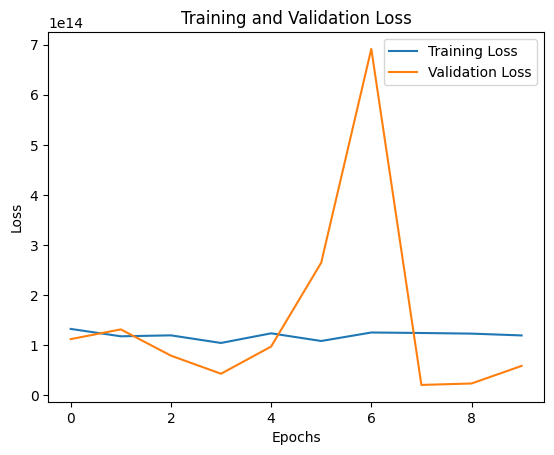

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.020080766802470507
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 1401009.6250 - mae: 5.8358 - val_loss: 1627382.7500 - val_mae: 5.9286
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 545928.6250 - mae: 5.8324 - val_loss: 408011.4062 - val_mae: 5.9024
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 252112.1406 - mae: 5.8372 - val_loss: 196623.7188 - val_mae: 5.9019
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 134841.5312 - mae: 5.8372 - val_loss: 272930.5312 - val_mae: 5.9128
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 89556.9453 - mae: 5.8393 - val_loss: 90827.2109 - val_mae: 5.9089
Epoch 6/10
128/128 [==============================] - 1s 9ms/step -

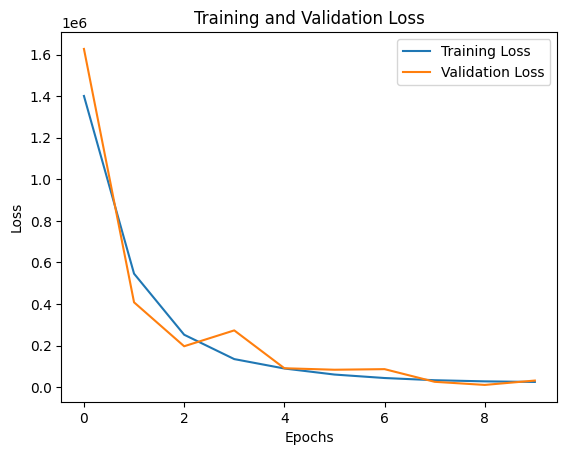

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1378637.2500 - mse: 39.9171 - val_loss: 1436363.6250 - val_mse: 41.5506
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 535362.3750 - mse: 40.0807 - val_loss: 296054.9062 - val_mse: 41.3859
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 256299.2344 - mse: 40.1667 - val_loss: 252125.6094 - val_mse: 41.3713
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 151338.5625 - mse: 40.1112 - val_loss: 339697.6250 - val_mse: 41.1178
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 114124.3281 - mse: 40.1617 - val_loss: 115805.7734 - val_mse: 41.3774
Epoch 6/10
128/128 [==============================] - 

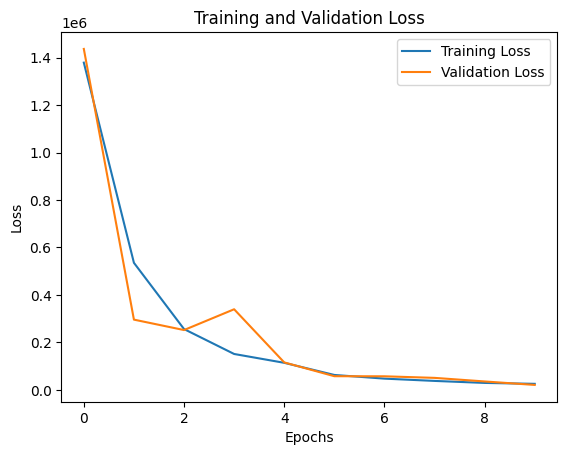

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 791274.5000 - mae: 5.8383 - val_loss: 846123.3125 - val_mae: 5.8913
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 586500.9375 - mae: 5.8354 - val_loss: 359976.4688 - val_mae: 5.9009
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 537066.0625 - mae: 5.8361 - val_loss: 241309.1562 - val_mae: 5.9009
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 465977.4062 - mae: 5.8343 - val_loss: 245442.0469 - val_mae: 5.9052
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 460706.5000 - mae: 5.8408 - val_loss: 369436.0000 - val_mae: 5.9135
Epoch 6/10
128/128 [==============================] - 1s 10ms/step

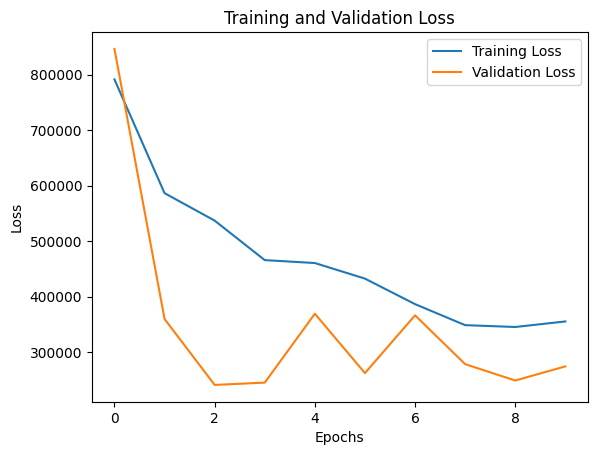

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 924422.1875 - mse: 40.2619 - val_loss: 396338.9688 - val_mse: 41.4215
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 599842.5625 - mse: 40.2171 - val_loss: 486996.5625 - val_mse: 41.3951
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 593253.7500 - mse: 40.2155 - val_loss: 300338.5312 - val_mse: 41.3584
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 512453.0938 - mse: 40.1631 - val_loss: 232098.2344 - val_mse: 41.3044
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 468008.6250 - mse: 40.1864 - val_loss: 232299.4219 - val_mse: 41.3254
Epoch 6/10
128/128 [==============================] - 1

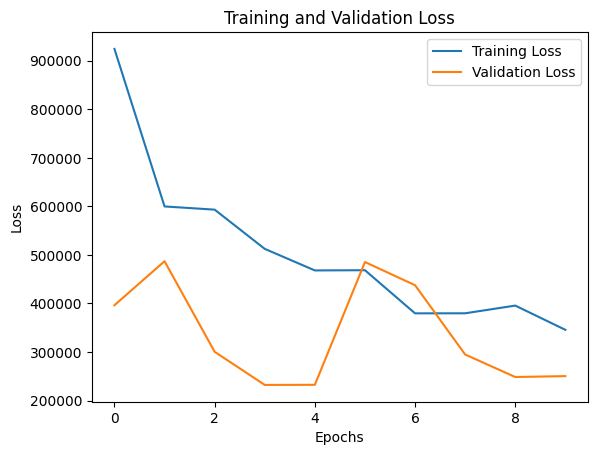

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1167234.6250 - mae: 5.8655 - val_loss: 1164996.1250 - val_mae: 5.9315
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1135446.5000 - mae: 5.8642 - val_loss: 1129679.0000 - val_mae: 5.9306
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1203887.5000 - mae: 5.8635 - val_loss: 1098439.3750 - val_mae: 5.9295
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1136641.2500 - mae: 5.8621 - val_loss: 1073028.3750 - val_mae: 5.9288
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1042061.3750 - mae: 5.8617 - val_loss: 1045621.1875 - val_mae: 5.9279
Epoch 6/10
128/128 [==============================]

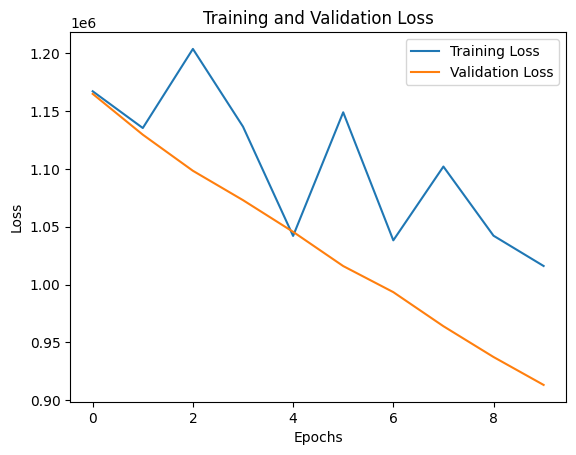

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 1148890.3750 - mse: 40.2225 - val_loss: 1060091.8750 - val_mse: 41.4052
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1116778.8750 - mse: 40.1990 - val_loss: 970752.7500 - val_mse: 41.3853
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1065660.8750 - mse: 40.1832 - val_loss: 919360.1250 - val_mse: 41.3657
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1077299.2500 - mse: 40.1738 - val_loss: 886719.3125 - val_mse: 41.3561
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 951738.1875 - mse: 40.1631 - val_loss: 862766.0625 - val_mse: 41.3467
Epoch 6/10
128/128 [==========================

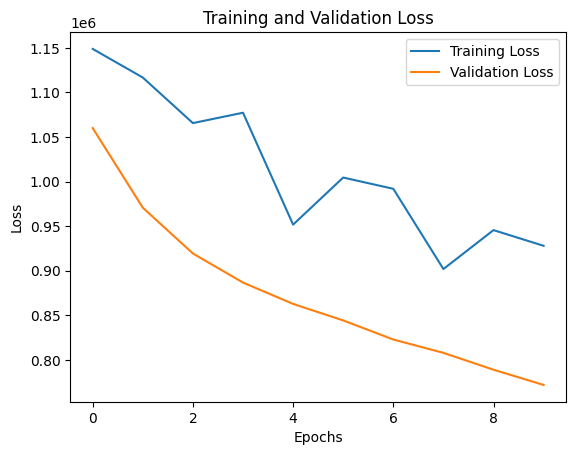

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 895783.2500 - mae: 5.8357 - val_loss: 726899.6250 - val_mae: 5.9005
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 636331.4375 - mae: 5.8367 - val_loss: 673846.1875 - val_mae: 5.9046
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 536655.7500 - mae: 5.8371 - val_loss: 453147.7188 - val_mae: 5.9036
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 378830.0000 - mae: 5.8407 - val_loss: 352911.9062 - val_mae: 5.9079
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 336775.6562 - mae: 5.8372 - val_loss: 370608.3750 - val_mae: 5.9093
Epoch 6/10
128/128 [==============================] - 1s 9ms/step -

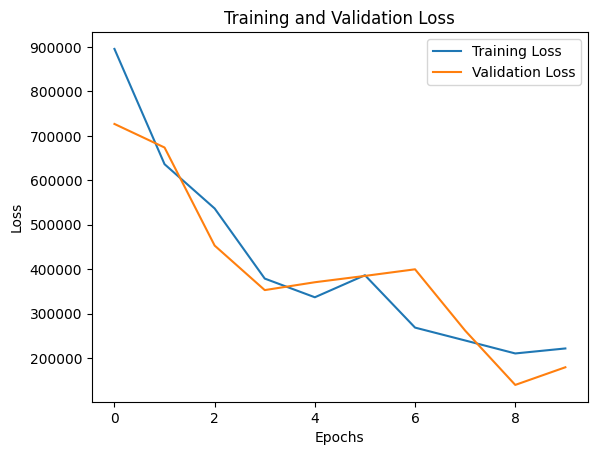

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1043832.1875 - mse: 40.2251 - val_loss: 699761.1875 - val_mse: 41.2589
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 650246.0000 - mse: 40.1385 - val_loss: 800535.8750 - val_mse: 41.1823
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 540288.2500 - mse: 40.1655 - val_loss: 515616.1875 - val_mse: 41.2276
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 431464.5000 - mse: 40.0879 - val_loss: 575040.2500 - val_mse: 41.2757
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 439701.4688 - mse: 40.2041 - val_loss: 639070.0625 - val_mse: 41.5424
Epoch 6/10
128/128 [==============================] -

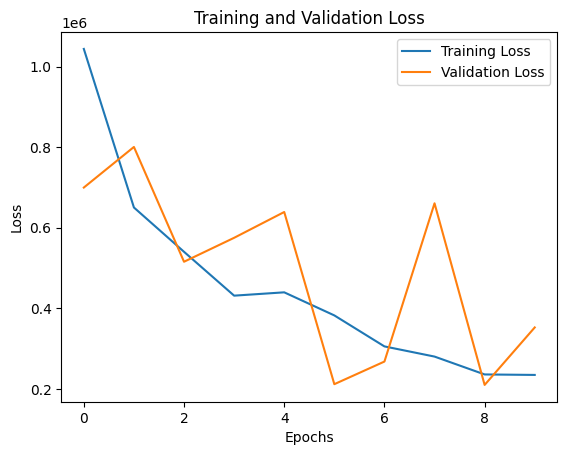

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 11s 18ms/step - loss: 1021095.3750 - mae: 5.8376 - val_loss: 1180897.7500 - val_mae: 5.8853
Epoch 2/10
128/128 [==============================] - 2s 15ms/step - loss: 474439.0000 - mae: 5.8393 - val_loss: 390474.0625 - val_mae: 5.9145
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 267741.5938 - mae: 5.8364 - val_loss: 278460.1562 - val_mae: 5.9004
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 180675.8281 - mae: 5.8413 - val_loss: 132196.7500 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 128811.8125 - mae: 5.8366 - val_loss: 109014.6094 - val_mae: 5.8990
Epoch 6/10
128/128 [==============================] - 2s 12ms

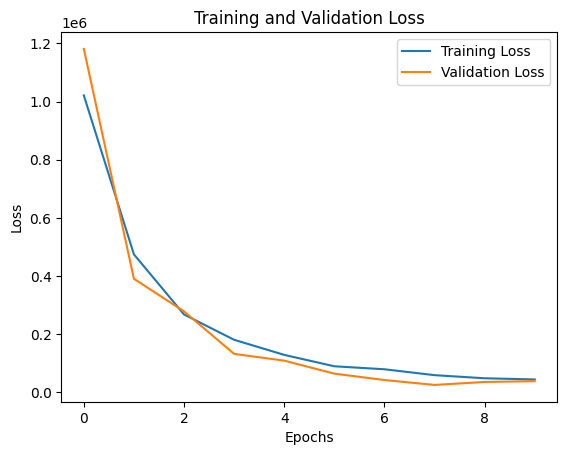

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 15ms/step - loss: 955266.3750 - mse: 40.1032 - val_loss: 1015453.8750 - val_mse: 41.4232
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 460604.4688 - mse: 40.2006 - val_loss: 435118.6875 - val_mse: 41.2139
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 279959.6562 - mse: 40.0981 - val_loss: 176682.2344 - val_mse: 41.2421
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 180479.6562 - mse: 40.1604 - val_loss: 249678.1562 - val_mse: 41.2710
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 113720.1953 - mse: 40.1553 - val_loss: 158444.9844 - val_mse: 41.4198
Epoch 6/10
128/128 [==============================] -

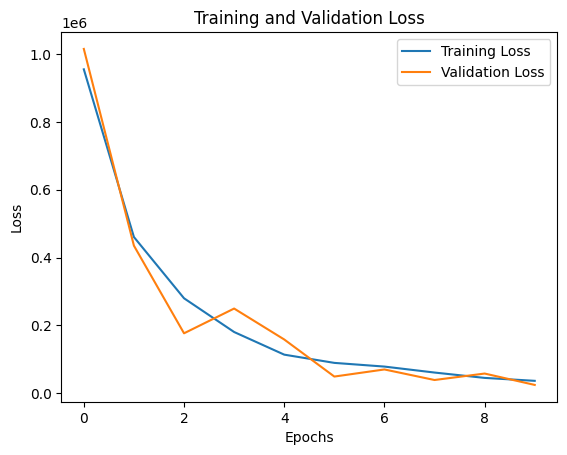

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1260308.6250 - mae: 5.8304 - val_loss: 1476132.8750 - val_mae: 5.9135
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 688227.2500 - mae: 5.8410 - val_loss: 695652.3125 - val_mae: 5.9218
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 329308.3750 - mae: 5.8373 - val_loss: 232431.4062 - val_mae: 5.9037
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 233937.1875 - mae: 5.8427 - val_loss: 198858.0156 - val_mae: 5.9146
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 153285.5156 - mae: 5.8399 - val_loss: 148740.7500 - val_mae: 5.9097
Epoch 6/10
128/128 [==============================] - 1s 10ms/ste

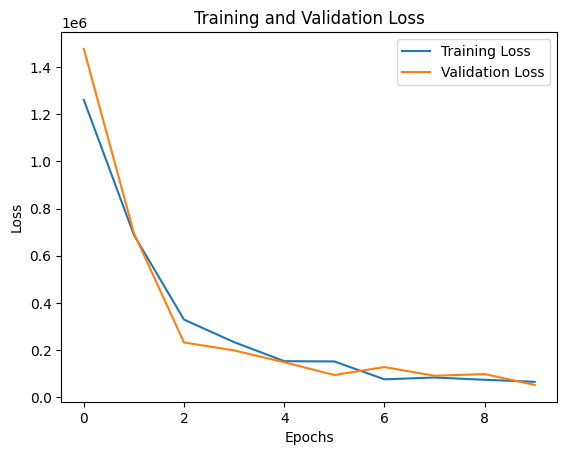

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1202733.8750 - mse: 40.0811 - val_loss: 575951.6250 - val_mse: 41.0994
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 470115.0312 - mse: 40.0817 - val_loss: 382678.0000 - val_mse: 41.3658
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 260886.9062 - mse: 40.1046 - val_loss: 169764.0312 - val_mse: 41.3473
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 164588.9062 - mse: 40.1544 - val_loss: 76733.6562 - val_mse: 41.3466
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 114626.4766 - mse: 40.1618 - val_loss: 156295.7812 - val_mse: 41.2917
Epoch 6/10
128/128 [==============================] - 1s 

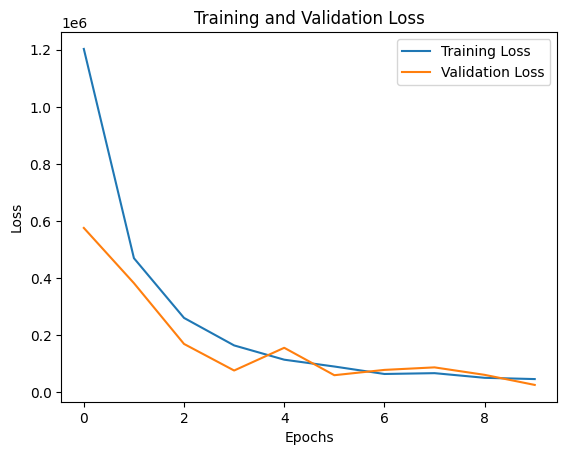

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 32553556.0000 - mae: 5.9160 - val_loss: 41804280.0000 - val_mae: 5.9813
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 33031680.0000 - mae: 5.9133 - val_loss: 41804280.0000 - val_mae: 5.9813
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 33031678.0000 - mae: 5.9128 - val_loss: 41804280.0000 - val_mae: 5.9813
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 33031682.0000 - mae: 5.9133 - val_loss: 41804280.0000 - val_mae: 5.9813
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 33031684.0000 - mae: 5.9118 - val_loss: 41804280.0000 - val_mae: 5.9813
Epoch 6/10
128/128 [==============================

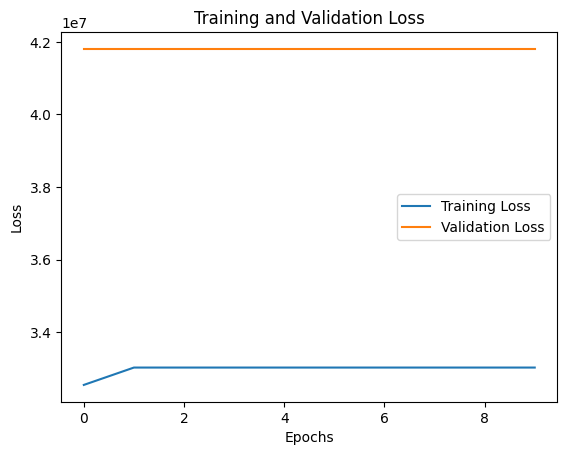

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.0026253454180329427
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 32674370.0000 - mse: 29.5581 - val_loss: 41804260.0000 - val_mse: 30.5182
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 33031644.0000 - mse: 29.4741 - val_loss: 41804260.0000 - val_mse: 30.5182
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 33031640.0000 - mse: 29.4741 - val_loss: 41804260.0000 - val_mse: 30.5182
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 33031636.0000 - mse: 29.4741 - val_loss: 41804260.0000 - val_mse: 30.5182
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 33031638.0000 - mse: 29.4741 - val_loss: 41804260.0000 - val_mse: 30.5182
Epoch 6/10
128/128 [====================

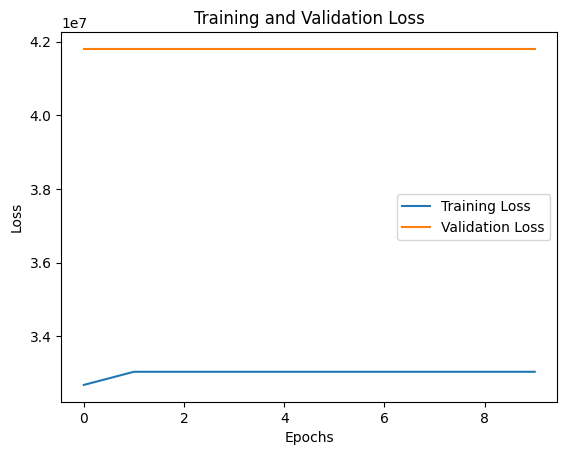

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1299804.0000 - mae: 5.8351 - val_loss: 610511.6875 - val_mae: 5.9071
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 433832.3750 - mae: 5.8403 - val_loss: 267985.8750 - val_mae: 5.9025
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 220002.3438 - mae: 5.8390 - val_loss: 106800.1641 - val_mae: 5.9044
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 123612.7344 - mae: 5.8393 - val_loss: 103919.1875 - val_mae: 5.8987
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 79388.0312 - mae: 5.8357 - val_loss: 55837.4375 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - 

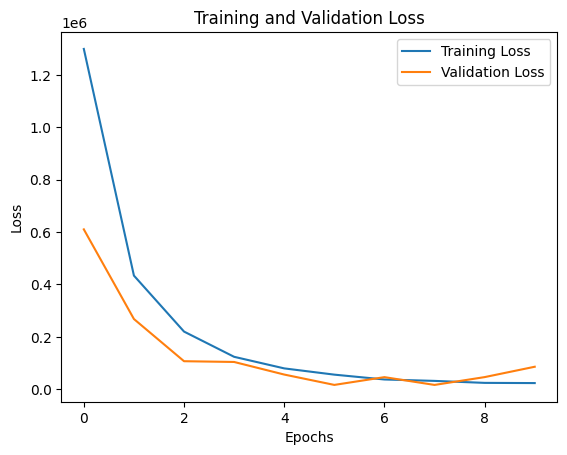

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1460845.3750 - mse: 40.3310 - val_loss: 1856846.0000 - val_mse: 41.1231
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 558640.6875 - mse: 40.2489 - val_loss: 194260.4062 - val_mse: 41.3145
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 230534.0469 - mse: 40.1078 - val_loss: 108142.3750 - val_mse: 41.3313
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 138320.5156 - mse: 40.1043 - val_loss: 148653.2031 - val_mse: 41.3258
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 92024.1094 - mse: 40.1755 - val_loss: 58682.2852 - val_mse: 41.3639
Epoch 6/10
128/128 [==============================] - 1s

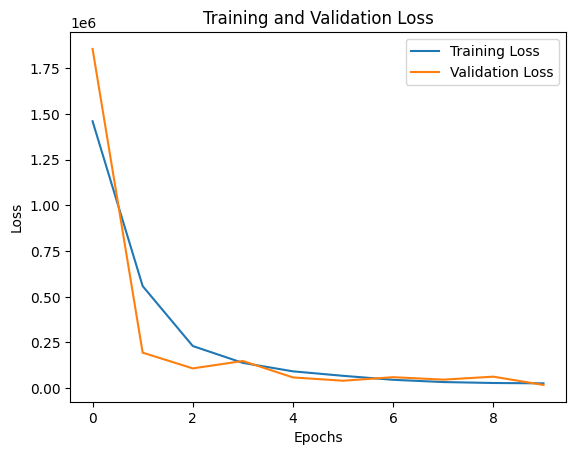

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 816276.7500 - mae: 5.8413 - val_loss: 432058.7188 - val_mae: 5.9144
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 637359.9375 - mae: 5.8405 - val_loss: 423241.2812 - val_mae: 5.9088
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 496903.6875 - mae: 5.8425 - val_loss: 286159.7500 - val_mae: 5.9134
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 462541.2188 - mae: 5.8411 - val_loss: 299814.4062 - val_mae: 5.9103
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 450397.2500 - mae: 5.8427 - val_loss: 248342.6875 - val_mae: 5.9109
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - 

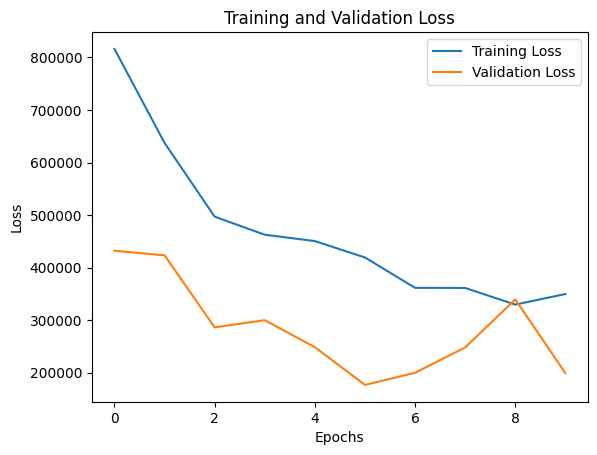

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 897015.8750 - mse: 40.1593 - val_loss: 409237.7812 - val_mse: 41.3688
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 675734.6875 - mse: 40.1584 - val_loss: 360898.2188 - val_mse: 41.4294
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 575025.2500 - mse: 40.1568 - val_loss: 272855.2812 - val_mse: 41.3175
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 484239.0312 - mse: 40.1741 - val_loss: 312303.8438 - val_mse: 41.3099
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 469546.7500 - mse: 40.1335 - val_loss: 206895.7188 - val_mse: 41.3219
Epoch 6/10
128/128 [==============================] - 1s 

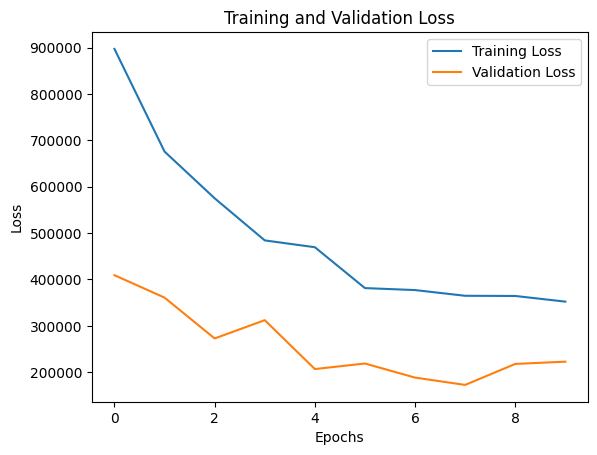

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 667501.1250 - mae: 5.8330 - val_loss: 655222.7500 - val_mae: 5.9011
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 638605.4375 - mae: 5.8340 - val_loss: 633009.1250 - val_mae: 5.9015
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 641421.3125 - mae: 5.8346 - val_loss: 606572.0000 - val_mae: 5.9024
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 684761.2500 - mae: 5.8355 - val_loss: 586034.8125 - val_mae: 5.9032
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 608512.9375 - mae: 5.8360 - val_loss: 569354.3750 - val_mae: 5.9033
Epoch 6/10
128/128 [==============================] - 1s 11ms/s

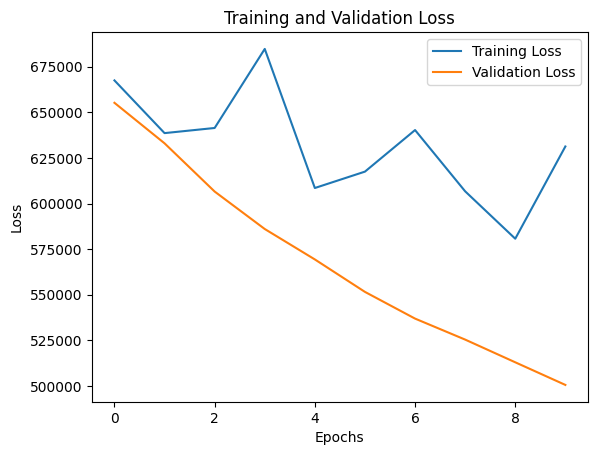

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 739840.1875 - mse: 40.1205 - val_loss: 707929.6875 - val_mse: 41.2919
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 813473.9375 - mse: 40.1281 - val_loss: 671678.9375 - val_mse: 41.3030
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 775088.8750 - mse: 40.1307 - val_loss: 651712.0000 - val_mse: 41.3066
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 788130.8750 - mse: 40.1350 - val_loss: 635139.8125 - val_mse: 41.3096
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 797176.2500 - mse: 40.1317 - val_loss: 619603.5625 - val_mse: 41.3067
Epoch 6/10
128/128 [==============================] -

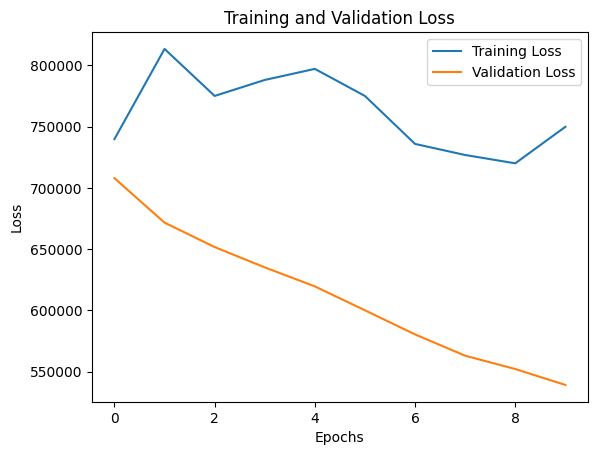

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 927562.1875 - mae: 5.8453 - val_loss: 1200540.6250 - val_mae: 5.9261
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 682143.6250 - mae: 5.8403 - val_loss: 571676.6250 - val_mae: 5.9210
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 583866.8125 - mae: 5.8334 - val_loss: 352905.6250 - val_mae: 5.9083
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 443751.7500 - mae: 5.8396 - val_loss: 441236.0312 - val_mae: 5.9014
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 379732.3438 - mae: 5.8396 - val_loss: 515348.4688 - val_mae: 5.9217
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - 

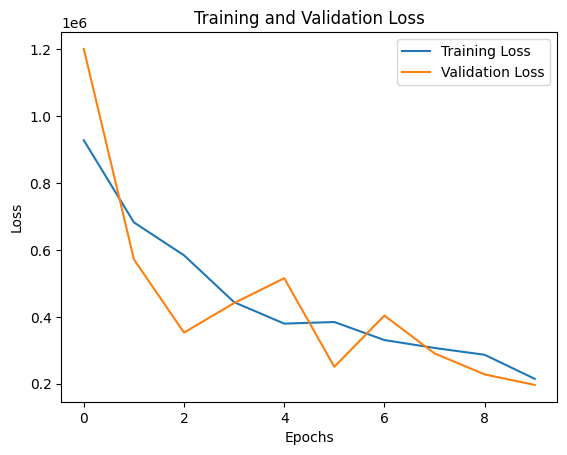

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 925499.4375 - mse: 40.1427 - val_loss: 602546.4375 - val_mse: 41.2589
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 535944.1250 - mse: 40.2091 - val_loss: 839024.8750 - val_mse: 41.3961
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 479634.6875 - mse: 40.1717 - val_loss: 307668.3438 - val_mse: 41.3747
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 391561.1875 - mse: 40.2294 - val_loss: 359926.4375 - val_mse: 41.3093
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 402375.9688 - mse: 40.1887 - val_loss: 379240.4062 - val_mse: 41.4062
Epoch 6/10
128/128 [==============================] - 1s

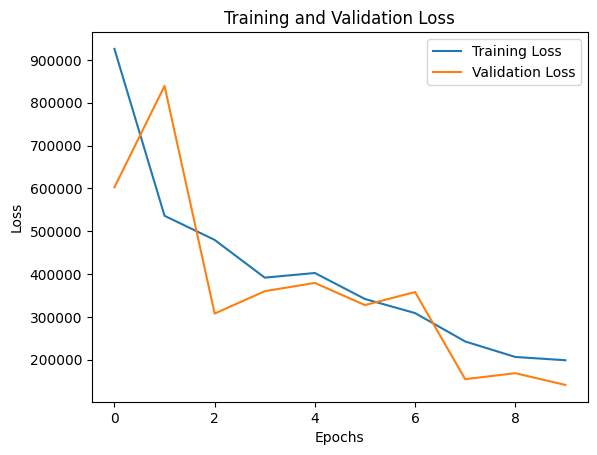

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 962310.8750 - mae: 5.8387 - val_loss: 1137723.8750 - val_mae: 5.8874
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 557169.5000 - mae: 5.8402 - val_loss: 368693.7500 - val_mae: 5.9038
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 278087.1250 - mae: 5.8435 - val_loss: 290559.4688 - val_mae: 5.9065
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 192364.5156 - mae: 5.8401 - val_loss: 156650.2812 - val_mae: 5.9062
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 139999.4219 - mae: 5.8388 - val_loss: 111056.0938 - val_mae: 5.9022
Epoch 6/10
128/128 [==============================] - 1s 11ms/ste

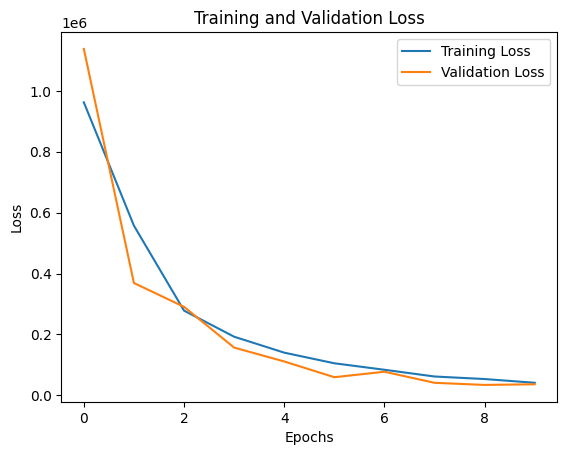

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1244327.8750 - mse: 40.2985 - val_loss: 1063699.2500 - val_mse: 41.6966
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 553886.2500 - mse: 40.2064 - val_loss: 442185.1250 - val_mse: 41.3519
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 344707.5000 - mse: 40.1042 - val_loss: 346866.4375 - val_mse: 41.3913
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 256698.3438 - mse: 40.1566 - val_loss: 352396.3125 - val_mse: 41.1822
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 174995.2656 - mse: 40.1131 - val_loss: 99966.3594 - val_mse: 41.3063
Epoch 6/10
128/128 [==============================] - 1s

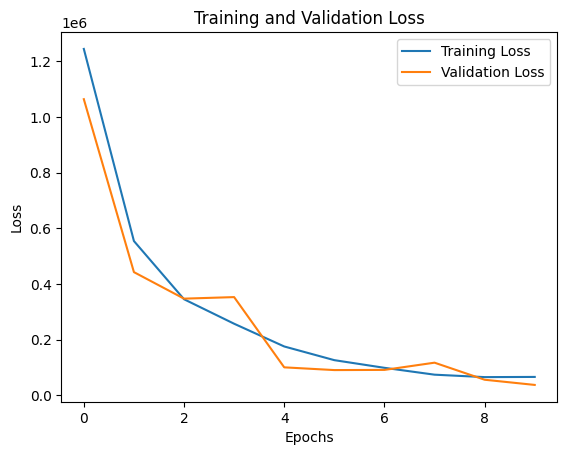

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 12ms/step - loss: 2423558.5000 - mae: 5.7234 - val_loss: 161820.9062 - val_mae: 5.8856
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 113584.8438 - mae: 5.8250 - val_loss: 51793.7617 - val_mae: 5.8982
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 45198.4453 - mae: 5.8326 - val_loss: 24354.2012 - val_mae: 5.9019
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 23730.6875 - mae: 5.8346 - val_loss: 14689.9561 - val_mae: 5.9032
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 15739.6992 - mae: 5.8356 - val_loss: 10009.2168 - val_mae: 5.9038
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 

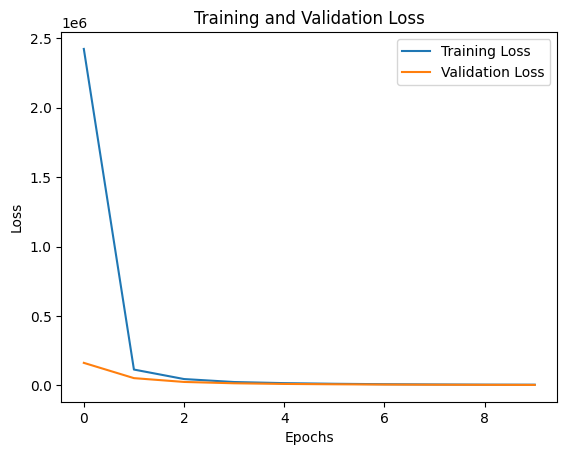

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2507118.5000 - mse: 38.6527 - val_loss: 182605.9219 - val_mse: 41.0828
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 113543.0391 - mse: 40.0031 - val_loss: 51305.3984 - val_mse: 41.2470
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 46240.0195 - mse: 40.0880 - val_loss: 24279.7441 - val_mse: 41.2871
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 23355.6523 - mse: 40.1126 - val_loss: 15124.2500 - val_mse: 41.3015
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 14953.2715 - mse: 40.1254 - val_loss: 10258.4756 - val_mse: 41.3099
Epoch 6/10
128/128 [==============================] - 1s 10ms/st

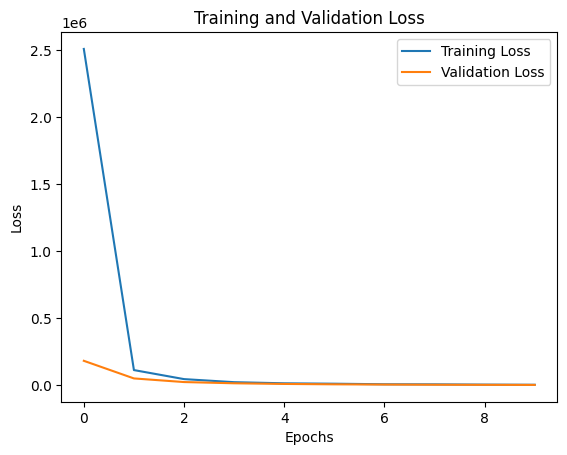

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 58036.4336 - mae: 5.8340 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mae: 5.8377 - val_loss: 95.8196 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mae: 5.8377 - val_loss

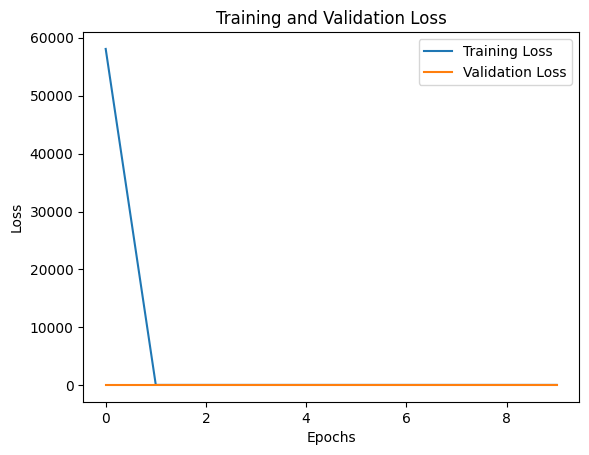

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 183895.2812 - mse: 40.1035 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mse: 40.1494 - val_loss: 95.8196 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 96.6968 - mse: 40.149

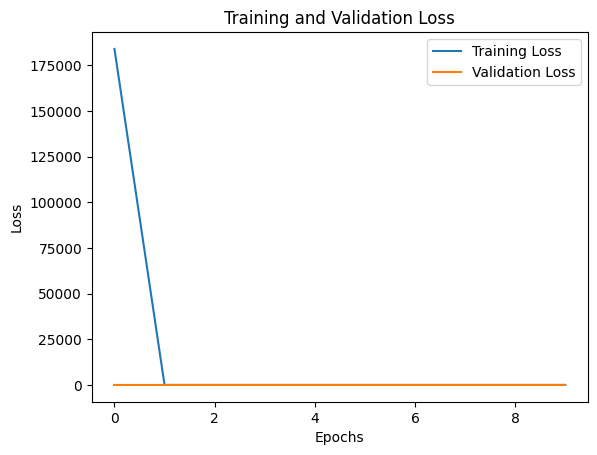

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 1780969.8750 - mae: 5.7427 - val_loss: 39331.5156 - val_mae: 5.8998
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 15056.4971 - mae: 5.8356 - val_loss: 1567.8613 - val_mae: 5.9051
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1111.2207 - mae: 5.8375 - val_loss: 191.3145 - val_mae: 5.9054
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 168.3128 - mae: 5.8376 - val_loss: 103.1898 - val_mae: 5.9054
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 100.9730 - mae: 5.8377 - val_loss: 96.1790 - val_mae: 5.9054
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 97.4406 - m

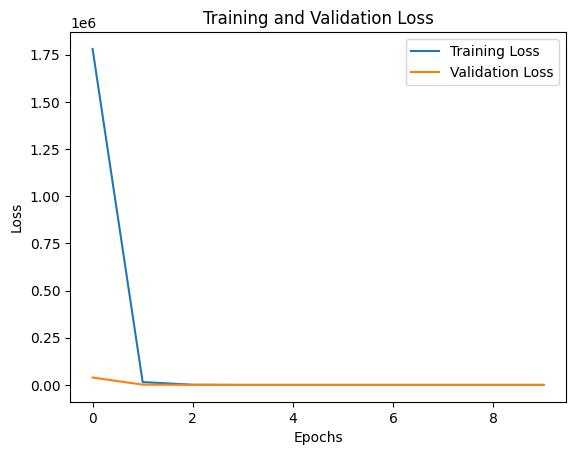

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2059521.0000 - mse: 38.7318 - val_loss: 55390.2656 - val_mse: 41.2385
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 25047.7324 - mse: 40.1193 - val_loss: 2245.3706 - val_mse: 41.3246
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 967.5845 - mse: 40.1474 - val_loss: 210.8858 - val_mse: 41.3287
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 163.2969 - mse: 40.1492 - val_loss: 104.3821 - val_mse: 41.3289
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 102.8093 - mse: 40.1494 - val_loss: 96.2785 - val_mse: 41.3289
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 97.

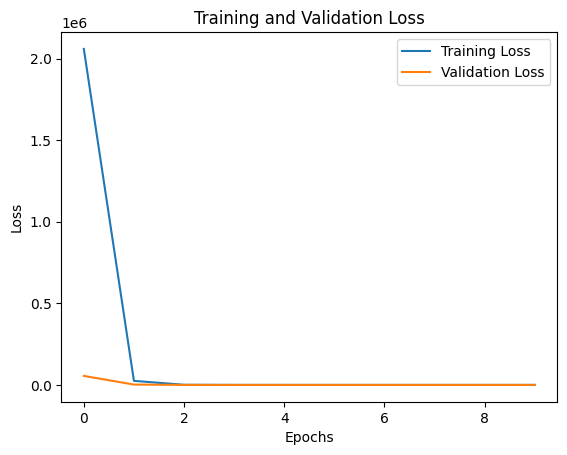

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 8084302.0000 - mae: 5.5216 - val_loss: 5870493.0000 - val_mae: 5.6637
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 3526784.5000 - mae: 5.6267 - val_loss: 3543965.2500 - val_mae: 5.7261
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2388530.0000 - mae: 5.6743 - val_loss: 2520771.0000 - val_mae: 5.7617
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1789213.6250 - mae: 5.7036 - val_loss: 1933866.2500 - val_mae: 5.7855
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1439439.5000 - mae: 5.7236 - val_loss: 1555088.8750 - val_mae: 5.8025
Epoch 6/10
128/128 [==============================] - 1

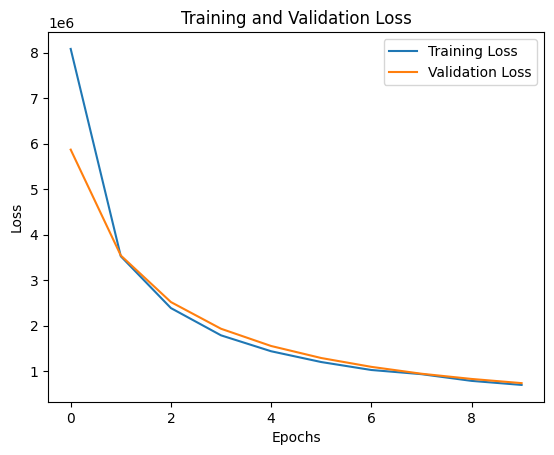

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 6836935.5000 - mse: 36.4165 - val_loss: 4960603.0000 - val_mse: 38.4736
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 3069375.5000 - mse: 37.6890 - val_loss: 3002448.0000 - val_mse: 39.2018
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 2112069.7500 - mse: 38.2531 - val_loss: 2136605.5000 - val_mse: 39.6220
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1610859.6250 - mse: 38.5933 - val_loss: 1644881.3750 - val_mse: 39.8999
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 1290403.7500 - mse: 38.8272 - val_loss: 1325443.0000 - val_mse: 40.1007
Epoch 6/10
128/128 [=========================

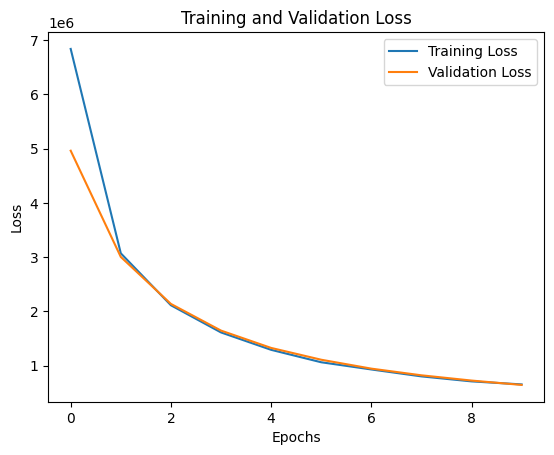

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 16348018.0000 - mae: 5.3691 - val_loss: 20699718.0000 - val_mae: 5.4468
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 16265520.0000 - mae: 5.3704 - val_loss: 20596946.0000 - val_mae: 5.4481
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 16164553.0000 - mae: 5.3716 - val_loss: 20499014.0000 - val_mae: 5.4493
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 16101783.0000 - mae: 5.3728 - val_loss: 20404628.0000 - val_mae: 5.4504
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 16028002.0000 - mae: 5.3741 - val_loss: 20309524.0000 - val_mae: 5.4516
Epoch 6/10
128/128 [=======================

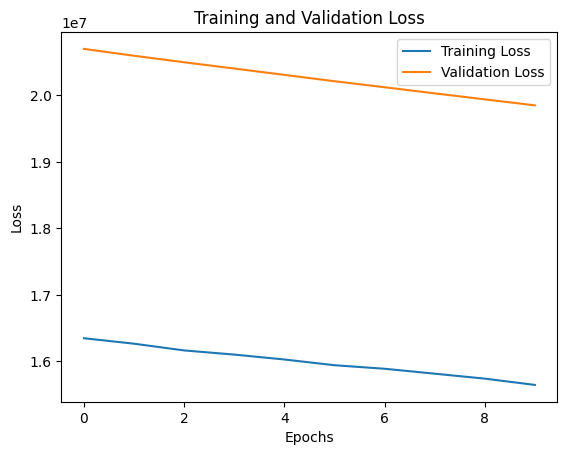

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.008302556013614182
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 16716216.0000 - mse: 34.5026 - val_loss: 21002758.0000 - val_mse: 35.6187
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 16603712.0000 - mse: 34.5194 - val_loss: 20879538.0000 - val_mse: 35.6354
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 16495288.0000 - mse: 34.5346 - val_loss: 20765884.0000 - val_mse: 35.6512
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 16437892.0000 - mse: 34.5512 - val_loss: 20655380.0000 - val_mse: 35.6669
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 16332984.0000 - mse: 34.5655 - val_loss: 20546446.0000 - val_mse: 35.6827
Epoch 6/10
128/128 [=============

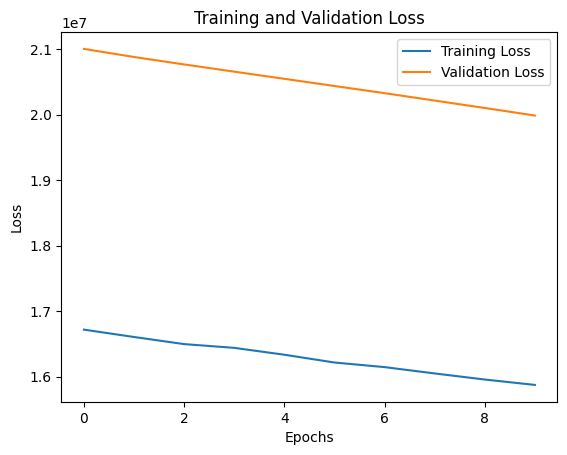

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.004050082527495724
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 5740478.0000 - mae: 5.5912 - val_loss: 1936087.6250 - val_mae: 5.7890
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1007265.3125 - mae: 5.7542 - val_loss: 676676.0000 - val_mae: 5.8516
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 435222.9375 - mae: 5.7953 - val_loss: 341723.2188 - val_mae: 5.8737
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 260163.1094 - mae: 5.8117 - val_loss: 200799.1875 - val_mae: 5.8850
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 168900.4688 - mae: 5.8202 - val_loss: 132976.0156 - val_mae: 5.8910
Epoch 6/10
128/128 [==============================] - 1s 9ms/ste

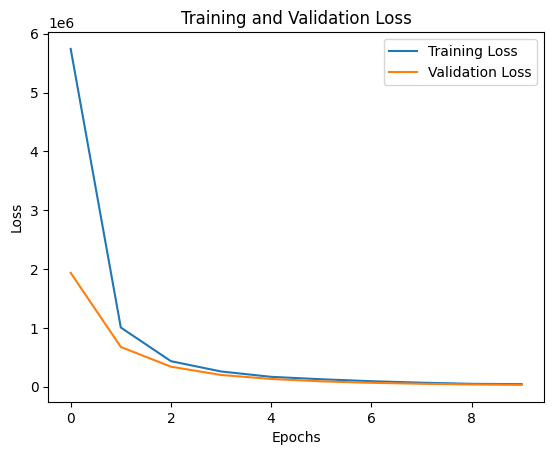

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5657785.0000 - mse: 37.1698 - val_loss: 2082373.3750 - val_mse: 39.7375
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1094739.0000 - mse: 39.0681 - val_loss: 713864.5000 - val_mse: 40.5868
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 489076.8750 - mse: 39.5603 - val_loss: 360504.7500 - val_mse: 40.8866
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 287448.4062 - mse: 39.7895 - val_loss: 216860.9375 - val_mse: 41.0412
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 188837.7969 - mse: 39.9038 - val_loss: 144732.2031 - val_mse: 41.1240
Epoch 6/10
128/128 [==============================] -

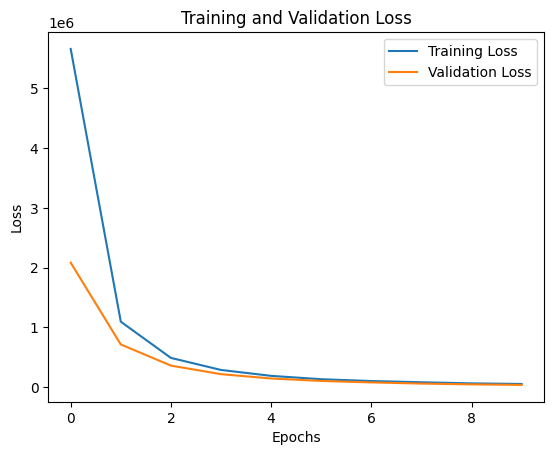

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 2996378.2500 - mae: 5.6939 - val_loss: 223479.4531 - val_mae: 5.8814
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 126214.2266 - mae: 5.8243 - val_loss: 60132.3828 - val_mae: 5.8980
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 45906.0547 - mae: 5.8324 - val_loss: 28407.9141 - val_mae: 5.9016
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 26646.7891 - mae: 5.8345 - val_loss: 16514.3066 - val_mae: 5.9031
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 18705.6504 - mae: 5.8355 - val_loss: 10934.4922 - val_mae: 5.9038
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - lo

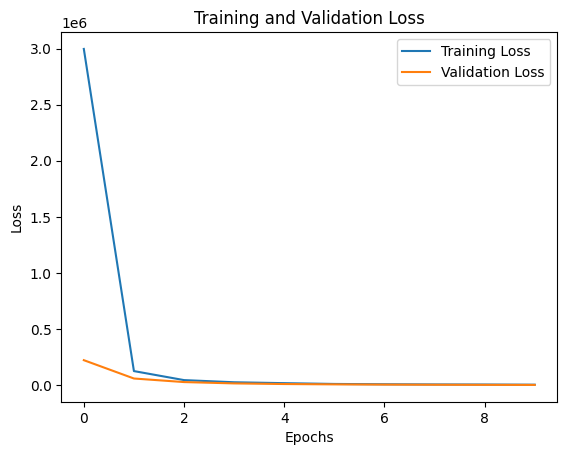

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_absolute_percentage_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2974681.7500 - mse: 38.3414 - val_loss: 199748.0938 - val_mse: 41.0370
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 124601.5078 - mse: 39.9713 - val_loss: 58972.8008 - val_mse: 41.2321
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 52716.0859 - mse: 40.0761 - val_loss: 29493.1309 - val_mse: 41.2776
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 28782.6074 - mse: 40.1078 - val_loss: 17441.9004 - val_mse: 41.2973
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 18868.3242 - mse: 40.1208 - val_loss: 11759.5059 - val_mse: 41.3068
Epoch 6/10
128/128 [==============================] - 1s 10

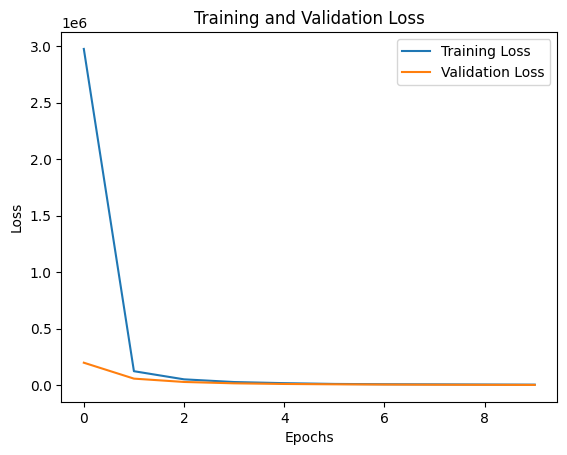

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 0.5831 - mae: 2.9453 - val_loss: 0.2635 - val_mae: 2.1985
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2218 - mae: 2.0087 - val_loss: 0.2367 - val_mae: 2.0394
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2038 - mae: 1.9124 - val_loss: 0.2180 - val_mae: 1.9412
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1914 - mae: 1.8487 - val_loss: 0.2053 - val_mae: 1.8838
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1840 - mae: 1.8160 - val_loss: 0.1958 - val_mae: 1.8067
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1769 - mae: 1.7647 - val_loss: 0.1887 - val_m

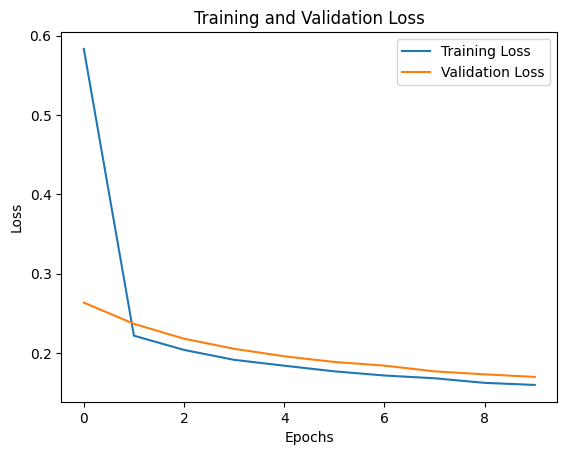

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.49015245285557174
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 0.5688 - mse: 12.6891 - val_loss: 0.2629 - val_mse: 7.0437
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 0.2213 - mse: 6.2665 - val_loss: 0.2361 - val_mse: 6.4219
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2035 - mse: 5.7199 - val_loss: 0.2180 - val_mse: 5.9463
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1911 - mse: 5.3641 - val_loss: 0.2054 - val_mse: 5.5794
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1829 - mse: 5.1207 - val_loss: 0.1955 - val_mse: 5.1500
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1762 - mse: 4.8825 - val_loss: 0.1883 - val_ms

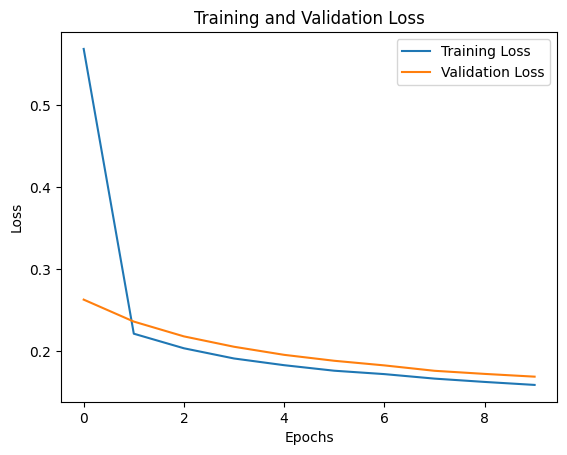

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.48082648203440814
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 10ms/step - loss: 1.3229 - mae: 4.5566 - val_loss: 0.7306 - val_mae: 3.9365
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 0.5455 - mae: 3.4679 - val_loss: 0.4711 - val_mae: 3.3001
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 0.3856 - mae: 3.0080 - val_loss: 0.3763 - val_mae: 2.9694
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 0.3210 - mae: 2.7421 - val_loss: 0.3320 - val_mae: 2.7392
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 0.2881 - mae: 2.5577 - val_loss: 0.3086 - val_mae: 2.5817
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2690 - mae: 2.4291 - val_loss: 0.2950 - val_mae:

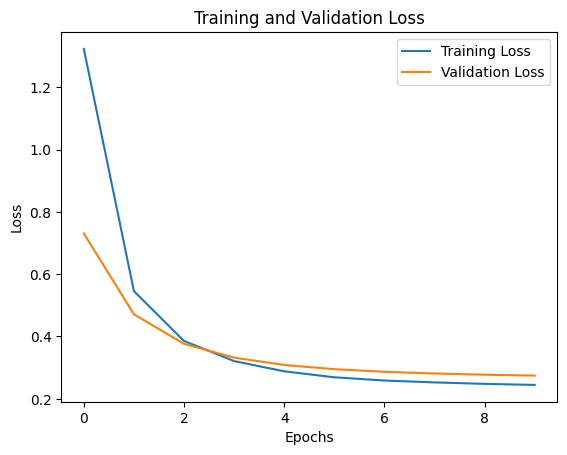

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.012043490173315297
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.3040 - mse: 26.1398 - val_loss: 0.7163 - val_mse: 20.1612
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 0.5318 - mse: 16.2142 - val_loss: 0.4616 - val_mse: 14.6681
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.3780 - mse: 12.4046 - val_loss: 0.3701 - val_mse: 11.9169
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 0.3145 - mse: 10.3372 - val_loss: 0.3281 - val_mse: 10.3377
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 0.2844 - mse: 9.1541 - val_loss: 0.3058 - val_mse: 9.3448
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 0.2676 - mse: 8.3673 - val_loss: 0.2931 -

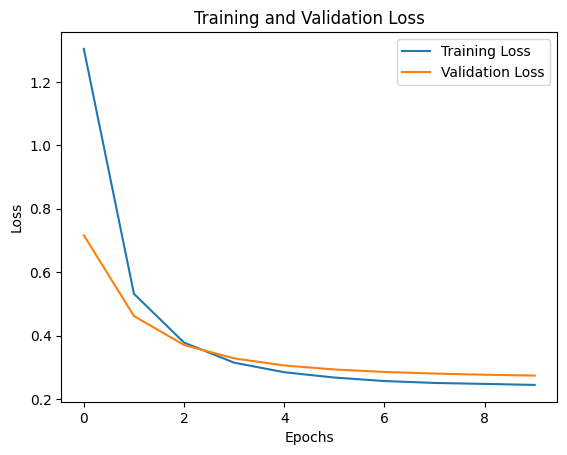

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.012852458701392733
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 0.4630 - mae: 2.7066 - val_loss: 0.2428 - val_mae: 2.0720
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2027 - mae: 1.9146 - val_loss: 0.2110 - val_mae: 1.9191
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1885 - mae: 1.8293 - val_loss: 0.1982 - val_mae: 1.8660
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1803 - mae: 1.7831 - val_loss: 0.1881 - val_mae: 1.8119
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1727 - mae: 1.7372 - val_loss: 0.1841 - val_mae: 1.7463
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1678 - mae: 1.7087 - val_loss: 0.1763 - val

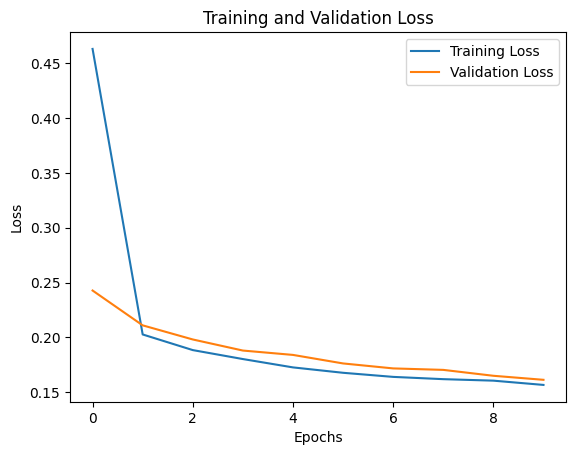

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.512832040635415
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 0.4888 - mse: 11.7803 - val_loss: 0.2479 - val_mse: 6.8573
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 0.2070 - mse: 5.8183 - val_loss: 0.2159 - val_mse: 5.8681
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1912 - mse: 5.3361 - val_loss: 0.2008 - val_mse: 5.3843
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1810 - mse: 5.0478 - val_loss: 0.1914 - val_mse: 5.2002
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1759 - mse: 4.8868 - val_loss: 0.1841 - val_mse: 4.9258
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 0.1713 - mse: 4.7437 - val_loss: 0.1797 - val_

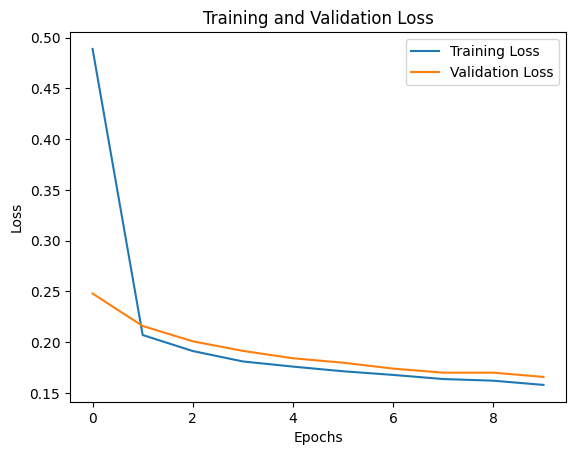

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4815106883271769
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.8307 - mae: 5.5926 - val_loss: 2.3554 - val_mae: 5.4667
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 2.0542 - mae: 5.2441 - val_loss: 1.8627 - val_mae: 5.1922
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 1.6738 - mae: 4.9960 - val_loss: 1.5680 - val_mae: 4.9760
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4275 - mae: 4.7911 - val_loss: 1.3648 - val_mae: 4.7930
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.2539 - mae: 4.6185 - val_loss: 1.2137 - val_mae: 4.6323
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1194 - mae: 4.4629 - val_loss: 1.0962 - val_m

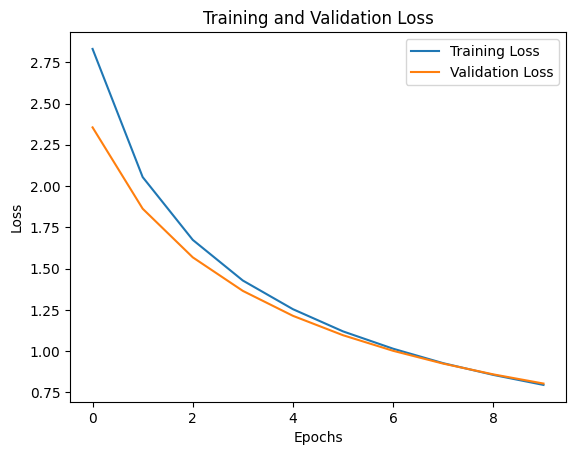

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.012660369264304583
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 11s 13ms/step - loss: 2.6992 - mse: 36.5882 - val_loss: 2.2083 - val_mse: 35.1094
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.9068 - mse: 32.2370 - val_loss: 1.7238 - val_mse: 31.7732
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5372 - mse: 29.4203 - val_loss: 1.4419 - val_mse: 29.3395
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3050 - mse: 27.2683 - val_loss: 1.2507 - val_mse: 27.4023
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1420 - mse: 25.5265 - val_loss: 1.1104 - val_mse: 25.7912
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0170 - mse: 24.0297 - val_loss

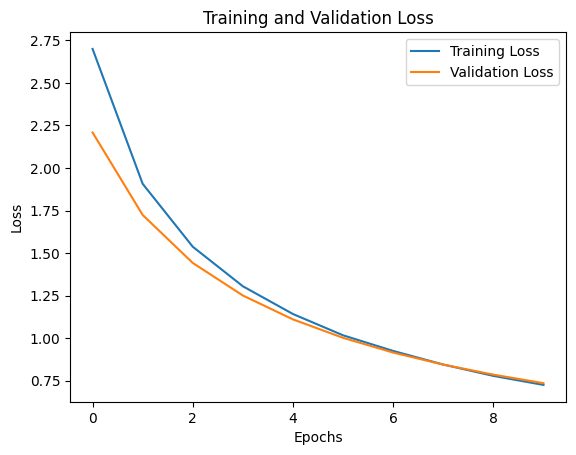

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.019221613571843266
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 3.4702 - mae: 5.8058 - val_loss: 3.4853 - val_mae: 5.8693
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4297 - mae: 5.7946 - val_loss: 3.4394 - val_mae: 5.8567
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 3.3836 - mae: 5.7814 - val_loss: 3.3910 - val_mae: 5.8431
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 3.3350 - mae: 5.7672 - val_loss: 3.3418 - val_mae: 5.8288
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 3.2874 - mae: 5.7527 - val_loss: 3.2923 - val_mae: 5.8141
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: 3.2393 - mae: 5.7381 - val_loss: 3.242

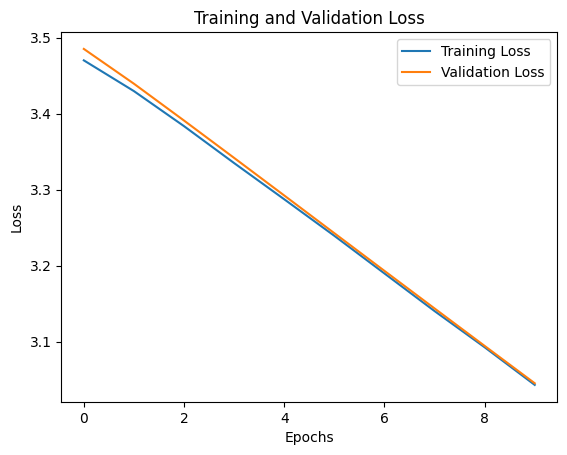

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 3.5191 - mse: 39.9244 - val_loss: 3.5419 - val_mse: 41.0669
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4879 - mse: 39.8196 - val_loss: 3.5014 - val_mse: 40.9293
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4422 - mse: 39.6621 - val_loss: 3.4510 - val_mse: 40.7546
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 3.3891 - mse: 39.4779 - val_loss: 3.3929 - val_mse: 40.5502
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 3.3304 - mse: 39.2731 - val_loss: 3.3301 - val_mse: 40.3259
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 3.2661 - mse: 39.0432 - val_

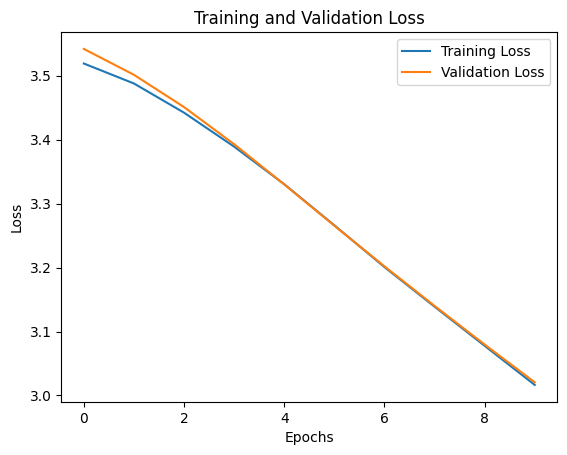

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 0.7763 - mae: 3.5056 - val_loss: 0.3169 - val_mae: 2.5710
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2567 - mae: 2.2819 - val_loss: 0.2731 - val_mae: 2.2716
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2349 - mae: 2.1186 - val_loss: 0.2582 - val_mae: 2.1723
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 0.2245 - mae: 2.0350 - val_loss: 0.2485 - val_mae: 2.1015
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2164 - mae: 1.9800 - val_loss: 0.2401 - val_mae: 2.0519
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2098 - mae: 1.9391 - val_loss: 0.2323 -

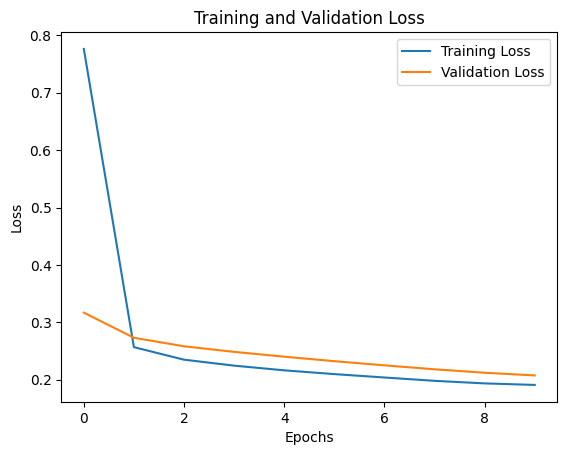

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3535703228587638
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 0.7621 - mse: 16.9551 - val_loss: 0.3096 - val_mse: 9.1332
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2529 - mse: 7.4198 - val_loss: 0.2693 - val_mse: 7.3994
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2315 - mse: 6.5620 - val_loss: 0.2550 - val_mse: 7.0368
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2221 - mse: 6.2989 - val_loss: 0.2451 - val_mse: 6.6971
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2149 - mse: 6.0793 - val_loss: 0.2364 - val_mse: 6.4266
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2070 - mse: 5.8439 - val_loss: 0.2287 - v

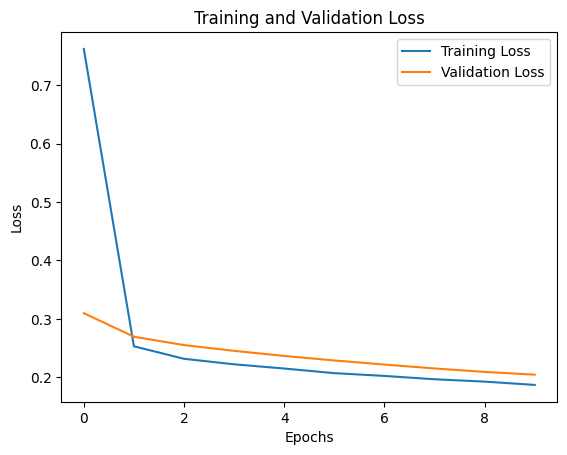

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3590565182509864
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 0.6485 - mae: 3.0789 - val_loss: 0.2691 - val_mae: 2.2445
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2234 - mae: 2.0346 - val_loss: 0.2390 - val_mae: 2.0462
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2053 - mae: 1.9201 - val_loss: 0.2192 - val_mae: 1.9476
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1930 - mae: 1.8619 - val_loss: 0.2064 - val_mae: 1.8831
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 0.1837 - mae: 1.8046 - val_loss: 0.1981 - val_mae: 1.8640
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 0.1773 - mae: 1.7671 - val_loss: 0.1895 - va

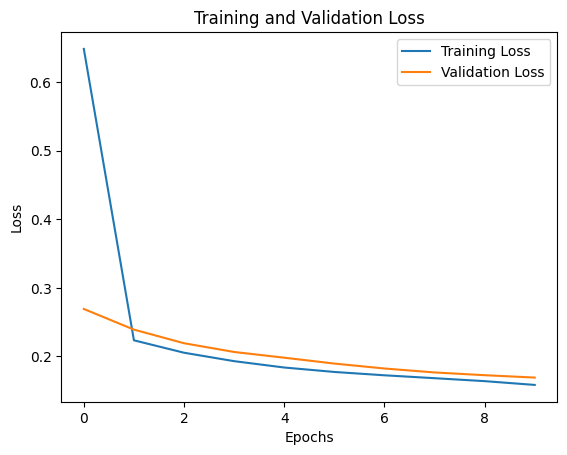

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.47620383239115305
Loss Function: mean_squared_logarithmic_error, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 0.6581 - mse: 14.1034 - val_loss: 0.2686 - val_mse: 7.2753
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 0.2249 - mse: 6.3583 - val_loss: 0.2407 - val_mse: 6.5798
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 0.2063 - mse: 5.8168 - val_loss: 0.2224 - val_mse: 5.9776
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1943 - mse: 5.4764 - val_loss: 0.2095 - val_mse: 5.7054
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1856 - mse: 5.2126 - val_loss: 0.2001 - val_mse: 5.4326
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1808 - mse: 5.0488 - val_loss: 0.1927 - 

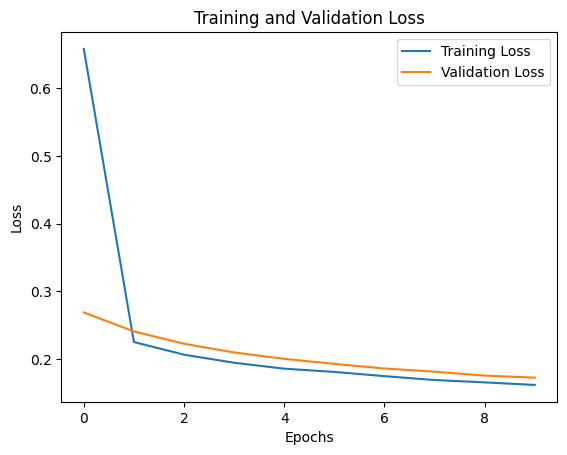

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4715713678931993
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 0.6115 - mae: 2.9850 - val_loss: 0.2648 - val_mae: 2.2160
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2227 - mae: 2.0194 - val_loss: 0.2371 - val_mae: 2.0293
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2047 - mae: 1.9147 - val_loss: 0.2180 - val_mae: 1.9297
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1904 - mae: 1.8419 - val_loss: 0.2065 - val_mae: 1.9208
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1825 - mae: 1.8031 - val_loss: 0.1947 - val_mae: 1.8225
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1765 - mae: 1.7572 - val_loss: 0.1875 - va

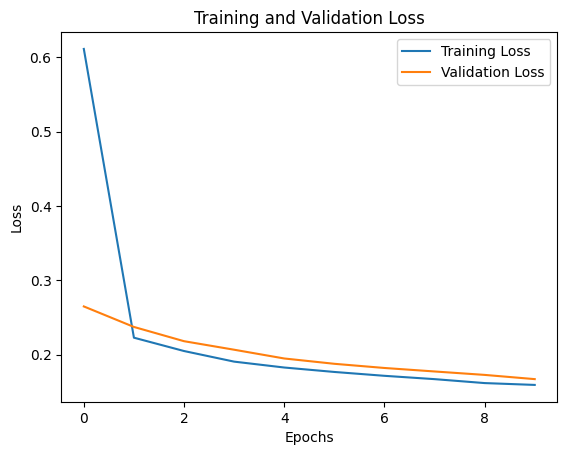

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.49763067501142877
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 0.6200 - mse: 13.3784 - val_loss: 0.2670 - val_mse: 7.2423
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2220 - mse: 6.2421 - val_loss: 0.2383 - val_mse: 6.5111
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 0.2049 - mse: 5.7783 - val_loss: 0.2202 - val_mse: 5.8049
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1915 - mse: 5.3576 - val_loss: 0.2081 - val_mse: 5.7524
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1839 - mse: 5.1556 - val_loss: 0.1991 - val_mse: 5.4671
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1776 - mse: 4.9661 - val_loss: 0.1899 - v

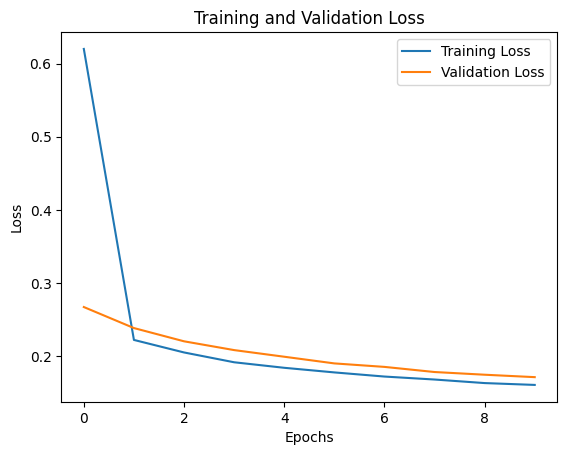

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.49588726103340974
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.3103 - mae: 4.5307 - val_loss: 0.7175 - val_mae: 3.9059
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.5332 - mae: 3.4343 - val_loss: 0.4618 - val_mae: 3.2705
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.3780 - mae: 2.9778 - val_loss: 0.3707 - val_mae: 2.9399
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 0.3150 - mae: 2.7109 - val_loss: 0.3284 - val_mae: 2.7124
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2842 - mae: 2.5311 - val_loss: 0.3063 - val_mae: 2.5625
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2672 - mae: 2.4114 - val_loss: 0.2936 - val_

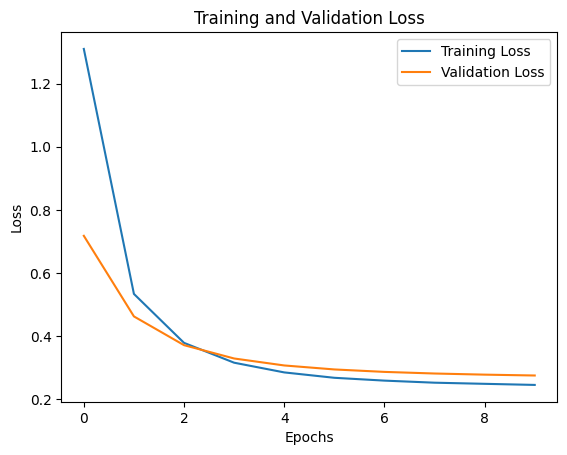

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.010696244819769607
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.3215 - mse: 26.3337 - val_loss: 0.7297 - val_mse: 20.4106
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.5421 - mse: 16.4413 - val_loss: 0.4686 - val_mse: 14.8711
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.3826 - mse: 12.5722 - val_loss: 0.3738 - val_mse: 12.0643
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.3174 - mse: 10.4796 - val_loss: 0.3298 - val_mse: 10.4369
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2857 - mse: 9.2429 - val_loss: 0.3066 - val_mse: 9.4203
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2683 - mse: 8.4451 - val_loss: 0.293

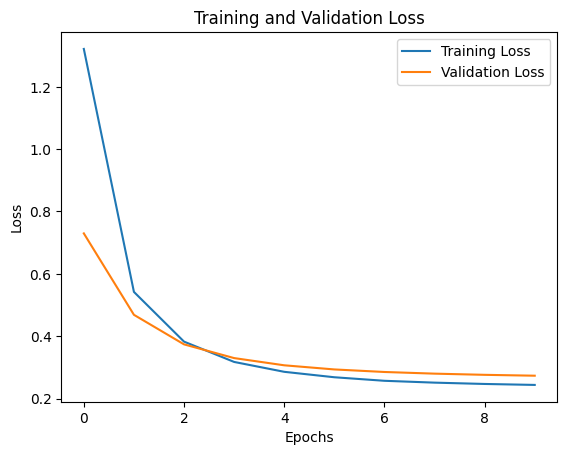

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.01329719601493462
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 0.4919 - mae: 2.7888 - val_loss: 0.2485 - val_mae: 2.0740
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2076 - mae: 1.9340 - val_loss: 0.2161 - val_mae: 1.9139
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1893 - mae: 1.8378 - val_loss: 0.2012 - val_mae: 1.8612
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1811 - mae: 1.7899 - val_loss: 0.1918 - val_mae: 1.8135
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1777 - mae: 1.7577 - val_loss: 0.1850 - val_mae: 1.7632
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1719 - mae: 1.7302 - val_loss: 0.1813 -

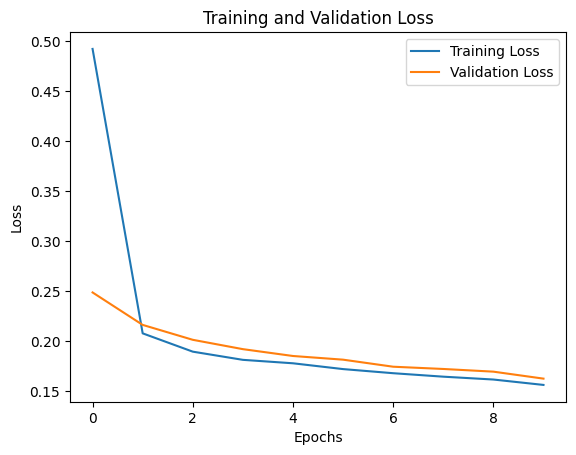

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.49672320175241624
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 0.4898 - mse: 11.8532 - val_loss: 0.2477 - val_mse: 6.8090
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2055 - mse: 5.8144 - val_loss: 0.2145 - val_mse: 5.8255
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1900 - mse: 5.3226 - val_loss: 0.2012 - val_mse: 5.2734
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1812 - mse: 5.0339 - val_loss: 0.1962 - val_mse: 5.7255
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1754 - mse: 4.8842 - val_loss: 0.1862 - val_mse: 5.1615
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1715 - mse: 4.7241 - val_loss: 0.1803 -

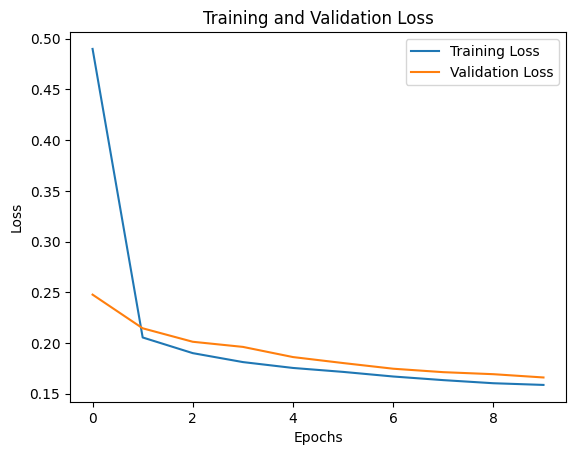

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4973034656186889
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.6548 - mae: 5.5268 - val_loss: 2.2084 - val_mae: 5.3976
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.9163 - mae: 5.1646 - val_loss: 1.7418 - val_mae: 5.1133
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5573 - mae: 4.9083 - val_loss: 1.4640 - val_mae: 4.8903
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3281 - mae: 4.6990 - val_loss: 1.2738 - val_mae: 4.7028
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1660 - mae: 4.5218 - val_loss: 1.1331 - val_mae: 4.5391
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0396 - mae: 4.3609 - val_loss: 1.0242 - va

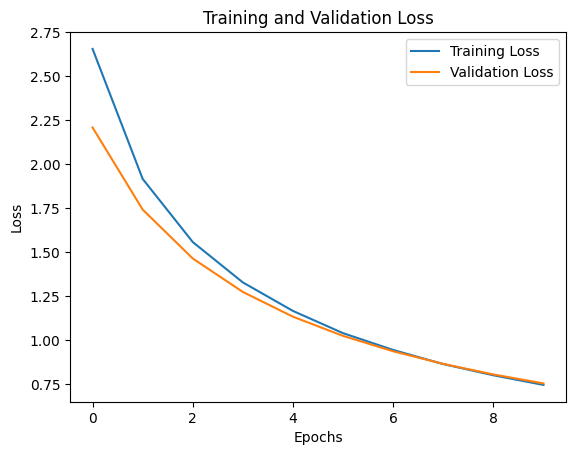

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.017822465528982034
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.5951 - mse: 36.1067 - val_loss: 2.1380 - val_mse: 34.6710
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8502 - mse: 31.8402 - val_loss: 1.6759 - val_mse: 31.3787
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.4974 - mse: 29.0613 - val_loss: 1.4051 - val_mse: 28.9745
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2727 - mse: 26.9288 - val_loss: 1.2211 - val_mse: 27.0634
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1151 - mse: 25.2091 - val_loss: 1.0858 - val_mse: 25.4745
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.9964 - mse: 23.7567 - val_loss

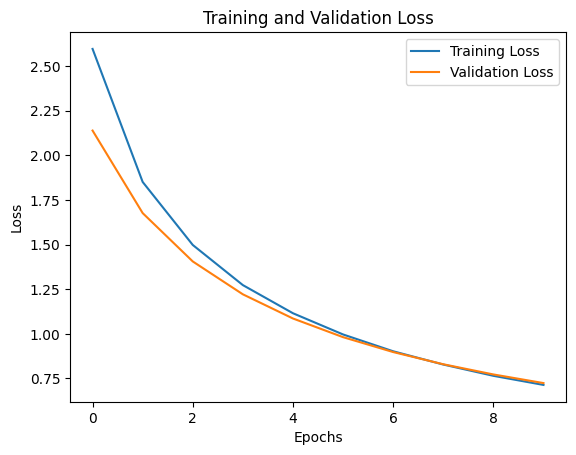

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.01940833460673974
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 3.5851 - mae: 5.8953 - val_loss: 3.6204 - val_mae: 5.9619
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 3.5833 - mae: 5.8918 - val_loss: 3.6192 - val_mae: 5.9574
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 3.5790 - mae: 5.8861 - val_loss: 3.6122 - val_mae: 5.9502
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 3.5616 - mae: 5.8760 - val_loss: 3.5824 - val_mae: 5.9380
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 3.5267 - mae: 5.8616 - val_loss: 3.5451 - val_mae: 5.9225
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4836 - mae: 5.8433 - val_loss: 3.503

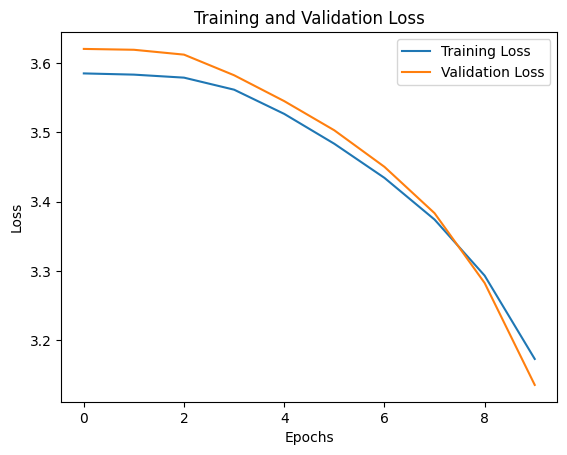

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 3.5510 - mse: 40.3706 - val_loss: 3.5798 - val_mse: 41.4507
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 3.5105 - mse: 40.1723 - val_loss: 3.5185 - val_mse: 41.2012
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4373 - mse: 39.8929 - val_loss: 3.4266 - val_mse: 40.8841
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 3.3491 - mse: 39.5839 - val_loss: 3.3335 - val_mse: 40.5553
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 3.2594 - mse: 39.2599 - val_loss: 3.2468 - val_mse: 40.2358
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 3.1792 - mse: 38.9607 - val_

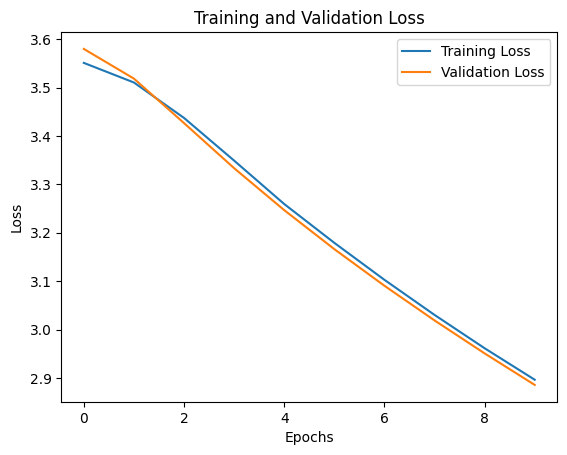

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.0
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 0.8221 - mae: 3.5732 - val_loss: 0.3183 - val_mae: 2.5796
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2584 - mae: 2.2868 - val_loss: 0.2736 - val_mae: 2.2723
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2343 - mae: 2.1094 - val_loss: 0.2581 - val_mae: 2.1722
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2236 - mae: 2.0256 - val_loss: 0.2483 - val_mae: 2.1047
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2164 - mae: 1.9801 - val_loss: 0.2401 - val_mae: 2.0529
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2101 - mae: 1.9462 - val_loss: 0.2319 - val_mae: 2.0062
Epo

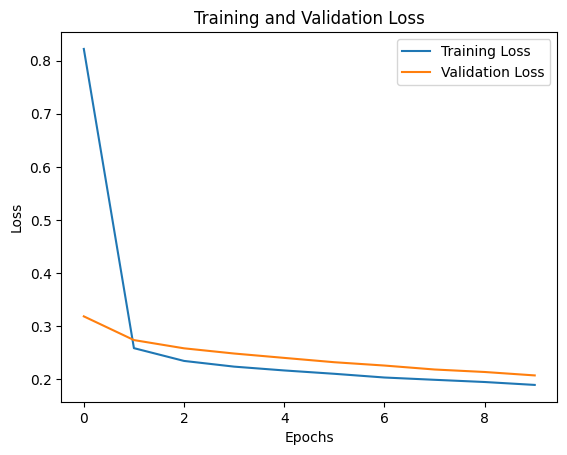

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3511316459024141
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 12ms/step - loss: 0.8158 - mse: 17.8247 - val_loss: 0.3162 - val_mse: 9.4606
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 0.2560 - mse: 7.5260 - val_loss: 0.2726 - val_mse: 7.4867
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.2337 - mse: 6.6286 - val_loss: 0.2575 - val_mse: 7.0383
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2247 - mse: 6.3558 - val_loss: 0.2482 - val_mse: 6.7403
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2170 - mse: 6.1326 - val_loss: 0.2394 - val_mse: 6.4542
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2104 - mse: 5.9212 - val_loss: 0.2315 - val

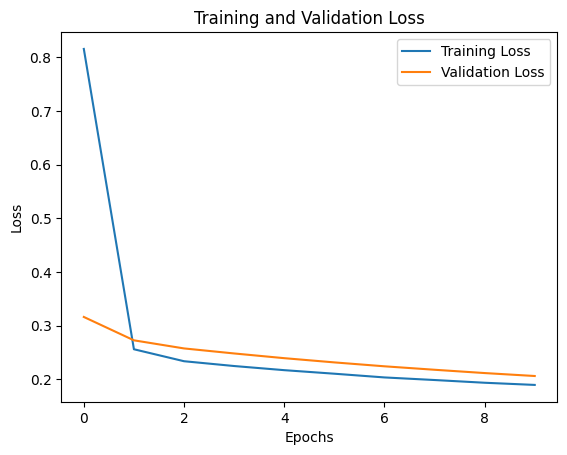

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.35777179193211084
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 0.6756 - mae: 3.1070 - val_loss: 0.2681 - val_mae: 2.2362
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2235 - mae: 2.0286 - val_loss: 0.2397 - val_mae: 2.0599
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2056 - mae: 1.9201 - val_loss: 0.2214 - val_mae: 1.9695
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1932 - mae: 1.8661 - val_loss: 0.2082 - val_mae: 1.8798
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 0.1851 - mae: 1.8181 - val_loss: 0.1992 - val_mae: 1.8182
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1794 - mae: 1.7757 - val_loss: 0.1918 - va

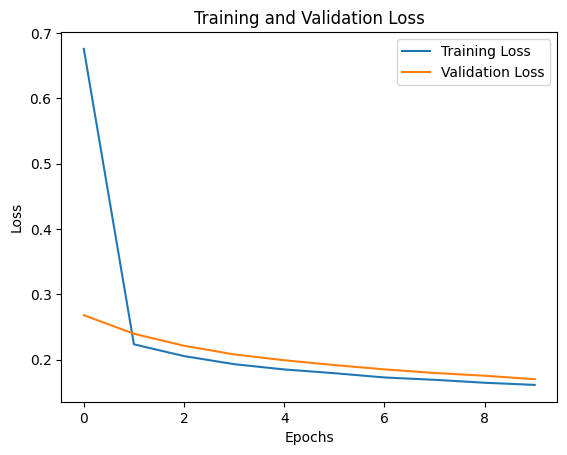

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.48095152651556017
Loss Function: mean_squared_logarithmic_error, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 0.6715 - mse: 14.2712 - val_loss: 0.2669 - val_mse: 7.2390
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 0.2235 - mse: 6.2787 - val_loss: 0.2396 - val_mse: 6.5556
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 0.2044 - mse: 5.7747 - val_loss: 0.2209 - val_mse: 6.0461
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1928 - mse: 5.4291 - val_loss: 0.2093 - val_mse: 5.7907
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 0.1846 - mse: 5.1668 - val_loss: 0.1995 - val_mse: 5.4943
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 0.1788 - mse: 4.9843 - val_loss: 0.1915 - v

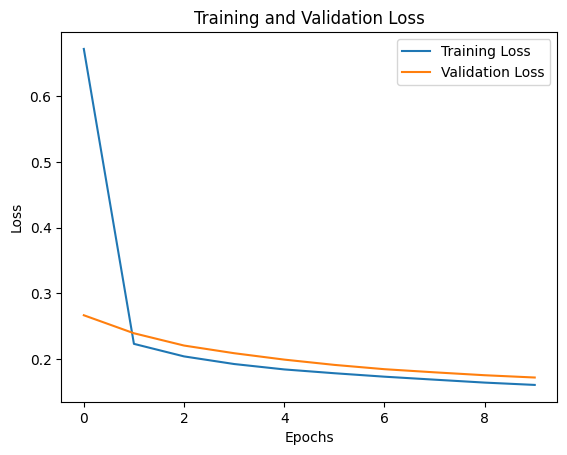

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.48874872921823187
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.6504 - mae: 4.9753 - val_loss: 1.5653 - val_mae: 4.9914
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5318 - mae: 4.9053 - val_loss: 1.5633 - val_mae: 4.9899
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5307 - mae: 4.9044 - val_loss: 1.5628 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5303 - mae: 4.9041 - val_loss: 1.5625 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5302 - mae: 4.9040 - val_loss: 1.5624 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5301 - mae: 4.9039 - val_loss: 1.5624 - val_ma

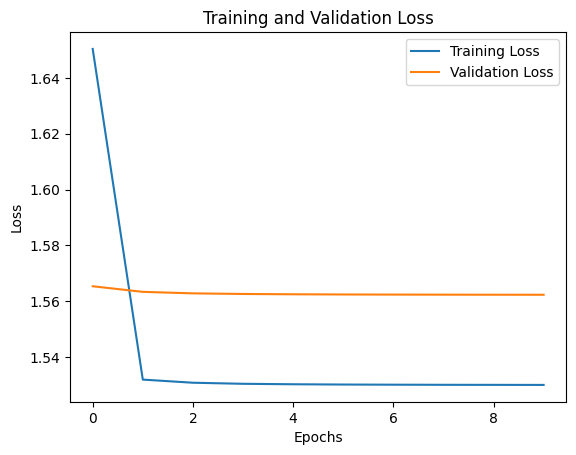

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.6445 - mse: 30.2168 - val_loss: 1.5650 - val_mse: 30.5428
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5317 - mse: 29.4901 - val_loss: 1.5632 - val_mse: 30.5272
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5307 - mse: 29.4812 - val_loss: 1.5627 - val_mse: 30.5229
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5303 - mse: 29.4782 - val_loss: 1.5625 - val_mse: 30.5211
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5302 - mse: 29.4767 - val_loss: 1.5624 - val_mse: 30.5201
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5301 - mse: 29.4760 - val_loss: 1.5

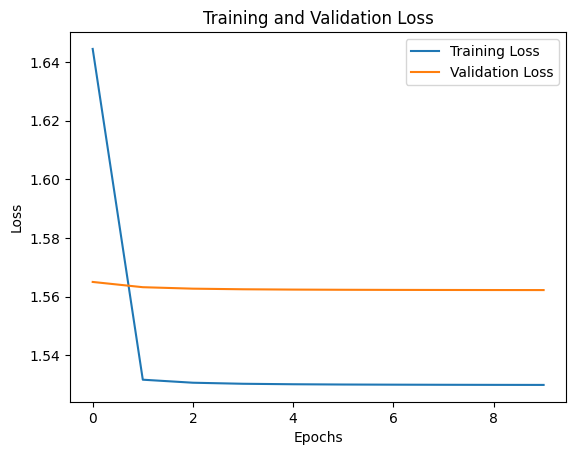

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.9261 - mae: 5.1589 - val_loss: 1.6838 - val_mae: 5.0816
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6139 - mae: 4.9697 - val_loss: 1.6217 - val_mae: 5.0354
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5778 - mae: 4.9420 - val_loss: 1.6009 - val_mae: 5.0194
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5631 - mae: 4.9304 - val_loss: 1.5907 - val_mae: 5.0114
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5552 - mae: 4.9242 - val_loss: 1.5846 - val_mae: 5.0067
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5502 - mae: 4.9201 - val_loss: 1.5806 - val_ma

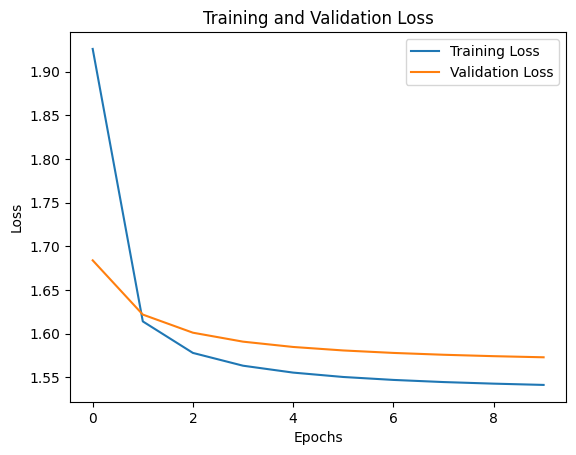

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.9149 - mse: 32.1696 - val_loss: 1.6775 - val_mse: 31.4764
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.6093 - mse: 30.1327 - val_loss: 1.6185 - val_mse: 30.9950
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5752 - mse: 29.8537 - val_loss: 1.5989 - val_mse: 30.8307
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5613 - mse: 29.7392 - val_loss: 1.5892 - val_mse: 30.7487
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5538 - mse: 29.6765 - val_loss: 1.5834 - val_mse: 30.6999
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5492 - mse: 29.6380 - val_loss: 1.57

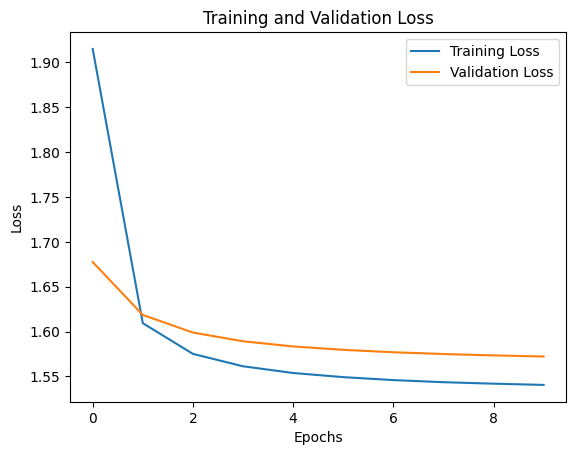

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.6158 - mae: 4.9576 - val_loss: 1.5629 - val_mae: 4.9896
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mae: 4.9040 - val_loss: 1.5623 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mae: 4.9038 - val_loss: 1.5622 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mae: 4.9038 - val_loss: 1.5622 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5299 - mae: 4.9037 - val_loss: 1.5622 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mae: 4.9037 - val_loss: 1.5622 - va

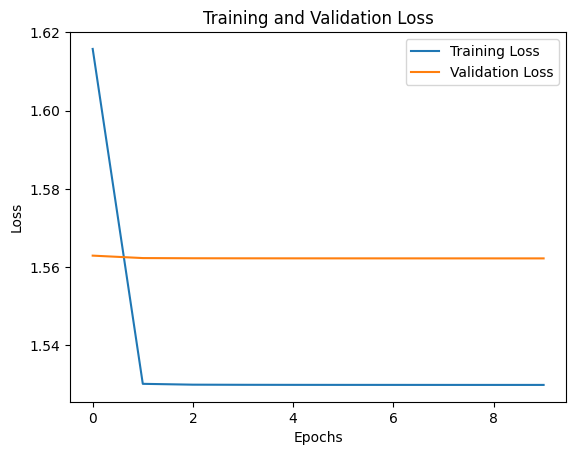

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1.6162 - mse: 30.0699 - val_loss: 1.5629 - val_mse: 30.5244
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mse: 29.4765 - val_loss: 1.5623 - val_mse: 30.5189
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mse: 29.4747 - val_loss: 1.5622 - val_mse: 30.5185
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mse: 29.4744 - val_loss: 1.5622 - val_mse: 30.5184
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mse: 29.4743 - val_loss: 1.5622 - val_mse: 30.5183
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5299 - mse: 29.4743 - val_loss: 

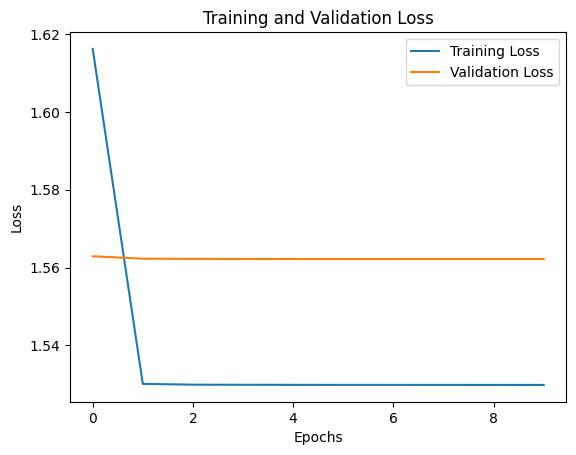

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 2.8554 - mae: 5.6044 - val_loss: 2.4343 - val_mae: 5.5055
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 2.2117 - mae: 5.3371 - val_loss: 2.1035 - val_mae: 5.3428
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9862 - mae: 5.2154 - val_loss: 1.9492 - val_mae: 5.2548
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8692 - mae: 5.1447 - val_loss: 1.8604 - val_mae: 5.2001
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7986 - mae: 5.0993 - val_loss: 1.8031 - val_mae: 5.1629
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7515 - mae: 5.0677 - val_loss: 1.7631 - va

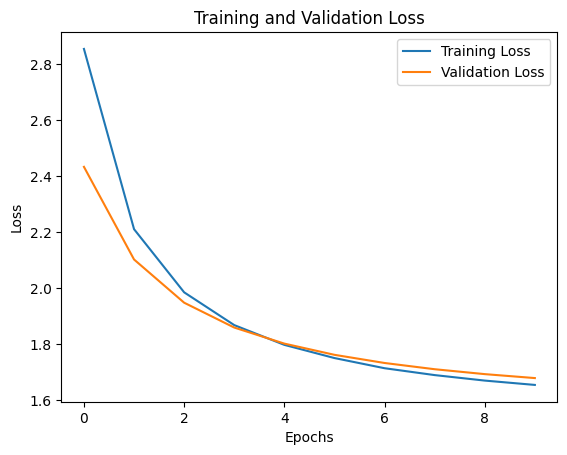

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.8421 - mse: 37.3067 - val_loss: 2.4436 - val_mse: 36.4634
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 2.2215 - mse: 34.2812 - val_loss: 2.1139 - val_mse: 34.5595
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.9945 - mse: 32.9032 - val_loss: 1.9580 - val_mse: 33.5416
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 1.8758 - mse: 32.1142 - val_loss: 1.8678 - val_mse: 32.9128
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 1.8037 - mse: 31.6075 - val_loss: 1.8094 - val_mse: 32.4888
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7561 - mse: 31.2612 - val_loss: 

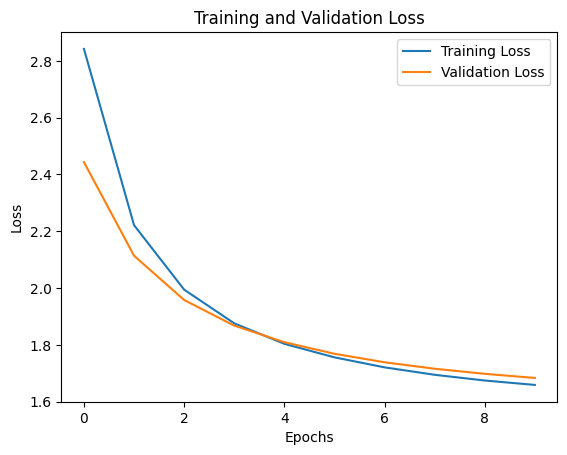

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 3.5390 - mae: 5.8371 - val_loss: 3.5678 - val_mae: 5.8966
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 3.5044 - mae: 5.8214 - val_loss: 3.5126 - val_mae: 5.8776
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 3.4374 - mae: 5.7989 - val_loss: 3.4266 - val_mae: 5.8536
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 3.3525 - mae: 5.7738 - val_loss: 3.3374 - val_mae: 5.8287
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 3.2647 - mae: 5.7480 - val_loss: 3.2532 - val_mae: 5.8043
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 3.1849 - mae: 5.7239 - val_loss: 3.1749 -

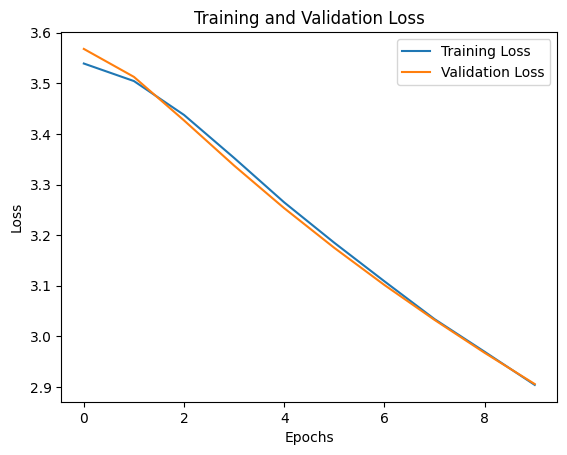

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -3.816526833366751e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 3.5652 - mse: 40.4702 - val_loss: 3.5982 - val_mse: 41.5765
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 3.5413 - mse: 40.3037 - val_loss: 3.5658 - val_mse: 41.3651
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 3.4966 - mse: 40.0420 - val_loss: 3.5027 - val_mse: 41.0573
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 3.4251 - mse: 39.7071 - val_loss: 3.4159 - val_mse: 40.6816
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 3.3343 - mse: 39.3102 - val_loss: 3.3190 - val_mse: 40.2705
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 3.2308 - mse: 38.8870 - val_l

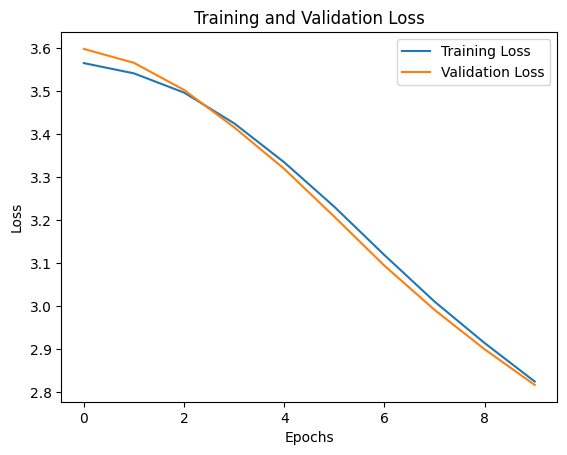

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.00022379250641546555
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.7086 - mae: 5.0145 - val_loss: 1.5773 - val_mae: 5.0008
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5395 - mae: 4.9114 - val_loss: 1.5684 - val_mae: 4.9938
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5347 - mae: 4.9075 - val_loss: 1.5658 - val_mae: 4.9918
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5329 - mae: 4.9061 - val_loss: 1.5646 - val_mae: 4.9908
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5319 - mae: 4.9054 - val_loss: 1.5639 - val_mae: 4.9903
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5314 - mae: 4.9049 - val_loss: 1.5634

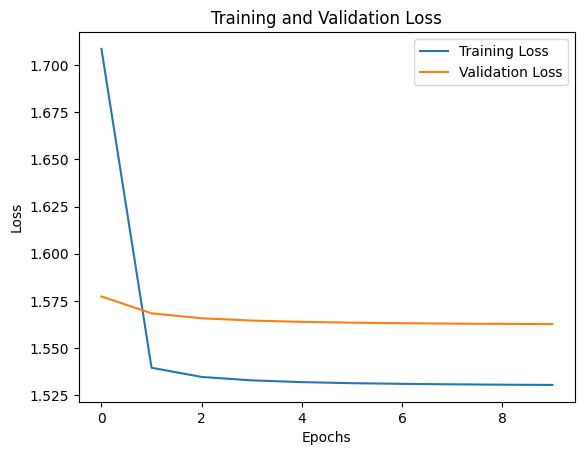

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.7013 - mse: 30.6495 - val_loss: 1.5772 - val_mse: 30.6476
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5395 - mse: 29.5564 - val_loss: 1.5682 - val_mse: 30.5706
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5345 - mse: 29.5141 - val_loss: 1.5656 - val_mse: 30.5478
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5327 - mse: 29.4987 - val_loss: 1.5644 - val_mse: 30.5375
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5318 - mse: 29.4911 - val_loss: 1.5638 - val_mse: 30.5318
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5313 - mse: 29.4864 - val_loss:

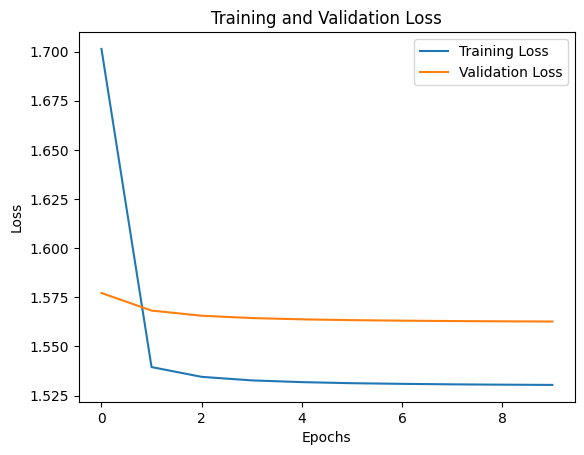

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1.7011 - mae: 5.0047 - val_loss: 1.5667 - val_mae: 4.9925
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5326 - mae: 4.9059 - val_loss: 1.5637 - val_mae: 4.9902
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5310 - mae: 4.9046 - val_loss: 1.5630 - val_mae: 4.9896
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5305 - mae: 4.9042 - val_loss: 1.5627 - val_mae: 4.9894
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5303 - mae: 4.9041 - val_loss: 1.5625 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5301 - mae: 4.9040 - val_loss: 1.5624 - 

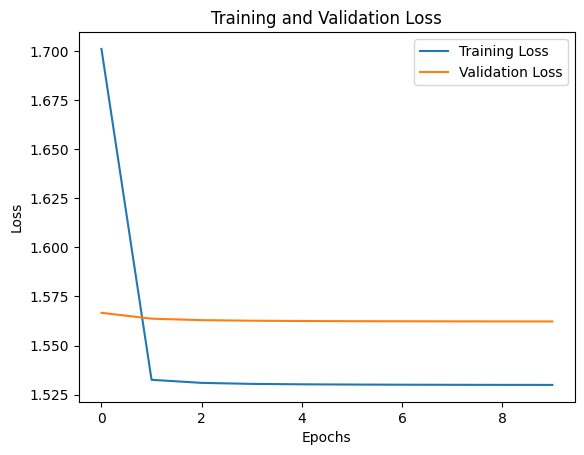

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.6848 - mse: 30.4862 - val_loss: 1.5661 - val_mse: 30.5523
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5322 - mse: 29.4947 - val_loss: 1.5635 - val_mse: 30.5297
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5309 - mse: 29.4828 - val_loss: 1.5629 - val_mse: 30.5239
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5304 - mse: 29.4790 - val_loss: 1.5626 - val_mse: 30.5217
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5302 - mse: 29.4772 - val_loss: 1.5625 - val_mse: 30.5205
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mse: 29.4763 - val_loss

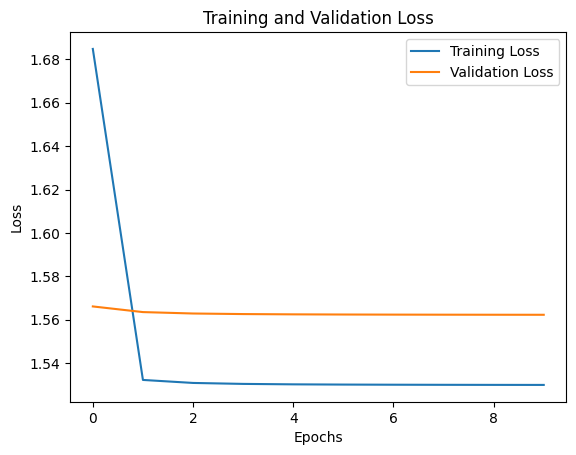

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.6194 - mae: 4.9669 - val_loss: 1.5661 - val_mae: 4.9921
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5322 - mae: 4.9056 - val_loss: 1.5636 - val_mae: 4.9901
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5309 - mae: 4.9045 - val_loss: 1.5629 - val_mae: 4.9896
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5305 - mae: 4.9042 - val_loss: 1.5626 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5302 - mae: 4.9040 - val_loss: 1.5625 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5301 - mae: 4.9040 - val_loss: 1.5624 

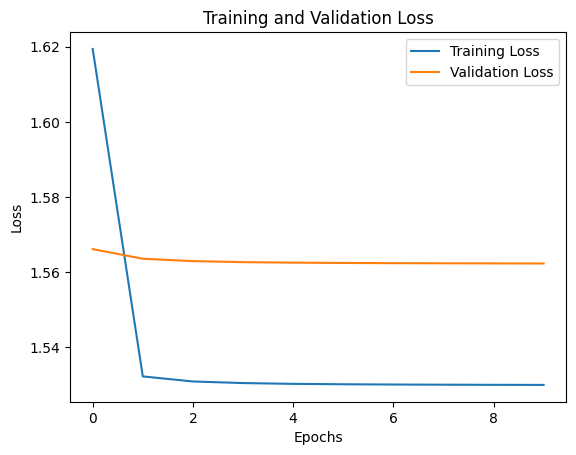

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.6147 - mse: 30.1164 - val_loss: 1.5657 - val_mse: 30.5480
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5319 - mse: 29.4920 - val_loss: 1.5634 - val_mse: 30.5284
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5308 - mse: 29.4819 - val_loss: 1.5628 - val_mse: 30.5236
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5304 - mse: 29.4786 - val_loss: 1.5626 - val_mse: 30.5215
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5302 - mse: 29.4771 - val_loss: 1.5625 - val_mse: 30.5205
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mse: 29.4762 - val_los

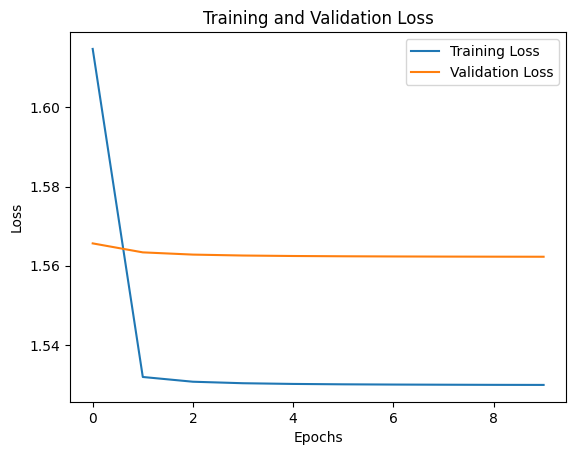

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.0946 - mae: 5.2795 - val_loss: 1.9842 - val_mae: 5.2788
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8632 - mae: 5.1439 - val_loss: 1.8251 - val_mae: 5.1798
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 1.7472 - mae: 5.0669 - val_loss: 1.7424 - val_mae: 5.1237
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6843 - mae: 5.0226 - val_loss: 1.6950 - val_mae: 5.0900
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6465 - mae: 4.9947 - val_loss: 1.6652 - val_mae: 5.0682
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6222 - mae: 4.9764 - val_loss: 1.6453 - val

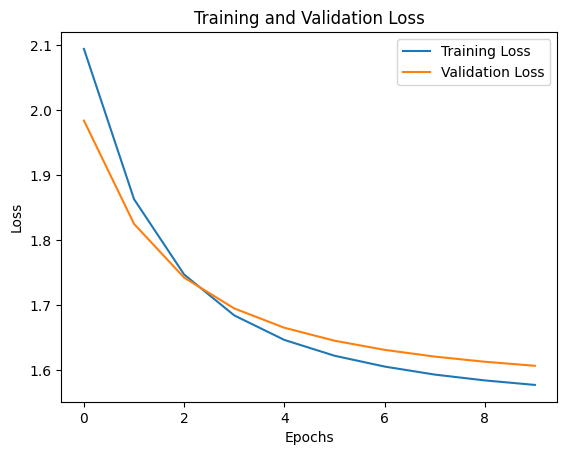

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.0691 - mse: 33.3781 - val_loss: 1.9571 - val_mse: 33.5409
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8389 - mse: 31.8629 - val_loss: 1.8037 - val_mse: 32.4491
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7287 - mse: 31.0623 - val_loss: 1.7266 - val_mse: 31.8630
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6707 - mse: 30.6188 - val_loss: 1.6830 - val_mse: 31.5200
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6361 - mse: 30.3469 - val_loss: 1.6560 - val_mse: 31.3026
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6139 - mse: 30.1700 - val_loss: 1

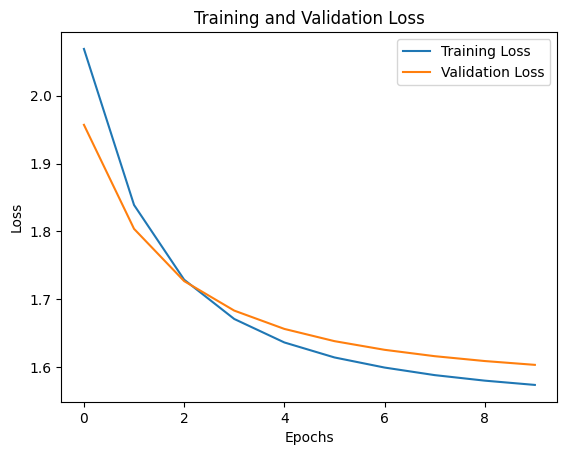

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.6099 - mae: 4.9622 - val_loss: 1.5655 - val_mae: 4.9916
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5312 - mae: 4.9048 - val_loss: 1.5626 - val_mae: 4.9893
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mae: 4.9039 - val_loss: 1.5623 - val_mae: 4.9891
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5300 - mae: 4.9038 - val_loss: 1.5623 - val_mae: 4.9891
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5299 - mae: 4.9038 - val_loss: 1.5623 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5299 - mae: 4.9038 - val_loss: 1.562

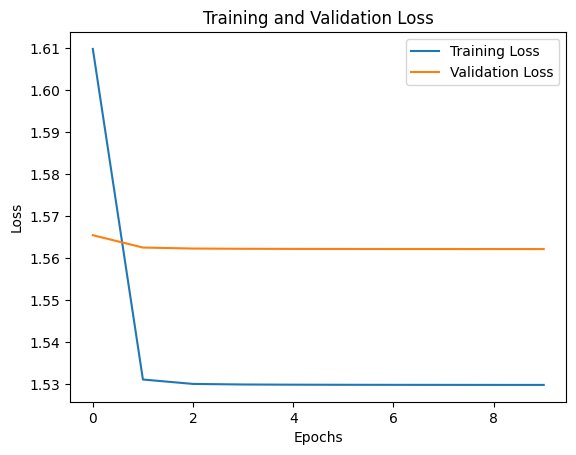

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1.6051 - mse: 30.0555 - val_loss: 1.5652 - val_mse: 30.5440
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5310 - mse: 29.4844 - val_loss: 1.5626 - val_mse: 30.5214
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5301 - mse: 29.4763 - val_loss: 1.5623 - val_mse: 30.5194
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5300 - mse: 29.4752 - val_loss: 1.5623 - val_mse: 30.5189
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5299 - mse: 29.4748 - val_loss: 1.5623 - val_mse: 30.5187
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5299 - mse: 29.4746 - val_l

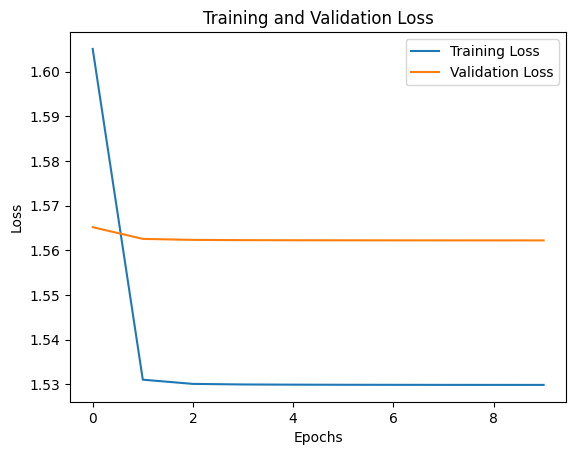

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.2406 - mae: 5.3579 - val_loss: 2.2471 - val_mae: 5.4217
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.1908 - mae: 5.3326 - val_loss: 2.2012 - val_mae: 5.3984
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2.1470 - mae: 5.3097 - val_loss: 2.1591 - val_mae: 5.3765
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 2.1062 - mae: 5.2877 - val_loss: 2.1197 - val_mae: 5.3554
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 2.0680 - mae: 5.2665 - val_loss: 2.0827 - val_mae: 5.3351
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 2.0323 - mae: 5.2463 - val_loss: 2.0481 -

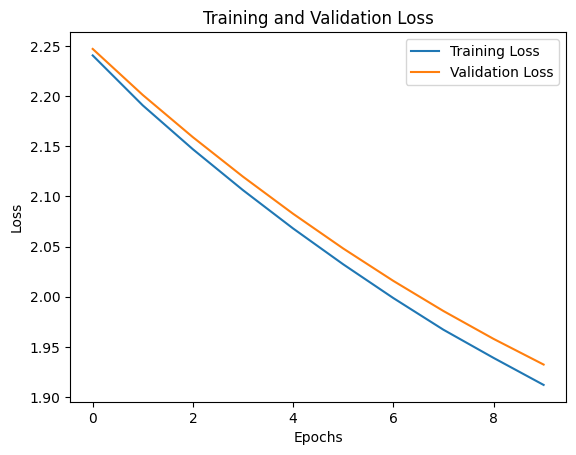

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.2488 - mse: 34.4601 - val_loss: 2.2536 - val_mse: 35.4086
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.1966 - mse: 34.1608 - val_loss: 2.2053 - val_mse: 35.1243
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 2.1502 - mse: 33.8880 - val_loss: 2.1611 - val_mse: 34.8577
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 2.1075 - mse: 33.6308 - val_loss: 2.1198 - val_mse: 34.6032
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 2.0674 - mse: 33.3834 - val_loss: 2.0812 - val_mse: 34.3600
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 2.0304 - mse: 33.1512 - val_los

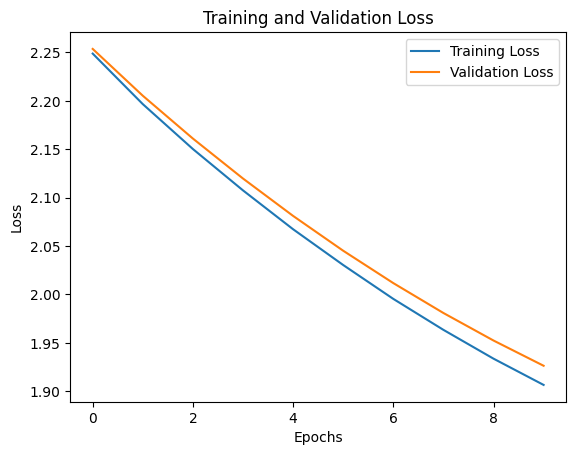

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.2800 - mae: 5.3771 - val_loss: 2.3098 - val_mae: 5.4519
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 2.2741 - mae: 5.3742 - val_loss: 2.3037 - val_mae: 5.4490
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 2.2679 - mae: 5.3712 - val_loss: 2.2973 - val_mae: 5.4459
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 2.2614 - mae: 5.3680 - val_loss: 2.2907 - val_mae: 5.4427
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 2.2545 - mae: 5.3645 - val_loss: 2.2837 - val_mae: 5.4393
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 2.2476 - mae: 5.3611 - val_loss: 2.

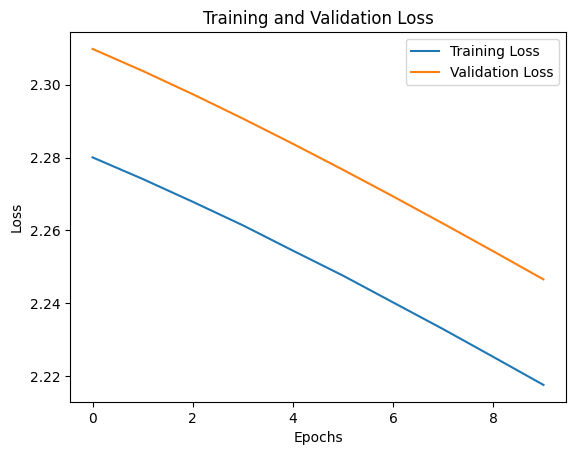

122/122 [==============================] - 8s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 17ms/step - loss: 2.2651 - mse: 34.5543 - val_loss: 2.2956 - val_mse: 35.6528
Epoch 2/10
128/128 [==============================] - 2s 14ms/step - loss: 2.2606 - mse: 34.5292 - val_loss: 2.2905 - val_mse: 35.6240
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 2.2552 - mse: 34.4985 - val_loss: 2.2851 - val_mse: 35.5930
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 2.2497 - mse: 34.4679 - val_loss: 2.2794 - val_mse: 35.5604
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 2.2437 - mse: 34.4336 - val_loss: 2.2734 - val_mse: 35.5263
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 2.2377 - mse: 34.3993 - v

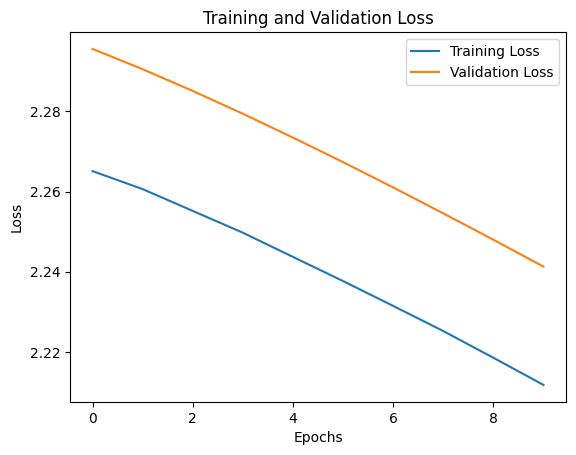

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.00019587412401445015
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 1.6514 - mae: 4.9905 - val_loss: 1.5742 - val_mae: 4.9984
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 1.5374 - mae: 4.9097 - val_loss: 1.5669 - val_mae: 4.9927
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5335 - mae: 4.9066 - val_loss: 1.5649 - val_mae: 4.9911
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5321 - mae: 4.9055 - val_loss: 1.5640 - val_mae: 4.9904
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5314 - mae: 4.9050 - val_loss: 1.5635 - val_mae: 4.9900
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5310 - mae: 4.9047 - val_loss: 1.5

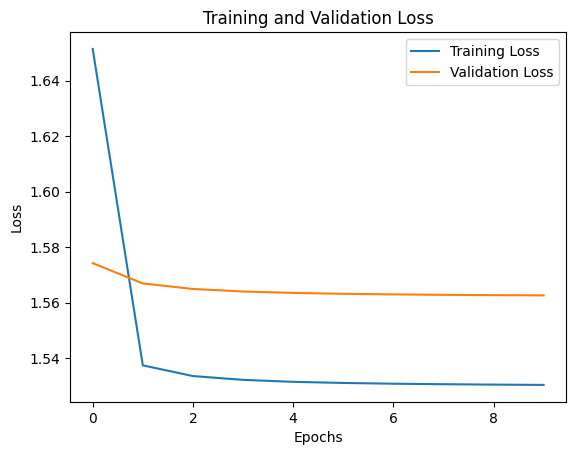

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 1.6545 - mse: 30.4255 - val_loss: 1.5744 - val_mse: 30.6237
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5375 - mse: 29.5395 - val_loss: 1.5669 - val_mse: 30.5594
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5336 - mse: 29.5058 - val_loss: 1.5649 - val_mse: 30.5418
Epoch 4/10
128/128 [==============================] - 1s 12ms/step - loss: 1.5321 - mse: 29.4938 - val_loss: 1.5640 - val_mse: 30.5339
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 1.5315 - mse: 29.4879 - val_loss: 1.5635 - val_mse: 30.5294
Epoch 6/10
128/128 [==============================] - 2s 13ms/step - loss: 1.5310 - mse: 29.4843 - val

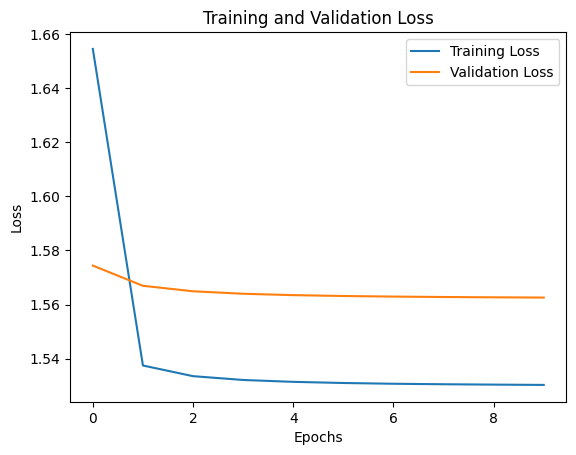

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 6s 16ms/step - loss: 1.6246 - mae: 4.9697 - val_loss: 1.5659 - val_mae: 4.9919
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 1.5320 - mae: 4.9055 - val_loss: 1.5634 - val_mae: 4.9900
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 1.5308 - mae: 4.9045 - val_loss: 1.5628 - val_mae: 4.9895
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 1.5304 - mae: 4.9042 - val_loss: 1.5626 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 1.5302 - mae: 4.9040 - val_loss: 1.5625 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5301 - mae: 4.9039 - val_loss: 1.562

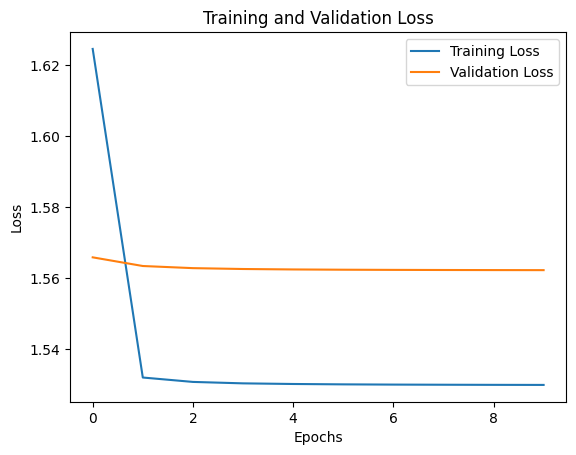

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_logarithmic_error, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 1.6373 - mse: 30.2807 - val_loss: 1.5667 - val_mse: 30.5567
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5325 - mse: 29.4970 - val_loss: 1.5637 - val_mse: 30.5311
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.5310 - mse: 29.4839 - val_loss: 1.5630 - val_mse: 30.5250
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 1.5305 - mse: 29.4798 - val_loss: 1.5627 - val_mse: 30.5224
Epoch 5/10
128/128 [==============================] - 2s 14ms/step - loss: 1.5303 - mse: 29.4779 - val_loss: 1.5625 - val_mse: 30.5211
Epoch 6/10
128/128 [==============================] - 2s 14ms/step - loss: 1.5302 - mse: 29.4769 - val_

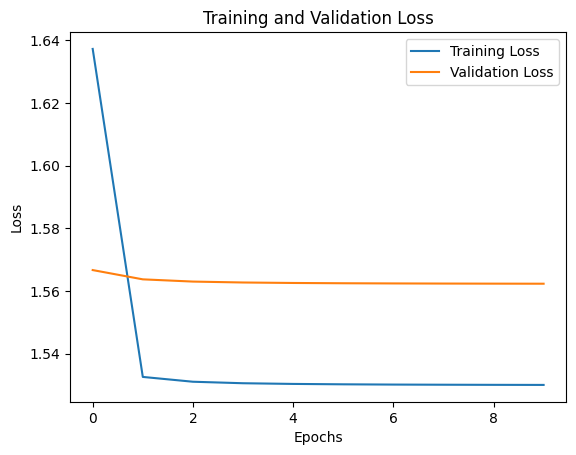

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 2.0476 - mae: 2.6401 - val_loss: 1.3631 - val_mae: 1.9240
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 1.2673 - mae: 1.8147 - val_loss: 1.2255 - val_mae: 1.7668
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1759 - mae: 1.7146 - val_loss: 1.1463 - val_mae: 1.6743
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 1.1335 - mae: 1.6661 - val_loss: 1.1105 - val_mae: 1.6440
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1079 - mae: 1.6394 - val_loss: 1.0837 - val_mae: 1.6129
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0754 - mae: 1.6031 - val_loss: 1.0526 - val_mae: 1.5771
Epoch 7

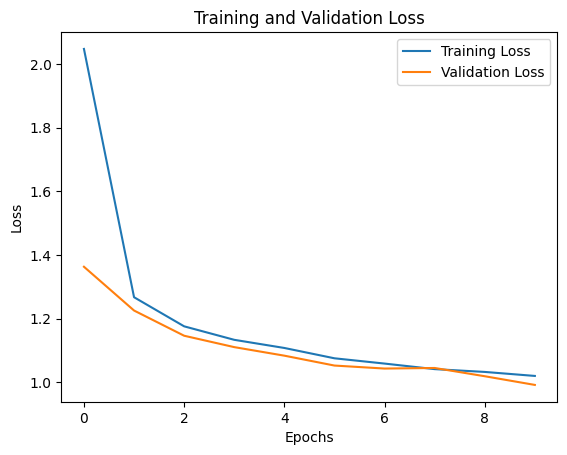

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5375902862445219
Loss Function: logcosh, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.0534 - mse: 11.5148 - val_loss: 1.3803 - val_mse: 6.0033
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2664 - mse: 5.4018 - val_loss: 1.2230 - val_mse: 5.2251
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 1.1727 - mse: 4.8664 - val_loss: 1.1505 - val_mse: 4.7877
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1353 - mse: 4.6771 - val_loss: 1.1117 - val_mse: 4.5726
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1000 - mse: 4.4654 - val_loss: 1.0813 - val_mse: 4.4079
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0844 - mse: 4.3735 - val_loss: 1.0814 - val_mse: 4.3613
Epoch 7/1

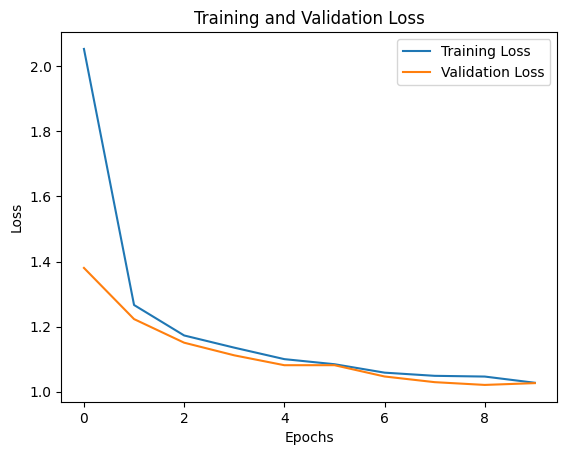

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5312094402645404
Loss Function: logcosh, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.2119 - mae: 4.8800 - val_loss: 3.3067 - val_mae: 3.9458
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.4607 - mae: 3.0821 - val_loss: 1.9901 - val_mae: 2.5961
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6552 - mae: 2.2500 - val_loss: 1.5870 - val_mae: 2.1914
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.4628 - mae: 2.0527 - val_loss: 1.4863 - val_mae: 2.0801
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3985 - mae: 1.9751 - val_loss: 1.4364 - val_mae: 2.0199
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3715 - mae: 1.9372 - val_loss: 1.4073 - val_mae: 1.9829
Epoch 7/10
12

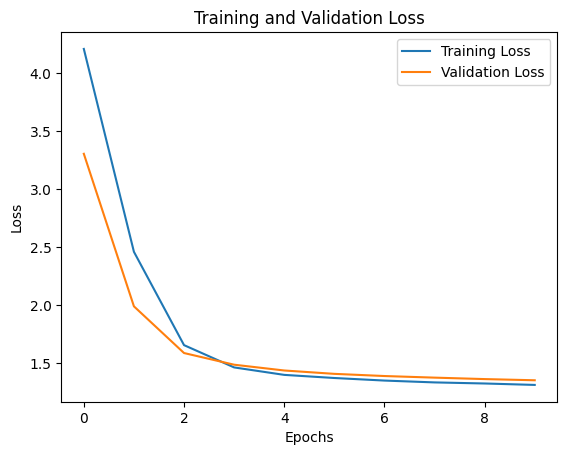

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 0.20809289279339538
Loss Function: logcosh, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.2279 - mse: 29.7845 - val_loss: 3.3387 - val_mse: 20.8469
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.4956 - mse: 13.6585 - val_loss: 2.0195 - val_mse: 9.7969
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6747 - mse: 7.4816 - val_loss: 1.6055 - val_mse: 7.0970
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4800 - mse: 6.3758 - val_loss: 1.5028 - val_mse: 6.6134
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4119 - mse: 6.1137 - val_loss: 1.4509 - val_mse: 6.4144
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3788 - mse: 5.9769 - val_loss: 1.4182 - val_mse: 6.2959
Epoch 7/10
1

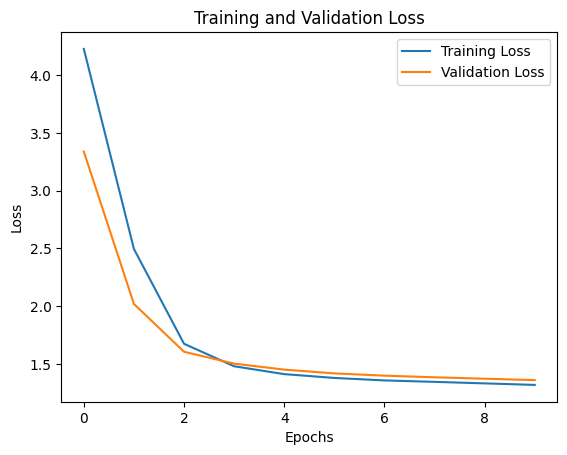

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.19924320639008197
Loss Function: logcosh, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 1.8848 - mae: 2.4747 - val_loss: 1.3281 - val_mae: 1.8781
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 1.2326 - mae: 1.7742 - val_loss: 1.1809 - val_mae: 1.7071
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1470 - mae: 1.6792 - val_loss: 1.1136 - val_mae: 1.6414
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0984 - mae: 1.6268 - val_loss: 1.0748 - val_mae: 1.6014
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0788 - mae: 1.6047 - val_loss: 1.0551 - val_mae: 1.5759
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0521 - mae: 1.5768 - val_loss: 1.0256 - val_mae: 1.5431
Epoch 7/10

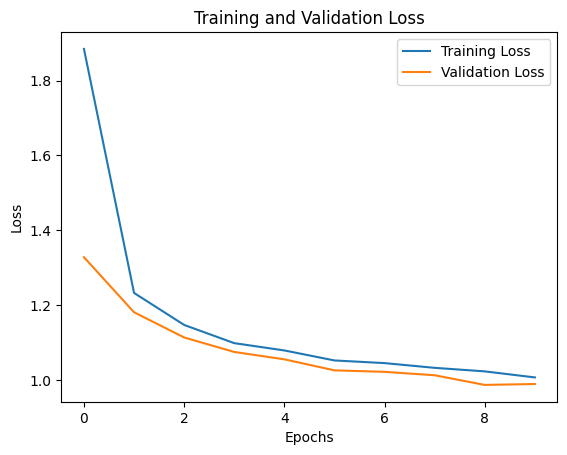

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5429251137167452
Loss Function: logcosh, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.8531 - mse: 9.6069 - val_loss: 1.3438 - val_mse: 5.8067
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2277 - mse: 5.2265 - val_loss: 1.1767 - val_mse: 4.9973
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1493 - mse: 4.7560 - val_loss: 1.1185 - val_mse: 4.6454
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0997 - mse: 4.5022 - val_loss: 1.0797 - val_mse: 4.4119
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0723 - mse: 4.3107 - val_loss: 1.0463 - val_mse: 4.2046
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0613 - mse: 4.2539 - val_loss: 1.0211 - val_mse: 4.0886
Epoch 7

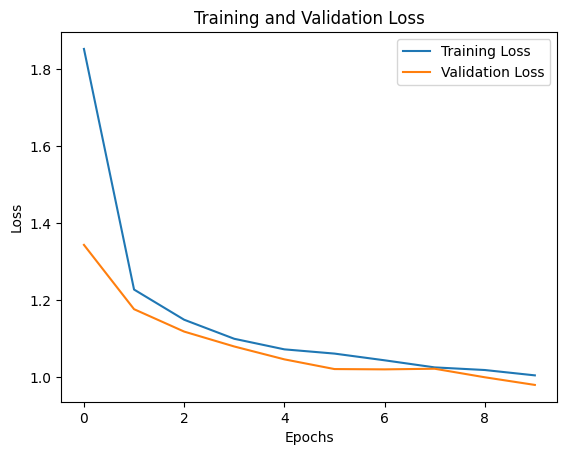

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5506818044863837
Loss Function: logcosh, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.0561 - mae: 5.7283 - val_loss: 5.0352 - val_mae: 5.7063
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.8675 - mae: 5.5447 - val_loss: 4.8528 - val_mae: 5.5291
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.6823 - mae: 5.3621 - val_loss: 4.6707 - val_mae: 5.3497
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4981 - mae: 5.1787 - val_loss: 4.4882 - val_mae: 5.1676
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3107 - mae: 4.9900 - val_loss: 4.3053 - val_mae: 4.9829
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.1252 - mae: 4.8008 - val_loss: 4.1233 - val_mae: 4.7962
Epoch 7/10
1

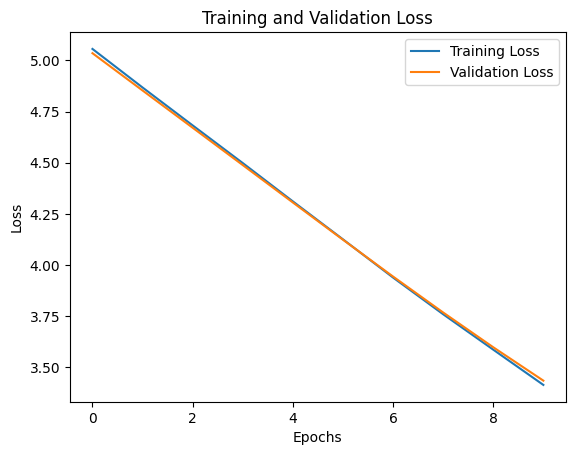

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.012878739419713847
Loss Function: logcosh, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.0856 - mse: 39.2057 - val_loss: 5.0647 - val_mse: 39.2712
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9007 - mse: 37.1301 - val_loss: 4.8800 - val_mse: 37.1731
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.7140 - mse: 35.0889 - val_loss: 4.6921 - val_mse: 35.0745
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.5183 - mse: 32.9594 - val_loss: 4.4930 - val_mse: 32.8571
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3154 - mse: 30.7944 - val_loss: 4.2941 - val_mse: 30.6995
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.1138 - mse: 28.6969 - val_loss: 4.0974 - val_mse: 28.6

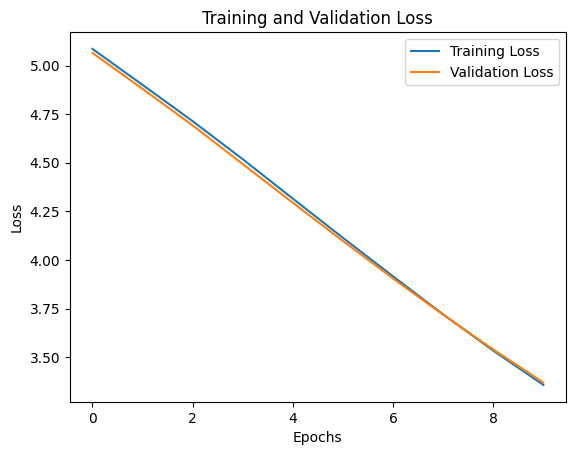

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.0291428265419571
Loss Function: logcosh, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 5.1664 - mae: 5.8353 - val_loss: 5.2411 - val_mae: 5.9040
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1642 - mae: 5.8331 - val_loss: 5.2382 - val_mae: 5.9011
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1579 - mae: 5.8270 - val_loss: 5.2288 - val_mae: 5.8921
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1419 - mae: 5.8115 - val_loss: 5.2031 - val_mae: 5.8675
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1114 - mae: 5.7821 - val_loss: 5.1688 - val_mae: 5.8348
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 5.0768 - mae: 5.7488 - val_loss: 5.1342 - val_mae: 5.8018
Epoch

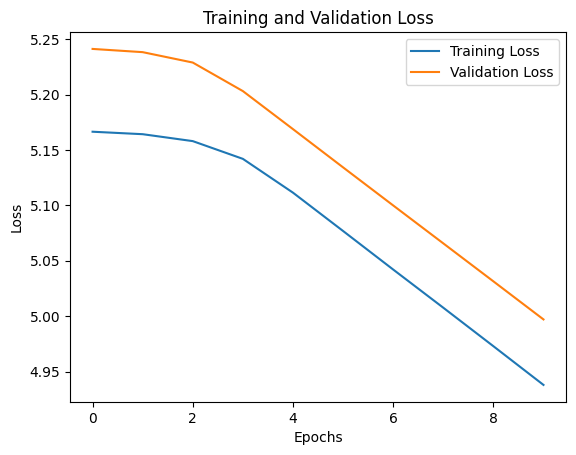

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -7.458732315823724e-05
Loss Function: logcosh, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 5.1545 - mse: 39.9721 - val_loss: 5.2277 - val_mse: 41.1405
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1476 - mse: 39.8850 - val_loss: 5.2192 - val_mse: 41.0372
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 5.1372 - mse: 39.7630 - val_loss: 5.2069 - val_mse: 40.8915
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1224 - mse: 39.5857 - val_loss: 5.1896 - val_mse: 40.6864
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1030 - mse: 39.3603 - val_loss: 5.1679 - val_mse: 40.4267
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.0804 - mse: 39.0947 - val_loss: 5.1447 - val_mse

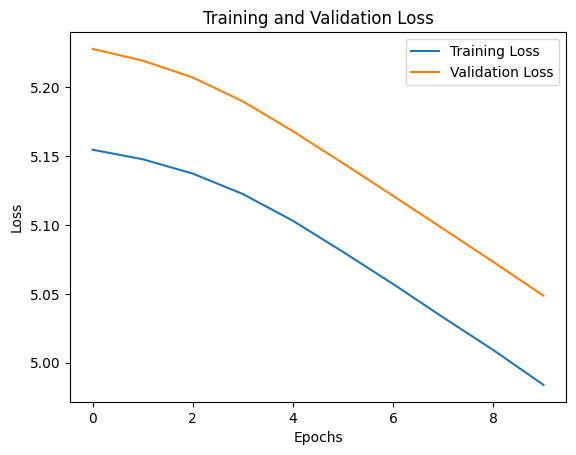

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: logcosh, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 2.4862 - mae: 3.1030 - val_loss: 1.5082 - val_mae: 2.1035
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.3798 - mae: 1.9469 - val_loss: 1.3691 - val_mae: 1.9329
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2963 - mae: 1.8487 - val_loss: 1.3076 - val_mae: 1.8599
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2482 - mae: 1.7952 - val_loss: 1.2492 - val_mae: 1.7894
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2044 - mae: 1.7440 - val_loss: 1.2023 - val_mae: 1.7379
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1742 - mae: 1.7105 - val_loss: 1.1786 - val_mae: 1.7147
Epoch 7/

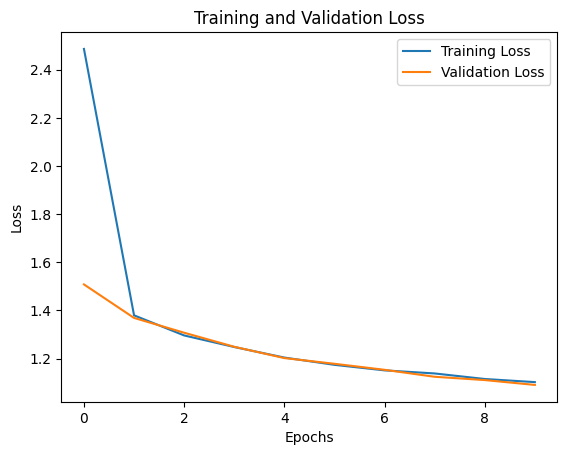

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4571811920698867
Loss Function: logcosh, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.6014 - mse: 15.5257 - val_loss: 1.5207 - val_mse: 6.7652
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3880 - mse: 6.0416 - val_loss: 1.3792 - val_mse: 6.0477
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3106 - mse: 5.6413 - val_loss: 1.3141 - val_mse: 5.7129
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2575 - mse: 5.3758 - val_loss: 1.2662 - val_mse: 5.4453
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2192 - mse: 5.1602 - val_loss: 1.2246 - val_mse: 5.2224
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1901 - mse: 4.9825 - val_loss: 1.1839 - val_mse: 5.0168
Epoch 7/1

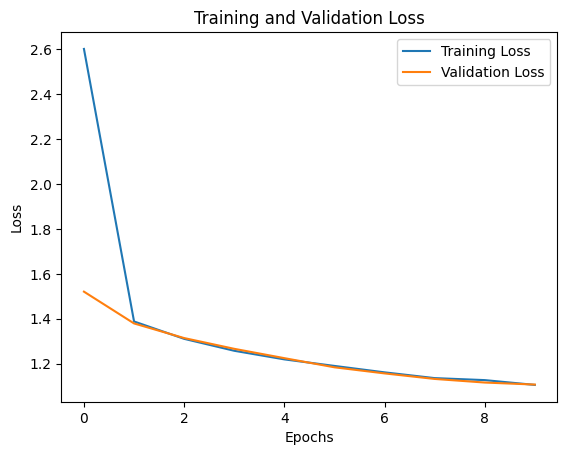

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.44128463690523334
Loss Function: logcosh, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.1284 - mae: 2.7232 - val_loss: 1.3662 - val_mae: 1.9302
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2646 - mae: 1.8137 - val_loss: 1.2234 - val_mae: 1.7615
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1800 - mae: 1.7180 - val_loss: 1.1423 - val_mae: 1.6689
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1310 - mae: 1.6659 - val_loss: 1.1019 - val_mae: 1.6294
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0941 - mae: 1.6213 - val_loss: 1.0633 - val_mae: 1.5866
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0711 - mae: 1.5979 - val_loss: 1.0529 - val_mae: 1.5798
Epoch 7/

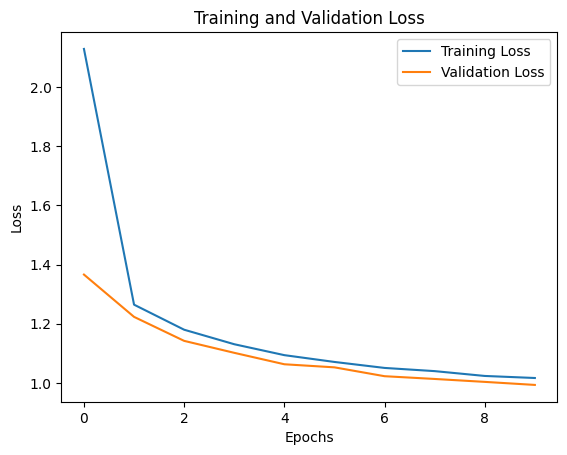

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5292079314154925
Loss Function: logcosh, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 2.2010 - mse: 12.8361 - val_loss: 1.3849 - val_mse: 6.0155
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2736 - mse: 5.4433 - val_loss: 1.2429 - val_mse: 5.3148
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1867 - mse: 4.9681 - val_loss: 1.1520 - val_mse: 4.8413
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1310 - mse: 4.6524 - val_loss: 1.1024 - val_mse: 4.5958
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0955 - mse: 4.4678 - val_loss: 1.0837 - val_mse: 4.4088
Epoch 6/10
128/128 [==============================] - 2s 13ms/step - loss: 1.0779 - mse: 4.3361 - val_loss: 1.0496 - val_mse: 4.2246
Epoch 7/1

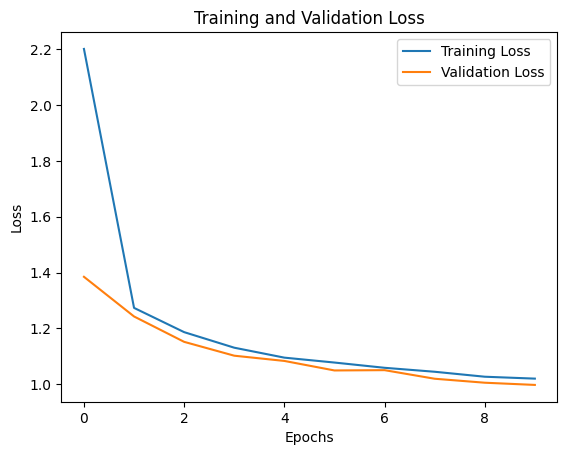

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5417988971030905
Loss Function: logcosh, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 2.1047 - mae: 2.7011 - val_loss: 1.3666 - val_mae: 1.9298
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2640 - mae: 1.8125 - val_loss: 1.2348 - val_mae: 1.7764
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1822 - mae: 1.7206 - val_loss: 1.1614 - val_mae: 1.6987
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1315 - mae: 1.6639 - val_loss: 1.1246 - val_mae: 1.6610
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1043 - mae: 1.6336 - val_loss: 1.0694 - val_mae: 1.5975
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0807 - mae: 1.6106 - val_loss: 1.0555 - val_mae: 1.5833
Epoch 7/1

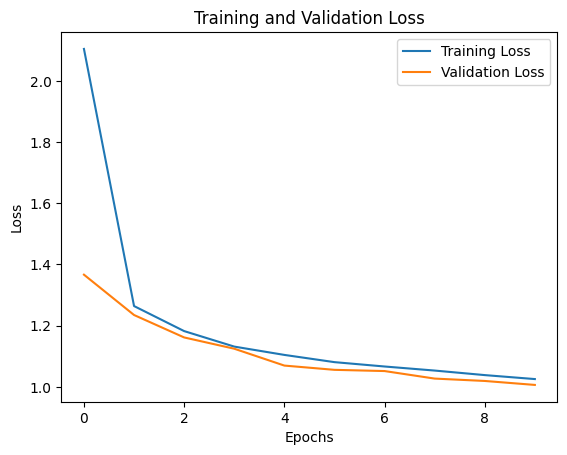

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5344591315062672
Loss Function: logcosh, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 2.1187 - mse: 11.8601 - val_loss: 1.3689 - val_mse: 5.9737
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2648 - mse: 5.3894 - val_loss: 1.2289 - val_mse: 5.2527
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1848 - mse: 4.9564 - val_loss: 1.1478 - val_mse: 4.8224
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1272 - mse: 4.6285 - val_loss: 1.1122 - val_mse: 4.5971
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0966 - mse: 4.4700 - val_loss: 1.0822 - val_mse: 4.3767
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0836 - mse: 4.3777 - val_loss: 1.0823 - val_mse: 4.4332
Epoch 7/10
1

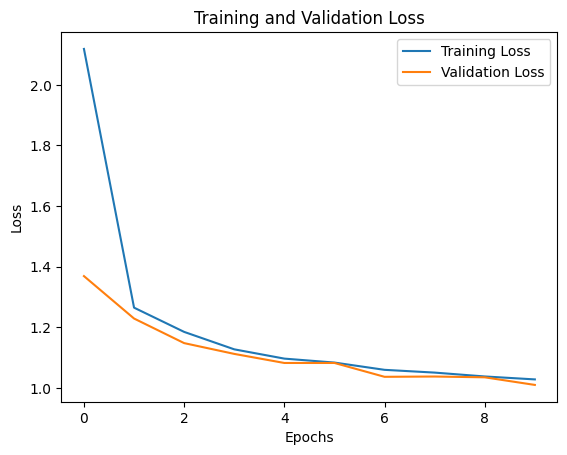

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5289094095821506
Loss Function: logcosh, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.2255 - mae: 4.8944 - val_loss: 3.3798 - val_mae: 4.0211
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.5417 - mae: 3.1620 - val_loss: 2.0609 - val_mae: 2.6684
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6975 - mae: 2.2932 - val_loss: 1.6118 - val_mae: 2.2155
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 1.4795 - mae: 2.0729 - val_loss: 1.4990 - val_mae: 2.0965
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4159 - mae: 1.9955 - val_loss: 1.4463 - val_mae: 2.0324
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3749 - mae: 1.9440 - val_loss: 1.4137 - val_mae: 1.9898
Epoch 7/10
128

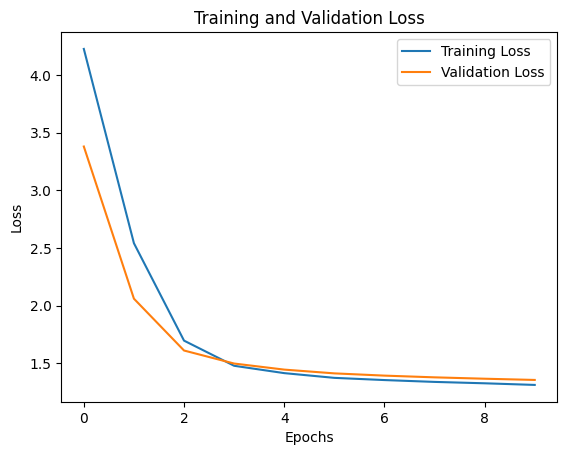

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.20059256417410698
Loss Function: logcosh, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.2356 - mse: 29.8788 - val_loss: 3.3924 - val_mse: 21.3872
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.5528 - mse: 14.1623 - val_loss: 2.0708 - val_mse: 10.1932
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.7051 - mse: 7.6992 - val_loss: 1.6136 - val_mse: 7.1231
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 1.4798 - mse: 6.3590 - val_loss: 1.4985 - val_mse: 6.5533
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4133 - mse: 6.0778 - val_loss: 1.4460 - val_mse: 6.3476
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3722 - mse: 5.9156 - val_loss: 1.4129 - val_mse: 6.2283
Epoch 7/1

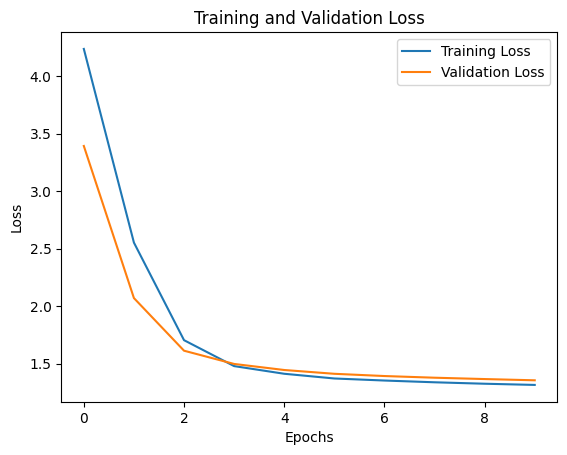

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.20126320135019493
Loss Function: logcosh, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.8734 - mae: 2.4593 - val_loss: 1.3238 - val_mae: 1.8789
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.2201 - mae: 1.7602 - val_loss: 1.1815 - val_mae: 1.7239
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1400 - mae: 1.6724 - val_loss: 1.1046 - val_mae: 1.6276
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1020 - mae: 1.6300 - val_loss: 1.0674 - val_mae: 1.5900
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0705 - mae: 1.5959 - val_loss: 1.0818 - val_mae: 1.6133
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0499 - mae: 1.5759 - val_loss: 1.0269 - val_mae: 1.5496
Epoch 7/1

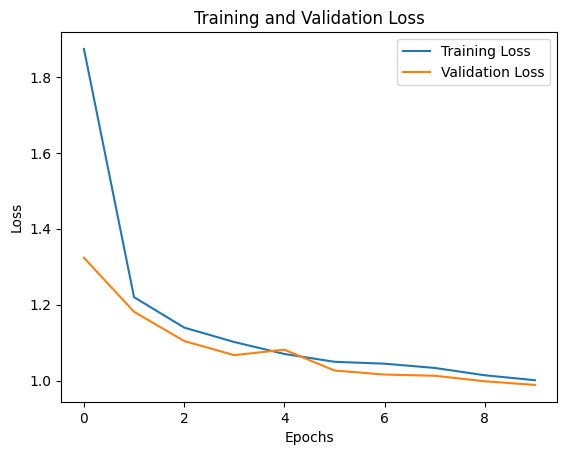

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5624628764874676
Loss Function: logcosh, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1.8661 - mse: 9.7431 - val_loss: 1.3332 - val_mse: 5.7362
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2294 - mse: 5.2074 - val_loss: 1.1812 - val_mse: 5.0093
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1413 - mse: 4.7011 - val_loss: 1.1007 - val_mse: 4.5915
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1012 - mse: 4.4676 - val_loss: 1.0650 - val_mse: 4.3916
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0720 - mse: 4.3307 - val_loss: 1.0391 - val_mse: 4.1723
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0502 - mse: 4.2078 - val_loss: 1.0251 - val_mse: 4.0977
Epoch 7/10

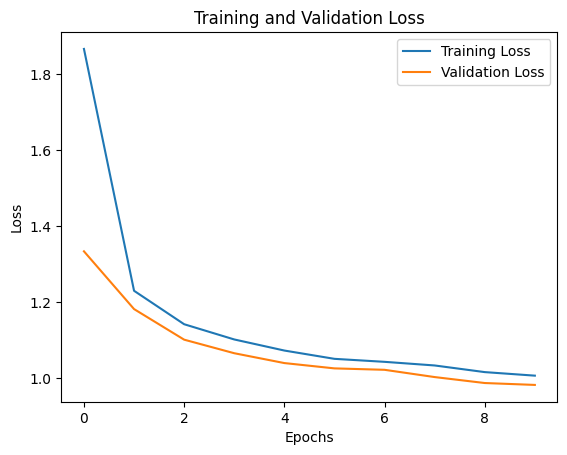

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5539925024678596
Loss Function: logcosh, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.0248 - mae: 5.6976 - val_loss: 4.9758 - val_mae: 5.6486
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7807 - mae: 5.4593 - val_loss: 4.7421 - val_mae: 5.4202
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5442 - mae: 5.2247 - val_loss: 4.5122 - val_mae: 5.1916
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3141 - mae: 4.9933 - val_loss: 4.2864 - val_mae: 4.9634
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.0857 - mae: 4.7597 - val_loss: 4.0658 - val_mae: 4.7362
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 3.8628 - mae: 4.5277 - val_loss: 3.8527 - val_mae: 4.5120
Epoch 7/10

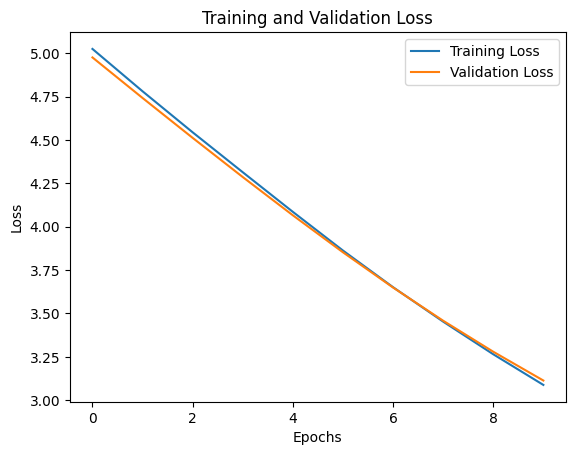

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.024325535745639337
Loss Function: logcosh, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.0605 - mse: 38.9100 - val_loss: 5.0300 - val_mse: 38.8082
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.8539 - mse: 36.5139 - val_loss: 4.8309 - val_mse: 36.4748
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.6522 - mse: 34.2423 - val_loss: 4.6327 - val_mse: 34.2156
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4525 - mse: 32.0566 - val_loss: 4.4349 - val_mse: 32.0266
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2509 - mse: 29.9338 - val_loss: 4.2377 - val_mse: 29.9102
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.0497 - mse: 27.8640 - val_loss: 4.0427 - val_mse: 27.

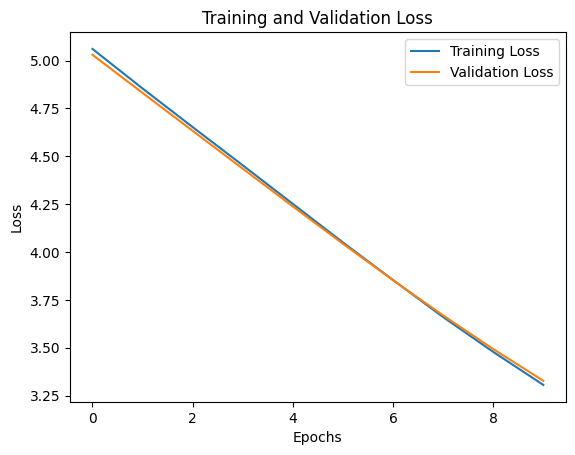

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.01855966729633618
Loss Function: logcosh, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.1884 - mae: 5.8583 - val_loss: 5.2558 - val_mae: 5.9195
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1749 - mae: 5.8445 - val_loss: 5.2418 - val_mae: 5.9053
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.1600 - mae: 5.8296 - val_loss: 5.2268 - val_mae: 5.8907
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1447 - mae: 5.8147 - val_loss: 5.2110 - val_mae: 5.8756
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1283 - mae: 5.7987 - val_loss: 5.1945 - val_mae: 5.8598
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1110 - mae: 5.7821 - val_loss: 5.1773 - val_mae: 5.8434
Epo

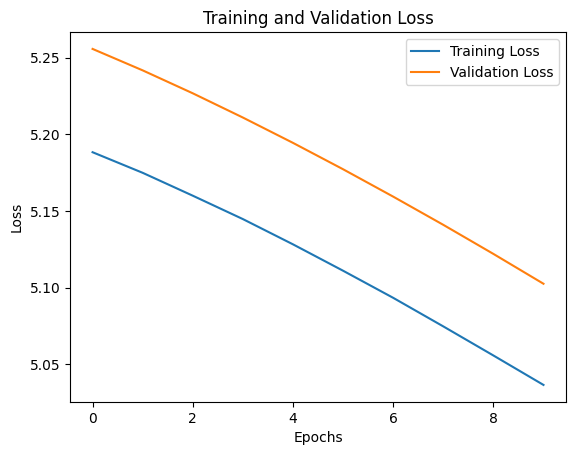

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: logcosh, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 5.1650 - mse: 40.1048 - val_loss: 5.2341 - val_mse: 41.2306
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1532 - mse: 39.9630 - val_loss: 5.2216 - val_mse: 41.0792
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1402 - mse: 39.8120 - val_loss: 5.2082 - val_mse: 40.9179
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1266 - mse: 39.6500 - val_loss: 5.1941 - val_mse: 40.7480
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 5.1118 - mse: 39.4743 - val_loss: 5.1794 - val_mse: 40.5703
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.0965 - mse: 39.2948 - val_loss: 5.1640 - val_mse

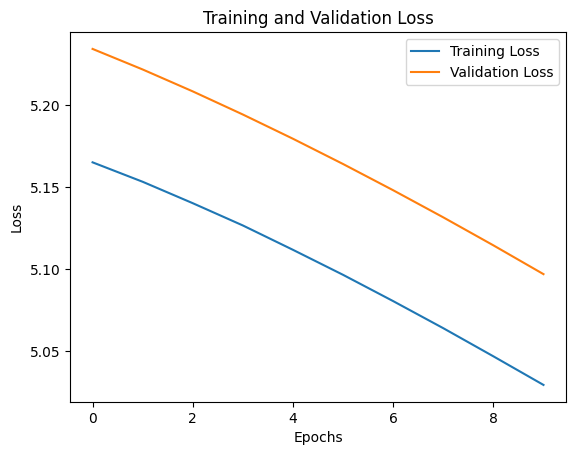

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: logcosh, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 2.4724 - mae: 3.0904 - val_loss: 1.5002 - val_mae: 2.0919
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.3772 - mae: 1.9439 - val_loss: 1.3757 - val_mae: 1.9403
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3001 - mae: 1.8548 - val_loss: 1.3038 - val_mae: 1.8546
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2513 - mae: 1.7960 - val_loss: 1.2535 - val_mae: 1.8023
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2038 - mae: 1.7452 - val_loss: 1.2074 - val_mae: 1.7457
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1748 - mae: 1.7131 - val_loss: 1.1704 - val_mae: 1.7040
Epoch 7

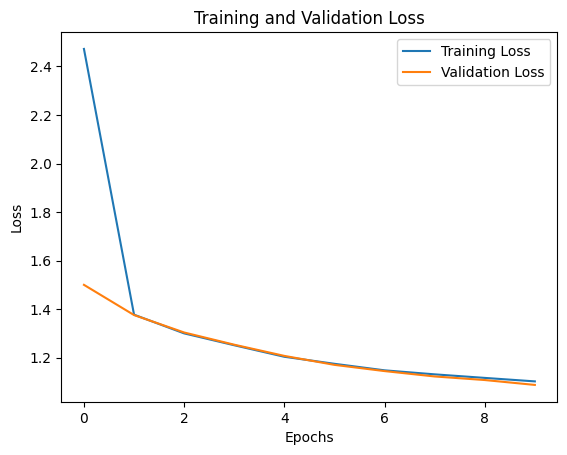

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.45988897246707505
Loss Function: logcosh, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 2.5201 - mse: 14.7619 - val_loss: 1.5072 - val_mse: 6.6740
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3795 - mse: 6.0141 - val_loss: 1.3798 - val_mse: 6.0129
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2980 - mse: 5.5800 - val_loss: 1.3081 - val_mse: 5.6854
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2486 - mse: 5.3307 - val_loss: 1.2626 - val_mse: 5.3989
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2140 - mse: 5.1213 - val_loss: 1.2217 - val_mse: 5.1837
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1894 - mse: 4.9676 - val_loss: 1.1861 - val_mse: 4.9581
Epoch 7

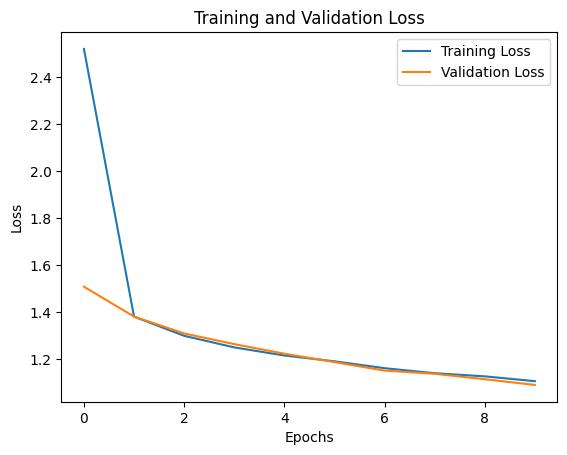

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4556468592454206
Loss Function: logcosh, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 2.1636 - mae: 2.7624 - val_loss: 1.3679 - val_mae: 1.9295
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2634 - mae: 1.8102 - val_loss: 1.2514 - val_mae: 1.7946
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1858 - mae: 1.7216 - val_loss: 1.1711 - val_mae: 1.7162
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 1.1258 - mae: 1.6544 - val_loss: 1.1144 - val_mae: 1.6432
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0983 - mae: 1.6273 - val_loss: 1.0692 - val_mae: 1.5939
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0752 - mae: 1.6050 - val_loss: 1.0513 - val_mae: 1.5760
Epoch 7

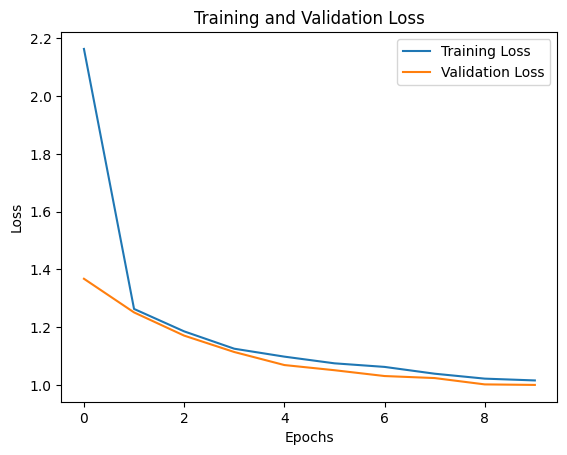

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5461777921293378
Loss Function: logcosh, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 2.1723 - mse: 12.4428 - val_loss: 1.3790 - val_mse: 6.0040
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2601 - mse: 5.3920 - val_loss: 1.2433 - val_mse: 5.3260
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1821 - mse: 4.9578 - val_loss: 1.1512 - val_mse: 4.8247
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1264 - mse: 4.6327 - val_loss: 1.0974 - val_mse: 4.6065
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0904 - mse: 4.4207 - val_loss: 1.0682 - val_mse: 4.3550
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0749 - mse: 4.3374 - val_loss: 1.0447 - val_mse: 4.2199
Epoch 7

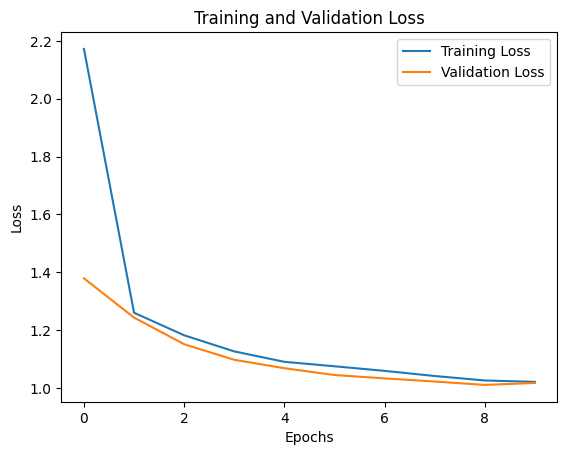

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.535113951961698
Loss Function: logcosh, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.2994 - mae: 4.9779 - val_loss: 4.3119 - val_mae: 4.9904
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2258 - mae: 4.9047 - val_loss: 4.3110 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 4.2253 - mae: 4.9041 - val_loss: 4.3108 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mae: 4.9040 - val_loss: 4.3107 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2250 - mae: 4.9039 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2250 - mae: 4.9038 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 7/10
12

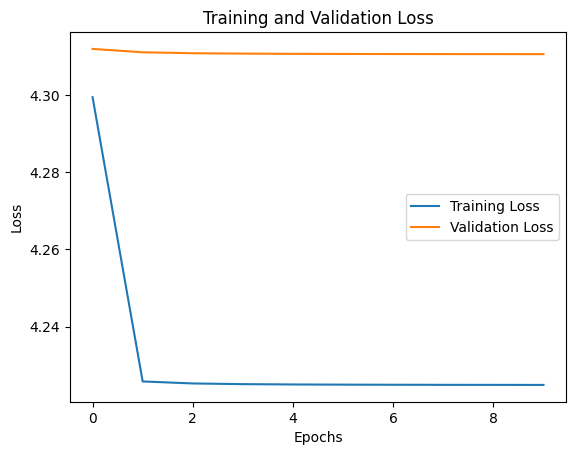

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.2922 - mse: 30.2058 - val_loss: 4.3119 - val_mse: 30.5338
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2258 - mse: 29.4843 - val_loss: 4.3110 - val_mse: 30.5240
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2253 - mse: 29.4787 - val_loss: 4.3108 - val_mse: 30.5212
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2251 - mse: 29.4768 - val_loss: 4.3107 - val_mse: 30.5200
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2250 - mse: 29.4759 - val_loss: 4.3106 - val_mse: 30.5194
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2250 - mse: 29.4753 - val_loss: 4.3106 - val_mse: 30.519

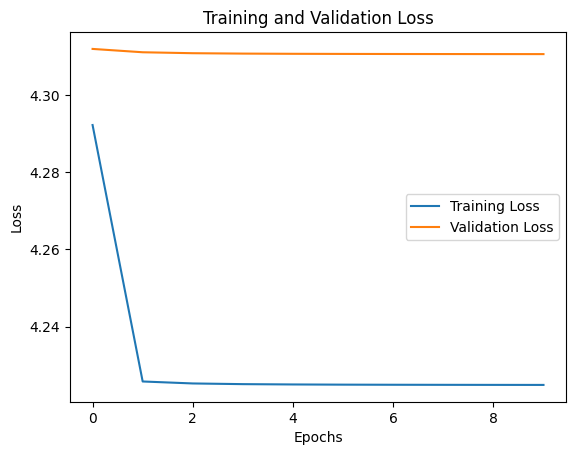

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.6320 - mae: 5.3107 - val_loss: 4.4635 - val_mae: 5.1428
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3271 - mae: 5.0070 - val_loss: 4.3783 - val_mae: 5.0573
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2791 - mae: 4.9585 - val_loss: 4.3525 - val_mae: 5.0313
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2608 - mae: 4.9401 - val_loss: 4.3405 - val_mae: 5.0192
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2519 - mae: 4.9310 - val_loss: 4.3336 - val_mae: 5.0123
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2461 - mae: 4.9252 - val_loss: 4.3292 - val_mae: 5.0079
Epoch 7/10
12

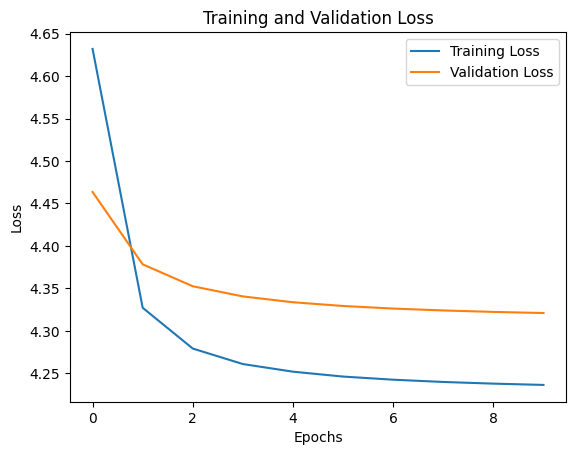

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.6339 - mse: 33.9431 - val_loss: 4.4693 - val_mse: 32.2637
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3310 - mse: 30.6050 - val_loss: 4.3810 - val_mse: 31.2906
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2810 - mse: 30.0708 - val_loss: 4.3542 - val_mse: 30.9964
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2622 - mse: 29.8712 - val_loss: 4.3417 - val_mse: 30.8596
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2527 - mse: 29.7703 - val_loss: 4.3345 - val_mse: 30.7815
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2469 - mse: 29.7081 - val_loss: 4.3300 - val_mse: 30.7315
E

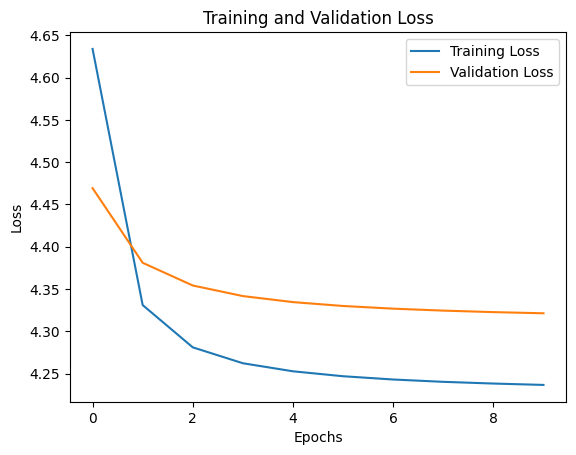

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.2853 - mae: 4.9644 - val_loss: 4.3112 - val_mae: 4.9897
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2252 - mae: 4.9040 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2250 - mae: 4.9038 - val_loss: 4.3105 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2249 - mae: 4.9038 - val_loss: 4.3105 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.2249 - mae: 4.9037 - val_loss: 4.3105 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2249 - mae: 4.9037 - val_loss: 4.3105 - val_mae: 4.9890
Epoch 7

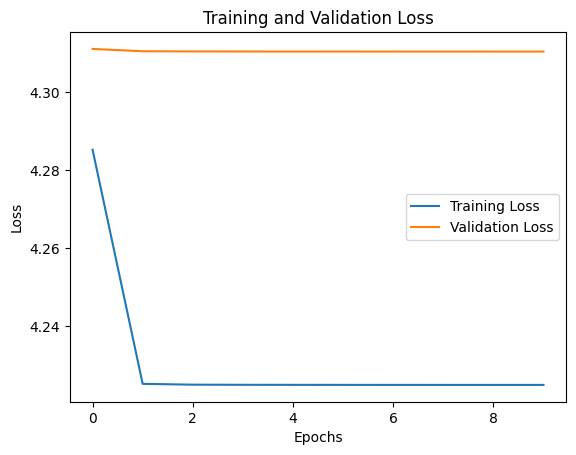

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.2782 - mse: 30.0515 - val_loss: 4.3111 - val_mse: 30.5249
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2251 - mse: 29.4771 - val_loss: 4.3106 - val_mse: 30.5192
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2250 - mse: 29.4749 - val_loss: 4.3105 - val_mse: 30.5186
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2249 - mse: 29.4746 - val_loss: 4.3105 - val_mse: 30.5185
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2249 - mse: 29.4744 - val_loss: 4.3105 - val_mse: 30.5184
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2249 - mse: 29.4743 - val_loss: 4.3105 - val_mse: 30.51

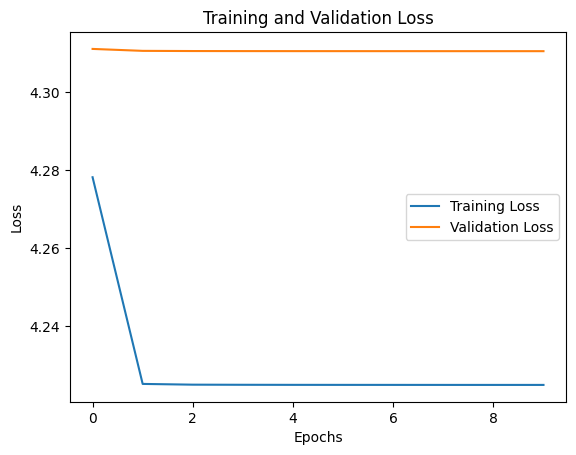

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 5.0556 - mae: 5.7277 - val_loss: 5.0271 - val_mae: 5.6981
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.8657 - mae: 5.5427 - val_loss: 4.8644 - val_mae: 5.5400
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7231 - mae: 5.4023 - val_loss: 4.7431 - val_mae: 5.4209
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.6178 - mae: 5.2981 - val_loss: 4.6547 - val_mae: 5.3335
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5405 - mae: 5.2210 - val_loss: 4.5903 - val_mae: 5.2695
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4843 - mae: 5.1647 - val_loss: 4.5427 - val_mae: 5.2220
Epoch 7/1

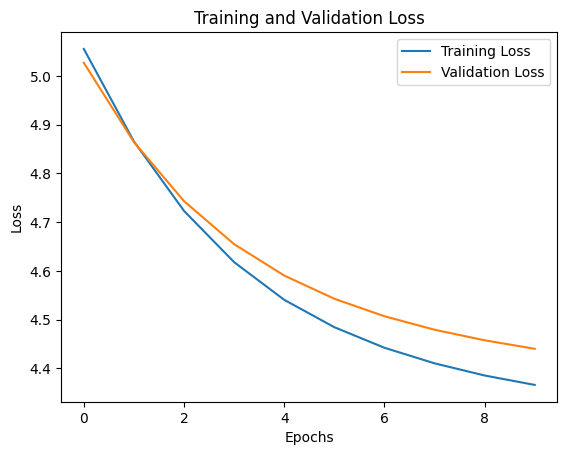

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 5.0467 - mse: 38.6542 - val_loss: 5.0081 - val_mse: 38.4690
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.8412 - mse: 36.2850 - val_loss: 4.8356 - val_mse: 36.4526
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.6924 - mse: 34.5953 - val_loss: 4.7126 - val_mse: 35.0390
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5868 - mse: 33.4219 - val_loss: 4.6264 - val_mse: 34.0588
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5130 - mse: 32.6071 - val_loss: 4.5652 - val_mse: 33.3680
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4602 - mse: 32.0287 - val_loss: 4.5208 - val_mse: 32.8

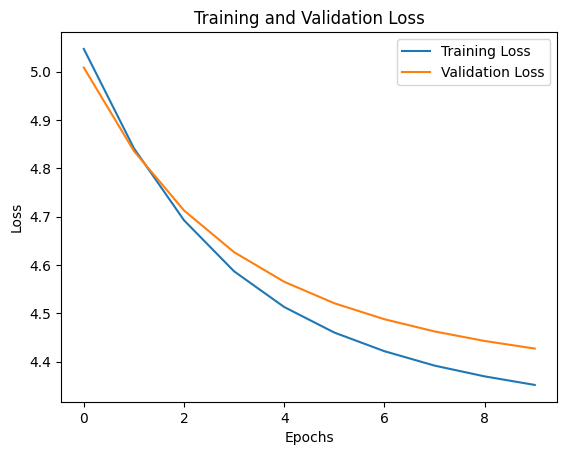

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 5.1632 - mae: 5.8329 - val_loss: 5.2312 - val_mae: 5.8951
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1513 - mae: 5.8213 - val_loss: 5.2191 - val_mae: 5.8836
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1384 - mae: 5.8086 - val_loss: 5.2062 - val_mae: 5.8712
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1252 - mae: 5.7960 - val_loss: 5.1925 - val_mae: 5.8582
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 5.1112 - mae: 5.7825 - val_loss: 5.1782 - val_mae: 5.8446
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.0964 - mae: 5.7681 - val_loss: 5.1633 - val_mae: 5.8303
Epo

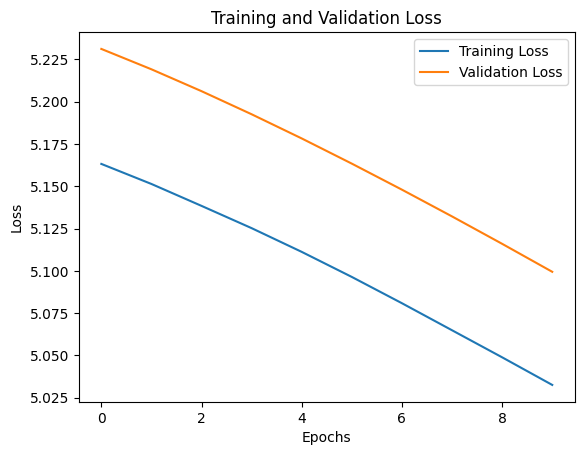

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.1521 - mse: 39.9379 - val_loss: 5.2205 - val_mse: 41.0465
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 5.1395 - mse: 39.7875 - val_loss: 5.2078 - val_mse: 40.8936
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.1267 - mse: 39.6365 - val_loss: 5.1944 - val_mse: 40.7308
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1124 - mse: 39.4687 - val_loss: 5.1802 - val_mse: 40.5599
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0976 - mse: 39.2930 - val_loss: 5.1654 - val_mse: 40.3820
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.0827 - mse: 39.1157 - val_loss: 5.1501 - val_mse: 40

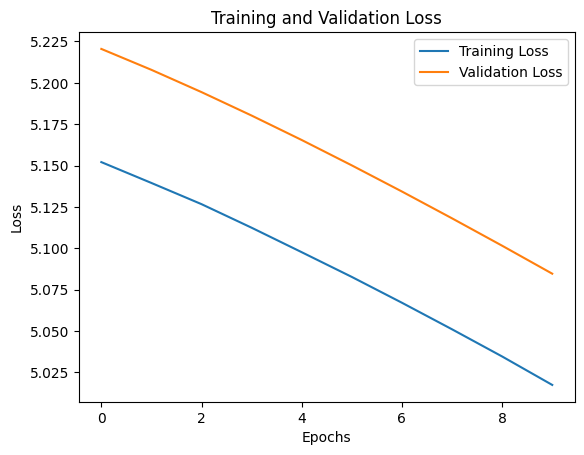

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.3138 - mae: 4.9929 - val_loss: 4.3161 - val_mae: 4.9947
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2287 - mae: 4.9076 - val_loss: 4.3128 - val_mae: 4.9914
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 4.2268 - mae: 4.9057 - val_loss: 4.3118 - val_mae: 4.9904
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2261 - mae: 4.9050 - val_loss: 4.3114 - val_mae: 4.9899
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2257 - mae: 4.9046 - val_loss: 4.3111 - val_mae: 4.9896
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2255 - mae: 4.9043 - val_loss: 4.3110 - val_mae: 4.9895
Epoch 7/1

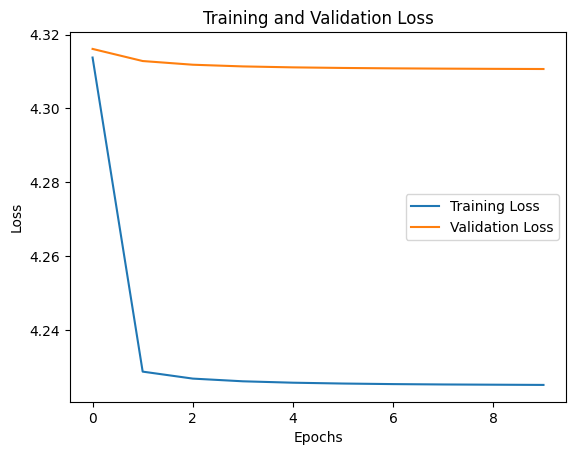

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.3162 - mse: 30.4856 - val_loss: 4.3162 - val_mse: 30.5835
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2288 - mse: 29.5171 - val_loss: 4.3129 - val_mse: 30.5458
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2269 - mse: 29.4961 - val_loss: 4.3119 - val_mse: 30.5342
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2261 - mse: 29.4880 - val_loss: 4.3114 - val_mse: 30.5288
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2257 - mse: 29.4836 - val_loss: 4.3112 - val_mse: 30.5257
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2255 - mse: 29.4813 - val_loss: 4.3110 - val_mse: 3

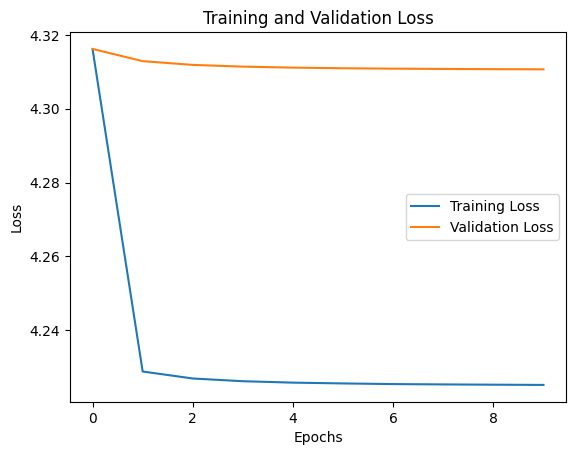

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.3079 - mae: 4.9870 - val_loss: 4.3121 - val_mae: 4.9906
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2259 - mae: 4.9048 - val_loss: 4.3111 - val_mae: 4.9896
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2253 - mae: 4.9042 - val_loss: 4.3108 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mae: 4.9040 - val_loss: 4.3107 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 4.2250 - mae: 4.9039 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2250 - mae: 4.9038 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 

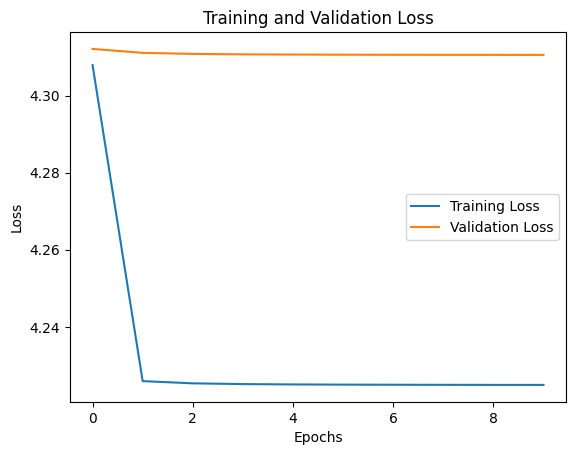

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 4.3109 - mse: 30.4418 - val_loss: 4.3121 - val_mse: 30.5369
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2260 - mse: 29.4860 - val_loss: 4.3111 - val_mse: 30.5247
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2253 - mse: 29.4791 - val_loss: 4.3108 - val_mse: 30.5216
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mse: 29.4771 - val_loss: 4.3107 - val_mse: 30.5203
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 4.2251 - mse: 29.4760 - val_loss: 4.3106 - val_mse: 30.5196
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2250 - mse: 29.4755 - val_loss: 4.3106 - val_mse: 30

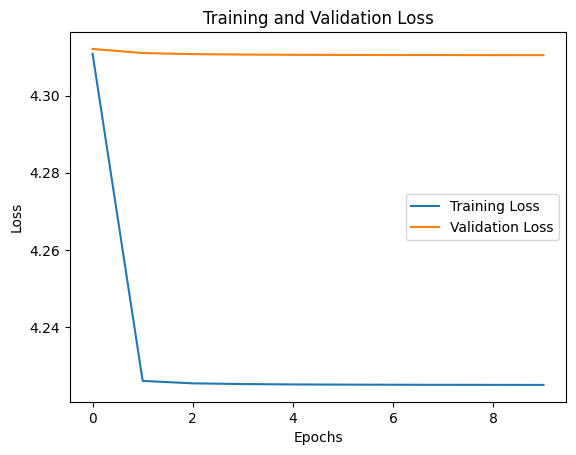

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.2849 - mae: 4.9640 - val_loss: 4.3128 - val_mae: 4.9913
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2263 - mae: 4.9052 - val_loss: 4.3113 - val_mae: 4.9898
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2255 - mae: 4.9044 - val_loss: 4.3109 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2253 - mae: 4.9041 - val_loss: 4.3108 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2251 - mae: 4.9040 - val_loss: 4.3107 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mae: 4.9039 - val_loss: 4.3106 - val_mae: 4.9891
Epoch

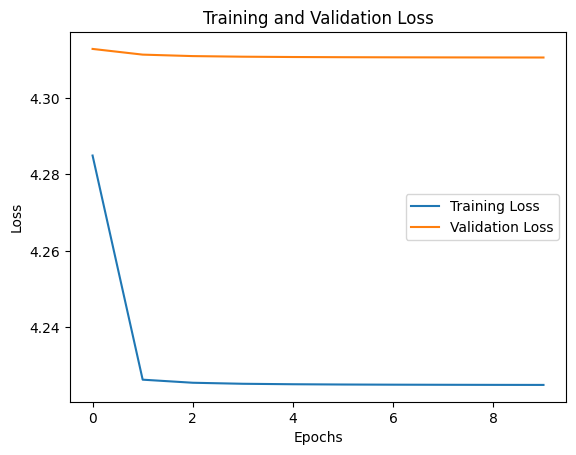

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.2845 - mse: 30.1134 - val_loss: 4.3128 - val_mse: 30.5436
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2263 - mse: 29.4896 - val_loss: 4.3113 - val_mse: 30.5271
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2255 - mse: 29.4809 - val_loss: 4.3109 - val_mse: 30.5229
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2252 - mse: 29.4781 - val_loss: 4.3108 - val_mse: 30.5211
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2251 - mse: 29.4768 - val_loss: 4.3107 - val_mse: 30.5202
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2251 - mse: 29.4760 - val_loss: 4.3106 - val_mse: 30.

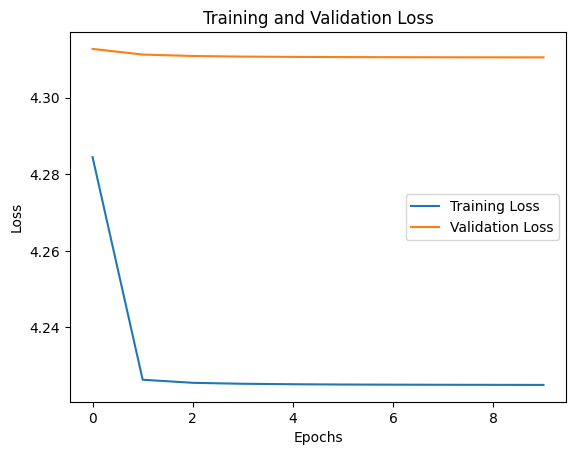

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 13s 14ms/step - loss: 4.6328 - mae: 5.3124 - val_loss: 4.6559 - val_mae: 5.3342
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5269 - mae: 5.2072 - val_loss: 4.5638 - val_mae: 5.2428
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4469 - mae: 5.1273 - val_loss: 4.4980 - val_mae: 5.1772
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3913 - mae: 5.0715 - val_loss: 4.4531 - val_mae: 5.1323
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3531 - mae: 5.0331 - val_loss: 4.4223 - val_mae: 5.1014
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3268 - mae: 5.0066 - val_loss: 4.4006 - val_mae: 5.0797
Epoch 7/

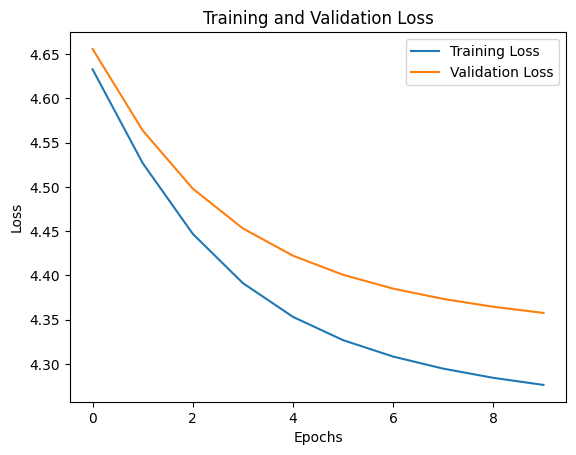

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 4.6363 - mse: 33.9433 - val_loss: 4.6605 - val_mse: 34.4165
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.5324 - mse: 32.7934 - val_loss: 4.5693 - val_mse: 33.3854
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4525 - mse: 31.9193 - val_loss: 4.5031 - val_mse: 32.6448
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3961 - mse: 31.3074 - val_loss: 4.4574 - val_mse: 32.1361
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3574 - mse: 30.8897 - val_loss: 4.4257 - val_mse: 31.7861
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3303 - mse: 30.5984 - val_loss: 4.4035 - val_mse: 31.

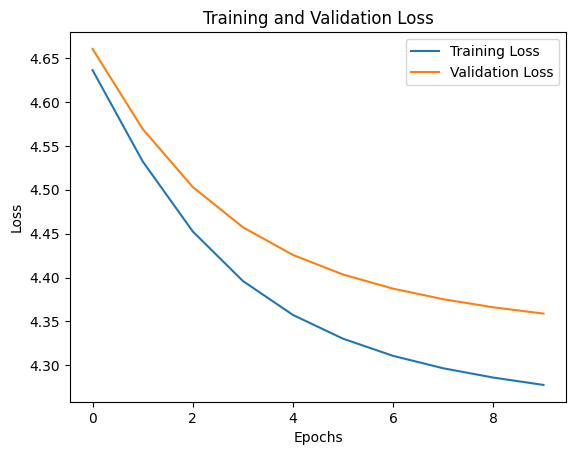

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.2917 - mae: 4.9710 - val_loss: 4.3139 - val_mae: 4.9925
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2263 - mae: 4.9051 - val_loss: 4.3109 - val_mae: 4.9894
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2252 - mae: 4.9040 - val_loss: 4.3107 - val_mae: 4.9892
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2250 - mae: 4.9039 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2250 - mae: 4.9038 - val_loss: 4.3106 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: 4.2249 - mae: 4.9038 - val_loss: 4.3105 - val_mae: 4.9890
E

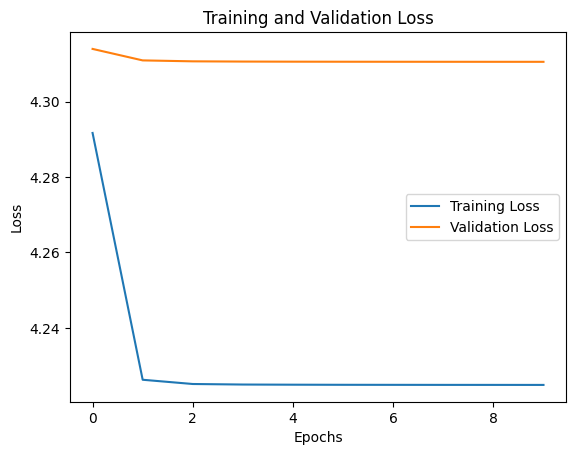

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: 4.2836 - mse: 30.1056 - val_loss: 4.3132 - val_mse: 30.5492
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2260 - mse: 29.4868 - val_loss: 4.3109 - val_mse: 30.5224
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2251 - mse: 29.4770 - val_loss: 4.3107 - val_mse: 30.5199
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2250 - mse: 29.4756 - val_loss: 4.3106 - val_mse: 30.5192
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2250 - mse: 29.4751 - val_loss: 4.3106 - val_mse: 30.5189
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2249 - mse: 29.4748 - val_loss: 4.3105 - val_ms

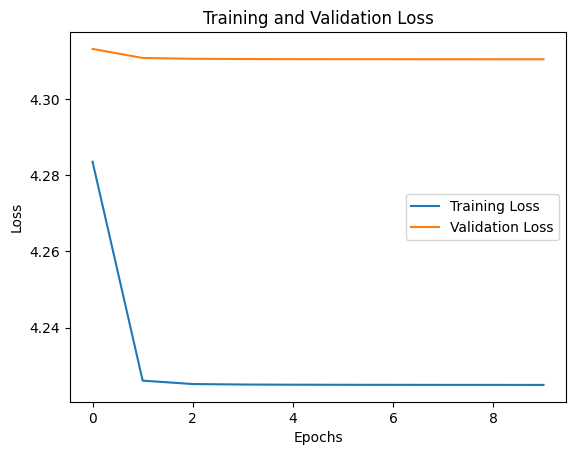

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 4.6803 - mae: 5.3594 - val_loss: 4.7509 - val_mae: 5.4278
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6642 - mae: 5.3435 - val_loss: 4.7358 - val_mae: 5.4130
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.6492 - mae: 5.3286 - val_loss: 4.7214 - val_mae: 5.3988
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.6348 - mae: 5.3144 - val_loss: 4.7073 - val_mae: 5.3850
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6207 - mae: 5.3005 - val_loss: 4.6935 - val_mae: 5.3714
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6066 - mae: 5.2865 - val_loss: 4.6798 - val_mae: 5.3579
Ep

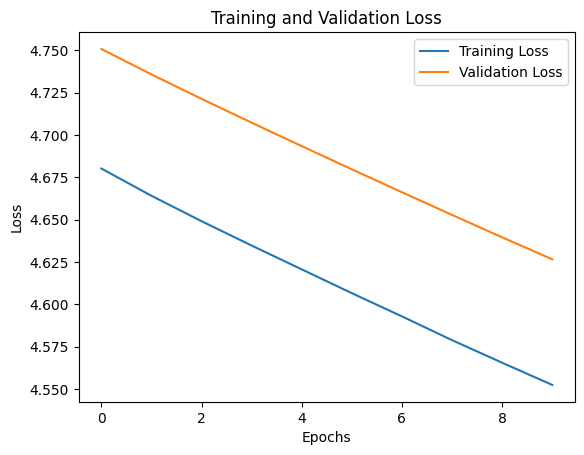

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.6908 - mse: 34.5549 - val_loss: 4.7603 - val_mse: 35.5600
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.6730 - mse: 34.3566 - val_loss: 4.7437 - val_mse: 35.3702
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.6567 - mse: 34.1751 - val_loss: 4.7278 - val_mse: 35.1897
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6408 - mse: 34.0006 - val_loss: 4.7124 - val_mse: 35.0143
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.6252 - mse: 33.8271 - val_loss: 4.6972 - val_mse: 34.8427
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6099 - mse: 33.6584 - val_loss: 4.6823 - val_ms

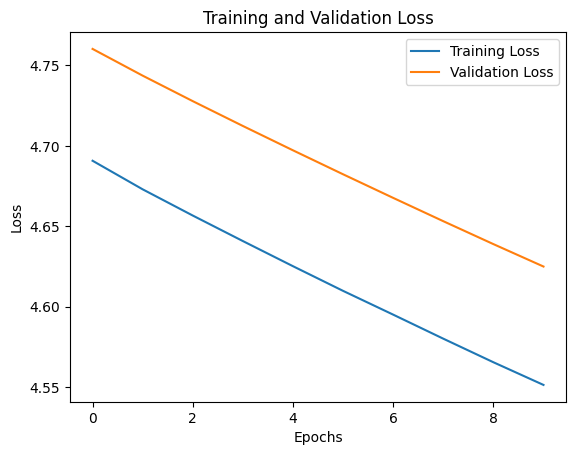

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 18ms/step - loss: 4.6968 - mae: 5.3756 - val_loss: 4.7741 - val_mae: 5.4504
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6944 - mae: 5.3732 - val_loss: 4.7716 - val_mae: 5.4479
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.6918 - mae: 5.3706 - val_loss: 4.7689 - val_mae: 5.4453
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6890 - mae: 5.3678 - val_loss: 4.7661 - val_mae: 5.4426
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6861 - mae: 5.3650 - val_loss: 4.7633 - val_mae: 5.4398
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6831 - mae: 5.3621 - val_loss: 4.7603 - val_mae: 5.4369


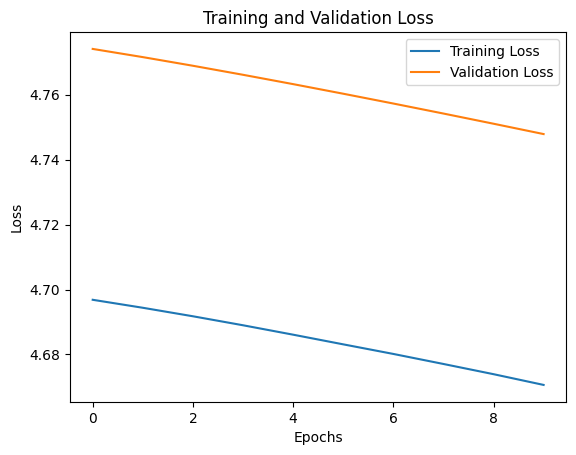

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.006785249795336679
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.6877 - mse: 34.5248 - val_loss: 4.7655 - val_mse: 35.6243
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 4.6855 - mse: 34.5010 - val_loss: 4.7633 - val_mse: 35.6001
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6833 - mse: 34.4771 - val_loss: 4.7611 - val_mse: 35.5745
Epoch 4/10
128/128 [==============================] - 1s 12ms/step - loss: 4.6809 - mse: 34.4505 - val_loss: 4.7588 - val_mse: 35.5479
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6786 - mse: 34.4247 - val_loss: 4.7564 - val_mse: 35.5205
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 4.6760 - mse: 34.3962 - val_loss: 4.7539 - val_m

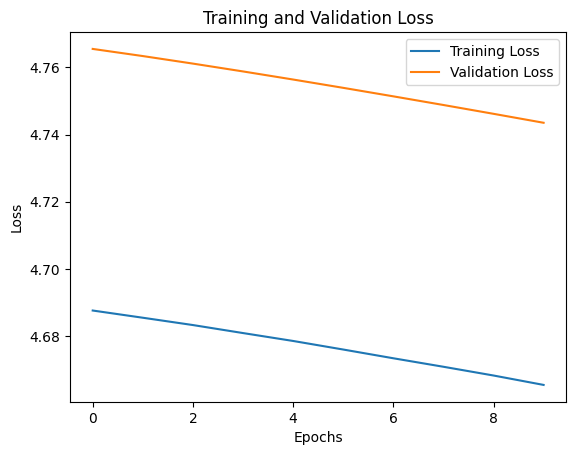

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.00018095608516544015
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.3084 - mae: 4.9876 - val_loss: 4.3180 - val_mae: 4.9965
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2296 - mae: 4.9085 - val_loss: 4.3134 - val_mae: 4.9919
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2272 - mae: 4.9060 - val_loss: 4.3121 - val_mae: 4.9906
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2263 - mae: 4.9052 - val_loss: 4.3116 - val_mae: 4.9901
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2259 - mae: 4.9047 - val_loss: 4.3113 - val_mae: 4.9898
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2256 - mae: 4.9045 - val_loss: 4.3111 - val_mae: 4.9896
E

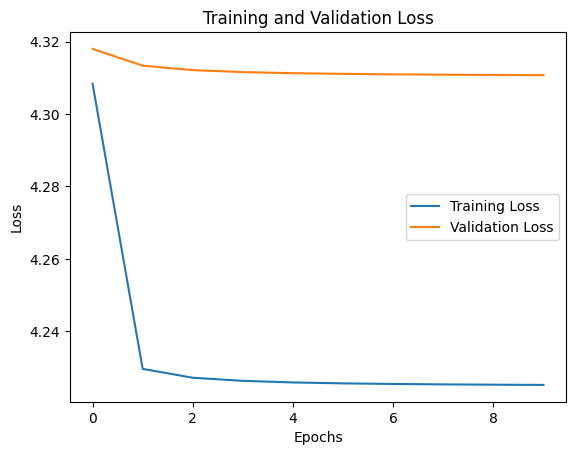

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.3097 - mse: 30.3931 - val_loss: 4.3179 - val_mse: 30.6013
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2296 - mse: 29.5255 - val_loss: 4.3134 - val_mse: 30.5506
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2272 - mse: 29.4994 - val_loss: 4.3121 - val_mse: 30.5367
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2263 - mse: 29.4898 - val_loss: 4.3116 - val_mse: 30.5305
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2259 - mse: 29.4849 - val_loss: 4.3113 - val_mse: 30.5271
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2256 - mse: 29.4822 - val_loss: 4.3111 - val_mse

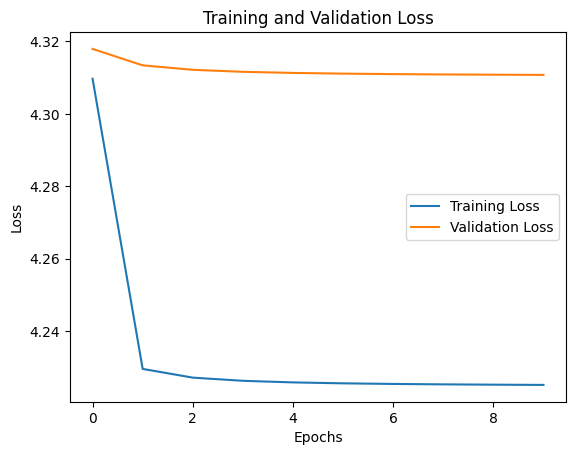

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 17ms/step - loss: 4.2912 - mae: 4.9705 - val_loss: 4.3129 - val_mae: 4.9914
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2263 - mae: 4.9052 - val_loss: 4.3113 - val_mae: 4.9898
Epoch 3/10
128/128 [==============================] - 2s 14ms/step - loss: 4.2255 - mae: 4.9044 - val_loss: 4.3109 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2253 - mae: 4.9041 - val_loss: 4.3108 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mae: 4.9040 - val_loss: 4.3107 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.2251 - mae: 4.9039 - val_loss: 4.3106 - val_mae: 4.9891
Epo

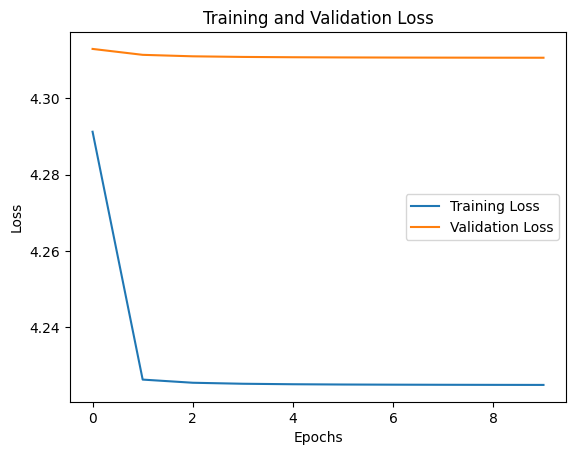

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: logcosh, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 14ms/step - loss: 4.3013 - mse: 30.2953 - val_loss: 4.3134 - val_mse: 30.5505
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.2267 - mse: 29.4935 - val_loss: 4.3115 - val_mse: 30.5292
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2256 - mse: 29.4825 - val_loss: 4.3110 - val_mse: 30.5240
Epoch 4/10
128/128 [==============================] - 2s 14ms/step - loss: 4.2253 - mse: 29.4790 - val_loss: 4.3108 - val_mse: 30.5218
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2252 - mse: 29.4774 - val_loss: 4.3107 - val_mse: 30.5207
Epoch 6/10
128/128 [==============================] - 2s 13ms/step - loss: 4.2251 - mse: 29.4764 - val_loss: 4.3107 - val_mse:

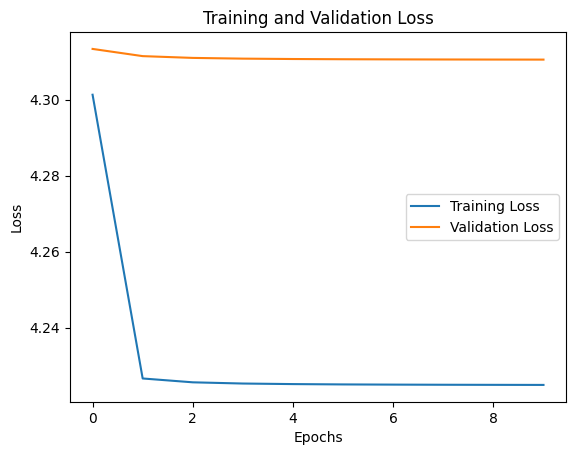

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 2.1969 - mae: 2.6556 - val_loss: 1.4819 - val_mae: 1.9271
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3747 - mae: 1.8121 - val_loss: 1.3271 - val_mae: 1.7599
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2726 - mae: 1.7041 - val_loss: 1.2448 - val_mae: 1.6714
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2384 - mae: 1.6688 - val_loss: 1.2183 - val_mae: 1.6478
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2061 - mae: 1.6347 - val_loss: 1.1766 - val_mae: 1.6070
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1818 - mae: 1.6104 - val_loss: 1.1517 - val_mae: 1.5785
Epoch

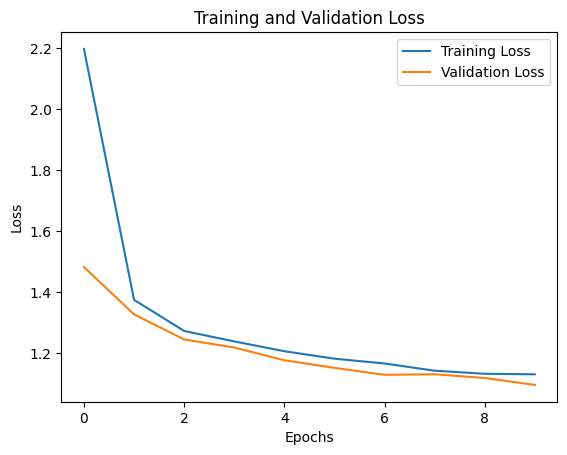

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5372457956282705
Loss Function: huber_loss, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.1980 - mse: 11.6080 - val_loss: 1.4734 - val_mse: 5.9420
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.3670 - mse: 5.3759 - val_loss: 1.3140 - val_mse: 5.2090
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2725 - mse: 4.8748 - val_loss: 1.2479 - val_mse: 4.7813
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2249 - mse: 4.6145 - val_loss: 1.2112 - val_mse: 4.5710
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2027 - mse: 4.4824 - val_loss: 1.1801 - val_mse: 4.3958
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1837 - mse: 4.3802 - val_loss: 1.1582 - val_mse: 4.3064
Epoch 7

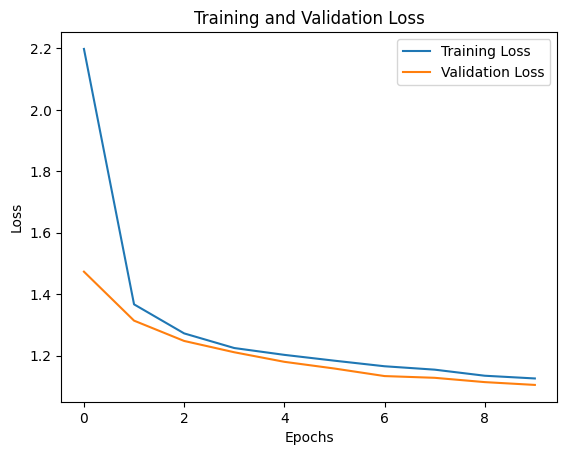

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5286388303142875
Loss Function: huber_loss, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4592 - mae: 4.9515 - val_loss: 3.6247 - val_mae: 4.1012
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 2.7783 - mae: 3.2489 - val_loss: 2.2805 - val_mae: 2.7471
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.8804 - mae: 2.3412 - val_loss: 1.7650 - val_mae: 2.2356
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6216 - mae: 2.0892 - val_loss: 1.6364 - val_mae: 2.1078
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5413 - mae: 1.9987 - val_loss: 1.5706 - val_mae: 2.0335
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.4955 - mae: 1.9450 - val_loss: 1.5303 - val_mae: 1.9856
Epoch 7/10


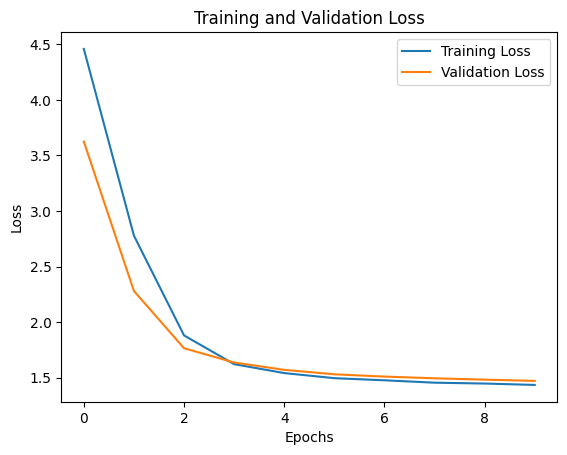

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.18505879522588642
Loss Function: huber_loss, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.4667 - mse: 30.4570 - val_loss: 3.6657 - val_mse: 22.4218
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.8250 - mse: 15.2465 - val_loss: 2.3284 - val_mse: 11.0484
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.9143 - mse: 8.2170 - val_loss: 1.7858 - val_mse: 7.3745
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.6320 - mse: 6.4853 - val_loss: 1.6501 - val_mse: 6.6793
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.5446 - mse: 6.1365 - val_loss: 1.5822 - val_mse: 6.4391
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.5037 - mse: 6.0521 - val_loss: 1.5396 - val_mse: 6.2910
Epoch 

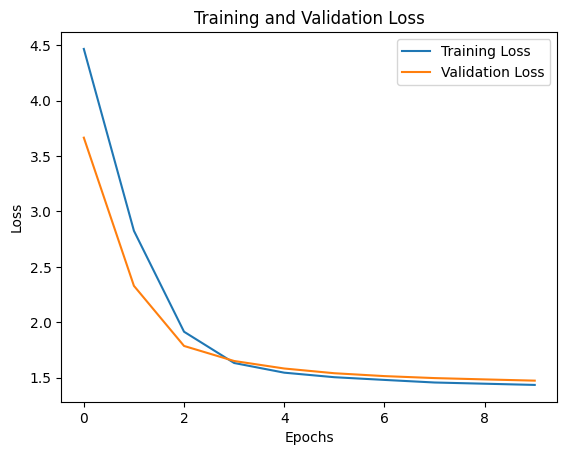

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.18671115500272628
Loss Function: huber_loss, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.9549 - mae: 2.4097 - val_loss: 1.4308 - val_mae: 1.8630
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3291 - mae: 1.7613 - val_loss: 1.2857 - val_mae: 1.7146
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2442 - mae: 1.6734 - val_loss: 1.2020 - val_mae: 1.6245
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2095 - mae: 1.6360 - val_loss: 1.2037 - val_mae: 1.6369
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1848 - mae: 1.6131 - val_loss: 1.1660 - val_mae: 1.5954
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1649 - mae: 1.5911 - val_loss: 1.1358 - val_mae: 1.5608
Epoch 

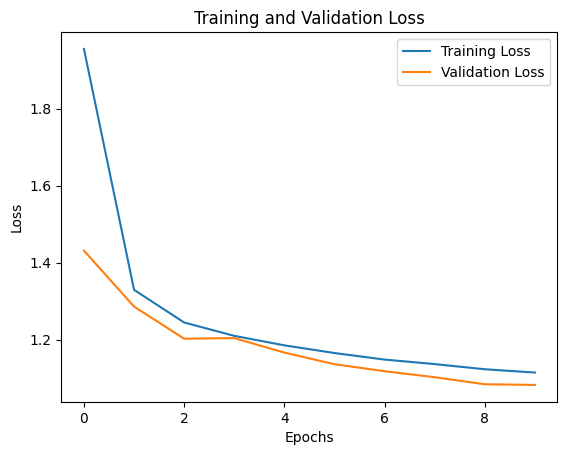

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5525711698411377
Loss Function: huber_loss, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1.9855 - mse: 9.6904 - val_loss: 1.4394 - val_mse: 5.7881
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3299 - mse: 5.2077 - val_loss: 1.2746 - val_mse: 4.9636
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2557 - mse: 4.7989 - val_loss: 1.2022 - val_mse: 4.6112
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2032 - mse: 4.5142 - val_loss: 1.1738 - val_mse: 4.3857
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1820 - mse: 4.3799 - val_loss: 1.1482 - val_mse: 4.2519
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1601 - mse: 4.2596 - val_loss: 1.1351 - val_mse: 4.1408
Epoch 

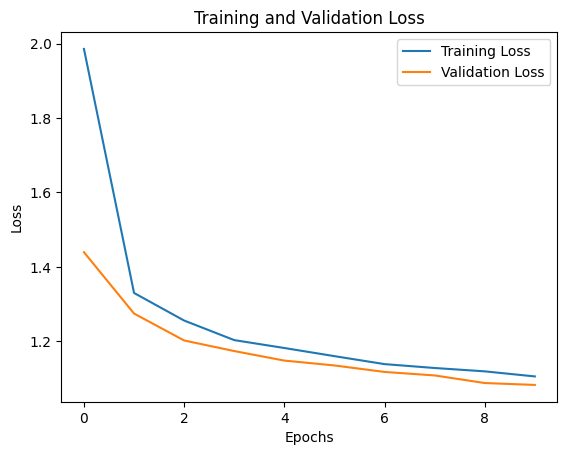

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5436158409314651
Loss Function: huber_loss, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 5.2885 - mae: 5.7755 - val_loss: 5.2652 - val_mae: 5.7525
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.0932 - mae: 5.5862 - val_loss: 5.0683 - val_mae: 5.5623
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8948 - mae: 5.3917 - val_loss: 4.8733 - val_mae: 5.3713
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.6967 - mae: 5.1955 - val_loss: 4.6778 - val_mae: 5.1773
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4985 - mae: 4.9975 - val_loss: 4.4823 - val_mae: 4.9811
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.2989 - mae: 4.7961 - val_loss: 4.2880 - val_mae: 4.7834
Epoch

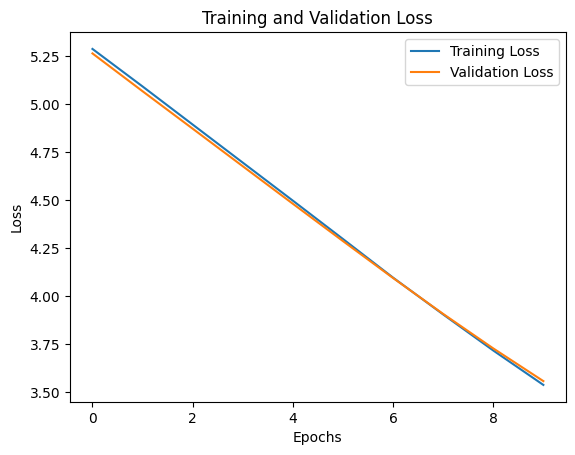

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.015260235308094616
Loss Function: huber_loss, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.3106 - mse: 39.5941 - val_loss: 5.3143 - val_mse: 39.9200
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.1405 - mse: 37.5865 - val_loss: 5.1148 - val_mse: 37.5649
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9430 - mse: 35.3325 - val_loss: 4.9214 - val_mse: 35.3406
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.7445 - mse: 33.1538 - val_loss: 4.7266 - val_mse: 33.1646
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.5456 - mse: 31.0302 - val_loss: 4.5307 - val_mse: 31.0442
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.3460 - mse: 28.9690 - val_loss: 4.3346 - val_mse:

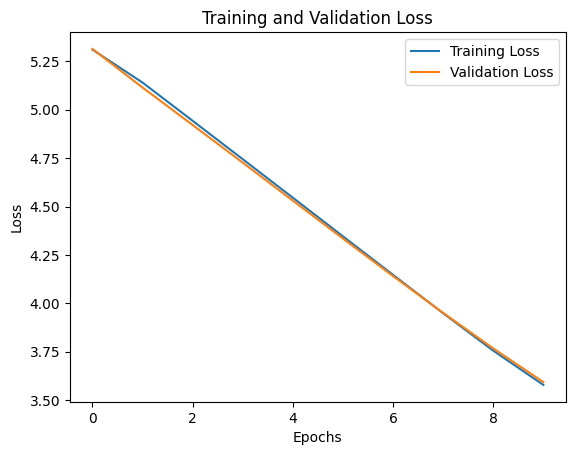

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.015591140217503074
Loss Function: huber_loss, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 5.3195 - mae: 5.8039 - val_loss: 5.3881 - val_mae: 5.8685
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3077 - mae: 5.7925 - val_loss: 5.3751 - val_mae: 5.8562
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 5.2939 - mae: 5.7793 - val_loss: 5.3604 - val_mae: 5.8423
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 5.2780 - mae: 5.7640 - val_loss: 5.3442 - val_mae: 5.8270
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2602 - mae: 5.7470 - val_loss: 5.3262 - val_mae: 5.8100
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2411 - mae: 5.7287 - val_loss: 5.3060 - val_mae: 5.7907


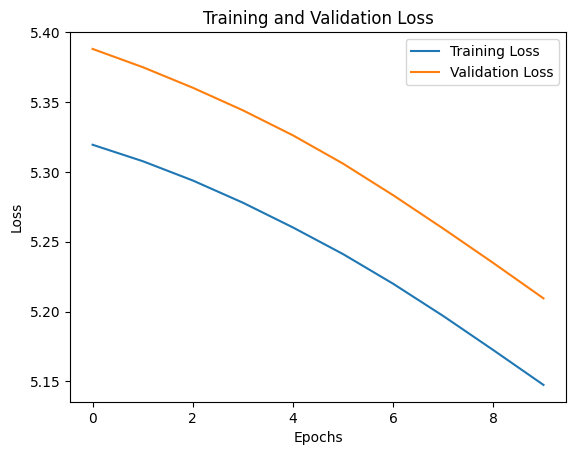

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: huber_loss, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 5.3249 - mse: 39.8255 - val_loss: 5.3928 - val_mse: 40.9532
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3134 - mse: 39.6922 - val_loss: 5.3792 - val_mse: 40.7922
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2987 - mse: 39.5234 - val_loss: 5.3637 - val_mse: 40.6088
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2827 - mse: 39.3363 - val_loss: 5.3470 - val_mse: 40.4099
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2652 - mse: 39.1320 - val_loss: 5.3292 - val_mse: 40.1982
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2474 - mse: 38.9253 - val_loss: 5.3107 - val_m

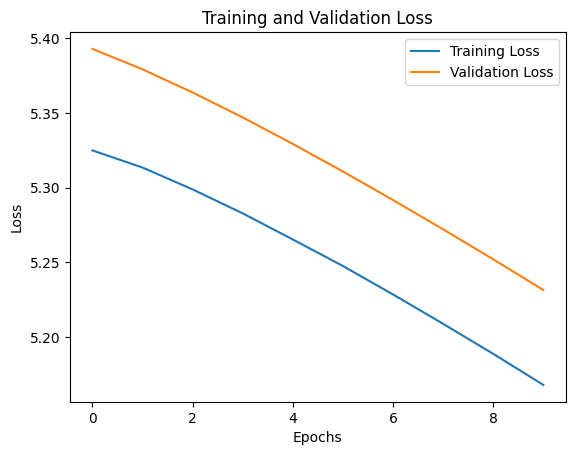

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: huber_loss, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.5922 - mae: 3.0645 - val_loss: 1.6087 - val_mae: 2.0715
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.4905 - mae: 1.9363 - val_loss: 1.4887 - val_mae: 1.9356
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.4073 - mae: 1.8484 - val_loss: 1.4154 - val_mae: 1.8552
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3502 - mae: 1.7868 - val_loss: 1.3537 - val_mae: 1.7857
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3157 - mae: 1.7499 - val_loss: 1.3113 - val_mae: 1.7427
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2863 - mae: 1.7181 - val_loss: 1.2711 - val_mae: 1.7001
Epoch

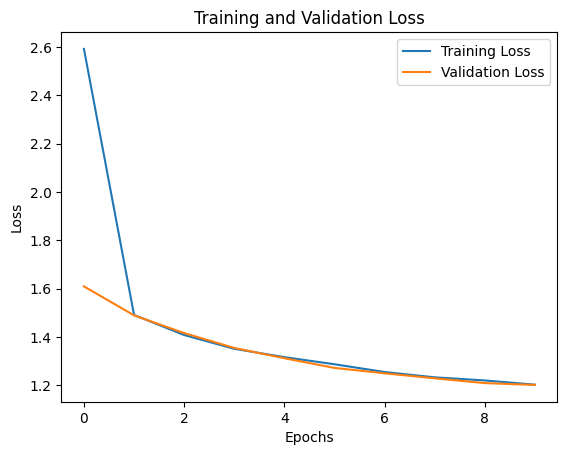

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.46109494660541017
Loss Function: huber_loss, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 2.6307 - mse: 14.5587 - val_loss: 1.6235 - val_mse: 6.6728
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.4948 - mse: 6.0147 - val_loss: 1.4900 - val_mse: 6.0026
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.4125 - mse: 5.6221 - val_loss: 1.4206 - val_mse: 5.6740
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3601 - mse: 5.3559 - val_loss: 1.3677 - val_mse: 5.4134
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3163 - mse: 5.1327 - val_loss: 1.3167 - val_mse: 5.1472
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2848 - mse: 4.9572 - val_loss: 1.2805 - val_mse: 4.9597
Epoc

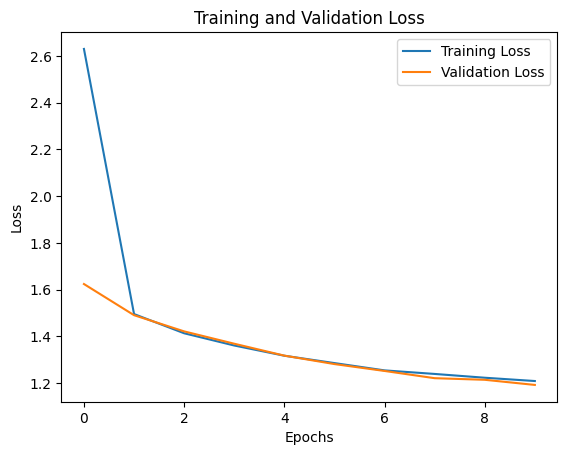

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.45707063374926693
Loss Function: huber_loss, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 2.2907 - mae: 2.7495 - val_loss: 1.5005 - val_mae: 1.9401
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3820 - mae: 1.8172 - val_loss: 1.3354 - val_mae: 1.7649
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2888 - mae: 1.7206 - val_loss: 1.2609 - val_mae: 1.6928
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2359 - mae: 1.6644 - val_loss: 1.2050 - val_mae: 1.6301
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 1.1990 - mae: 1.6283 - val_loss: 1.1826 - val_mae: 1.6083
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 1.1754 - mae: 1.6030 - val_loss: 1.1550 - val_mae: 1.5827
Epoch

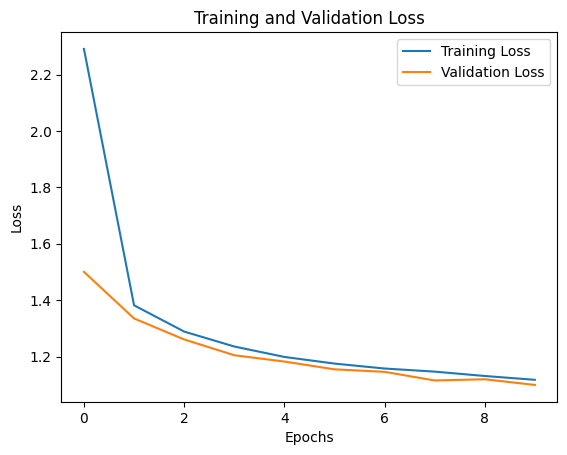

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5426662843528386
Loss Function: huber_loss, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 17ms/step - loss: 2.3352 - mse: 12.5649 - val_loss: 1.5179 - val_mse: 6.1064
Epoch 2/10
128/128 [==============================] - 1s 12ms/step - loss: 1.3893 - mse: 5.5256 - val_loss: 1.3632 - val_mse: 5.4205
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2998 - mse: 5.0439 - val_loss: 1.2649 - val_mse: 4.9761
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2486 - mse: 4.7636 - val_loss: 1.2109 - val_mse: 4.6191
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2092 - mse: 4.5213 - val_loss: 1.1739 - val_mse: 4.4191
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1820 - mse: 4.3869 - val_loss: 1.1539 - val_mse: 4.2578
Epoch

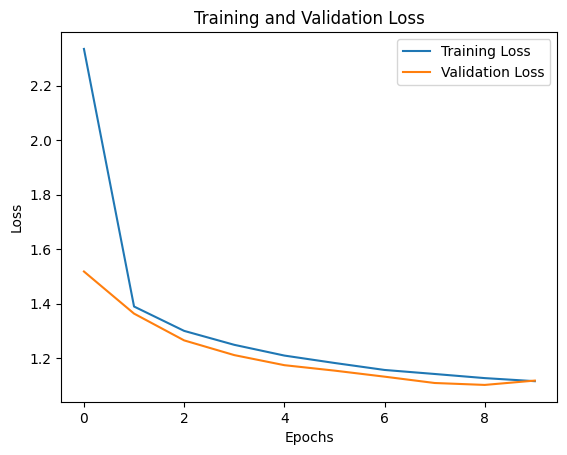

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.539701759103163
Loss Function: huber_loss, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 2.2141 - mae: 2.6740 - val_loss: 1.4964 - val_mae: 1.9433
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3733 - mae: 1.8118 - val_loss: 1.3460 - val_mae: 1.7874
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2795 - mae: 1.7109 - val_loss: 1.2533 - val_mae: 1.6853
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2228 - mae: 1.6517 - val_loss: 1.1987 - val_mae: 1.6301
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2061 - mae: 1.6367 - val_loss: 1.1680 - val_mae: 1.5953
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1799 - mae: 1.6080 - val_loss: 1.1507 - val_mae: 1.5756
Epoch 7/1

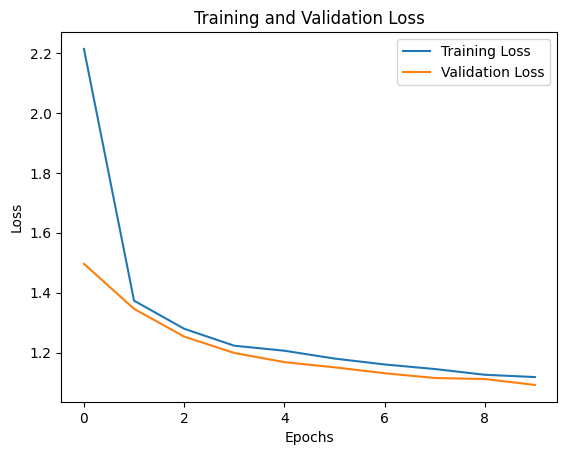

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.53402129840352
Loss Function: huber_loss, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 2.2668 - mse: 11.9556 - val_loss: 1.4845 - val_mse: 6.0440
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3809 - mse: 5.4527 - val_loss: 1.3417 - val_mse: 5.3300
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2926 - mse: 4.9954 - val_loss: 1.2588 - val_mse: 4.9015
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2461 - mse: 4.7392 - val_loss: 1.2127 - val_mse: 4.6029
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2134 - mse: 4.5515 - val_loss: 1.2001 - val_mse: 4.4522
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1855 - mse: 4.3956 - val_loss: 1.1596 - val_mse: 4.2809
Epoch 7/10

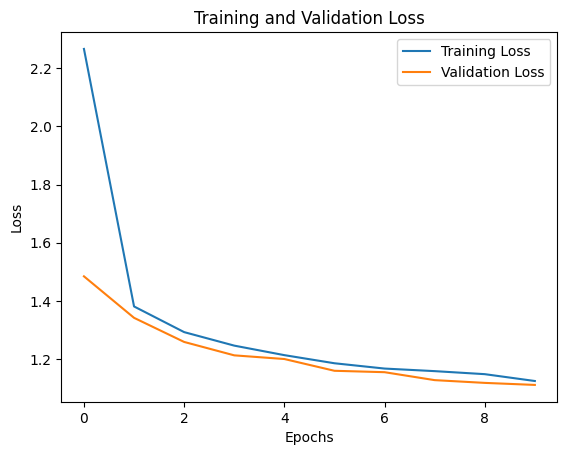

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5287591176771871
Loss Function: huber_loss, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: 4.3356 - mae: 4.8264 - val_loss: 3.4170 - val_mae: 3.8959
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.5801 - mae: 3.0487 - val_loss: 2.1251 - val_mae: 2.5873
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 1.7877 - mae: 2.2492 - val_loss: 1.7233 - val_mae: 2.1975
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5983 - mae: 2.0609 - val_loss: 1.6210 - val_mae: 2.0872
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5255 - mae: 1.9808 - val_loss: 1.5576 - val_mae: 2.0193
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4851 - mae: 1.9341 - val_loss: 1.5211 - val_mae: 1.9756
Epoch 7/10


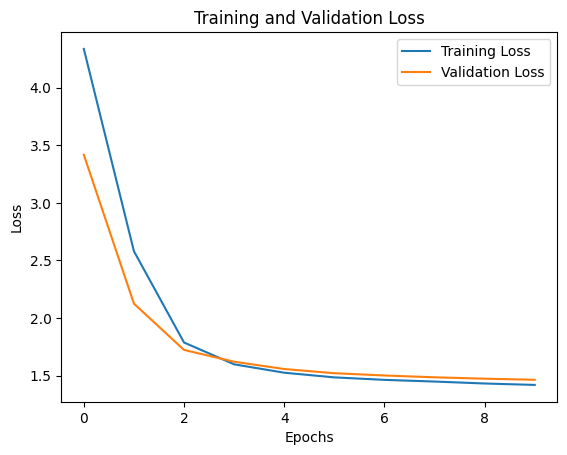

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.20381775775749789
Loss Function: huber_loss, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.3487 - mse: 29.2566 - val_loss: 3.4480 - val_mse: 20.4426
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 2.5967 - mse: 13.3765 - val_loss: 2.1375 - val_mse: 9.6601
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.7985 - mse: 7.4367 - val_loss: 1.7259 - val_mse: 7.0386
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.6006 - mse: 6.3475 - val_loss: 1.6223 - val_mse: 6.5634
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.5224 - mse: 6.0593 - val_loss: 1.5583 - val_mse: 6.3662
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.4891 - mse: 5.9689 - val_loss: 1.5216 - val_mse: 6.2507
Epoch 7

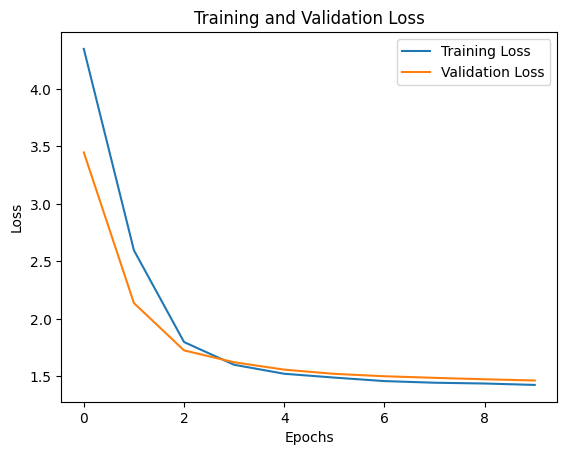

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.1991125100643859
Loss Function: huber_loss, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.0162 - mae: 2.4736 - val_loss: 1.4468 - val_mae: 1.8807
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3363 - mae: 1.7700 - val_loss: 1.2786 - val_mae: 1.7113
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2478 - mae: 1.6757 - val_loss: 1.2040 - val_mae: 1.6270
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2168 - mae: 1.6447 - val_loss: 1.1764 - val_mae: 1.5979
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1807 - mae: 1.6070 - val_loss: 1.1520 - val_mae: 1.5798
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1662 - mae: 1.5930 - val_loss: 1.1360 - val_mae: 1.5637
Epoch

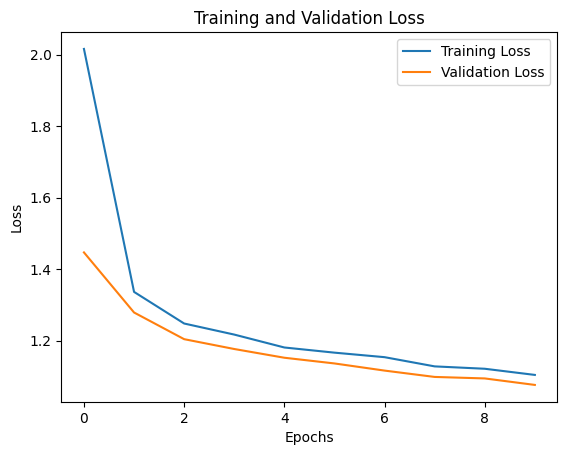

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5455541296631056
Loss Function: huber_loss, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.9968 - mse: 9.7902 - val_loss: 1.4338 - val_mse: 5.7837
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3378 - mse: 5.2457 - val_loss: 1.2821 - val_mse: 5.0723
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.2407 - mse: 4.7273 - val_loss: 1.2254 - val_mse: 4.6538
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2038 - mse: 4.5158 - val_loss: 1.1704 - val_mse: 4.3731
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1792 - mse: 4.3762 - val_loss: 1.1463 - val_mse: 4.2470
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.1608 - mse: 4.2709 - val_loss: 1.1269 - val_mse: 4.1273
Epoc

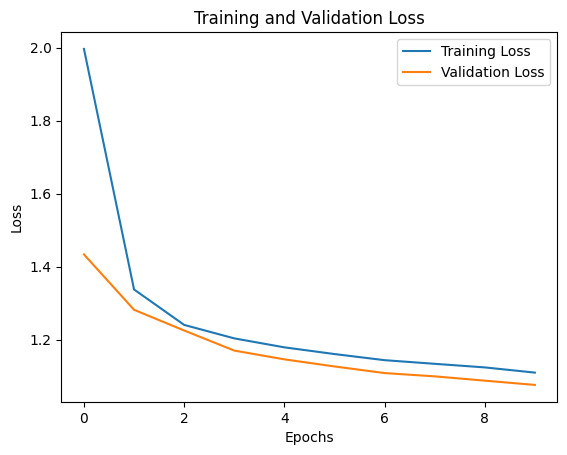

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5440209806710323
Loss Function: huber_loss, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.1976 - mae: 5.6868 - val_loss: 5.1549 - val_mae: 5.6454
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9705 - mae: 5.4656 - val_loss: 4.9378 - val_mae: 5.4343
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.7534 - mae: 5.2516 - val_loss: 4.7250 - val_mae: 5.2243
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5378 - mae: 5.0369 - val_loss: 4.5146 - val_mae: 5.0139
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.3222 - mae: 4.8201 - val_loss: 4.3067 - val_mae: 4.8031
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.1141 - mae: 4.6083 - val_loss: 4.1032 - val_mae: 4.5935
Epoch 7

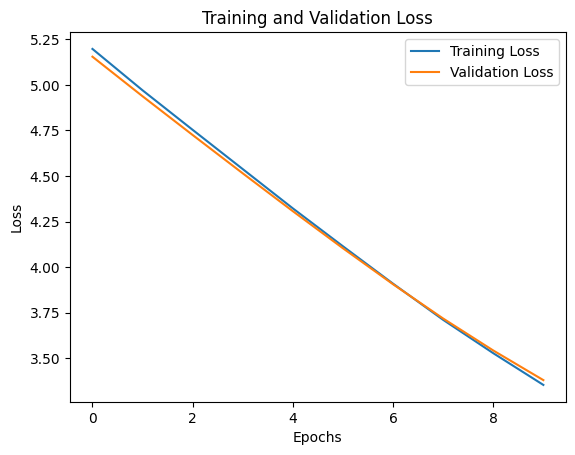

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.022310288667431122
Loss Function: huber_loss, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 5.2432 - mse: 38.8166 - val_loss: 5.2048 - val_mse: 38.6682
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 5.0270 - mse: 36.3287 - val_loss: 4.9972 - val_mse: 36.2610
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8168 - mse: 33.9928 - val_loss: 4.7900 - val_mse: 33.9275
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.6067 - mse: 31.7258 - val_loss: 4.5823 - val_mse: 31.6582
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3942 - mse: 29.5164 - val_loss: 4.3747 - val_mse: 29.4658
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.1832 - mse: 27.3956 - val_loss: 4.1691 - val_m

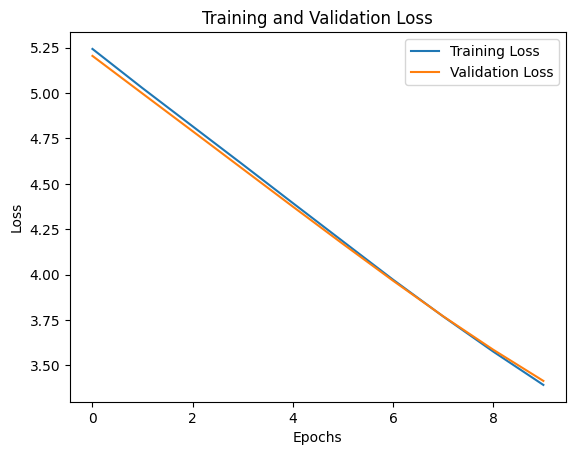

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.019992696607959104
Loss Function: huber_loss, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 5.3615 - mae: 5.8461 - val_loss: 5.4265 - val_mae: 5.9066
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3465 - mae: 5.8313 - val_loss: 5.4108 - val_mae: 5.8915
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 5.3297 - mae: 5.8149 - val_loss: 5.3940 - val_mae: 5.8753
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3127 - mae: 5.7984 - val_loss: 5.3762 - val_mae: 5.8583
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2940 - mae: 5.7804 - val_loss: 5.3576 - val_mae: 5.8405
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2745 - mae: 5.7616 - val_loss: 5.3382 - val_mae: 5.8220

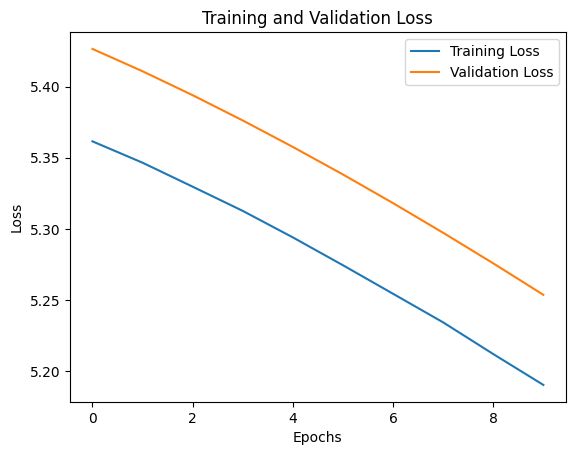

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: huber_loss, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 5.3280 - mse: 39.7997 - val_loss: 5.3938 - val_mse: 40.8952
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3129 - mse: 39.6217 - val_loss: 5.3781 - val_mse: 40.7047
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2965 - mse: 39.4281 - val_loss: 5.3611 - val_mse: 40.5008
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2787 - mse: 39.2184 - val_loss: 5.3432 - val_mse: 40.2852
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2600 - mse: 38.9992 - val_loss: 5.3244 - val_mse: 40.0596
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 5.2408 - mse: 38.7759 - val_loss: 5.3048 - val_

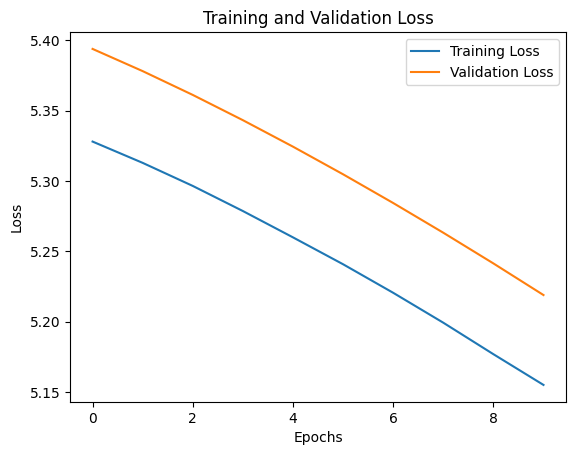

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -3.816526833366751e-05
Loss Function: huber_loss, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 2.5584 - mae: 3.0271 - val_loss: 1.6175 - val_mae: 2.0841
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.4869 - mae: 1.9344 - val_loss: 1.4895 - val_mae: 1.9361
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.4062 - mae: 1.8454 - val_loss: 1.4149 - val_mae: 1.8528
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3538 - mae: 1.7884 - val_loss: 1.3569 - val_mae: 1.7921
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 1.3123 - mae: 1.7465 - val_loss: 1.3159 - val_mae: 1.7472
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2802 - mae: 1.7107 - val_loss: 1.2705 - val_mae: 1.6993

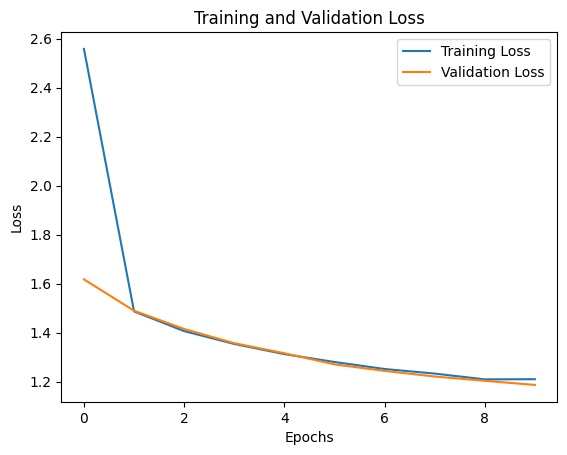

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.46075437217519477
Loss Function: huber_loss, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 2.6186 - mse: 14.4461 - val_loss: 1.6211 - val_mse: 6.7389
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.4945 - mse: 6.0591 - val_loss: 1.4889 - val_mse: 6.0010
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.4076 - mse: 5.5715 - val_loss: 1.4206 - val_mse: 5.6661
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3577 - mse: 5.3184 - val_loss: 1.3607 - val_mse: 5.4070
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3232 - mse: 5.1687 - val_loss: 1.3197 - val_mse: 5.1776
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.2857 - mse: 4.9603 - val_loss: 1.2817 - val_mse: 4.9985
Epoch 

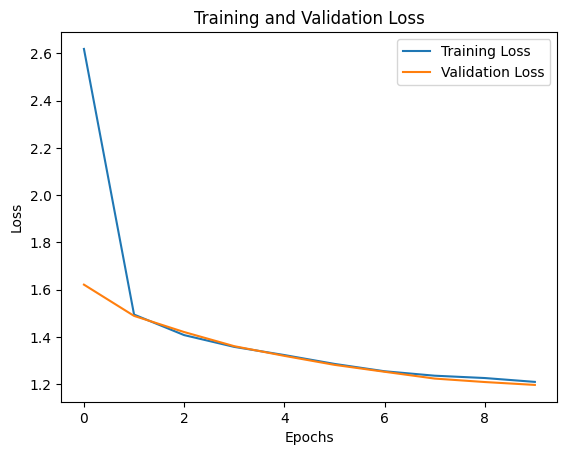

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.45251293528588477
Loss Function: huber_loss, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 2.3018 - mae: 2.7627 - val_loss: 1.4774 - val_mae: 1.9188
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.3714 - mae: 1.8071 - val_loss: 1.3347 - val_mae: 1.7658
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2857 - mae: 1.7162 - val_loss: 1.2729 - val_mae: 1.7082
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2326 - mae: 1.6623 - val_loss: 1.2030 - val_mae: 1.6269
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1919 - mae: 1.6198 - val_loss: 1.1587 - val_mae: 1.5798
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1689 - mae: 1.5955 - val_loss: 1.1430 - val_mae: 1.5691
Epo

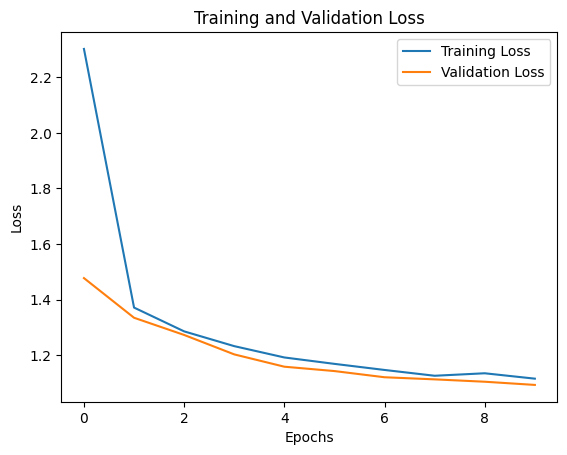

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5492525130876468
Loss Function: huber_loss, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 16ms/step - loss: 2.3082 - mse: 12.3158 - val_loss: 1.5052 - val_mse: 6.0665
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 1.3760 - mse: 5.4492 - val_loss: 1.3408 - val_mse: 5.2813
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2829 - mse: 4.9311 - val_loss: 1.2504 - val_mse: 4.8460
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.2323 - mse: 4.6732 - val_loss: 1.1964 - val_mse: 4.5444
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.1906 - mse: 4.4280 - val_loss: 1.1710 - val_mse: 4.3425
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.1684 - mse: 4.3049 - val_loss: 1.1505 - val_mse: 4.2273
Epo

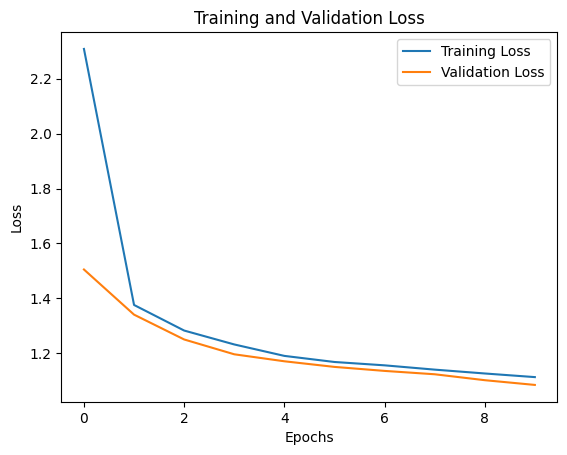

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.552099408068278
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.4763 - mae: 4.9754 - val_loss: 4.4904 - val_mae: 4.9904
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4051 - mae: 4.9046 - val_loss: 4.4895 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4046 - mae: 4.9041 - val_loss: 4.4893 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4892 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mae: 4.9039 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mae: 4.9038 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 7/1

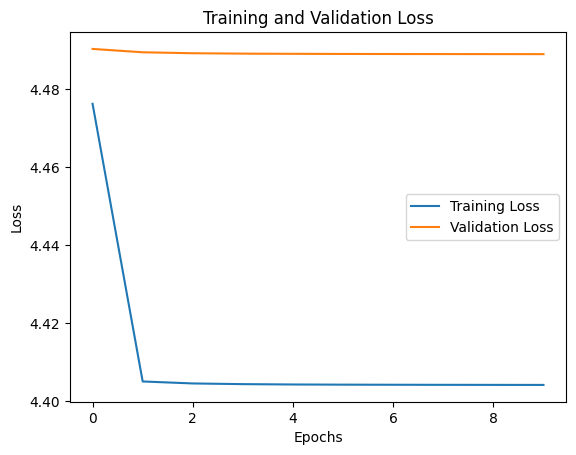

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 4.4781 - mse: 30.2806 - val_loss: 4.4905 - val_mse: 30.5347
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4051 - mse: 29.4847 - val_loss: 4.4895 - val_mse: 30.5241
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4046 - mse: 29.4788 - val_loss: 4.4893 - val_mse: 30.5212
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4044 - mse: 29.4768 - val_loss: 4.4892 - val_mse: 30.5201
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4043 - mse: 29.4759 - val_loss: 4.4891 - val_mse: 30.5194
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mse: 29.4754 - val_loss: 4.4891 - val_mse: 30

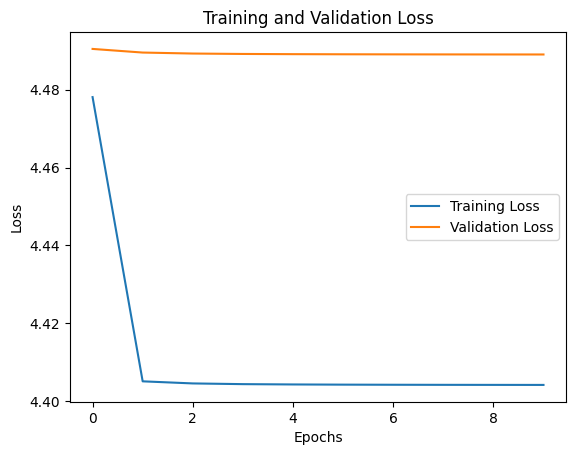

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.7882 - mae: 5.2846 - val_loss: 4.6340 - val_mae: 5.1336
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5018 - mae: 5.0013 - val_loss: 4.5539 - val_mae: 5.0538
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4562 - mae: 4.9558 - val_loss: 4.5293 - val_mae: 5.0293
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4391 - mae: 4.9387 - val_loss: 4.5178 - val_mae: 5.0178
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4301 - mae: 4.9297 - val_loss: 4.5113 - val_mae: 5.0112
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4247 - mae: 4.9243 - val_loss: 4.5070 - val_mae: 5.0070
Epoch 7/10

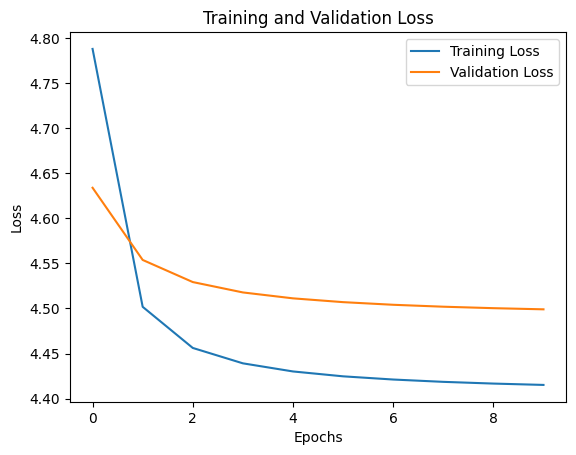

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.7929 - mse: 33.7379 - val_loss: 4.6288 - val_mse: 32.0603
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4977 - mse: 30.4714 - val_loss: 4.5510 - val_mse: 31.1994
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4538 - mse: 30.0012 - val_loss: 4.5275 - val_mse: 30.9406
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4374 - mse: 29.8272 - val_loss: 4.5165 - val_mse: 30.8203
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.4289 - mse: 29.7366 - val_loss: 4.5102 - val_mse: 30.7517
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4238 - mse: 29.6822 - val_loss: 4.5062 - val_mse: 30.707

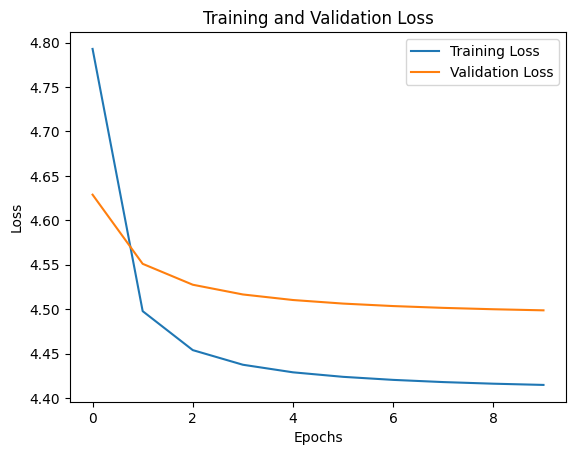

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4543 - mae: 4.9536 - val_loss: 4.4896 - val_mae: 4.9896
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4042 - mae: 4.9038 - val_loss: 4.4890 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4042 - mae: 4.9038 - val_loss: 4.4890 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4042 - mae: 4.9037 - val_loss: 4.4890 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4042 - mae: 4.9037 - val_loss: 4.4890 - val_mae: 4.9890
Epoc

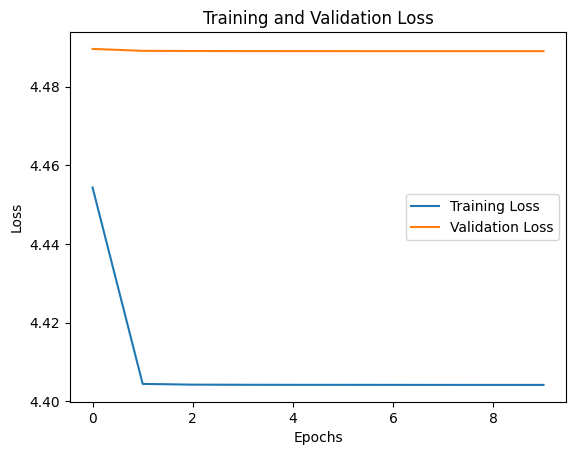

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4487 - mse: 29.9605 - val_loss: 4.4895 - val_mse: 30.5238
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4044 - mse: 29.4768 - val_loss: 4.4891 - val_mse: 30.5192
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4042 - mse: 29.4749 - val_loss: 4.4890 - val_mse: 30.5187
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4042 - mse: 29.4746 - val_loss: 4.4890 - val_mse: 30.5185
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4042 - mse: 29.4744 - val_loss: 4.4890 - val_mse: 30.5184
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4042 - mse: 29.4744 - val_loss: 4.4890 - val_mse: 30

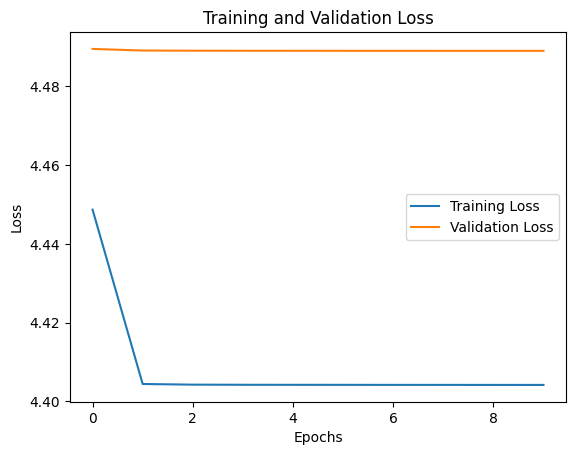

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.2025 - mae: 5.6911 - val_loss: 5.1806 - val_mae: 5.6698
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0265 - mae: 5.5202 - val_loss: 5.0292 - val_mae: 5.5231
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.8926 - mae: 5.3890 - val_loss: 4.9152 - val_mae: 5.4118
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7933 - mae: 5.2910 - val_loss: 4.8313 - val_mae: 5.3292
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.7201 - mae: 5.2186 - val_loss: 4.7695 - val_mae: 5.2681
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.6651 - mae: 5.1639 - val_loss: 4.7233 - val_mae: 5.2224
Epoch 

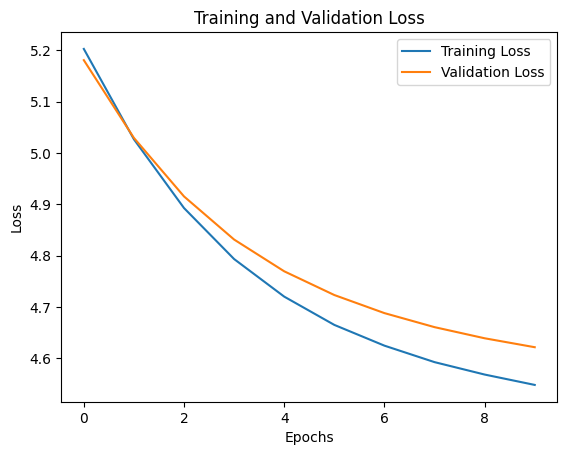

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 5.2439 - mse: 38.8577 - val_loss: 5.2299 - val_mse: 38.9841
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 5.0812 - mse: 36.9765 - val_loss: 5.0859 - val_mse: 37.2923
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.9503 - mse: 35.4790 - val_loss: 4.9711 - val_mse: 35.9600
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.8469 - mse: 34.3199 - val_loss: 4.8820 - val_mse: 34.9361
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7682 - mse: 33.4373 - val_loss: 4.8138 - val_mse: 34.1581
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.7069 - mse: 32.7654 - val_loss: 4.7616 - val_mse: 33

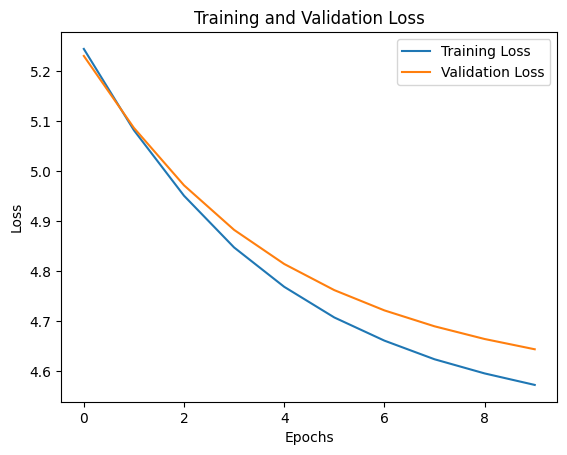

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 5.3620 - mae: 5.8465 - val_loss: 5.4275 - val_mae: 5.9076
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3483 - mae: 5.8329 - val_loss: 5.4137 - val_mae: 5.8943
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3341 - mae: 5.8191 - val_loss: 5.3989 - val_mae: 5.8803
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3188 - mae: 5.8045 - val_loss: 5.3834 - val_mae: 5.8655
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3027 - mae: 5.7890 - val_loss: 5.3671 - val_mae: 5.8501
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2860 - mae: 5.7728 - val_loss: 5.3503 - val_mae: 5.8340
Epoch

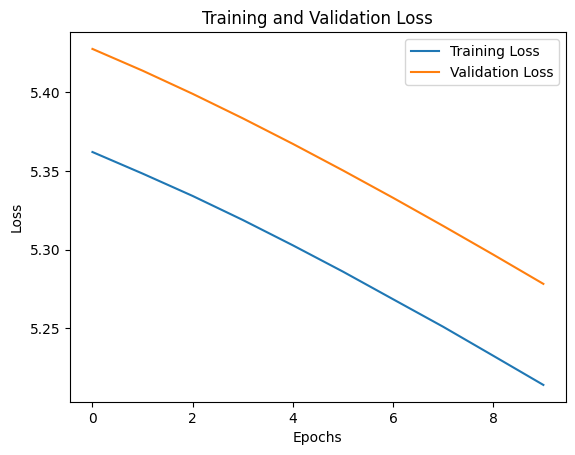

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 5.3653 - mse: 40.2612 - val_loss: 5.4309 - val_mse: 41.3602
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 5.3528 - mse: 40.1146 - val_loss: 5.4184 - val_mse: 41.2089
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 5.3394 - mse: 39.9545 - val_loss: 5.4050 - val_mse: 41.0466
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3257 - mse: 39.7933 - val_loss: 5.3908 - val_mse: 40.8753
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 5.3108 - mse: 39.6183 - val_loss: 5.3759 - val_mse: 40.6963
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 5.2956 - mse: 39.4363 - val_loss: 5.3604 - val_mse:

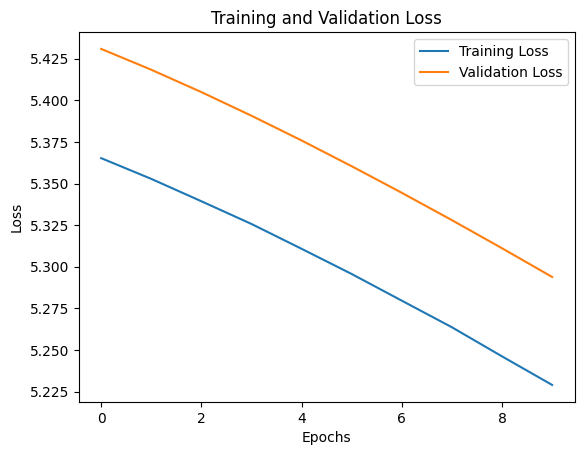

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.5016 - mae: 5.0008 - val_loss: 4.4949 - val_mae: 4.9949
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4082 - mae: 4.9078 - val_loss: 4.4915 - val_mae: 4.9915
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4062 - mae: 4.9058 - val_loss: 4.4904 - val_mae: 4.9904
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4055 - mae: 4.9050 - val_loss: 4.4900 - val_mae: 4.9900
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4051 - mae: 4.9046 - val_loss: 4.4897 - val_mae: 4.9897
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4048 - mae: 4.9044 - val_loss: 4.4895 - val_mae: 4.9895
Epoch 7

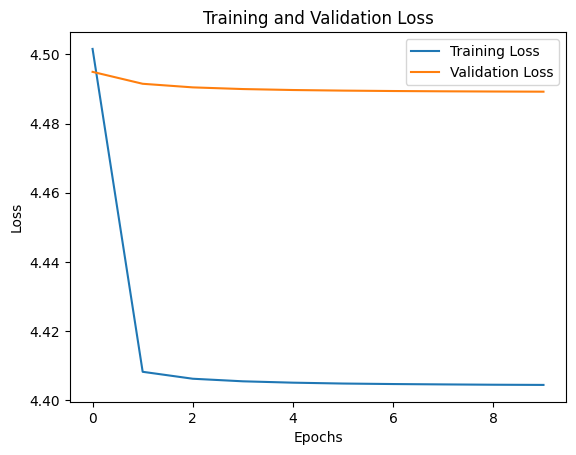

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4948 - mse: 30.4799 - val_loss: 4.4947 - val_mse: 30.5824
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4081 - mse: 29.5169 - val_loss: 4.4914 - val_mse: 30.5457
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4061 - mse: 29.4960 - val_loss: 4.4904 - val_mse: 30.5343
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4054 - mse: 29.4878 - val_loss: 4.4899 - val_mse: 30.5289
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4050 - mse: 29.4839 - val_loss: 4.4897 - val_mse: 30.5258
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4048 - mse: 29.4811 - val_loss: 4.4895 - val_mse: 30

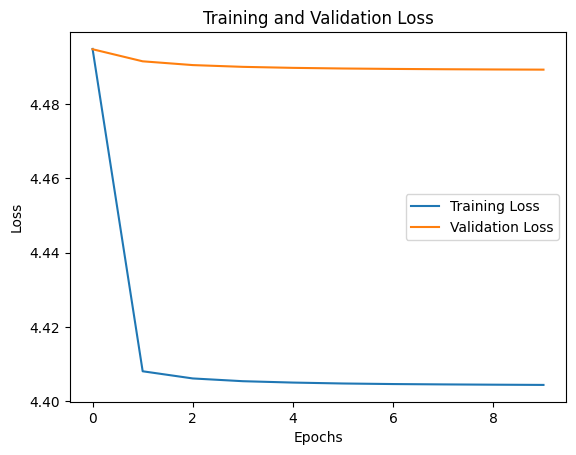

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.4901 - mae: 4.9891 - val_loss: 4.4906 - val_mae: 4.9906
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4052 - mae: 4.9048 - val_loss: 4.4896 - val_mae: 4.9896
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4046 - mae: 4.9042 - val_loss: 4.4893 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4892 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mae: 4.9039 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4043 - mae: 4.9038 - val_loss: 4.4891 - val_mae: 4.9891
Epoc

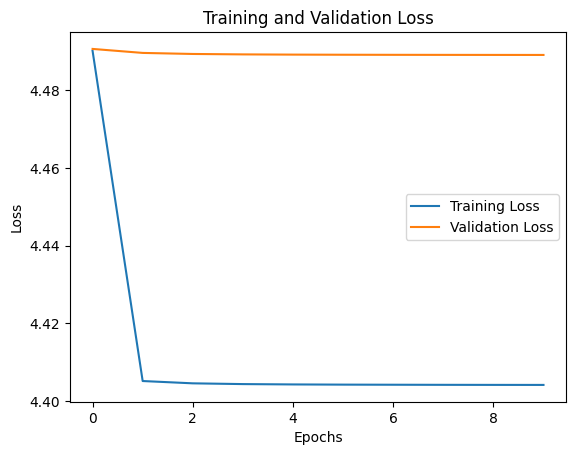

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.4885 - mse: 30.4151 - val_loss: 4.4905 - val_mse: 30.5357
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4052 - mse: 29.4853 - val_loss: 4.4895 - val_mse: 30.5243
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4046 - mse: 29.4791 - val_loss: 4.4893 - val_mse: 30.5213
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4044 - mse: 29.4769 - val_loss: 4.4892 - val_mse: 30.5201
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mse: 29.4759 - val_loss: 4.4891 - val_mse: 30.5195
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4043 - mse: 29.4754 - val_loss: 4.4891 - val_mse: 

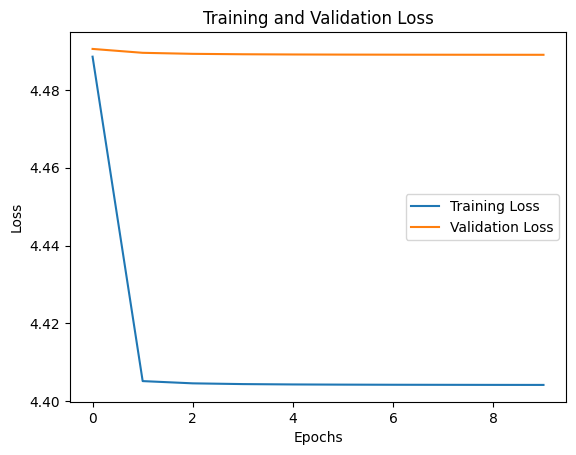

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 4.4664 - mae: 4.9657 - val_loss: 4.4914 - val_mae: 4.9914
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4057 - mae: 4.9052 - val_loss: 4.4898 - val_mae: 4.9898
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4048 - mae: 4.9044 - val_loss: 4.4894 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4045 - mae: 4.9041 - val_loss: 4.4893 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4892 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4043 - mae: 4.9039 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 

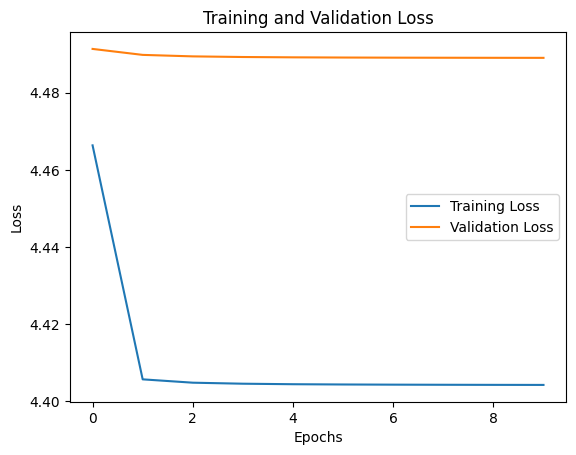

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: 4.4600 - mse: 30.0717 - val_loss: 4.4911 - val_mse: 30.5414
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4055 - mse: 29.4884 - val_loss: 4.4897 - val_mse: 30.5263
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4047 - mse: 29.4804 - val_loss: 4.4894 - val_mse: 30.5224
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4045 - mse: 29.4777 - val_loss: 4.4892 - val_mse: 30.5208
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.4044 - mse: 29.4765 - val_loss: 4.4892 - val_mse: 30.5200
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4043 - mse: 29.4758 - val_loss: 4.4891 - val_mse: 30

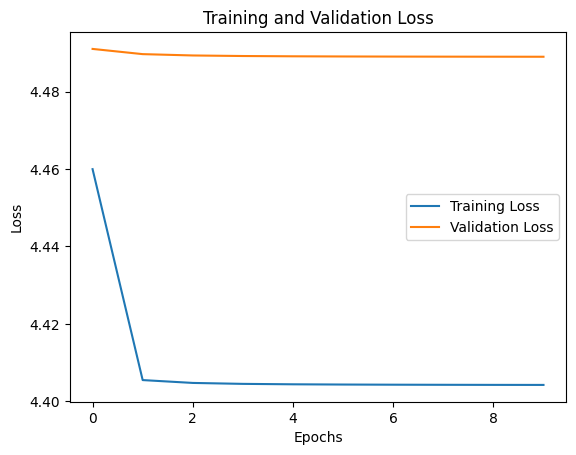

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.8168 - mae: 5.3136 - val_loss: 4.8390 - val_mae: 5.3361
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 4.7105 - mae: 5.2087 - val_loss: 4.7460 - val_mae: 5.2445
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.6294 - mae: 5.1284 - val_loss: 4.6793 - val_mae: 5.1786
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.5731 - mae: 5.0723 - val_loss: 4.6337 - val_mae: 5.1333
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5345 - mae: 5.0339 - val_loss: 4.6024 - val_mae: 5.1022
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.5078 - mae: 5.0073 - val_loss: 4.5805 - val_mae: 5.0803
Epoch 7

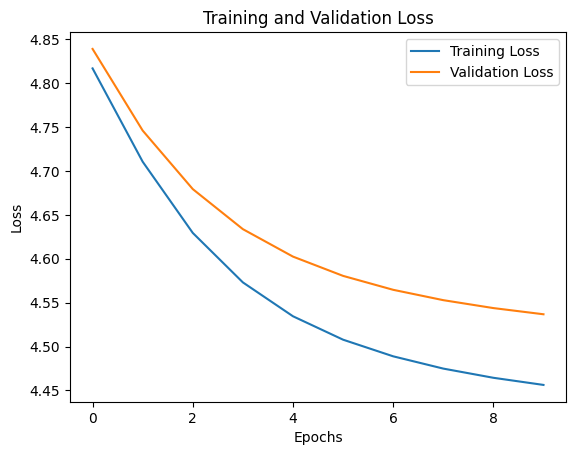

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 14s 92ms/step - loss: 4.8211 - mse: 33.9672 - val_loss: 4.8459 - val_mse: 34.4650
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.7202 - mse: 32.8618 - val_loss: 4.7566 - val_mse: 33.4627
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.6412 - mse: 32.0034 - val_loss: 4.6903 - val_mse: 32.7262
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5841 - mse: 31.3870 - val_loss: 4.6436 - val_mse: 32.2102
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5443 - mse: 30.9620 - val_loss: 4.6108 - val_mse: 31.8503
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.5159 - mse: 30.6594 - val_loss: 4.5875 - val_mse: 3

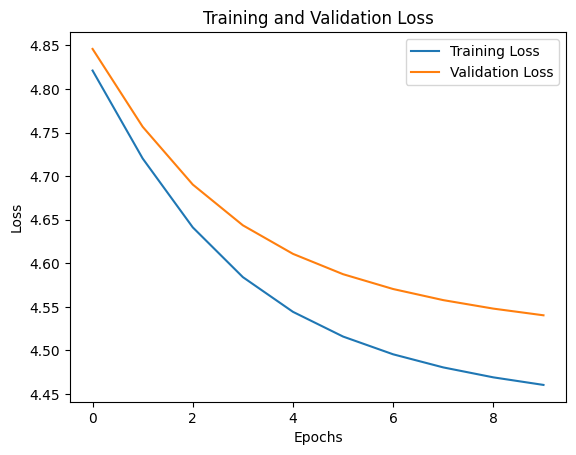

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.4629 - mae: 4.9622 - val_loss: 4.4918 - val_mae: 4.9918
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 4.4053 - mae: 4.9049 - val_loss: 4.4894 - val_mae: 4.9894
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4892 - val_mae: 4.9892
Epoch 4/10
128/128 [==============================] - 1s 12ms/step - loss: 4.4043 - mae: 4.9039 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4042 - mae: 4.9038 - val_loss: 4.4891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4042 - mae: 4.9038 - val_loss: 4.4890 - val_mae: 4.989

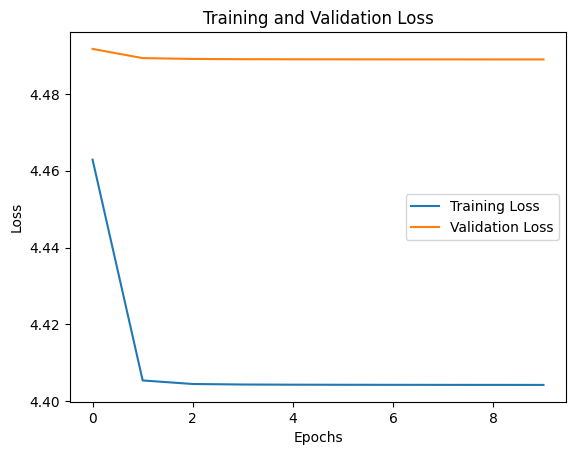

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4658 - mse: 30.1383 - val_loss: 4.4920 - val_mse: 30.5522
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4054 - mse: 29.4879 - val_loss: 4.4894 - val_mse: 30.5225
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4044 - mse: 29.4770 - val_loss: 4.4892 - val_mse: 30.5199
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4043 - mse: 29.4756 - val_loss: 4.4891 - val_mse: 30.5192
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4042 - mse: 29.4751 - val_loss: 4.4891 - val_mse: 30.5189
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4042 - mse: 29.4748 - val_loss: 4.4890 - val

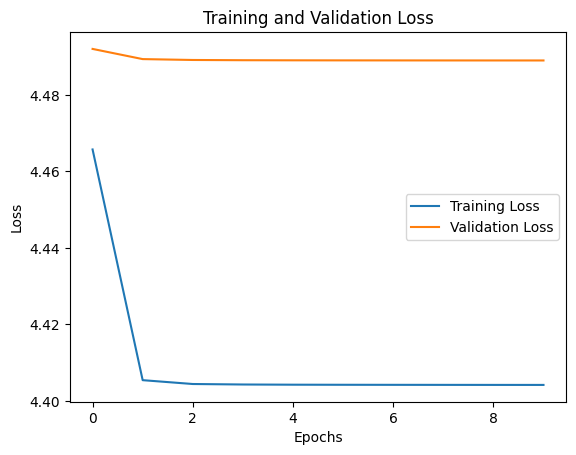

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.8665 - mae: 5.3624 - val_loss: 4.9350 - val_mae: 5.4302
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8490 - mae: 5.3453 - val_loss: 4.9187 - val_mae: 5.4143
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.8329 - mae: 5.3295 - val_loss: 4.9032 - val_mae: 5.3991
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8175 - mae: 5.3143 - val_loss: 4.8880 - val_mae: 5.3843
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8023 - mae: 5.2993 - val_loss: 4.8732 - val_mae: 5.3698
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.7870 - mae: 5.2843 - val_loss: 4.8585 - val_mae: 5.355

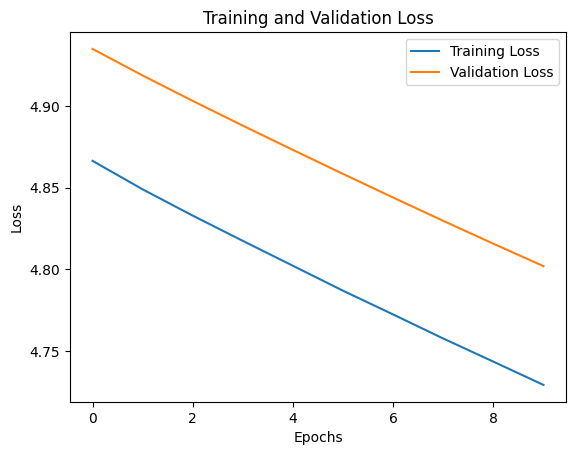

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.8670 - mse: 34.4608 - val_loss: 4.9366 - val_mse: 35.4792
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8513 - mse: 34.2871 - val_loss: 4.9220 - val_mse: 35.3132
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.8368 - mse: 34.1260 - val_loss: 4.9080 - val_mse: 35.1548
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8228 - mse: 33.9717 - val_loss: 4.8944 - val_mse: 35.0003
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8091 - mse: 33.8211 - val_loss: 4.8809 - val_mse: 34.8483
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: 4.7954 - mse: 33.6706 - val_loss: 4.8676 - val

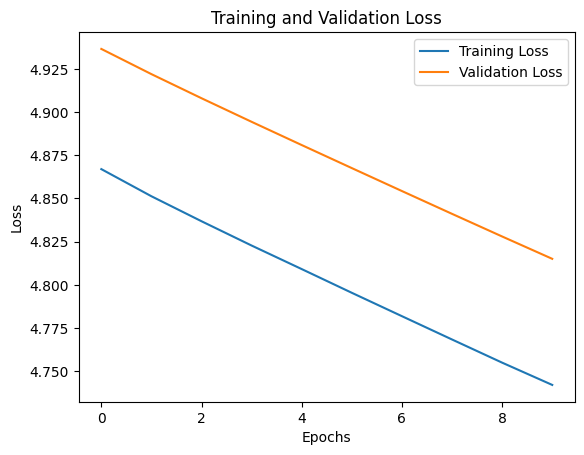

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 4.8687 - mae: 5.3647 - val_loss: 4.9446 - val_mae: 5.4397
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 4.8659 - mae: 5.3620 - val_loss: 4.9417 - val_mae: 5.4369
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.8630 - mae: 5.3591 - val_loss: 4.9387 - val_mae: 5.4340
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 4.8598 - mae: 5.3560 - val_loss: 4.9356 - val_mae: 5.4309
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8566 - mae: 5.3529 - val_loss: 4.9324 - val_mae: 5.4278
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8533 - mae: 5.3496 - val_loss: 4.9290 - val_mae: 5.42

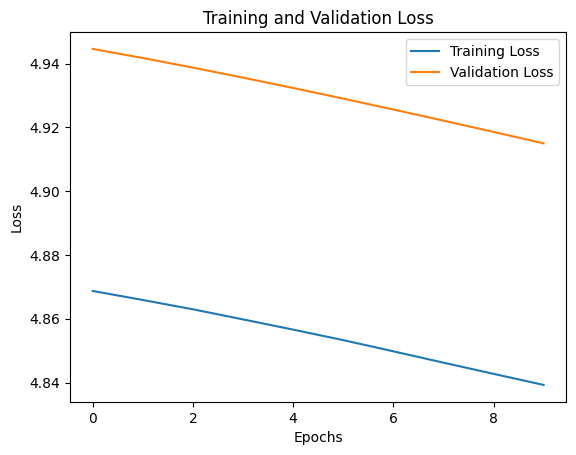

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.8854 - mse: 34.6762 - val_loss: 4.9618 - val_mse: 35.7796
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 4.8830 - mse: 34.6498 - val_loss: 4.9593 - val_mse: 35.7514
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8803 - mse: 34.6198 - val_loss: 4.9567 - val_mse: 35.7217
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8777 - mse: 34.5919 - val_loss: 4.9540 - val_mse: 35.6907
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.8748 - mse: 34.5591 - val_loss: 4.9512 - val_mse: 35.6589
Epoch 6/10
128/128 [==============================] - 2s 12ms/step - loss: 4.8719 - mse: 34.5275 - val_loss: 4.9483 - va

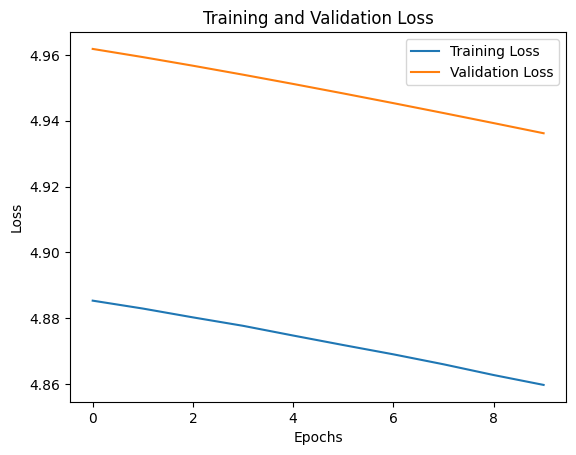

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.0016524286606096616
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: 4.4934 - mae: 4.9926 - val_loss: 4.4971 - val_mae: 4.9970
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: 4.4093 - mae: 4.9088 - val_loss: 4.4920 - val_mae: 4.9920
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: 4.4066 - mae: 4.9061 - val_loss: 4.4907 - val_mae: 4.9907
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4057 - mae: 4.9052 - val_loss: 4.4901 - val_mae: 4.9901
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4052 - mae: 4.9048 - val_loss: 4.4898 - val_mae: 4.9898
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4049 - mae: 4.9045 - val_loss: 4.4896 - val_mae: 4.9896

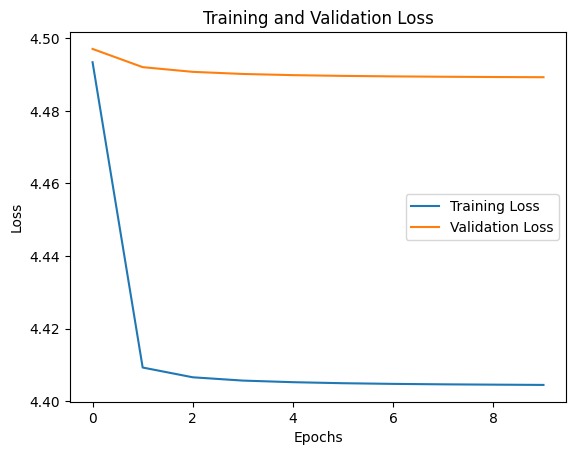

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 4.4882 - mse: 30.3938 - val_loss: 4.4963 - val_mse: 30.6002
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4089 - mse: 29.5248 - val_loss: 4.4919 - val_mse: 30.5503
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4064 - mse: 29.4989 - val_loss: 4.4907 - val_mse: 30.5367
Epoch 4/10
128/128 [==============================] - 2s 13ms/step - loss: 4.4056 - mse: 29.4899 - val_loss: 4.4901 - val_mse: 30.5305
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 4.4052 - mse: 29.4850 - val_loss: 4.4898 - val_mse: 30.5270
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4049 - mse: 29.4823 - val_loss: 4.4896 - val_

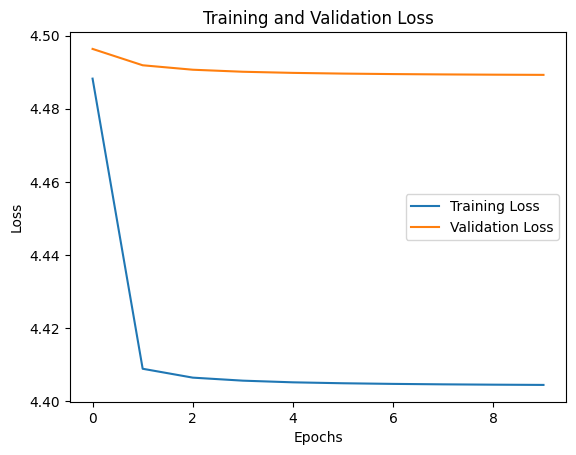

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 6s 18ms/step - loss: 4.4704 - mae: 4.9698 - val_loss: 4.4913 - val_mae: 4.9913
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4056 - mae: 4.9052 - val_loss: 4.4898 - val_mae: 4.9898
Epoch 3/10
128/128 [==============================] - 2s 13ms/step - loss: 4.4048 - mae: 4.9044 - val_loss: 4.4894 - val_mae: 4.9894
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4045 - mae: 4.9041 - val_loss: 4.4893 - val_mae: 4.9893
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4044 - mae: 4.9040 - val_loss: 4.4892 - val_mae: 4.9892
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4043 - mae: 4.9039 - val_loss: 4.4891 - val_mae: 4.9891


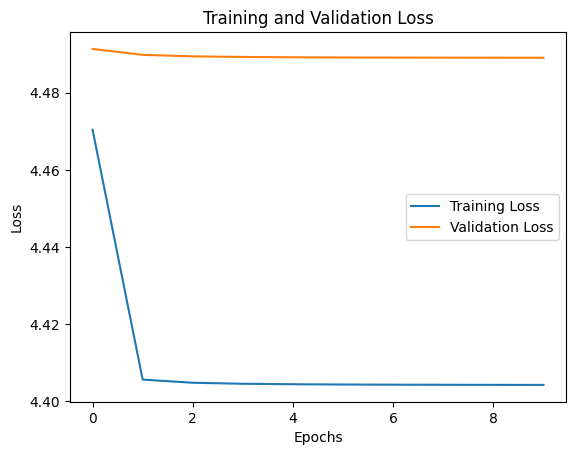

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: huber_loss, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 16ms/step - loss: 4.4778 - mse: 30.2596 - val_loss: 4.4920 - val_mse: 30.5512
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4060 - mse: 29.4938 - val_loss: 4.4900 - val_mse: 30.5294
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4049 - mse: 29.4826 - val_loss: 4.4895 - val_mse: 30.5241
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4046 - mse: 29.4791 - val_loss: 4.4893 - val_mse: 30.5219
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4045 - mse: 29.4774 - val_loss: 4.4892 - val_mse: 30.5207
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4044 - mse: 29.4765 - val_loss: 4.4892 - val_m

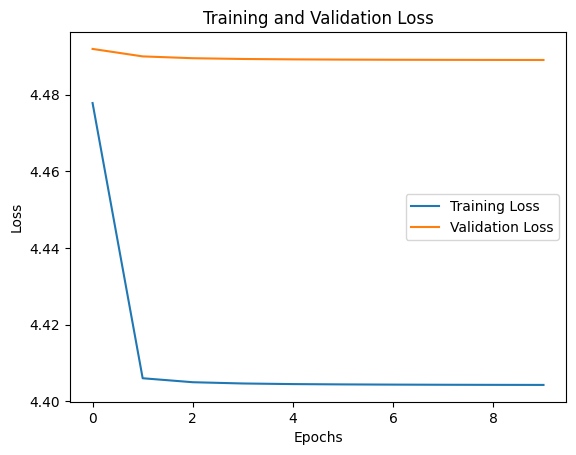

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: -0.8791 - mae: 3.8153 - val_loss: -4.1573 - val_mae: 2.6986
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: -4.3026 - mae: 2.2905 - val_loss: -4.5064 - val_mae: 2.2290
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: -4.4212 - mae: 2.0791 - val_loss: -4.5623 - val_mae: 2.1188
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4613 - mae: 1.9926 - val_loss: -4.5950 - val_mae: 2.0431
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: -4.4889 - mae: 1.9266 - val_loss: -4.6257 - val_mae: 1.9731
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5079 - mae: 1.8879 - val_loss: -4.6535 - val_mae: 1.9

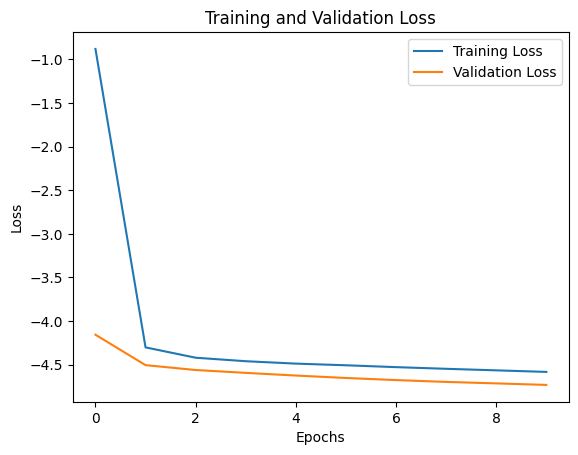

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.39188201823502355
Loss Function: poisson, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: -0.6843 - mse: 20.2106 - val_loss: -4.1288 - val_mse: 10.4649
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -4.2943 - mse: 7.6968 - val_loss: -4.5005 - val_mse: 7.3310
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4189 - mse: 6.5704 - val_loss: -4.5542 - val_mse: 6.7691
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4535 - mse: 6.1987 - val_loss: -4.5823 - val_mse: 6.4651
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4712 - mse: 6.0188 - val_loss: -4.6060 - val_mse: 6.2177
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: -4.4914 - mse: 5.8114 - val_loss: -4.6269 - val_mse: 6.002

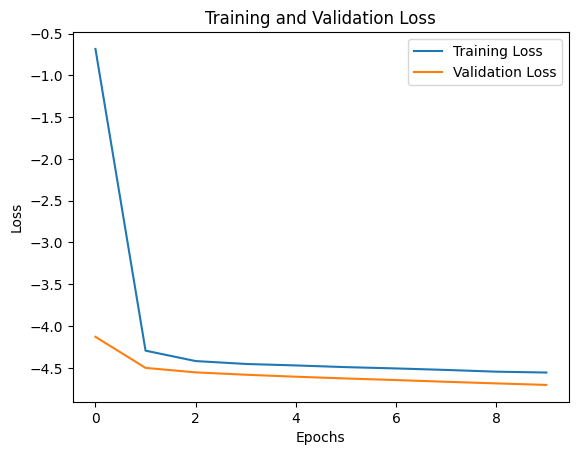

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3569188919678262
Loss Function: poisson, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: -3.2782 - mae: 2.7423 - val_loss: -4.3170 - val_mae: 2.4953
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -4.3294 - mae: 2.2291 - val_loss: -4.4941 - val_mae: 2.2353
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: -4.4143 - mae: 2.0976 - val_loss: -4.5415 - val_mae: 2.1609
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4410 - mae: 2.0473 - val_loss: -4.5613 - val_mae: 2.1207
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: -4.4547 - mae: 2.0200 - val_loss: -4.5727 - val_mae: 2.0966
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4616 - mae: 2.0007 - val_loss: -4.5810 - val_mae: 2.0804
Ep

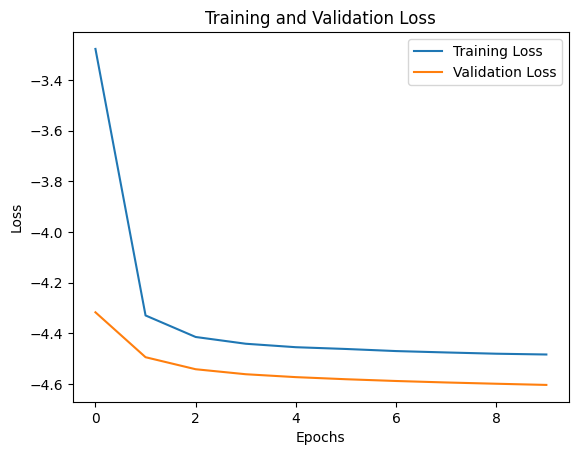

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.13453545111038845
Loss Function: poisson, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: -3.6047 - mse: 10.7855 - val_loss: -4.4090 - val_mse: 8.8566
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -4.3410 - mse: 7.7023 - val_loss: -4.5260 - val_mse: 7.1792
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4254 - mse: 6.5358 - val_loss: -4.5750 - val_mse: 6.5356
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4617 - mse: 6.0702 - val_loss: -4.5948 - val_mse: 6.2921
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4770 - mse: 5.8854 - val_loss: -4.6031 - val_mse: 6.1962
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4838 - mse: 5.8066 - val_loss: -4.6071 - val_mse: 6.1516


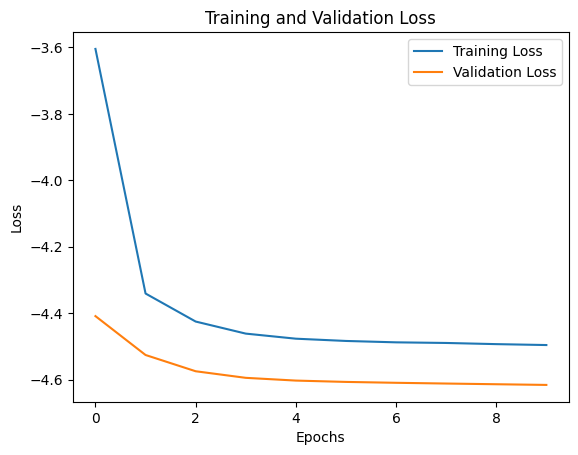

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.09735865026270374
Loss Function: poisson, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: -1.6601 - mae: 3.2979 - val_loss: -4.5867 - val_mae: 2.0627
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5304 - mae: 1.8442 - val_loss: -4.7220 - val_mae: 1.7611
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5878 - mae: 1.7114 - val_loss: -4.7552 - val_mae: 1.7062
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: -4.5993 - mae: 1.6634 - val_loss: -4.7782 - val_mae: 1.6495
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -4.6197 - mae: 1.6309 - val_loss: -4.7989 - val_mae: 1.6032
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: -4.6269 - mae: 1.5965 - val_loss: -4.8099 - val_mae: 1.576

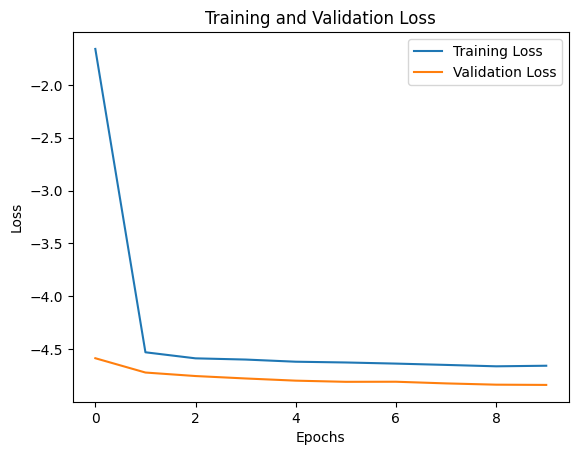

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5415933947603679
Loss Function: poisson, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 0.5186 - mse: 20.0331 - val_loss: -4.5399 - val_mse: 6.9148
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5094 - mse: 5.6059 - val_loss: -4.7002 - val_mse: 5.2647
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5633 - mse: 4.8777 - val_loss: -4.7410 - val_mse: 4.8377
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -4.6086 - mse: 4.5634 - val_loss: -4.7779 - val_mse: 4.4282
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -4.6156 - mse: 4.4010 - val_loss: -4.7915 - val_mse: 4.2413
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: -4.6281 - mse: 4.2764 - val_loss: -4.8020 - val_mse: 4.1675


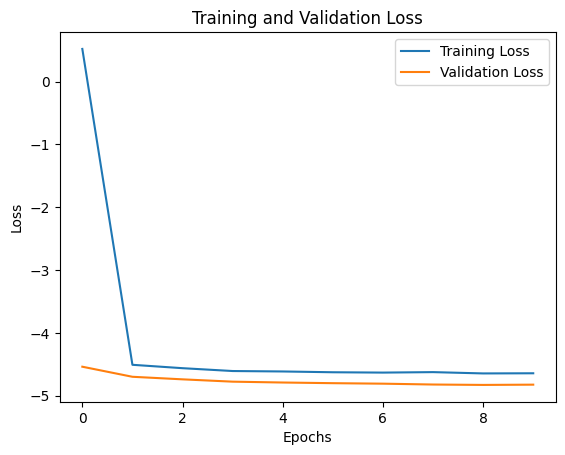

122/122 [==============================] - 1s 5ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5147439025538747
Loss Function: poisson, Activation Function: relu, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 10.5292 - mae: 5.6275 - val_loss: 6.8355 - val_mae: 5.5960
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.5868 - mae: 5.4424 - val_loss: 4.7010 - val_mae: 5.4482
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 3.9415 - mae: 5.3020 - val_loss: 3.3854 - val_mae: 5.3195
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 2.8368 - mae: 5.1748 - val_loss: 2.4303 - val_mae: 5.2006
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 2.0053 - mae: 5.0570 - val_loss: 1.6845 - val_mae: 5.0882
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.3377 - mae: 4.9441 - val_loss: 1.0777 - val_mae: 4.9809
Epoch 7/10


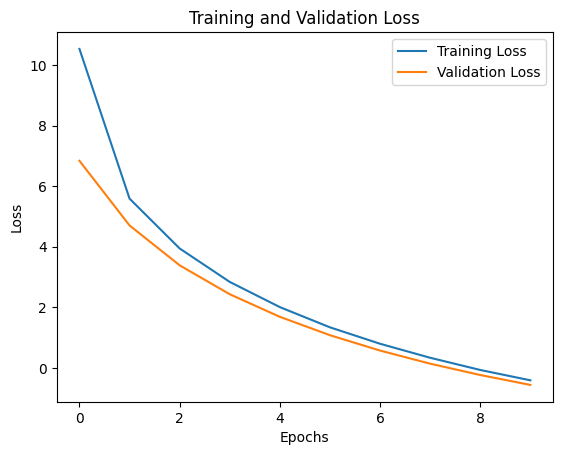

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.0057162338451672845
Loss Function: poisson, Activation Function: relu, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 6.4352 - mse: 35.5588 - val_loss: 3.5764 - val_mse: 34.4963
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 2.4481 - mse: 31.8480 - val_loss: 1.6146 - val_mse: 31.5922
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 0.9694 - mse: 29.2729 - val_loss: 0.4675 - val_mse: 29.2927
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 0.0464 - mse: 27.2121 - val_loss: -0.3283 - val_mse: 27.3443
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -0.6449 - mse: 25.3800 - val_loss: -0.9230 - val_mse: 25.6530
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -1.1627 - mse: 23.8026 - val_loss: -1.3889 - val_mse

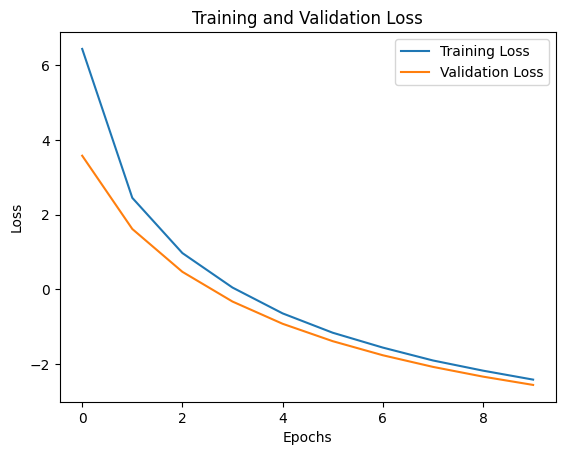

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.022684146074647416
Loss Function: poisson, Activation Function: relu, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 44.7531 - mae: 5.8097 - val_loss: 42.5112 - val_mae: 5.8764
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 42.7751 - mae: 5.8071 - val_loss: 40.7091 - val_mae: 5.8742
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 41.7215 - mae: 5.8055 - val_loss: 39.6412 - val_mae: 5.8727
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 40.0327 - mae: 5.8034 - val_loss: 38.6483 - val_mae: 5.8712
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 38.9773 - mae: 5.8029 - val_loss: 38.0193 - val_mae: 5.8703
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 38.2198 - mae: 5.8014 - val_loss: 37.1021 - val_mae

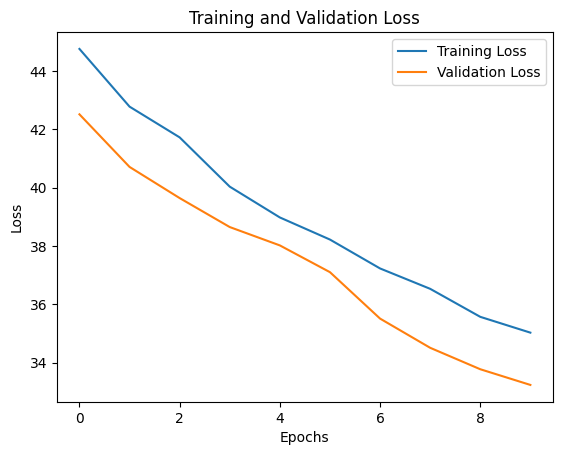

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: relu, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 50.2997 - mse: 39.9652 - val_loss: 46.8449 - val_mse: 41.1751
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: 49.1021 - mse: 39.9561 - val_loss: 45.1310 - val_mse: 41.1632
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 48.0364 - mse: 39.9465 - val_loss: 43.5821 - val_mse: 41.1557
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 47.1989 - mse: 39.9387 - val_loss: 41.8203 - val_mse: 41.1419
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 45.0803 - mse: 39.9228 - val_loss: 39.4456 - val_mse: 41.1176
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 42.8506 - mse: 39.9001 - val_loss: 38.081

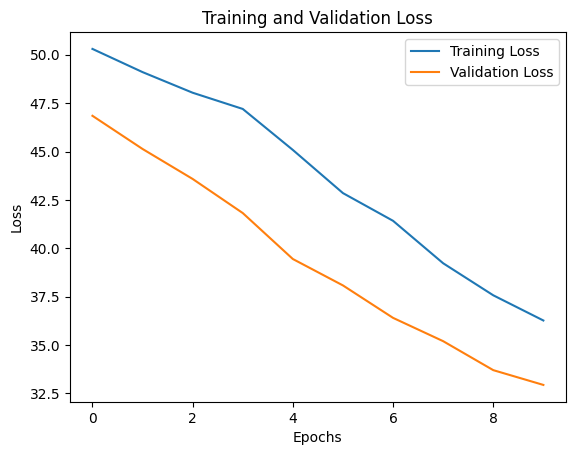

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: relu, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.9638 - mae: 5.2950 - val_loss: 1.1632 - val_mae: 5.0019
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: -0.4014 - mae: 4.5207 - val_loss: -1.5464 - val_mae: 4.2809
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: -2.1642 - mae: 3.8833 - val_loss: -2.7568 - val_mae: 3.7466
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -3.0535 - mae: 3.4210 - val_loss: -3.4328 - val_mae: 3.3556
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -3.5655 - mae: 3.0770 - val_loss: -3.8440 - val_mae: 3.0445
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: -3.8831 - mae: 2.7981 - val_loss: -4.1018 - val_mae: 2.7854

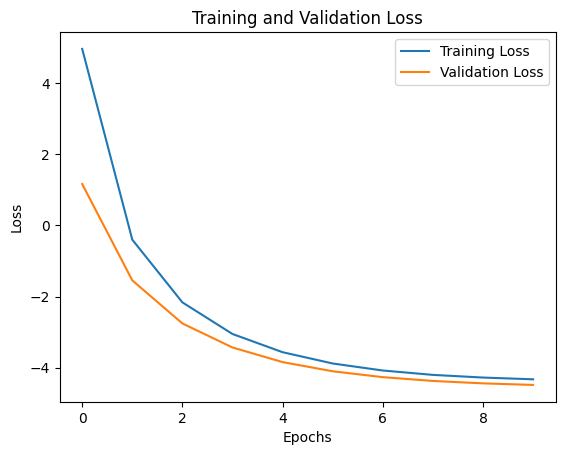

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.007597239313038462
Loss Function: poisson, Activation Function: relu, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 4.1128 - mse: 30.7413 - val_loss: -0.7513 - val_mse: 26.0368
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: -1.9925 - mse: 20.5469 - val_loss: -2.9442 - val_mse: 17.6474
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: -3.3546 - mse: 14.1962 - val_loss: -3.7874 - val_mse: 12.8380
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -3.9092 - mse: 10.6856 - val_loss: -4.1594 - val_mse: 10.2126
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: -4.1603 - mse: 8.8200 - val_loss: -4.3401 - val_mse: 8.7679
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -4.2833 - mse: 7.8137 - val_loss: -4.4304 - val_ms

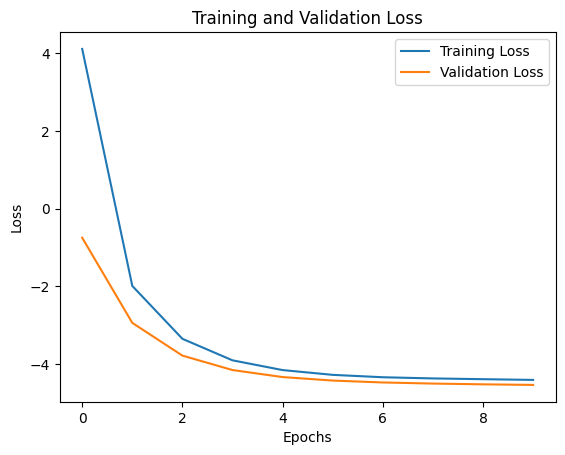

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.06801859281709344
Loss Function: poisson, Activation Function: relu, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: -0.0587 - mae: 4.1086 - val_loss: -3.9976 - val_mae: 2.8958
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: -4.2353 - mae: 2.3932 - val_loss: -4.4898 - val_mae: 2.2553
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4111 - mae: 2.1019 - val_loss: -4.5593 - val_mae: 2.1196
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4521 - mae: 2.0129 - val_loss: -4.5913 - val_mae: 2.0505
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4792 - mae: 1.9495 - val_loss: -4.6180 - val_mae: 1.9894
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: -4.5008 - mae: 1.9026 - val_loss: -4.6416 - val_mae: 1.938

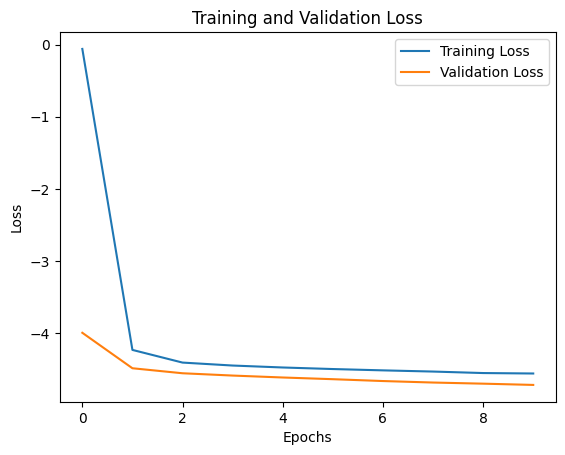

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3775909845015998
Loss Function: poisson, Activation Function: relu, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 0.7233 - mse: 25.0585 - val_loss: -3.4484 - val_mse: 14.9949
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: -3.9676 - mse: 10.2035 - val_loss: -4.3795 - val_mse: 8.4311
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -4.3521 - mse: 7.1805 - val_loss: -4.5187 - val_mse: 7.1325
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: -4.4178 - mse: 6.5552 - val_loss: -4.5586 - val_mse: 6.7147
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4436 - mse: 6.2920 - val_loss: -4.5825 - val_mse: 6.4565
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -4.4618 - mse: 6.0961 - val_loss: -4.6014 - val_mse: 6.25

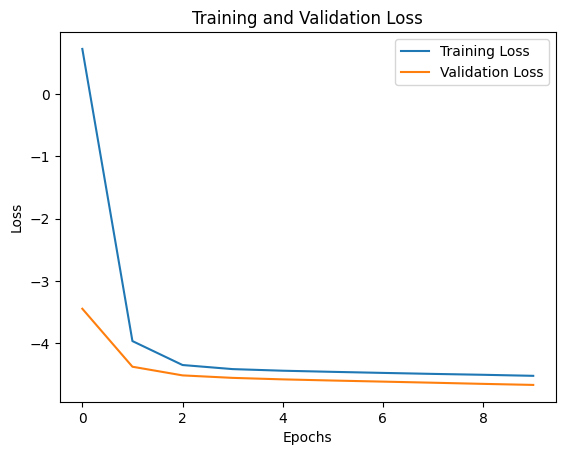

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.3016096208286482
Loss Function: poisson, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mae: 8.8703 - val_loss: nan - val_mae: 12.7024
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 16.8576 - val_loss: nan - val_mae: 21.1251
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 24.9712 - val_loss: nan - val_mae: 28.8680
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 32.4011 - val_loss: nan - val_mae: 35.9825
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 39.2652 - val_loss: nan - val_mae: 42.7030
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 45.9022 - val_loss: nan - val_mae: 49.2636
Epoch 7/10
128/128 [================

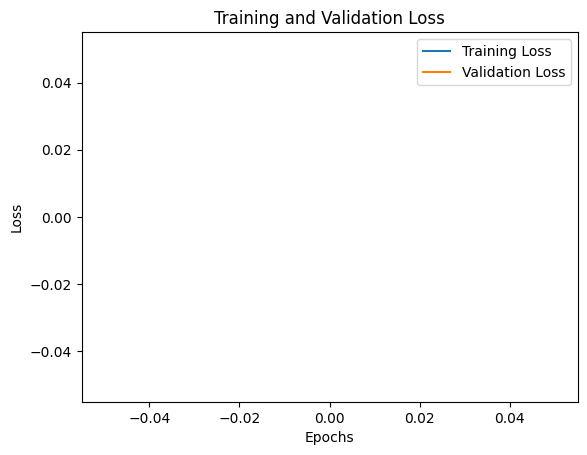

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.0021169950074545474
Loss Function: poisson, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mse: 47.0521 - val_loss: nan - val_mse: 57.5163
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 68.4179 - val_loss: nan - val_mse: 87.4318
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 107.3056 - val_loss: nan - val_mse: 137.3977
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 167.1842 - val_loss: nan - val_mse: 210.6532
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 252.3533 - val_loss: nan - val_mse: 311.0809
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 364.7262 - val_loss: nan - val_mse: 441.3326
Epoch 7/10
128/128 [=====

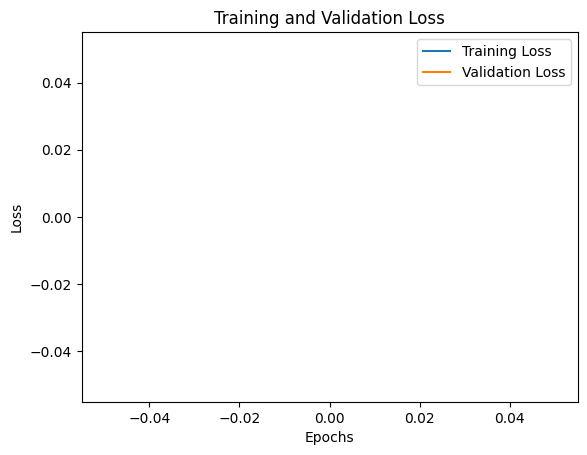

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.013290111183591358
Loss Function: poisson, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: nan - mae: 7.5882 - val_loss: nan - val_mae: 9.5558
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 13.2829 - val_loss: nan - val_mae: 18.8633
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 30.5063 - val_loss: nan - val_mae: 43.5634
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 56.3331 - val_loss: nan - val_mae: 72.3032
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 88.7117 - val_loss: nan - val_mae: 111.7718
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 134.7865 - val_loss: nan - val_mae: 159.5712
Epoch 7/10
128/128 [===============

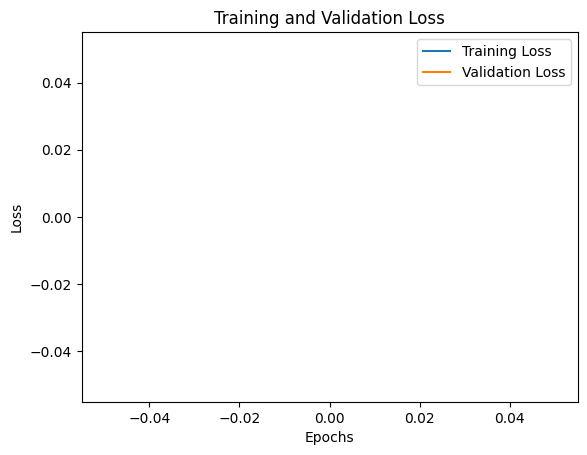

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.006025885848929158
Loss Function: poisson, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: nan - mse: 343.7245 - val_loss: nan - val_mse: 572.2325
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 1079.7006 - val_loss: nan - val_mse: 1850.8314
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 3321.1802 - val_loss: nan - val_mse: 5268.6177
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mse: 8324.5889 - val_loss: nan - val_mse: 12071.0684
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mse: 17243.6523 - val_loss: nan - val_mse: 23161.7090
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mse: 30732.8477 - val_loss: nan - val_mse: 38967.0195
Epoch 7/1

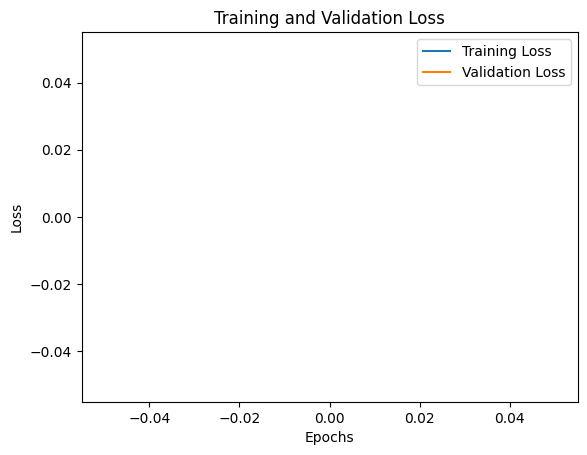

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.004832678237315147
Loss Function: poisson, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mae: 4.6297 - val_loss: nan - val_mae: 4.0082
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 4.5483 - val_loss: nan - val_mae: 4.4771
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 5.2153 - val_loss: nan - val_mae: 5.0404
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 5.9914 - val_loss: nan - val_mae: 5.7334
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.8252 - val_loss: nan - val_mae: 6.5536
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 7.5465 - val_loss: nan - val_mae: 7.1380
Epoch 7/10
128/128 [========================

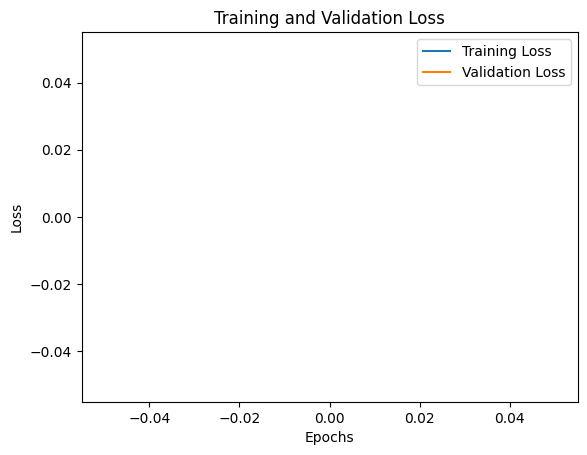

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.002112815041050098
Loss Function: poisson, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mse: 122.8328 - val_loss: nan - val_mse: 285.7389
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 419.5588 - val_loss: nan - val_mse: 575.9553
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 719.1650 - val_loss: nan - val_mse: 902.0941
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 1073.6017 - val_loss: nan - val_mse: 1305.4077
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 1609.0280 - val_loss: nan - val_mse: 1990.7131
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 2306.1721 - val_loss: nan - val_mse: 2625.0193
Epoch 7/10


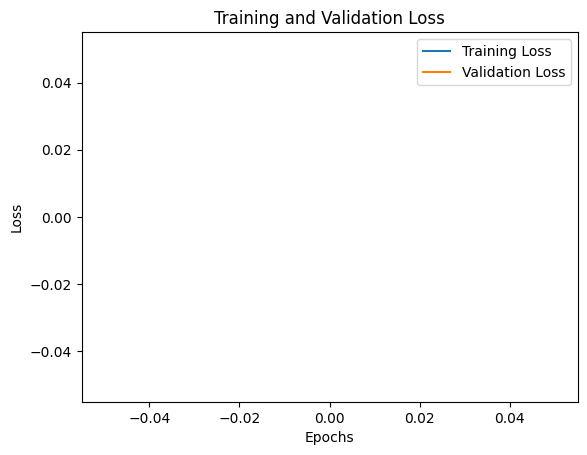

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -7.175663948522093e-05
Loss Function: poisson, Activation Function: linear, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: nan - mae: 6.0008 - val_loss: nan - val_mae: 6.1552
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 6.1410 - val_loss: nan - val_mae: 6.2809
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 6.2536 - val_loss: nan - val_mae: 6.3917
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.3580 - val_loss: nan - val_mae: 6.4970
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.4551 - val_loss: nan - val_mae: 6.5946
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5520 - val_loss: nan - val_mae: 6.6896
Epoch 7/10
128/128 [======================

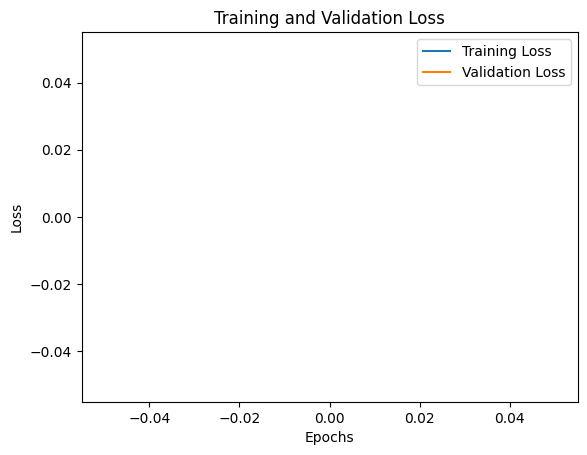

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.02451153914285087
Loss Function: poisson, Activation Function: linear, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 10ms/step - loss: nan - mse: 36.8757 - val_loss: nan - val_mse: 36.2230
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 34.4437 - val_loss: nan - val_mse: 34.4160
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mse: 33.0725 - val_loss: nan - val_mse: 33.1384
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mse: 32.1487 - val_loss: nan - val_mse: 32.1825
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 31.3472 - val_loss: nan - val_mse: 31.4307
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mse: 30.8477 - val_loss: nan - val_mse: 30.7940
Epoch 7/10
128/128 [=============

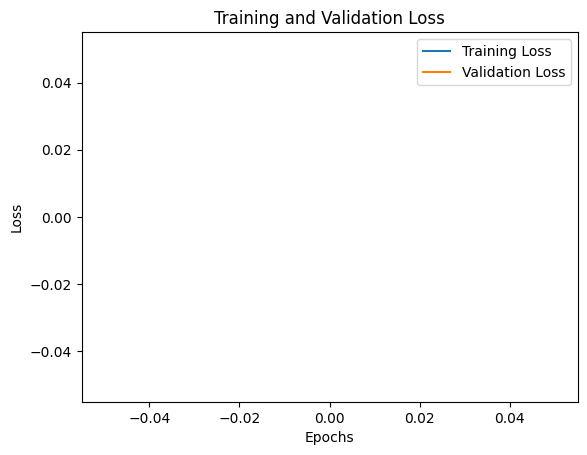

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.07652512651842858
Loss Function: poisson, Activation Function: linear, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: nan - mae: 5.8599 - val_loss: nan - val_mae: 5.9254
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.8600 - val_loss: nan - val_mae: 5.9254
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.8599 - val_loss: nan - val_mae: 5.9254
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.8605 - val_loss: nan - val_mae: 5.9255
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8606 - val_loss: nan - val_mae: 5.9257
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8602 - val_loss: nan - val_mae: 5.9258
Epoch 7/10
128/128 [====================

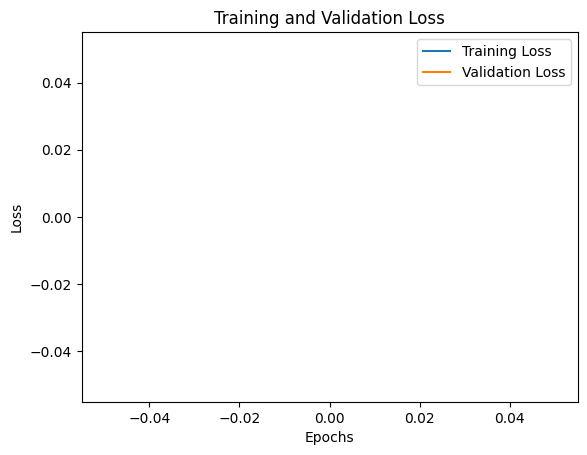

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: linear, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: nan - mse: 39.6863 - val_loss: nan - val_mse: 40.8377
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 39.6807 - val_loss: nan - val_mse: 40.8283
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 39.6629 - val_loss: nan - val_mse: 40.8139
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 39.6585 - val_loss: nan - val_mse: 40.8027
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 39.6449 - val_loss: nan - val_mse: 40.7925
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 39.6357 - val_loss: nan - val_mse: 40.7853
Epoch 7/10
128/128 [=========

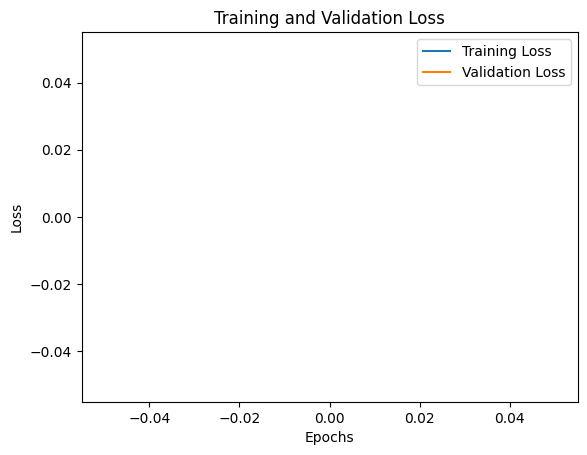

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: linear, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mae: 6.5743 - val_loss: nan - val_mae: 7.4800
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 8.4425 - val_loss: nan - val_mae: 9.8589
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 10.7428 - val_loss: nan - val_mae: 12.0047
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mae: 12.9261 - val_loss: nan - val_mae: 14.5112
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 15.4138 - val_loss: nan - val_mae: 16.9685
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 17.5122 - val_loss: nan - val_mae: 18.4561
Epoch 7/10
128/128 [===========

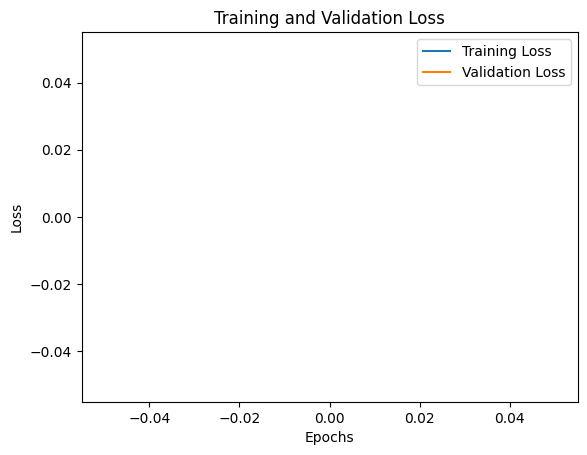

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.022515753585783504
Loss Function: poisson, Activation Function: linear, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mse: 36.5258 - val_loss: 4.3708 - val_mse: 35.2472
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 2.4303 - mse: 31.4949 - val_loss: 0.8312 - val_mse: 29.9670
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: -0.0272 - mse: 26.7526 - val_loss: -0.8775 - val_mse: 25.7325
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: -1.3190 - mse: 23.0372 - val_loss: -1.8983 - val_mse: 22.3117
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: -2.1518 - mse: 19.9611 - val_loss: -2.5794 - val_mse: 19.4995
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: -2.6883 - mse: 17.5810 - val_loss: -3.0663 - val_ms

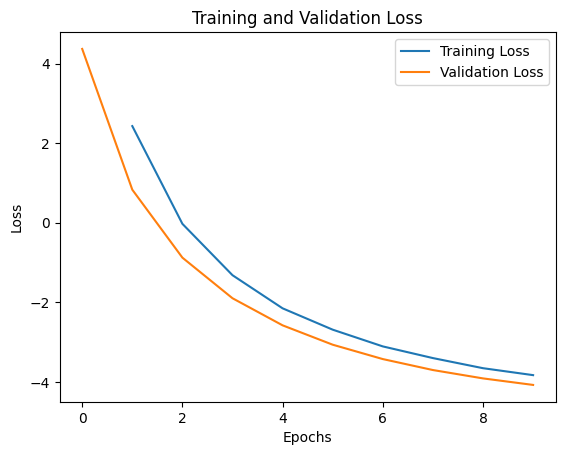

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.009347002773773982
Loss Function: poisson, Activation Function: linear, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: nan - mae: 5.9402 - val_loss: nan - val_mae: 6.2455
Epoch 2/10
128/128 [==============================] - 2s 12ms/step - loss: nan - mae: 6.2501 - val_loss: nan - val_mae: 6.4266
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mae: 6.4507 - val_loss: nan - val_mae: 6.6755
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: nan - mae: 6.7194 - val_loss: nan - val_mae: 6.9853
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 7.0540 - val_loss: nan - val_mae: 7.3552
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 7.3221 - val_loss: nan - val_mae: 7.6494
Epoch 7/10
128/128 [=====================

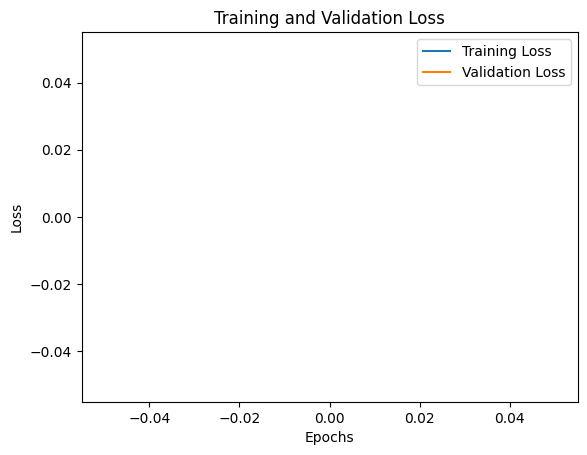

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.033321431450645145
Loss Function: poisson, Activation Function: linear, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: nan - mse: 44.5417 - val_loss: nan - val_mse: 52.4229
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 59.8631 - val_loss: nan - val_mse: 73.4263
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 86.1332 - val_loss: nan - val_mse: 106.7277
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 127.1282 - val_loss: nan - val_mse: 157.4338
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 182.0866 - val_loss: nan - val_mse: 218.2820
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 250.2155 - val_loss: nan - val_mse: 297.1762
Epoch 7/10
128/128 [====

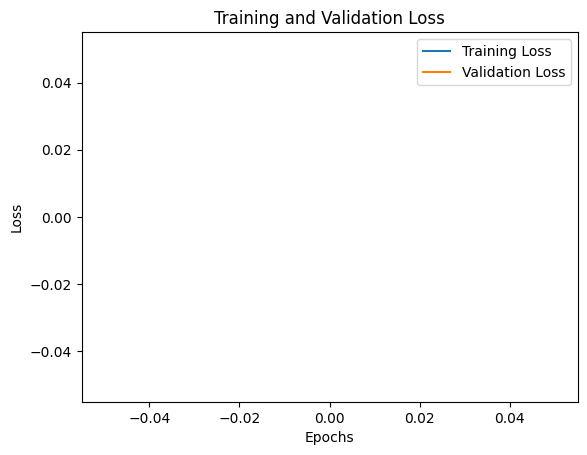

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.01545294164517208
Loss Function: poisson, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mae: 5.8292 - val_loss: nan - val_mae: 5.9024
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8423 - val_loss: nan - val_mae: 5.9189
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8061 - val_loss: nan - val_mae: 5.8860
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.7923 - val_loss: nan - val_mae: 5.8192
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.7908 - val_loss: nan - val_mae: 5.8778
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mae: 5.8064 - val_loss: nan - val_mae: 5.8939
Epoch 7/10
128/128 [===========================

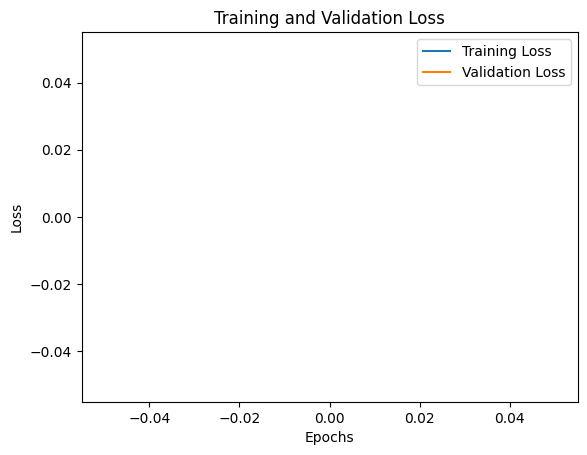

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.02646617581147992
Loss Function: poisson, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mse: 47.9022 - val_loss: nan - val_mse: 50.7062
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 48.9140 - val_loss: nan - val_mse: 50.6720
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 48.9004 - val_loss: nan - val_mse: 50.6810
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 48.9248 - val_loss: nan - val_mse: 50.7122
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 48.9173 - val_loss: nan - val_mse: 50.6969
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 48.8947 - val_loss: nan - val_mse: 50.6777
Epoch 7/10
128/128 [=============

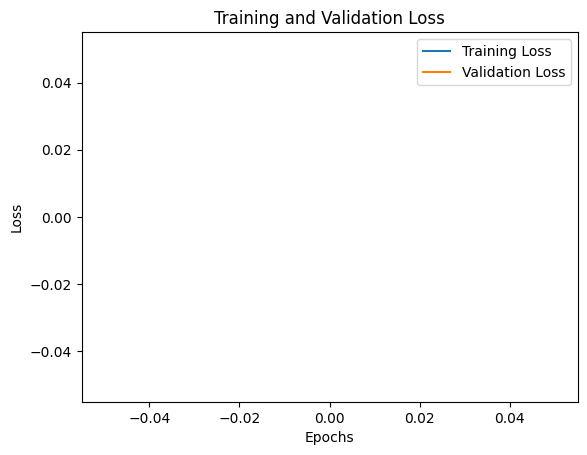

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.012477850603412888
Loss Function: poisson, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mae: 6.8165 - val_loss: nan - val_mae: 6.8975
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: nan - mae: 6.8313 - val_loss: nan - val_mae: 6.9005
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 6.8333 - val_loss: nan - val_mae: 6.9018
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.8344 - val_loss: nan - val_mae: 6.9026
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 6.8350 - val_loss: nan - val_mae: 6.9031
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.8354 - val_loss: nan - val_mae: 6.9034
Epoch 7/10
128/128 [============================

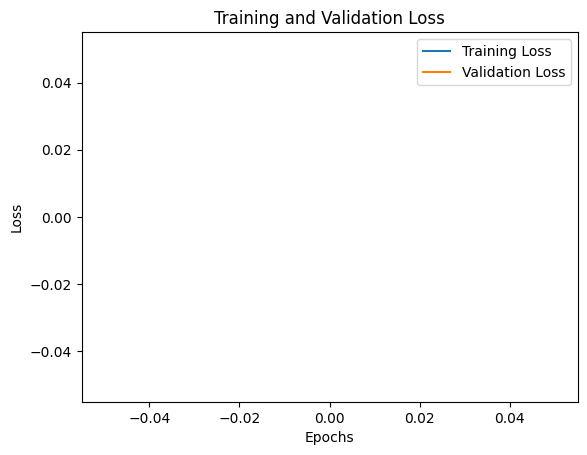

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 3.685125147734336e-05
Loss Function: poisson, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 11ms/step - loss: nan - mse: 29.5626 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30.5182
Epoc

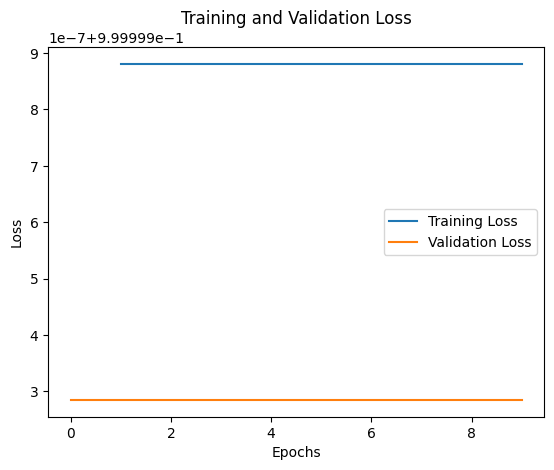

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mae: 6.4461 - val_loss: nan - val_mae: 6.6688
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5619 - val_loss: nan - val_mae: 6.6699
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5612 - val_loss: nan - val_mae: 6.6698
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5612 - val_loss: nan - val_mae: 6.6699
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5612 - val_loss: nan - val_mae: 6.6699
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 6.5612 - val_loss: nan - val_mae: 6.6699
Epoch 7/10
128/128 [=========================

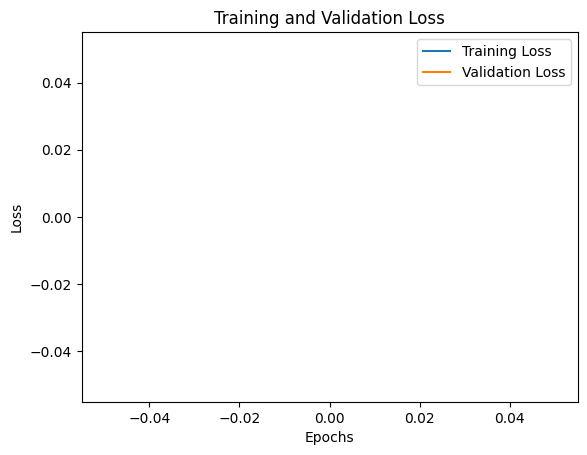

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.012243643165421703
Loss Function: poisson, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: nan - mse: 44.4684 - val_loss: nan - val_mse: 47.0674
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 45.6234 - val_loss: nan - val_mse: 47.0882
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 45.6069 - val_loss: nan - val_mse: 47.0687
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 45.6030 - val_loss: nan - val_mse: 47.0822
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 45.6091 - val_loss: nan - val_mse: 47.0826
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 45.6285 - val_loss: nan - val_mse: 47.0855
Epoch 7/10
128/128 [===========

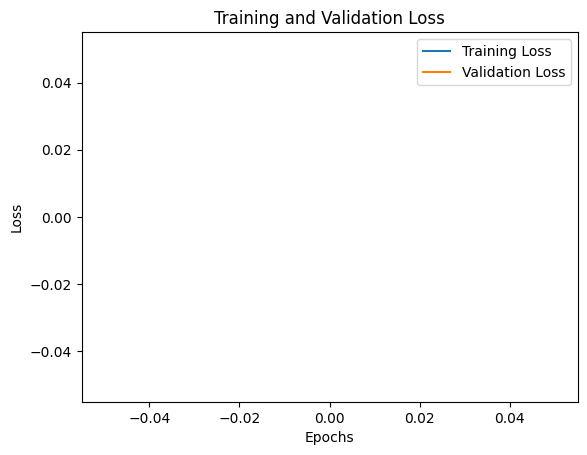

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.016845209054792476
Loss Function: poisson, Activation Function: tanh, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: nan - mae: 5.6497 - val_loss: nan - val_mae: 5.6690
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 5.5314 - val_loss: nan - val_mae: 5.5871
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: nan - mae: 5.4685 - val_loss: nan - val_mae: 5.5376
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.4420 - val_loss: nan - val_mae: 5.5429
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.4325 - val_loss: nan - val_mae: 5.5186
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.4286 - val_loss: nan - val_mae: 5.5295
Epoch 7/10
128/128 [==========================

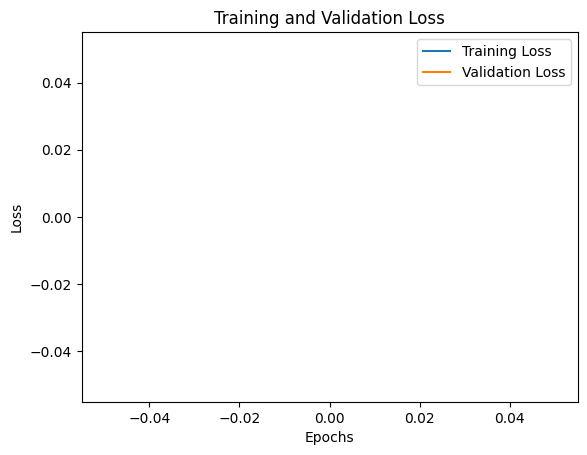

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.007898813006642635
Loss Function: poisson, Activation Function: tanh, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mse: 41.8100 - val_loss: nan - val_mse: 43.5480
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 42.9213 - val_loss: nan - val_mse: 44.2509
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 43.5012 - val_loss: nan - val_mse: 44.9060
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 43.6120 - val_loss: nan - val_mse: 44.6544
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 43.8029 - val_loss: nan - val_mse: 45.1258
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 44.2113 - val_loss: nan - val_mse: 45.4562
Epoch 7/10
128/128 [===========

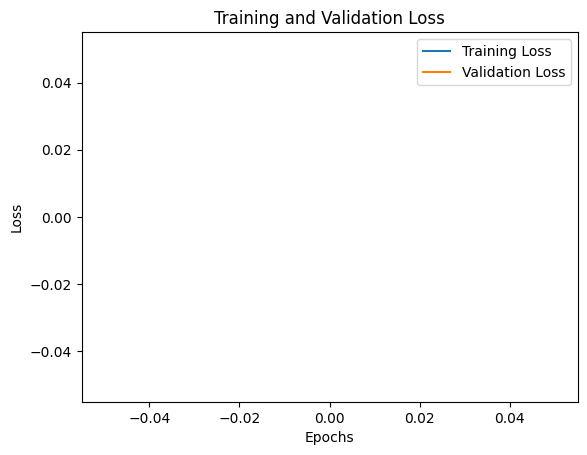

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: -0.009170809357901488
Loss Function: poisson, Activation Function: tanh, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: nan - mae: 5.8400 - val_loss: nan - val_mae: 5.9078
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8399 - val_loss: nan - val_mae: 5.9079
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.8399 - val_loss: nan - val_mae: 5.9078
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.8393 - val_loss: nan - val_mae: 5.9076
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.8399 - val_loss: nan - val_mae: 5.9076
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: nan - mae: 5.8394 - val_loss: nan - val_mae: 5.9073
Epoch 7/10
128/128 [=====================

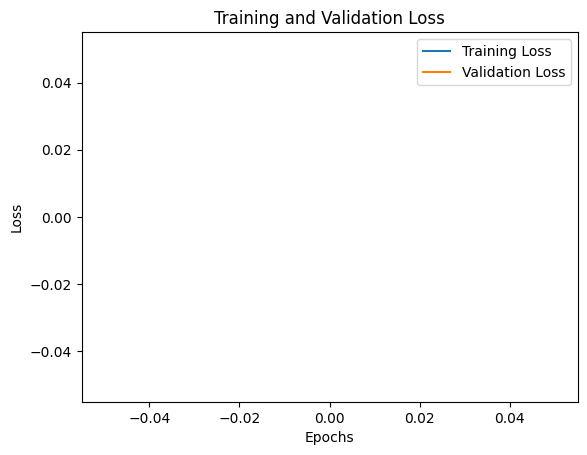

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: tanh, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 16ms/step - loss: nan - mse: 40.0294 - val_loss: nan - val_mse: 41.2117
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 40.0286 - val_loss: nan - val_mse: 41.2136
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 40.0366 - val_loss: nan - val_mse: 41.2202
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 40.0363 - val_loss: nan - val_mse: 41.2234
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 40.0368 - val_loss: nan - val_mse: 41.2231
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 40.0322 - val_loss: nan - val_mse: 41.2215
Epoch 7/10
128/128 [========

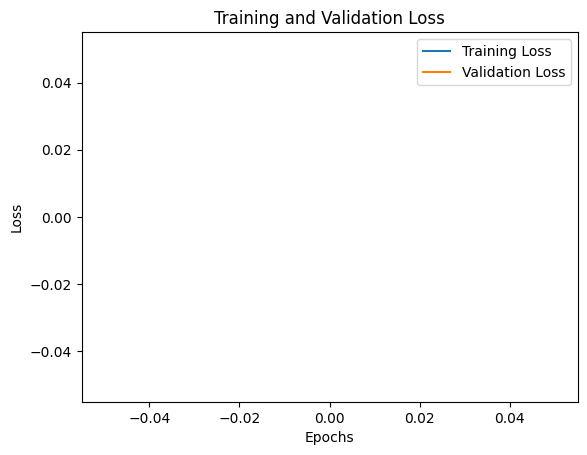

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 5.028603781298546e-05
Loss Function: poisson, Activation Function: tanh, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 13ms/step - loss: nan - mae: 5.7249 - val_loss: nan - val_mae: 5.7592
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.6848 - val_loss: nan - val_mae: 5.7358
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.6659 - val_loss: nan - val_mae: 5.7260
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 5.6552 - val_loss: nan - val_mae: 5.7146
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.6435 - val_loss: nan - val_mae: 5.7008
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mae: 5.6299 - val_loss: nan - val_mae: 5.6873
Epoch 7/10
128/128 [========================

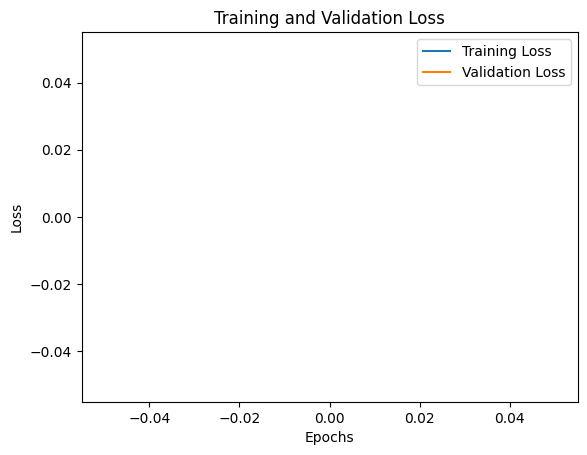

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.017598382997052964
Loss Function: poisson, Activation Function: tanh, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 15ms/step - loss: nan - mse: 35.6739 - val_loss: nan - val_mse: 34.9672
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 33.9178 - val_loss: nan - val_mse: 34.3245
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 33.6217 - val_loss: nan - val_mse: 34.1636
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 33.5416 - val_loss: nan - val_mse: 34.1067
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 33.5058 - val_loss: nan - val_mse: 34.0713
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: nan - mse: 33.4842 - val_loss: nan - val_mse: 34.0468
Epoch 7/10
128/128 [==========

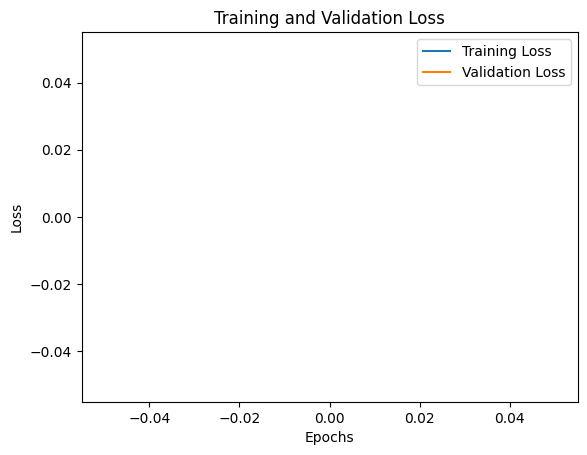

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.018828562767779777
Loss Function: poisson, Activation Function: tanh, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: nan - mae: 6.1919 - val_loss: nan - val_mae: 6.4013
Epoch 2/10
128/128 [==============================] - 2s 13ms/step - loss: nan - mae: 6.2260 - val_loss: nan - val_mae: 6.3737
Epoch 3/10
128/128 [==============================] - 1s 12ms/step - loss: nan - mae: 6.2832 - val_loss: nan - val_mae: 6.3921
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 6.2918 - val_loss: nan - val_mae: 6.3986
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mae: 6.2944 - val_loss: nan - val_mae: 6.3999
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mae: 6.2494 - val_loss: nan - val_mae: 6.0960
Epoch 7/10
128/128 [======================

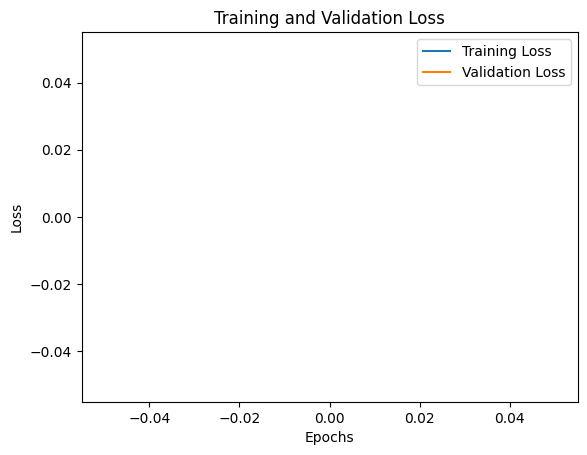

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.01668057654356392
Loss Function: poisson, Activation Function: tanh, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 6s 15ms/step - loss: nan - mse: 34.8407 - val_loss: nan - val_mse: 34.1923
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 33.5153 - val_loss: nan - val_mse: 34.0350
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 33.4530 - val_loss: nan - val_mse: 34.0036
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 33.4341 - val_loss: nan - val_mse: 33.9902
Epoch 5/10
128/128 [==============================] - 1s 11ms/step - loss: nan - mse: 33.4304 - val_loss: nan - val_mse: 33.9842
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: nan - mse: 33.4247 - val_loss: nan - val_mse: 33.9799
Epoch 7/10
128/128 [============

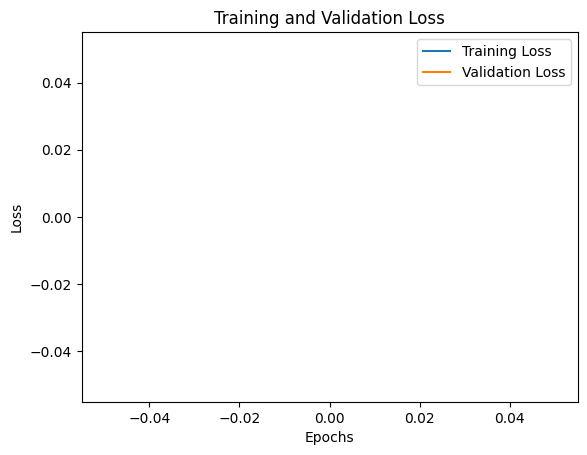

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: -0.01875100522058415
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.3940 - mae: 4.9656 - val_loss: 1.0183 - val_mae: 4.9923
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0108 - mae: 4.9058 - val_loss: 1.0062 - val_mae: 4.9901
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0047 - mae: 4.9046 - val_loss: 1.0033 - val_mae: 4.9896
Epoch 4/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0027 - mae: 4.9042 - val_loss: 1.0020 - val_mae: 4.9894
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0018 - mae: 4.9041 - val_loss: 1.0014 - val_mae: 4.9893
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0013 - mae: 4.9040 - val_loss: 1.0010 - val_mae: 4.9892
Epoch

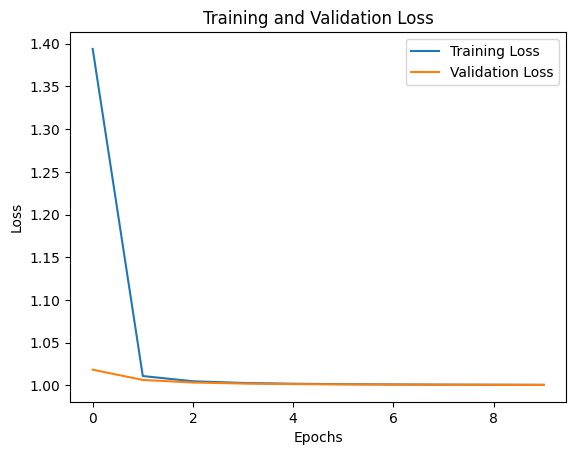

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 1.4200 - mse: 30.1732 - val_loss: 1.0188 - val_mse: 30.5557
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0111 - mse: 29.4963 - val_loss: 1.0064 - val_mse: 30.5310
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0048 - mse: 29.4837 - val_loss: 1.0034 - val_mse: 30.5249
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0028 - mse: 29.4796 - val_loss: 1.0021 - val_mse: 30.5224
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0019 - mse: 29.4779 - val_loss: 1.0015 - val_mse: 30.5211
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0014 - mse: 29.4768 - val_loss: 1.0011 - val_mse: 30

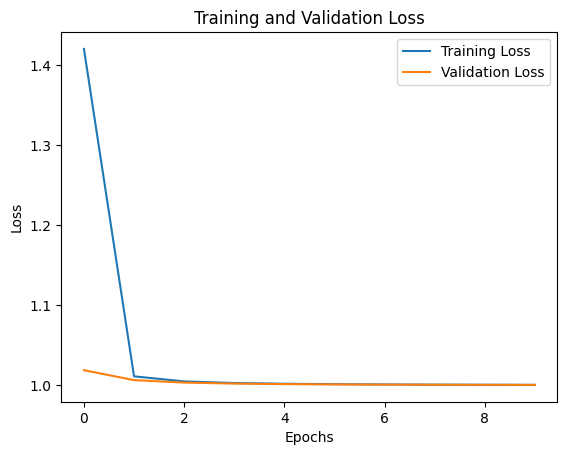

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.1360 - mae: 5.0856 - val_loss: 1.4089 - val_mae: 5.0614
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.2674 - mae: 4.9534 - val_loss: 1.1846 - val_mae: 5.0225
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.1422 - mae: 4.9306 - val_loss: 1.1141 - val_mae: 5.0099
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0946 - mae: 4.9216 - val_loss: 1.0809 - val_mae: 5.0038
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0699 - mae: 4.9170 - val_loss: 1.0619 - val_mae: 5.0004
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0550 - mae: 4.9142 - val_loss: 1.0497 - val_mae: 4.9981
Epoch 7/10

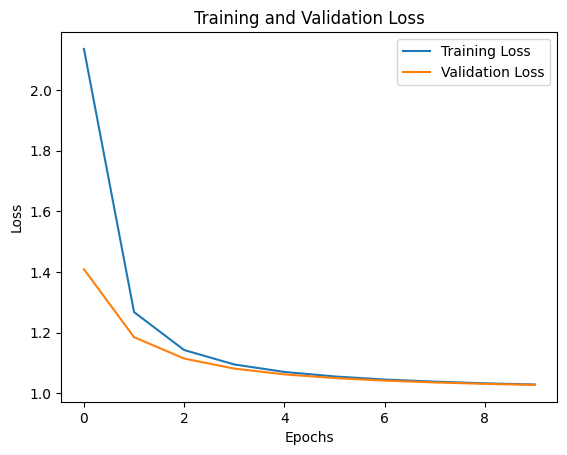

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.2063 - mse: 31.5227 - val_loss: 1.4492 - val_mse: 31.3760
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 1.2941 - mse: 30.0433 - val_loss: 1.2022 - val_mse: 30.9141
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 1.1560 - mse: 29.7807 - val_loss: 1.1244 - val_mse: 30.7637
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 1.1037 - mse: 29.6791 - val_loss: 1.0877 - val_mse: 30.6920
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0757 - mse: 29.6242 - val_loss: 1.0670 - val_mse: 30.6511
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0595 - mse: 29.5923 - val_loss: 1.0537 - val_mse: 30.624

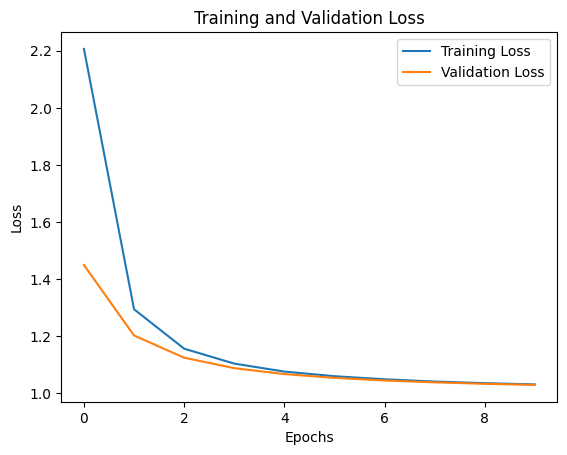

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 1.2689 - mae: 4.9469 - val_loss: 1.0044 - val_mae: 4.9898
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0015 - mae: 4.9040 - val_loss: 1.0003 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0002 - mae: 4.9038 - val_loss: 1.0001 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0001 - mae: 4.9037 - val_loss: 1.0001 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0001 - mae: 4.9037 - val_loss: 1.0000 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0000 - mae: 4.9037 - val_loss: 1.0000 - val_mae: 4.9890
Epoch 

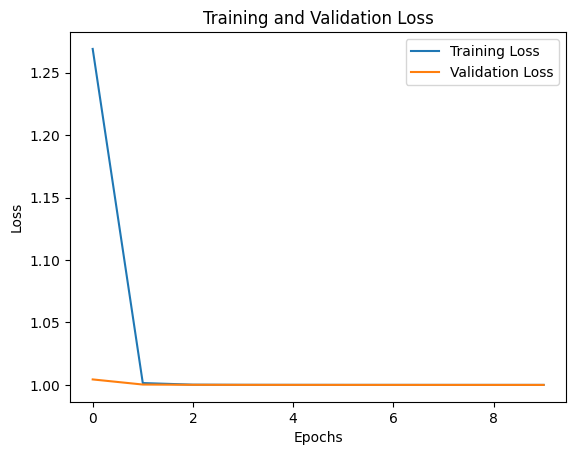

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 1.2960 - mse: 29.9826 - val_loss: 1.0051 - val_mse: 30.5283
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0017 - mse: 29.4775 - val_loss: 1.0003 - val_mse: 30.5188
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0002 - mse: 29.4745 - val_loss: 1.0001 - val_mse: 30.5184
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0001 - mse: 29.4743 - val_loss: 1.0001 - val_mse: 30.5183
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.0001 - mse: 29.4742 - val_loss: 1.0000 - val_mse: 30.5182
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0000 - mse: 29.4741 - val_loss: 1.0000 - val_mse: 30

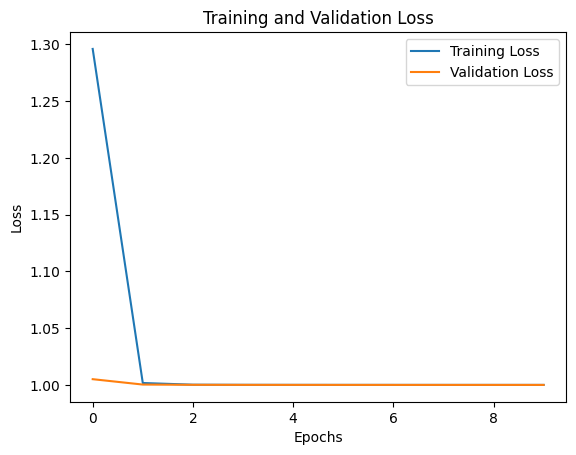

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adagrad, Metric: mae
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 3.8881 - mae: 5.3079 - val_loss: 3.4498 - val_mae: 5.3377
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 3.0998 - mae: 5.2217 - val_loss: 2.8506 - val_mae: 5.2688
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2.6214 - mae: 5.1619 - val_loss: 2.4606 - val_mae: 5.2190
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 2.2990 - mae: 5.1179 - val_loss: 2.1906 - val_mae: 5.1819
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 2.0728 - mae: 5.0851 - val_loss: 1.9945 - val_mae: 5.1535
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.9021 - mae: 5.0591 - val_loss: 1.8472 - val_mae: 5.1314
Epoch 

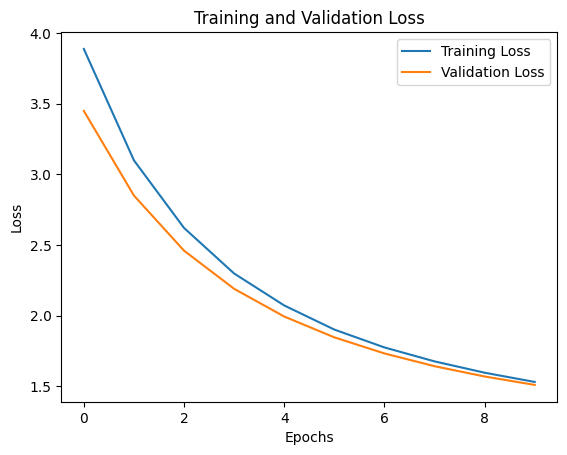

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adagrad, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 14ms/step - loss: 3.8745 - mse: 33.8303 - val_loss: 3.3949 - val_mse: 34.3257
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 3.0279 - mse: 32.7913 - val_loss: 2.7753 - val_mse: 33.5003
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 2.5449 - mse: 32.1160 - val_loss: 2.3880 - val_mse: 32.9336
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 2.2308 - mse: 31.6418 - val_loss: 2.1252 - val_mse: 32.5250
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 2.0111 - mse: 31.2927 - val_loss: 1.9370 - val_mse: 32.2195
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.8519 - mse: 31.0302 - val_loss: 1.7966 - val_mse: 31

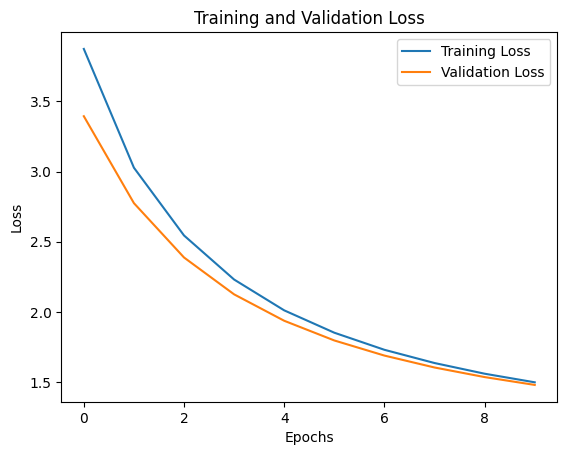

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adadelta, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 15ms/step - loss: 4.5448 - mae: 5.3700 - val_loss: 4.5679 - val_mae: 5.4444
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.5077 - mae: 5.3667 - val_loss: 4.5280 - val_mae: 5.4410
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4667 - mae: 5.3631 - val_loss: 4.4863 - val_mae: 5.4375
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 4.4242 - mae: 5.3593 - val_loss: 4.4429 - val_mae: 5.4337
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3801 - mae: 5.3553 - val_loss: 4.3979 - val_mae: 5.4298
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 4.3357 - mae: 5.3513 - val_loss: 4.3517 - val_mae: 5.4257
Ep

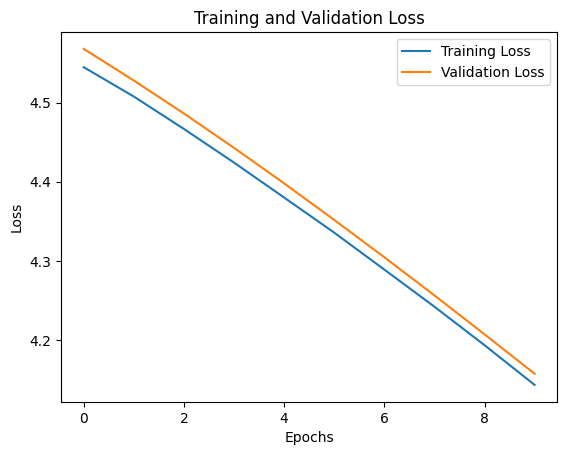

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adadelta, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 13ms/step - loss: 4.5567 - mse: 34.5709 - val_loss: 4.5842 - val_mse: 35.6636
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 4.5190 - mse: 34.5332 - val_loss: 4.5440 - val_mse: 35.6231
Epoch 3/10
128/128 [==============================] - 1s 11ms/step - loss: 4.4785 - mse: 34.4923 - val_loss: 4.5018 - val_mse: 35.5804
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 4.4342 - mse: 34.4471 - val_loss: 4.4579 - val_mse: 35.5355
Epoch 5/10
128/128 [==============================] - 2s 12ms/step - loss: 4.3920 - mse: 34.4039 - val_loss: 4.4124 - val_mse: 35.4886
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 4.3451 - mse: 34.3553 - val_loss: 4.3656 - val_m

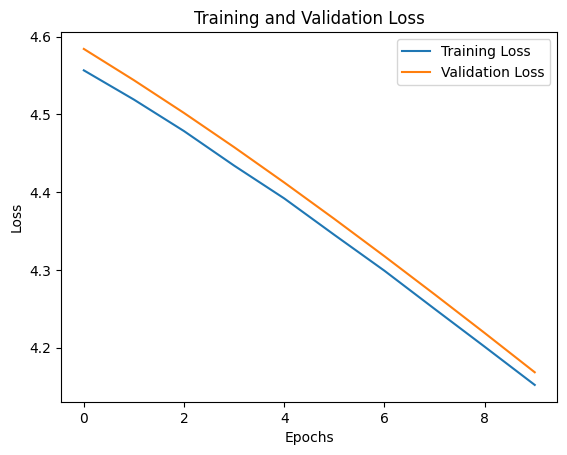

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adamax, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1.5605 - mae: 4.9930 - val_loss: 1.0591 - val_mae: 4.9997
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0362 - mae: 4.9105 - val_loss: 1.0228 - val_mae: 4.9931
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0172 - mae: 4.9070 - val_loss: 1.0130 - val_mae: 4.9913
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0108 - mae: 4.9057 - val_loss: 1.0086 - val_mae: 4.9905
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0074 - mae: 4.9051 - val_loss: 1.0061 - val_mae: 4.9901
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0055 - mae: 4.9047 - val_loss: 1.0046 - val_mae: 4.9898
Epoch 

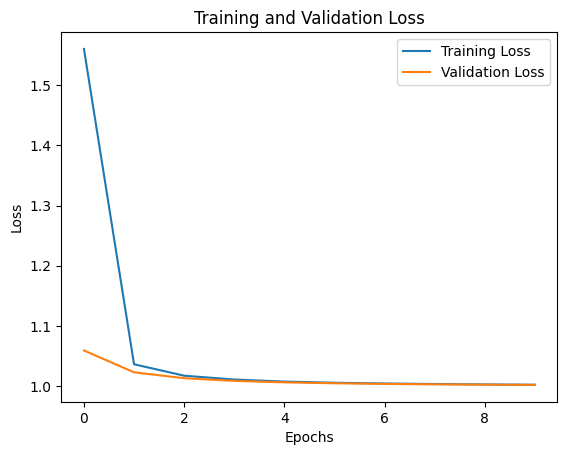

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: adamax, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 1.5792 - mse: 30.4554 - val_loss: 1.0608 - val_mse: 30.6388
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0369 - mse: 29.5474 - val_loss: 1.0231 - val_mse: 30.5642
Epoch 3/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0176 - mse: 29.5092 - val_loss: 1.0131 - val_mse: 30.5443
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0107 - mse: 29.4955 - val_loss: 1.0086 - val_mse: 30.5354
Epoch 5/10
128/128 [==============================] - 1s 9ms/step - loss: 1.0075 - mse: 29.4890 - val_loss: 1.0062 - val_mse: 30.5305
Epoch 6/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0056 - mse: 29.4852 - val_loss: 1.0046 - val_mse: 30

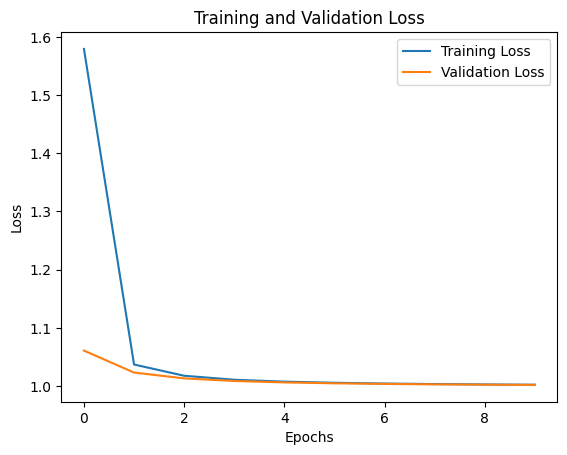

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: nadam, Metric: mae
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1.4890 - mae: 4.9802 - val_loss: 1.0203 - val_mae: 4.9927
Epoch 2/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0118 - mae: 4.9059 - val_loss: 1.0068 - val_mae: 4.9902
Epoch 3/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0051 - mae: 4.9047 - val_loss: 1.0035 - val_mae: 4.9896
Epoch 4/10
128/128 [==============================] - 1s 10ms/step - loss: 1.0030 - mae: 4.9043 - val_loss: 1.0022 - val_mae: 4.9894
Epoch 5/10
128/128 [==============================] - 1s 12ms/step - loss: 1.0019 - mae: 4.9041 - val_loss: 1.0015 - val_mae: 4.9893
Epoch 6/10
128/128 [==============================] - 1s 12ms/step - loss: 1.0014 - mae: 4.9040 - val_loss: 1.0011 - val_mae: 4.9892
Epo

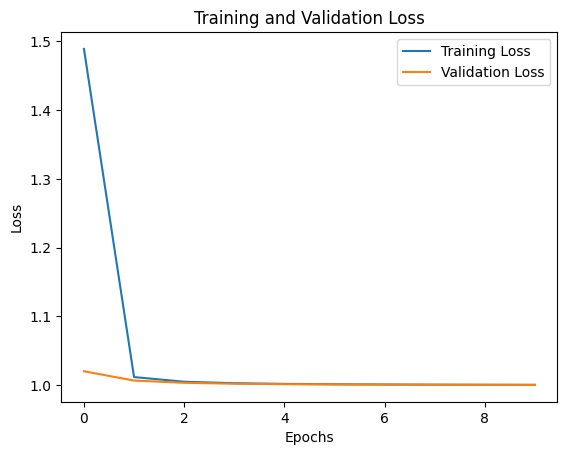

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: poisson, Activation Function: sigmoid, Optimizer: nadam, Metric: mse
Epoch 1/10
128/128 [==============================] - 5s 14ms/step - loss: 1.4939 - mse: 30.2903 - val_loss: 1.0213 - val_mse: 30.5607
Epoch 2/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0125 - mse: 29.4989 - val_loss: 1.0071 - val_mse: 30.5324
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0053 - mse: 29.4847 - val_loss: 1.0037 - val_mse: 30.5256
Epoch 4/10
128/128 [==============================] - 2s 12ms/step - loss: 1.0031 - mse: 29.4803 - val_loss: 1.0023 - val_mse: 30.5228
Epoch 5/10
128/128 [==============================] - 2s 13ms/step - loss: 1.0021 - mse: 29.4782 - val_loss: 1.0016 - val_mse: 30.5213
Epoch 6/10
128/128 [==============================] - 1s 11ms/step - loss: 1.0015 - mse: 29.4770 - val_loss: 1.0012 - val_mse:

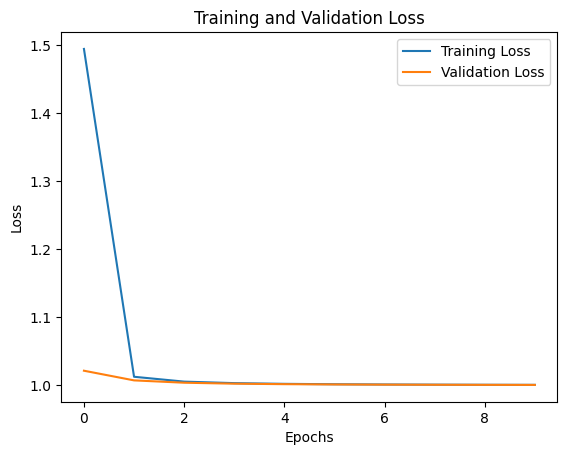

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score

# Define the lists of options
loss_functions = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'mean_squared_logarithmic_error', 'logcosh', 'huber_loss', 'poisson']
activation_functions = [tf.keras.activations.relu, tf.keras.activations.linear, tf.keras.activations.tanh,tf.keras.activations.sigmoid]
optimizers = ['adam', 'sgd', 'rmsprop', 'adagrad', 'adadelta', 'adamax', 'nadam']
metrics = ['mae', 'mse']

# Iterate over each combination
for loss_func in loss_functions:
    for activation_func in activation_functions:
        for optimizer_name in optimizers:
            for metric_name in metrics:
                print(f"Loss Function: {loss_func}, Activation Function: {activation_func.__name__}, Optimizer: {optimizer_name}, Metric: {metric_name}")

                # Define the model
                model = Sequential([
                    CustomLSTM(units=64),
                    CustomDropout(rate=0.2),
                    CustomDense(units=1, activation=activation_func)
                ])

                # Compile the model
                model.compile(optimizer=optimizer_name, loss=loss_func, metrics=[metric_name])

                # Train the model
                history = model.fit(training_vectors, y_train, epochs=10, batch_size=64, validation_split=0.1, verbose=1)

                # Plot loss curves
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.title('Training and Validation Loss')
                plt.legend()
                plt.show()

                # Predict on the test set
                y_pred = model.predict(testing_vectors)

                # Round predictions to the nearest integer
                y_pred_rounded = np.rint(y_pred).astype(int)

                # Calculate Quadratic Weighted Kappa (QWK) score
                qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
                print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)


In [ ]:

loss_functions = ['squared_hinge', 'hinge', 'categorical_hinge', 'categorical_crossentropy', 'kullback_leibler_divergence', 'cosine_similarity']
activation_functions = [tf.keras.activations.relu, tf.keras.activations.softmax, tf.keras.activations.tanh,tf.keras.activations.sigmoid]
optimizers = ['adam', 'sgd', 'rmsprop', 'adagrad', 'adadelta', 'adamax', 'nadam']
metrics = ['accuracy', 'categorical_accuracy']


from sklearn.metrics import accuracy_score

# Iterate over each combination
for loss_func in loss_functions:
    for activation_func in activation_functions:
        for optimizer_name in optimizers:
            for metric_name in metrics:
                print(f"Loss Function: {loss_func}, Activation Function: {activation_func.__name__}, Optimizer: {optimizer_name}, Metric: {metric_name}")

                # Define the model
                model = Sequential([
                    CustomLSTM(units=64),
                    CustomDropout(rate=0.2),
                    CustomDense(units=num_classes, activation=activation_func)
                ])

                # Compile the model
                model.compile(optimizer=optimizer_name, loss=loss_func, metrics=[metric_name])

                # Train the model
                history = model.fit(training_vectors, y_train_one_hot, epochs=10, batch_size=64, validation_split=0.1, verbose=1)

                # Plot loss curves
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')

                # Plot accuracy curves
                plt.plot(history.history['accuracy'], label='Training Accuracy')
                plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

                plt.xlabel('Epochs')
                plt.ylabel('Metrics')
                plt.title('Training and Validation Metrics')
                plt.legend()
                plt.show()

                # Predict on the test set
                y_pred = model.predict(testing_vectors)

                # Convert predictions to class labels
                y_pred_classes = np.argmax(y_pred, axis=1)

                # Calculate accuracy
                accuracy = accuracy_score(y_test, y_pred_classes)
                print("Accuracy:", accuracy)


Epoch 1/10
128/128 [==============================] - 6s 7ms/step - loss: 11.4814 - val_loss: 5.9981
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.4034 - val_loss: 5.3377
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9359 - val_loss: 4.9545
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.5950 - val_loss: 4.5711
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4384 - val_loss: 4.4085
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.3439 - val_loss: 4.3905
Epoch 7/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2641 - val_loss: 4.2498
Epoch 8/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2151 - val_loss: 4.1931
Epoch 9/10
128/128 [==============================] - 1s 5ms/step - loss: 4.1561 - val_loss: 4.0850
Epoch 10/10
128/128 [==============================] - 1s 5ms/step - loss: 4.0636 - val_loss: 4.042

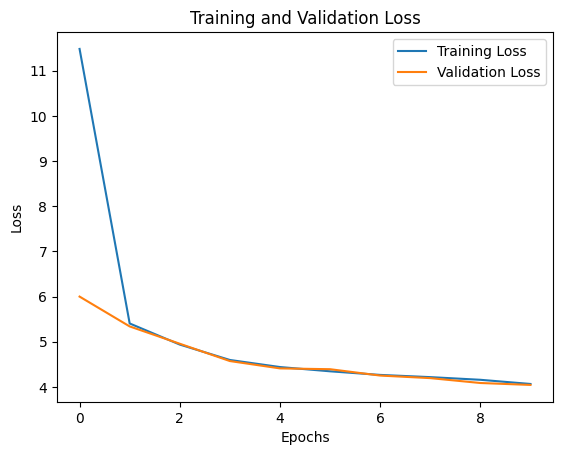

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.518880936037979


In [ ]:
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score

# Define the custom LSTM layer
custom_lstm_layer = CustomLSTM(units=64)

# Define the model
model = Sequential([
    custom_lstm_layer,
    CustomDropout(rate=0.2),
    CustomDense(units=1, activation=None)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(training_vectors, y_train, epochs=10, batch_size=64, validation_split=0.1, verbose=1)

# Plot loss curves
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the test set
y_pred = model.predict(testing_vectors)

# Round predictions to the nearest integer
y_pred_rounded = np.rint(y_pred).astype(int)

# Calculate Quadratic Weighted Kappa (QWK) score
qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)


Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 11.9210 - mae: 2.7441 - val_loss: 6.0454 - val_mae: 1.9856
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.4380 - mae: 1.8649 - val_loss: 5.3425 - val_mae: 1.8503
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9281 - mae: 1.7513 - val_loss: 4.9153 - val_mae: 1.7613
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.6352 - mae: 1.6916 - val_loss: 4.5861 - val_mae: 1.6792
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4185 - mae: 1.6428 - val_loss: 4.3913 - val_mae: 1.6346
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.3288 - mae: 1.6274 - val_loss: 4.2940 - val_mae: 1.6163
Epoch 7/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2686 - mae: 1.6105 - val_loss: 4.2281 - 

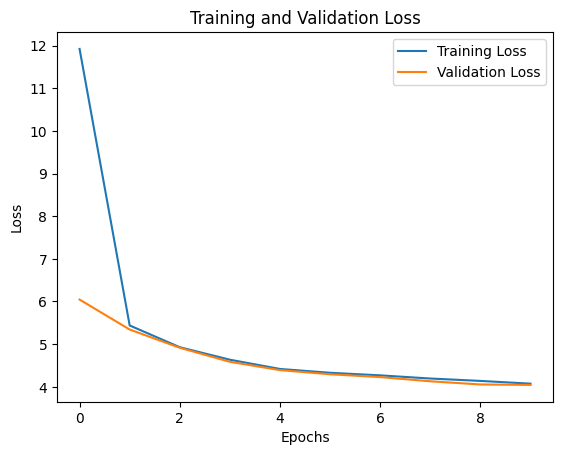

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5118434825284353
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 7ms/step - loss: 11.2488 - mse: 11.2488 - val_loss: 6.0325 - val_mse: 6.0325
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.3054 - mse: 5.3054 - val_loss: 5.1817 - val_mse: 5.1817
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8483 - mse: 4.8483 - val_loss: 4.7434 - val_mse: 4.7434
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.5686 - mse: 4.5686 - val_loss: 4.5092 - val_mse: 4.5092
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4427 - mse: 4.4427 - val_loss: 4.3832 - val_mse: 4.3832
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.3257 - mse: 4.3257 - val_loss: 4.3468 - val_mse: 4.3468
Epo

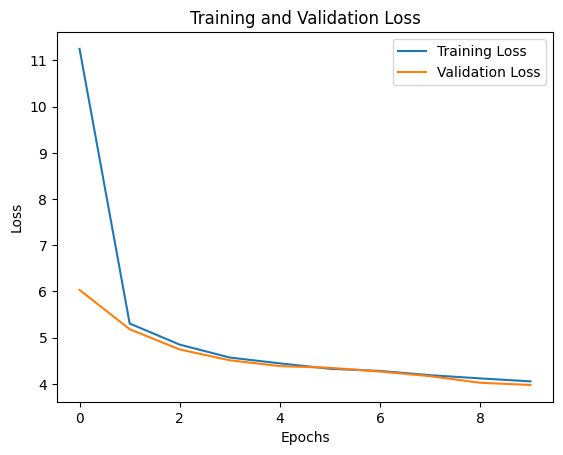

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5081227365908015
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 9.8565 - mae: 2.5168 - val_loss: 6.1330 - val_mae: 2.0357
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5385 - mae: 1.9064 - val_loss: 5.7724 - val_mae: 1.9492
Epoch 3/10
128/128 [==============================] - 1s 4ms/step - loss: 5.3027 - mae: 1.8495 - val_loss: 5.5481 - val_mae: 1.8943
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1743 - mae: 1.8184 - val_loss: 5.3500 - val_mae: 1.8413
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 5.0222 - mae: 1.7825 - val_loss: 5.2210 - val_mae: 1.8233
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8502 - mae: 1.7488 - val_loss: 5.0150 - val_mae: 1.7736
Epoch 

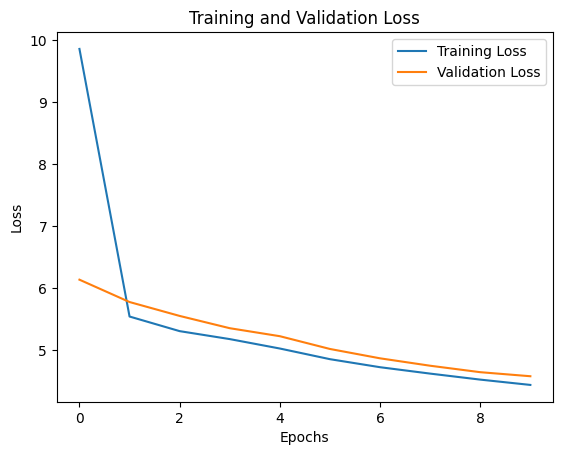

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4221357339688593
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 9.6614 - mse: 9.6614 - val_loss: 6.1274 - val_mse: 6.1274
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5637 - mse: 5.5637 - val_loss: 5.7804 - val_mse: 5.7804
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 5.3201 - mse: 5.3201 - val_loss: 5.5439 - val_mse: 5.5439
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1437 - mse: 5.1437 - val_loss: 5.3632 - val_mse: 5.3632
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 5.0017 - mse: 5.0017 - val_loss: 5.1868 - val_mse: 5.1868
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8629 - mse: 4.8629 - val_loss: 5.0127 - val_mse: 5.0127
Epoch 

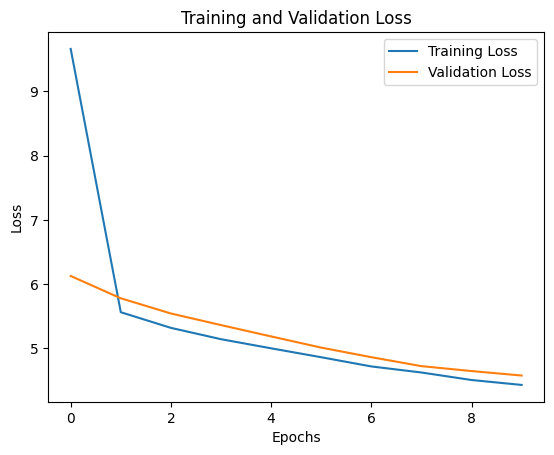

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.41685604646811136
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.5906 - mae: 2.4690 - val_loss: 5.6905 - val_mae: 1.9044
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0403 - mae: 1.7711 - val_loss: 4.9048 - val_mae: 1.7387
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.5385 - mae: 1.6659 - val_loss: 4.5616 - val_mae: 1.6748
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.2969 - mae: 1.6116 - val_loss: 4.1952 - val_mae: 1.5775
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2095 - mae: 1.5961 - val_loss: 4.1380 - val_mae: 1.5789
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.0784 - mae: 1.5729 - val_loss: 4.1337 - val_mae: 1.5898
E

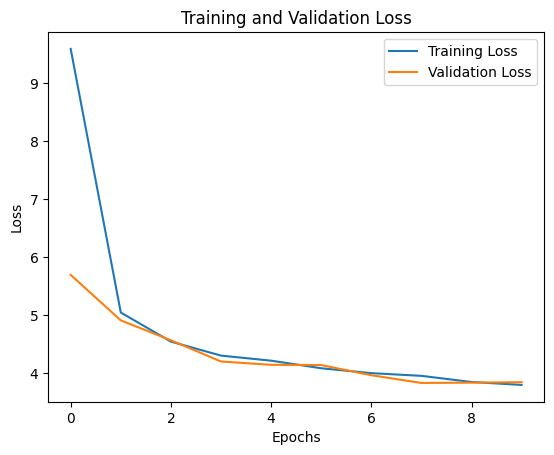

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5560462702214226
Loss Function: mean_squared_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.3061 - mse: 9.3061 - val_loss: 5.6246 - val_mse: 5.6246
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9774 - mse: 4.9774 - val_loss: 4.7539 - val_mse: 4.7539
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.5214 - mse: 4.5214 - val_loss: 4.3942 - val_mse: 4.3942
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3073 - mse: 4.3073 - val_loss: 4.1843 - val_mse: 4.1843
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.1941 - mse: 4.1941 - val_loss: 4.1168 - val_mse: 4.1168
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.1302 - mse: 4.1302 - val_loss: 4.0129 - val_mse: 4.0129
Ep

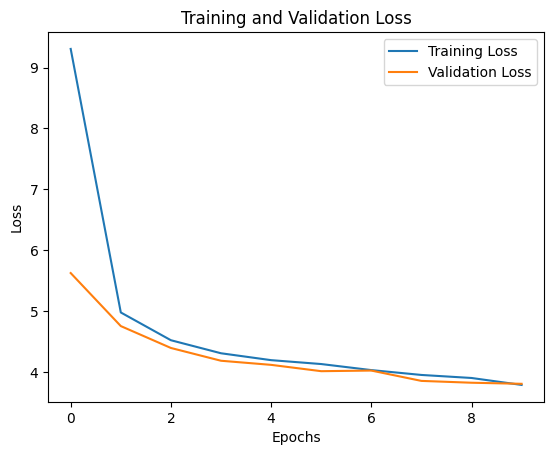

122/122 [==============================] - 1s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.570818967983667
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 11.6746 - mae: 2.7085 - val_loss: 6.0459 - val_mae: 1.9717
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.4413 - mae: 1.8600 - val_loss: 5.3444 - val_mae: 1.8534
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9579 - mae: 1.7626 - val_loss: 4.8950 - val_mae: 1.7377
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.6685 - mae: 1.6873 - val_loss: 4.6007 - val_mae: 1.6793
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4650 - mae: 1.6577 - val_loss: 4.4149 - val_mae: 1.6358
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.3641 - mae: 1.6332 - val_loss: 4.3409 - val_mae: 1.6286
Epo

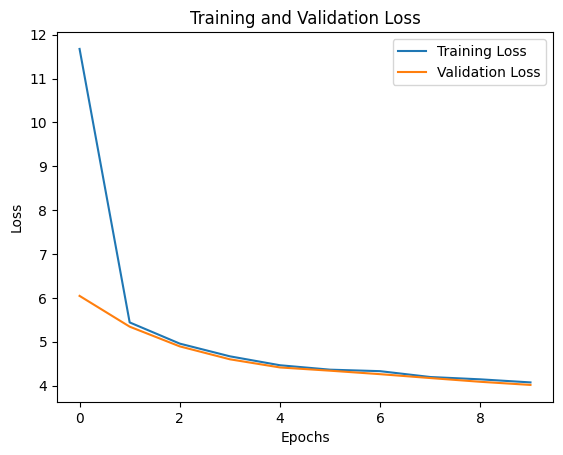

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5071434532018367
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 11.1703 - mse: 11.1703 - val_loss: 5.9752 - val_mse: 5.9752
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.3469 - mse: 5.3469 - val_loss: 5.2422 - val_mse: 5.2422
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.8794 - mse: 4.8794 - val_loss: 4.7993 - val_mse: 4.7993
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.5715 - mse: 4.5715 - val_loss: 4.5457 - val_mse: 4.5457
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4581 - mse: 4.4581 - val_loss: 4.3667 - val_mse: 4.3667
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2895 - mse: 4.2895 - val_loss: 4.2637 - val_mse: 4.2637
E

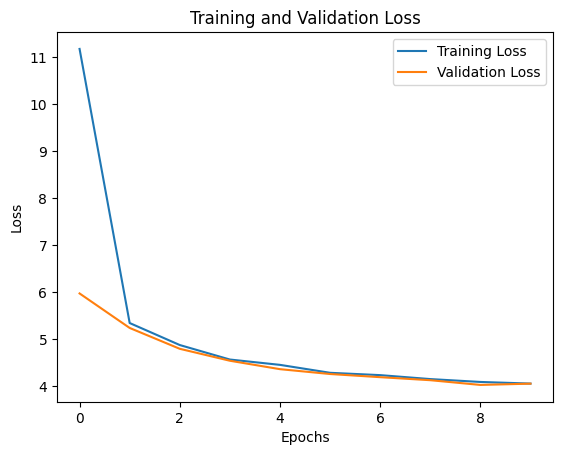

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5112216797475779
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.5734 - mae: 2.4816 - val_loss: 6.0789 - val_mae: 2.0140
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.5223 - mae: 1.9004 - val_loss: 5.7434 - val_mae: 1.9458
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 5.2650 - mae: 1.8421 - val_loss: 5.4875 - val_mae: 1.8693
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.0961 - mae: 1.7986 - val_loss: 5.3026 - val_mae: 1.8411
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9517 - mae: 1.7735 - val_loss: 5.1100 - val_mae: 1.7903
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8096 - mae: 1.7353 - val_loss: 4.9354 - val_mae: 1.7518
Epoc

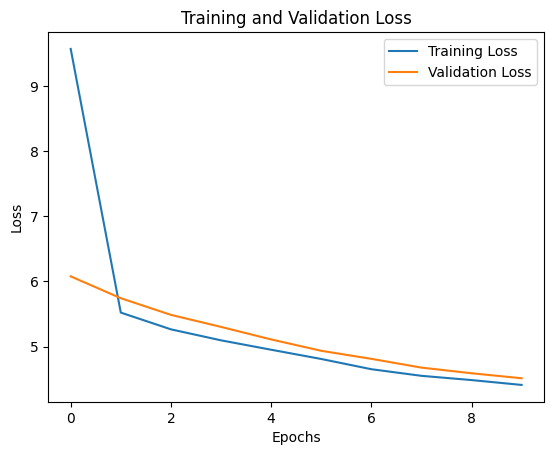

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.4208365419758082
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 9.5576 - mse: 9.5576 - val_loss: 6.1107 - val_mse: 6.1107
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.5600 - mse: 5.5600 - val_loss: 5.7316 - val_mse: 5.7316
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 5.3362 - mse: 5.3362 - val_loss: 5.5345 - val_mse: 5.5345
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 5.1372 - mse: 5.1372 - val_loss: 5.3954 - val_mse: 5.3954
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 5.0010 - mse: 5.0010 - val_loss: 5.1930 - val_mse: 5.1930
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 4.8516 - mse: 4.8516 - val_loss: 5.0134 - val_mse: 5.0134
Epoc

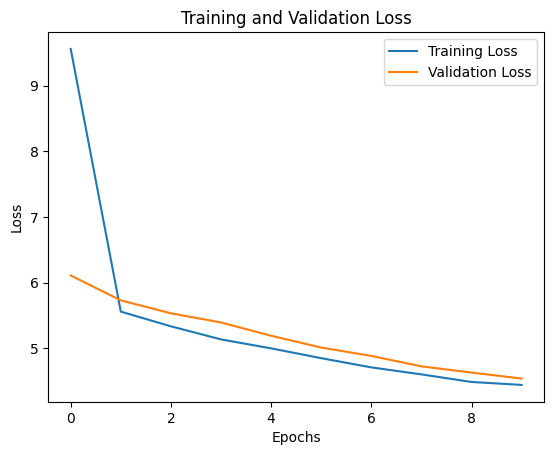

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.41888796041272225
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 6s 12ms/step - loss: 9.6632 - mae: 2.4800 - val_loss: 5.7093 - val_mae: 1.9240
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0098 - mae: 1.7687 - val_loss: 4.7682 - val_mae: 1.7065
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.5440 - mae: 1.6681 - val_loss: 4.5333 - val_mae: 1.6749
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.3237 - mae: 1.6234 - val_loss: 4.3958 - val_mae: 1.6357
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.1842 - mae: 1.5903 - val_loss: 4.0971 - val_mae: 1.5712
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.0776 - mae: 1.5703 - val_loss: 3.9845 - val_mae: 1.538

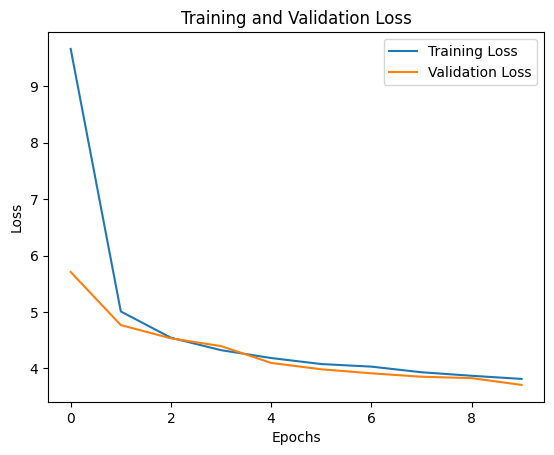

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5622086869607752
Loss Function: mean_squared_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 9.3713 - mse: 9.3713 - val_loss: 5.7476 - val_mse: 5.7476
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9973 - mse: 4.9973 - val_loss: 4.7327 - val_mse: 4.7327
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4890 - mse: 4.4890 - val_loss: 4.4498 - val_mse: 4.4498
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2938 - mse: 4.2938 - val_loss: 4.2102 - val_mse: 4.2102
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.1960 - mse: 4.1960 - val_loss: 4.1261 - val_mse: 4.1261
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.0624 - mse: 4.0624 - val_loss: 4.0096 - val_mse: 4.0096


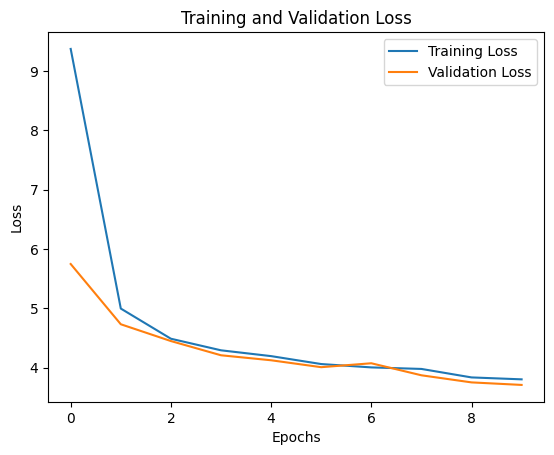

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.570167148363838
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 30.2438 - mae: 4.9743 - val_loss: 30.5345 - val_mae: 4.9905
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 29.4850 - mae: 4.9047 - val_loss: 30.5241 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4789 - mae: 4.9042 - val_loss: 30.5213 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4768 - mae: 4.9040 - val_loss: 30.5201 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4759 - mae: 4.9039 - val_loss: 30.5195 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 29.4754 - mae: 4.9038 - val_loss: 30.5191 - val_mae: 4

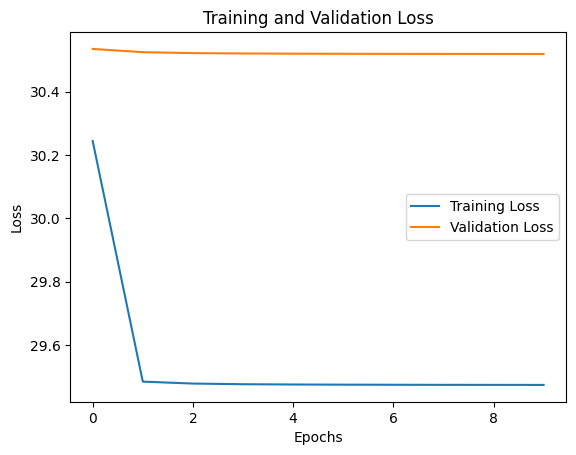

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 30.2682 - mse: 30.2682 - val_loss: 30.5350 - val_mse: 30.5350
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4851 - mse: 29.4851 - val_loss: 30.5243 - val_mse: 30.5243
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4790 - mse: 29.4790 - val_loss: 30.5213 - val_mse: 30.5213
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4769 - mse: 29.4769 - val_loss: 30.5201 - val_mse: 30.5201
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4759 - mse: 29.4759 - val_loss: 30.5195 - val_mse: 30.5195
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4754 - mse: 29.4754 - val_loss: 30.51

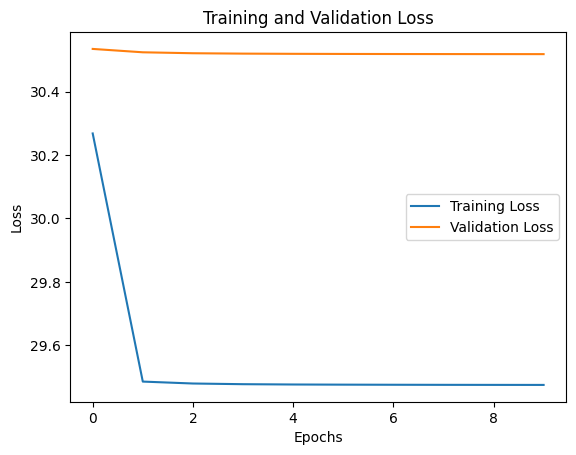

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 30.1537 - mae: 4.9668 - val_loss: 30.6185 - val_mae: 4.9983
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5411 - mae: 4.9101 - val_loss: 30.5647 - val_mae: 4.9933
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5110 - mae: 4.9073 - val_loss: 30.5479 - val_mae: 4.9917
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4996 - mae: 4.9062 - val_loss: 30.5398 - val_mae: 4.9910
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4933 - mae: 4.9056 - val_loss: 30.5351 - val_mae: 4.9906
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4895 - mae: 4.9052 - val_loss: 30.5320 - val_mae

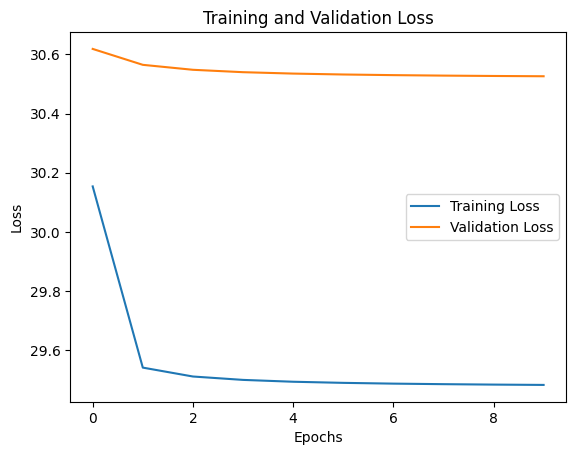

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 30.1572 - mse: 30.1572 - val_loss: 30.6199 - val_mse: 30.6199
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5415 - mse: 29.5415 - val_loss: 30.5653 - val_mse: 30.5653
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.5114 - mse: 29.5114 - val_loss: 30.5483 - val_mse: 30.5483
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4997 - mse: 29.4997 - val_loss: 30.5401 - val_mse: 30.5401
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4933 - mse: 29.4933 - val_loss: 30.5353 - val_mse: 30.5353
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4896 - mse: 29.4896 - val_loss: 30.532

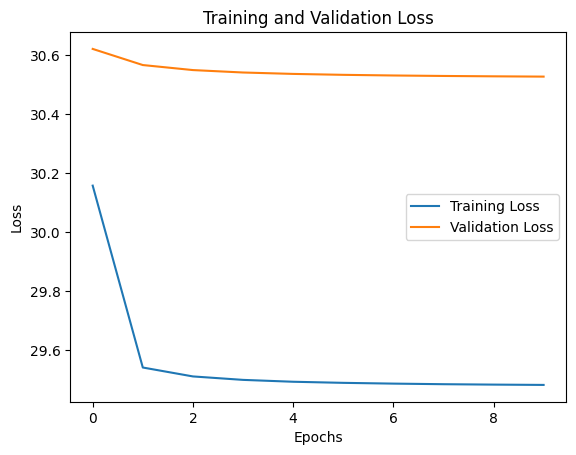

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 29.9101 - mae: 4.9433 - val_loss: 30.5193 - val_mae: 4.9891
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4745 - mae: 4.9038 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 29.4741 - mae: 4.9037 - val_loss: 30.5182 - val

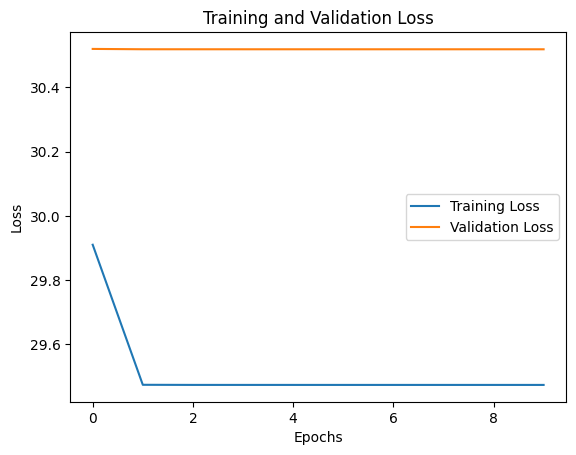

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_squared_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 7ms/step - loss: 29.9864 - mse: 29.9864 - val_loss: 30.5197 - val_mse: 30.5197
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4746 - mse: 29.4746 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30.5182 - val_mse: 30.5182
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 29.4741 - mse: 29.4741 - val_loss: 30

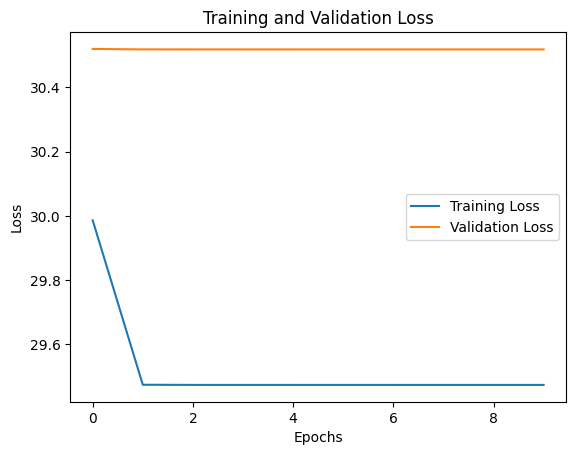

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.7528 - mae: 2.7528 - val_loss: 1.9223 - val_mae: 1.9223
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.8235 - mae: 1.8235 - val_loss: 1.7692 - val_mae: 1.7692
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 1.7226 - mae: 1.7226 - val_loss: 1.7037 - val_mae: 1.7037
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6656 - mae: 1.6656 - val_loss: 1.6443 - val_mae: 1.6443
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6405 - mae: 1.6405 - val_loss: 1.6112 - val_mae: 1.6112
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6234 - mae: 1.6234 - val_loss: 1.5942 - val_mae: 1.5942
E

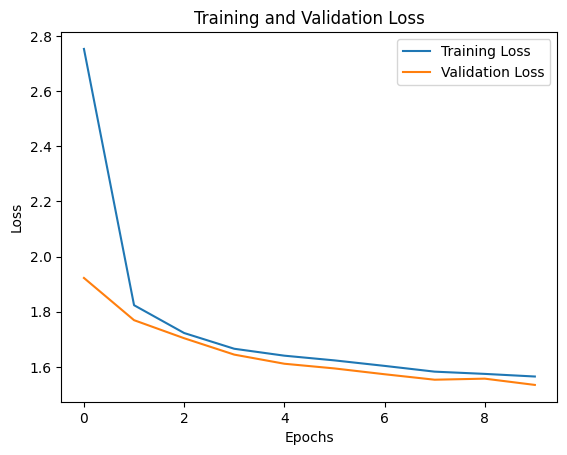

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5164222478341522
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 12ms/step - loss: 2.7193 - mse: 11.8986 - val_loss: 1.9304 - val_mse: 6.0457
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 1.8186 - mse: 5.4691 - val_loss: 1.7678 - val_mse: 5.3724
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7238 - mse: 5.0430 - val_loss: 1.7138 - val_mse: 4.9955
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6702 - mse: 4.7587 - val_loss: 1.6386 - val_mse: 4.6511
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6450 - mse: 4.5805 - val_loss: 1.6172 - val_mse: 4.5995
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6265 - mse: 4.4723 - val_loss: 1.5879 - val_mse: 4.2965
Ep

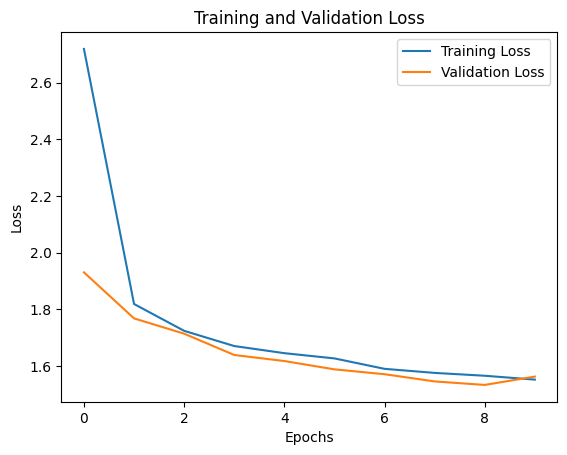

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5326474843630814
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 4.9575 - mae: 4.9575 - val_loss: 4.0719 - val_mae: 4.0719
Epoch 2/10
128/128 [==============================] - 1s 8ms/step - loss: 3.2101 - mae: 3.2101 - val_loss: 2.6985 - val_mae: 2.6985
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 2.2986 - mae: 2.2986 - val_loss: 2.2126 - val_mae: 2.2126
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 2.0691 - mae: 2.0691 - val_loss: 2.0796 - val_mae: 2.0796
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 1.9798 - mae: 1.9798 - val_loss: 2.0044 - val_mae: 2.0044
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 1.9230 - mae: 1.9230 - val_loss: 1.9590 - val_mae: 1.9590
Epoc

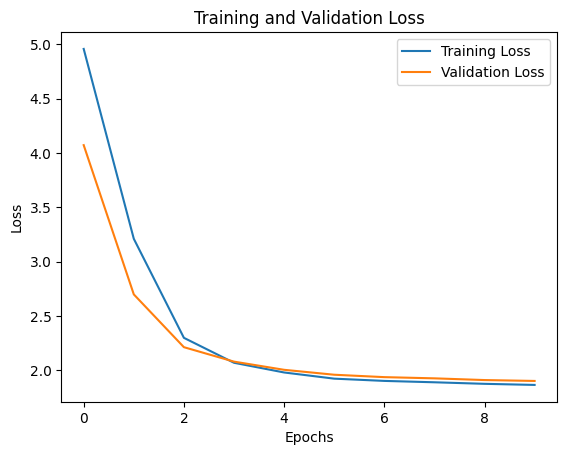

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.16634995941970887
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 2s 8ms/step - loss: 5.0034 - mse: 30.9644 - val_loss: 4.1096 - val_mse: 22.0717
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 3.2410 - mse: 14.7011 - val_loss: 2.7230 - val_mse: 10.4918
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 2.3273 - mse: 7.8279 - val_loss: 2.2268 - val_mse: 7.1802
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 2.0738 - mse: 6.4044 - val_loss: 2.0888 - val_mse: 6.6156
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 1.9862 - mse: 6.1865 - val_loss: 2.0111 - val_mse: 6.4729
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.9317 - mse: 6.1709 - val_loss: 1.9590 - val_mse: 6.4062


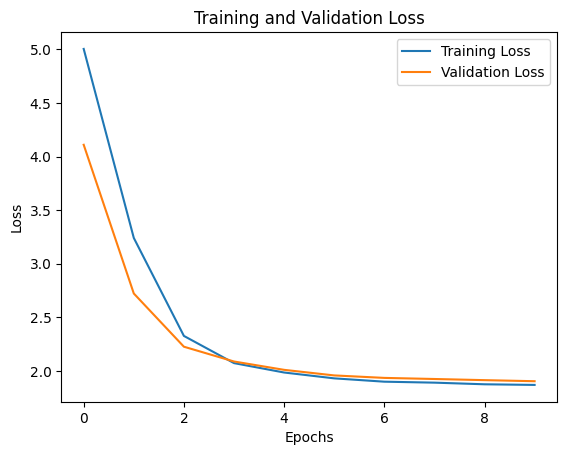

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.16151764938927415
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.3813 - mae: 2.3813 - val_loss: 1.8559 - val_mae: 1.8559
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7535 - mae: 1.7535 - val_loss: 1.6934 - val_mae: 1.6934
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6802 - mae: 1.6802 - val_loss: 1.6300 - val_mae: 1.6300
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6374 - mae: 1.6374 - val_loss: 1.5899 - val_mae: 1.5899
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6140 - mae: 1.6140 - val_loss: 1.6074 - val_mae: 1.6074
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 1.5881 - mae: 1.5881 - val_loss: 1.5579 - val_mae: 1.5579


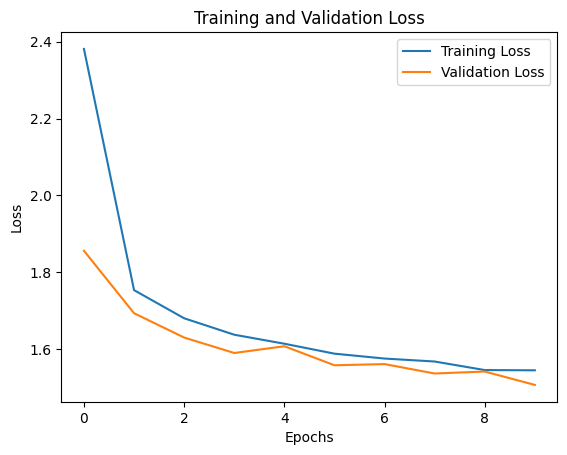

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5402280449774591
Loss Function: mean_absolute_error, Activation Function: relu, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 4s 8ms/step - loss: 2.4274 - mse: 9.5507 - val_loss: 1.8802 - val_mse: 5.7526
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7745 - mse: 5.2906 - val_loss: 1.7075 - val_mse: 5.1452
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6776 - mse: 4.8169 - val_loss: 1.6289 - val_mse: 4.6728
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6447 - mse: 4.6129 - val_loss: 1.6082 - val_mse: 4.4439
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6132 - mse: 4.4242 - val_loss: 1.5677 - val_mse: 4.3289
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.5878 - mse: 4.2941 - val_loss: 1.5826 - val_mse: 4.2415
E

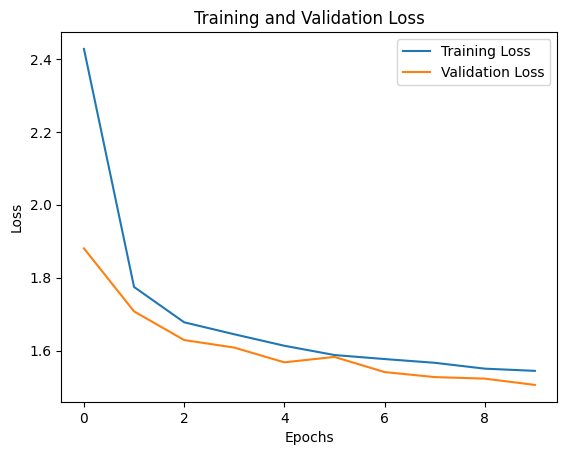

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5361515413020139
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 2.7405 - mae: 2.7405 - val_loss: 1.9353 - val_mae: 1.9353
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 1.8228 - mae: 1.8228 - val_loss: 1.7826 - val_mae: 1.7826
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 1.7246 - mae: 1.7246 - val_loss: 1.7041 - val_mae: 1.7041
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6815 - mae: 1.6815 - val_loss: 1.6517 - val_mae: 1.6517
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6444 - mae: 1.6444 - val_loss: 1.6193 - val_mae: 1.6193
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.6078 - mae: 1.6078 - val_loss: 1.5739 - val_mae: 1.5739
Ep

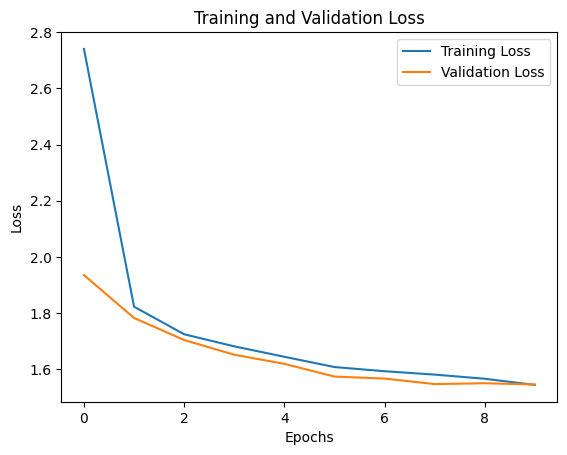

122/122 [==============================] - 1s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5195128569190549
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.7860 - mse: 12.3947 - val_loss: 1.9378 - val_mse: 6.0749
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.8209 - mse: 5.5099 - val_loss: 1.7812 - val_mse: 5.4283
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7343 - mse: 5.0697 - val_loss: 1.6859 - val_mse: 4.9597
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 1.6768 - mse: 4.7883 - val_loss: 1.6393 - val_mse: 4.6936
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 1.6471 - mse: 4.6183 - val_loss: 1.6078 - val_mse: 4.5471
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.6179 - mse: 4.4449 - val_loss: 1.5836 - val_mse: 4.3386
E

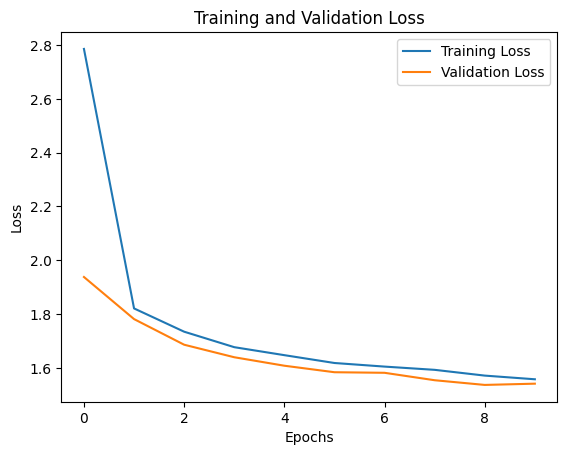

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5229785983979671
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 2s 7ms/step - loss: 4.8360 - mae: 4.8360 - val_loss: 3.9146 - val_mae: 3.9146
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 3.0733 - mae: 3.0733 - val_loss: 2.5971 - val_mae: 2.5971
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 2.2569 - mae: 2.2569 - val_loss: 2.2080 - val_mae: 2.2080
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 2.0653 - mae: 2.0653 - val_loss: 2.0836 - val_mae: 2.0836
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.9806 - mae: 1.9806 - val_loss: 2.0086 - val_mae: 2.0086
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 1.9268 - mae: 1.9268 - val_loss: 1.9599 - val_mae: 1.9599
Epo

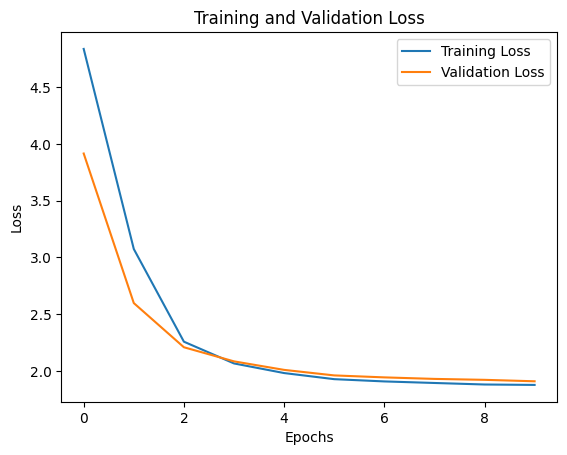

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.16926502721703196
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 4.8650 - mse: 29.4640 - val_loss: 3.9503 - val_mse: 20.6344
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 3.0993 - mse: 13.6077 - val_loss: 2.6175 - val_mse: 9.8018
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 2.2820 - mse: 7.5648 - val_loss: 2.2127 - val_mse: 7.0913
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 2.0651 - mse: 6.3420 - val_loss: 2.0837 - val_mse: 6.5948
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.9838 - mse: 6.1815 - val_loss: 2.0042 - val_mse: 6.4583
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 1.9272 - mse: 6.1470 - val_loss: 1.9534 - val_mse: 6.3988

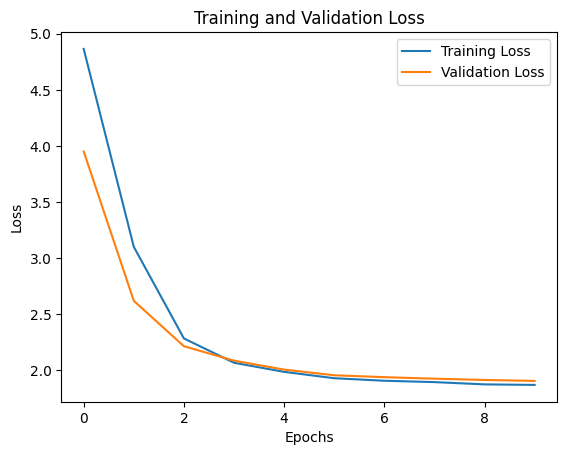

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.17354464145614312
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 2.5044 - mae: 2.5044 - val_loss: 1.8930 - val_mae: 1.8930
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7795 - mae: 1.7795 - val_loss: 1.7369 - val_mae: 1.7369
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6896 - mae: 1.6896 - val_loss: 1.6641 - val_mae: 1.6641
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6447 - mae: 1.6447 - val_loss: 1.6047 - val_mae: 1.6047
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 1.6377 - mae: 1.6377 - val_loss: 1.5792 - val_mae: 1.5792
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6035 - mae: 1.6035 - val_loss: 1.5693 - val_mae: 1.569

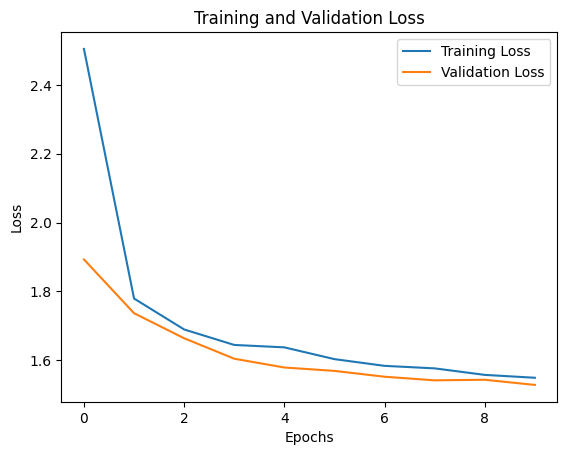

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5465330766214862
Loss Function: mean_absolute_error, Activation Function: linear, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.4793 - mse: 9.9343 - val_loss: 1.9062 - val_mse: 5.8998
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.7894 - mse: 5.3739 - val_loss: 1.7766 - val_mse: 5.2967
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6857 - mse: 4.8456 - val_loss: 1.6440 - val_mse: 4.7426
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6484 - mse: 4.6427 - val_loss: 1.6018 - val_mse: 4.5172
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.6092 - mse: 4.4606 - val_loss: 1.5753 - val_mse: 4.3266
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 1.5934 - mse: 4.2957 - val_loss: 1.5572 - val_mse: 4.2448

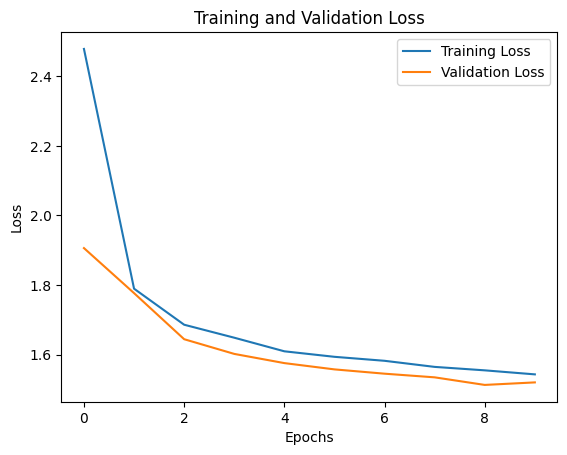

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5256855112723839
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adam, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 4.9746 - mae: 4.9746 - val_loss: 4.9904 - val_mae: 4.9904
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9046 - mae: 4.9046 - val_loss: 4.9895 - val_mae: 4.9895
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9041 - mae: 4.9041 - val_loss: 4.9893 - val_mae: 4.9893
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9892 - val_mae: 4.9892
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9039 - mae: 4.9039 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9891 - val_mae: 4.9891
Epoc

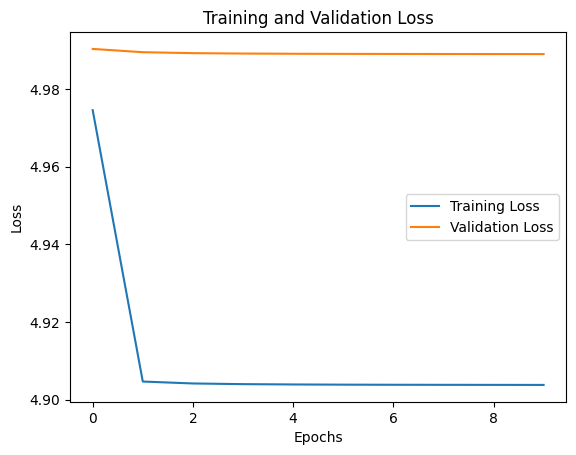

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: adam, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 4.9688 - mse: 30.1939 - val_loss: 4.9903 - val_mse: 30.5327
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9046 - mse: 29.4837 - val_loss: 4.9895 - val_mse: 30.5236
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9041 - mse: 29.4784 - val_loss: 4.9893 - val_mse: 30.5210
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9039 - mse: 29.4766 - val_loss: 4.9892 - val_mse: 30.5199
Epoch 5/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9039 - mse: 29.4757 - val_loss: 4.9891 - val_mse: 30.5194
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9038 - mse: 29.4752 - val_loss: 4.9891 - val_ms

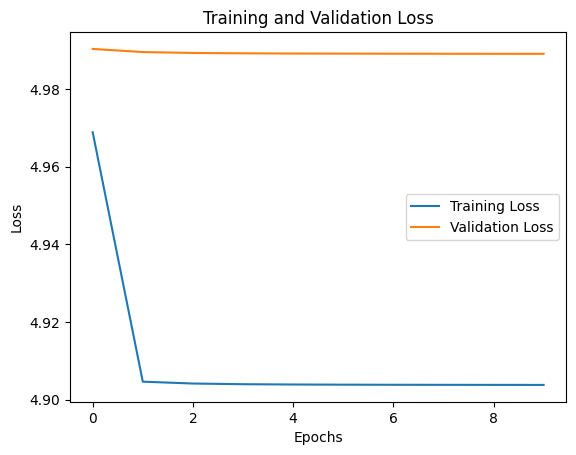

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: sgd, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 5.3120 - mae: 5.3120 - val_loss: 5.1469 - val_mae: 5.1469
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0095 - mae: 5.0095 - val_loss: 5.0589 - val_mae: 5.0589
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9594 - mae: 4.9594 - val_loss: 5.0322 - val_mae: 5.0322
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9409 - mae: 4.9409 - val_loss: 5.0198 - val_mae: 5.0198
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9313 - mae: 4.9313 - val_loss: 5.0127 - val_mae: 5.0127
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9255 - mae: 4.9255 - val_loss: 5.0082 - val_mae: 5.0082
Ep

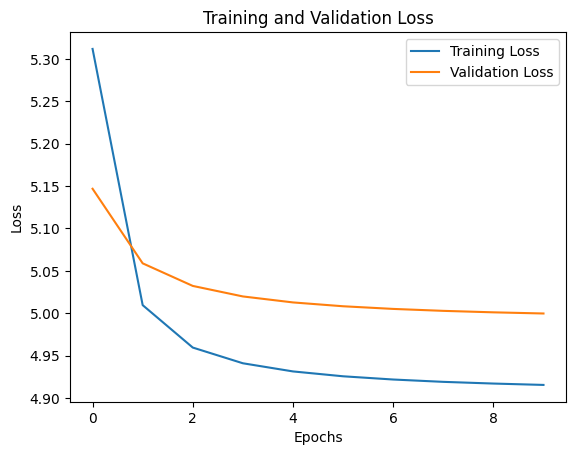

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: sgd, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 5.2891 - mse: 33.6861 - val_loss: 5.1335 - val_mse: 32.1031
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 5.0008 - mse: 30.5026 - val_loss: 5.0532 - val_mse: 31.2181
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9550 - mse: 30.0147 - val_loss: 5.0288 - val_mse: 30.9522
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9382 - mse: 29.8389 - val_loss: 5.0174 - val_mse: 30.8278
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9293 - mse: 29.7442 - val_loss: 5.0109 - val_mse: 30.7570
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9240 - mse: 29.6875 - val_loss: 5.0067 - val_mse

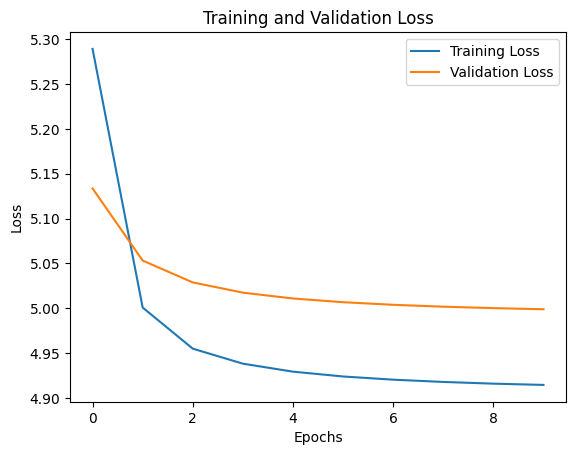

122/122 [==============================] - 1s 3ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mae
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 4.9497 - mae: 4.9497 - val_loss: 4.9895 - val_mae: 4.9895
Epoch 2/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9040 - mae: 4.9040 - val_loss: 4.9891 - val_mae: 4.9891
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9038 - mae: 4.9038 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9037 - mae: 4.9037 - val_loss: 4.9890 - val_mae: 4.9890
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9037 - mae: 4.9037 - val_loss: 4.9890 - val_mae: 4.989

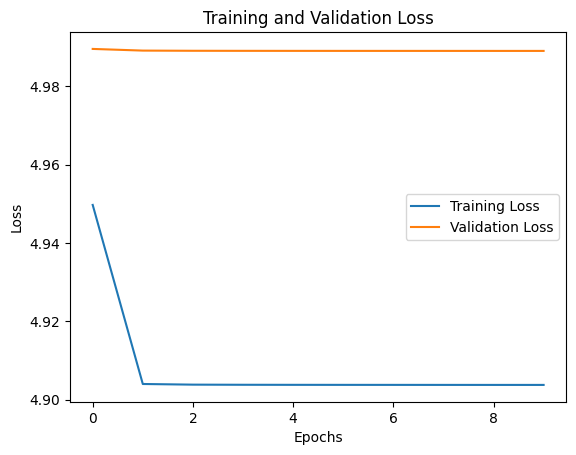

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05
Loss Function: mean_absolute_error, Activation Function: tanh, Optimizer: rmsprop, Metric: mse
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 4.9509 - mse: 29.9973 - val_loss: 4.9895 - val_mse: 30.5243
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 4.9040 - mse: 29.4768 - val_loss: 4.9891 - val_mse: 30.5192
Epoch 3/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9038 - mse: 29.4749 - val_loss: 4.9890 - val_mse: 30.5186
Epoch 4/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9038 - mse: 29.4746 - val_loss: 4.9890 - val_mse: 30.5185
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.9037 - mse: 29.4744 - val_loss: 4.9890 - val_mse: 30.5184
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 4.9037 - mse: 29.4743 - val_loss: 4.9890 - val

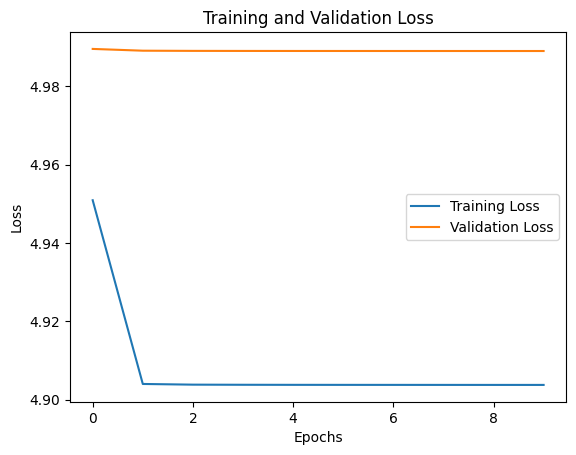

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 9.915439823027228e-05


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score

# Define the lists of options
loss_functions = ['mean_squared_error', 'mean_absolute_error']
activation_functions = [tf.keras.activations.relu, tf.keras.activations.linear, tf.keras.activations.tanh]
optimizers = ['adam', 'sgd', 'rmsprop']
metrics = ['mae', 'mse']

# Iterate over each combination
for loss_func in loss_functions:
    for activation_func in activation_functions:
        for optimizer_name in optimizers:
            for metric_name in metrics:
                print(f"Loss Function: {loss_func}, Activation Function: {activation_func.__name__}, Optimizer: {optimizer_name}, Metric: {metric_name}")

                # Define the model
                model = Sequential([
                    CustomLSTM(units=64),
                    CustomDropout(rate=0.2),
                    CustomDense(units=1, activation=activation_func)
                ])

                # Compile the model
                model.compile(optimizer=optimizer_name, loss=loss_func, metrics=[metric_name])

                # Train the model
                history = model.fit(training_vectors, y_train, epochs=10, batch_size=64, validation_split=0.1, verbose=1)

                # Plot loss curves
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.title('Training and Validation Loss')
                plt.legend()
                plt.show()

                # Predict on the test set
                y_pred = model.predict(testing_vectors)

                # Round predictions to the nearest integer
                y_pred_rounded = np.rint(y_pred).astype(int)

                # Calculate Quadratic Weighted Kappa (QWK) score
                qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
                print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)


In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import cohen_kappa_score
import matplotlib.pyplot as plt

# Define the custom LSTM layer
custom_lstm_layer = CustomLSTM(units=64)
model = Sequential([
                    CustomLSTM(units=64),
                    CustomDropout(rate=0.2),
                    CustomDense(units=1, activation='ReLU')
                ])


# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(training_vectors, y_train,
                    epochs=10, batch_size=64,
                    validation_split=0.1, verbose=1)

# Plot loss curves
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the test set
y_pred = model.predict(testing_vectors)

# Round predictions to the nearest integer
y_pred_rounded = np.rint(y_pred).astype(int)

# Calculate Quadratic Weighted Kappa (QWK) score
qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)


NameError: name 'CustomLSTM' is not defined

In [ ]:
from tensorflow.keras.layers import Layer
import tensorflow.keras.backend as K

class CustomDense(Layer):
    def __init__(self, units, activation=None, **kwargs):
        super(CustomDense, self).__init__(**kwargs)
        self.units = units
        self.activation = activation

    def build(self, input_shape):
        self.kernel = self.add_weight(shape=(input_shape[-1], self.units),
                                      initializer='glorot_uniform',
                                      trainable=True)
        self.bias = self.add_weight(shape=(self.units,),
                                    initializer='zeros',
                                    trainable=True)
        super(CustomDense, self).build(input_shape)

    def call(self, inputs):
        output = K.dot(inputs, self.kernel)
        output = K.bias_add(output, self.bias)
        if self.activation is not None:
            output = self.activation(output)
        return output

    def compute_output_shape(self, input_shape):
        return input_shape[:-1] + (self.units,)

    def get_config(self):
        config = super(CustomDense, self).get_config()
        config.update({'units': self.units, 'activation': self.activation})
        return config


Loss Function: categorical_crossentropy, Activation Function: sigmoid, Optimizer: adam, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 1.6956 - accuracy: 0.3685 - val_loss: 1.4708 - val_accuracy: 0.3685
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 1.4301 - accuracy: 0.4020 - val_loss: 1.3878 - val_accuracy: 0.3883
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3783 - accuracy: 0.4208 - val_loss: 1.3352 - val_accuracy: 0.4147
Epoch 4/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3464 - accuracy: 0.4256 - val_loss: 1.3179 - val_accuracy: 0.4257
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3275 - accuracy: 0.4323 - val_loss: 1.2962 - val_accuracy: 0.4334
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3113 - accuracy: 0.4419 - val_loss: 1.2961 - val_accuracy: 0.4180
Epoch 7/10
128/128 [=======================

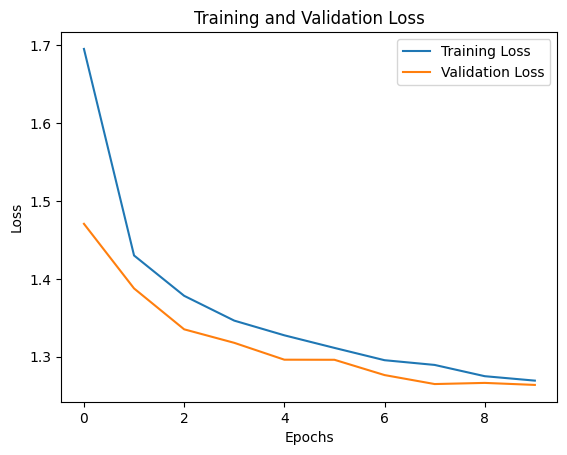

122/122 [==============================] - 2s 2ms/step
Accuracy: 0.44721294631389674
Loss Function: categorical_crossentropy, Activation Function: sigmoid, Optimizer: sgd, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.3452 - accuracy: 0.2718 - val_loss: 2.3037 - val_accuracy: 0.3025
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 2.2627 - accuracy: 0.3326 - val_loss: 2.2337 - val_accuracy: 0.3069
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 2.1937 - accuracy: 0.3408 - val_loss: 2.1747 - val_accuracy: 0.3179
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 2.1347 - accuracy: 0.3514 - val_loss: 2.1234 - val_accuracy: 0.3311
Epoch 5/10
128/128 [==============================] - 1s 8ms/step - loss: 2.0821 - accuracy: 0.3608 - val_loss: 2.0772 - val_accuracy: 0.3432
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 2.0354 - accuracy: 0.3619 -

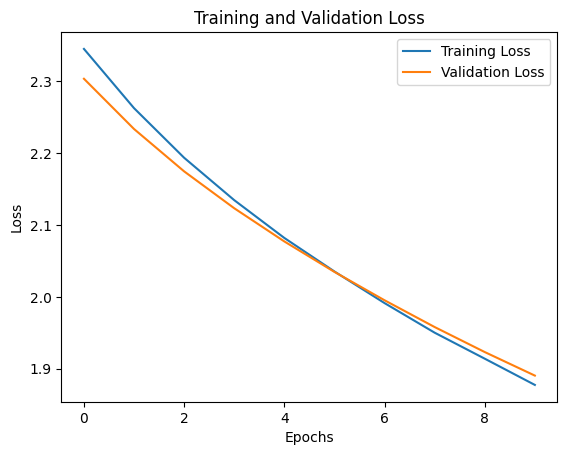

122/122 [==============================] - 0s 2ms/step
Accuracy: 0.36732596968918574
Loss Function: categorical_crossentropy, Activation Function: sigmoid, Optimizer: rmsprop, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 1.6831 - accuracy: 0.3625 - val_loss: 1.4938 - val_accuracy: 0.3520
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.4489 - accuracy: 0.3939 - val_loss: 1.4003 - val_accuracy: 0.4026
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 1.3944 - accuracy: 0.4167 - val_loss: 1.3734 - val_accuracy: 0.4015
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 1.3668 - accuracy: 0.4161 - val_loss: 1.3379 - val_accuracy: 0.4180
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 1.3465 - accuracy: 0.4281 - val_loss: 1.3128 - val_accuracy: 0.4213
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 1.3290 - accuracy: 0.42

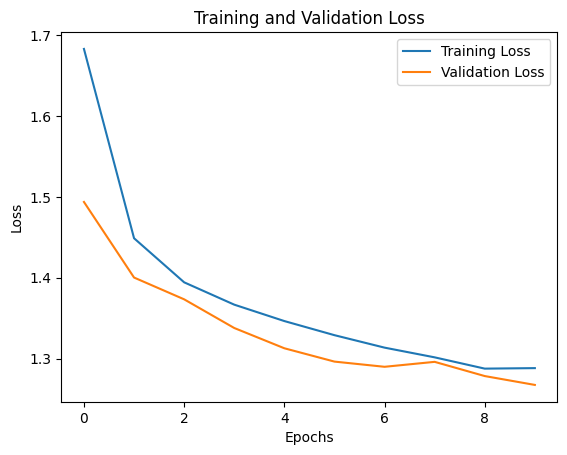

122/122 [==============================] - 0s 2ms/step
Accuracy: 0.4554328281530953
Loss Function: categorical_crossentropy, Activation Function: softmax, Optimizer: adam, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 9ms/step - loss: 1.7005 - accuracy: 0.3638 - val_loss: 1.4678 - val_accuracy: 0.3652
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.4294 - accuracy: 0.4004 - val_loss: 1.3928 - val_accuracy: 0.3927
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3785 - accuracy: 0.4208 - val_loss: 1.3462 - val_accuracy: 0.3982
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3494 - accuracy: 0.4237 - val_loss: 1.3249 - val_accuracy: 0.4246
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3282 - accuracy: 0.4312 - val_loss: 1.2953 - val_accuracy: 0.4125
Epoch 6/10
128/128 [==============================] - 1s 7ms/step - loss: 1.3060 - accuracy: 0.4421 -

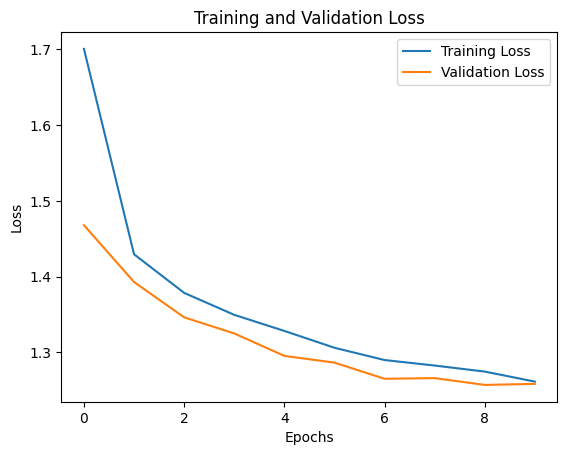

122/122 [==============================] - 0s 2ms/step
Accuracy: 0.4610839969175443
Loss Function: categorical_crossentropy, Activation Function: softmax, Optimizer: sgd, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 2.3408 - accuracy: 0.2870 - val_loss: 2.2991 - val_accuracy: 0.3399
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 2.2542 - accuracy: 0.3511 - val_loss: 2.2264 - val_accuracy: 0.3245
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 2.1831 - accuracy: 0.3537 - val_loss: 2.1664 - val_accuracy: 0.3322
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 2.1246 - accuracy: 0.3549 - val_loss: 2.1150 - val_accuracy: 0.3333
Epoch 5/10
128/128 [==============================] - 1s 5ms/step - loss: 2.0698 - accuracy: 0.3621 - val_loss: 2.0690 - val_accuracy: 0.3377
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 2.0243 - accuracy: 0.3648 - 

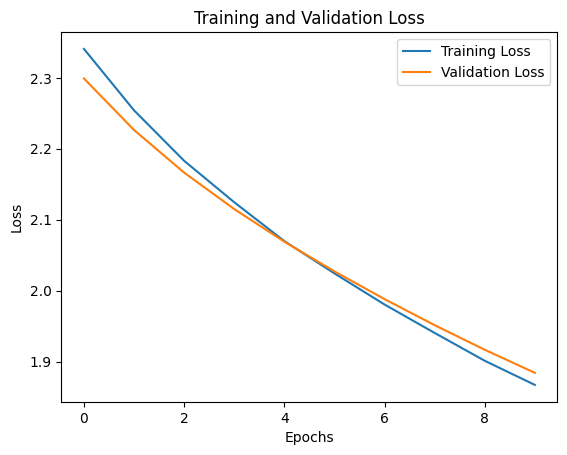

122/122 [==============================] - 1s 3ms/step
Accuracy: 0.36835345491908555
Loss Function: categorical_crossentropy, Activation Function: softmax, Optimizer: rmsprop, Metric: accuracy
Epoch 1/10
128/128 [==============================] - 3s 8ms/step - loss: 1.6970 - accuracy: 0.3713 - val_loss: 1.4906 - val_accuracy: 0.3608
Epoch 2/10
128/128 [==============================] - 1s 6ms/step - loss: 1.4544 - accuracy: 0.3986 - val_loss: 1.4252 - val_accuracy: 0.3839
Epoch 3/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3933 - accuracy: 0.4078 - val_loss: 1.3625 - val_accuracy: 0.4048
Epoch 4/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3636 - accuracy: 0.4216 - val_loss: 1.3290 - val_accuracy: 0.4125
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 1.3385 - accuracy: 0.4286 - val_loss: 1.3152 - val_accuracy: 0.4202
Epoch 6/10
128/128 [==============================] - 1s 5ms/step - loss: 1.3214 - accuracy: 0.43

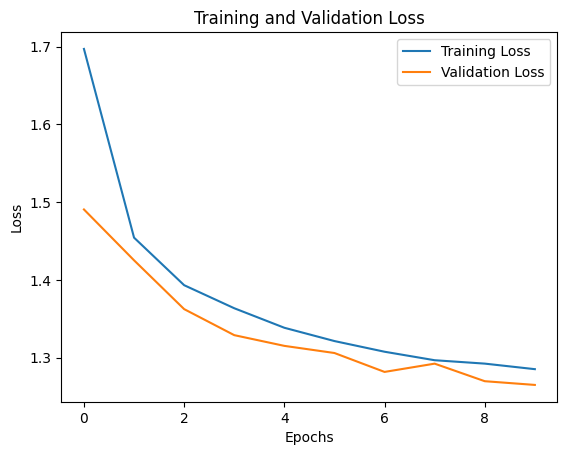

122/122 [==============================] - 1s 4ms/step
Accuracy: 0.44875417415874647


In [ ]:
from tensorflow.keras.utils import to_categorical

# Convert true labels to one-hot encoded format
y_train_one_hot = to_categorical(y_train)

# Define the number of classes
num_classes = y_train_one_hot.shape[1]  # Assumes y_train is already one-hot encoded

# Iterate over each combination
for loss_func in loss_functions:
    for activation_func in activation_functions:
        for optimizer_name in optimizers:
            for metric_name in metrics:
                print(f"Loss Function: {loss_func}, Activation Function: {activation_func.__name__}, Optimizer: {optimizer_name}, Metric: {metric_name}")

                # Define the model
                model = Sequential([
                    CustomLSTM(units=64),
                    CustomDropout(rate=0.2),
                    CustomDense(units=num_classes, activation=activation_func)
                ])

                # Compile the model
                model.compile(optimizer=optimizer_name, loss=loss_func, metrics=[metric_name])

                # Train the model
                history = model.fit(training_vectors, y_train_one_hot, epochs=10, batch_size=64, validation_split=0.1, verbose=1)

                # Plot loss curves
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.title('Training and Validation Loss')
                plt.legend()
                plt.show()

                # Predict on the test set
                y_pred = model.predict(testing_vectors)

                # Convert predictions to class labels
                y_pred_classes = np.argmax(y_pred, axis=1)

                # Calculate accuracy
                accuracy = accuracy_score(y_test, y_pred_classes)
                print("Accuracy:", accuracy)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Define the custom LSTM layer
custom_lstm_layer = CustomLSTM(units=64)

# Define the model
model = Sequential([
    custom_lstm_layer,
    Dense(1, activation='linear')  # Assuming you're performing regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(training_vectors, y_train, epochs=10, batch_size=64, validation_split=0.1)


Epoch 1/10
128/128 [==============================] - 3s 7ms/step - loss: 11.9233 - val_loss: 6.0775
Epoch 2/10
128/128 [==============================] - 1s 5ms/step - loss: 5.2750 - val_loss: 5.3206
Epoch 3/10
128/128 [==============================] - 1s 5ms/step - loss: 4.7745 - val_loss: 4.8466
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.4671 - val_loss: 4.5358
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2835 - val_loss: 4.3766
Epoch 6/10
128/128 [==============================] - 1s 8ms/step - loss: 4.1645 - val_loss: 4.2651
Epoch 7/10
128/128 [==============================] - 1s 8ms/step - loss: 4.1026 - val_loss: 4.1725
Epoch 8/10
128/128 [==============================] - 1s 8ms/step - loss: 4.0258 - val_loss: 4.1431
Epoch 9/10
128/128 [==============================] - 1s 6ms/step - loss: 3.9806 - val_loss: 4.0938
Epoch 10/10
128/128 [==============================] - 1s 5ms/step - loss: 3.9164 - val_loss: 4.010

In [ ]:
# lstm_model.save('final_lstm.h5')
y_pred = model.predict(testing_vectors)
y_pred = np.around(y_pred)
y_pred

122/122 [==============================] - 1s 4ms/step


array([[3.],
       [4.],
       [6.],
       ...,
       [6.],
       [7.],
       [8.]], dtype=float32)

Epoch 1/10
128/128 [==============================] - 9s 18ms/step - loss: 11.0969 - val_loss: 5.9581
Epoch 2/10
128/128 [==============================] - 2s 16ms/step - loss: 5.1955 - val_loss: 5.2157
Epoch 3/10
128/128 [==============================] - 2s 12ms/step - loss: 4.7191 - val_loss: 4.7943
Epoch 4/10
128/128 [==============================] - 1s 9ms/step - loss: 4.4255 - val_loss: 4.5505
Epoch 5/10
128/128 [==============================] - 1s 10ms/step - loss: 4.2675 - val_loss: 4.3490
Epoch 6/10
128/128 [==============================] - 1s 9ms/step - loss: 4.1499 - val_loss: 4.2211
Epoch 7/10
128/128 [==============================] - 1s 9ms/step - loss: 4.0663 - val_loss: 4.1412
Epoch 8/10
128/128 [==============================] - 1s 7ms/step - loss: 3.9868 - val_loss: 4.1343
Epoch 9/10
128/128 [==============================] - 1s 5ms/step - loss: 3.9255 - val_loss: 3.9948
Epoch 10/10
128/128 [==============================] - 1s 5ms/step - loss: 3.8481 - val_loss: 3

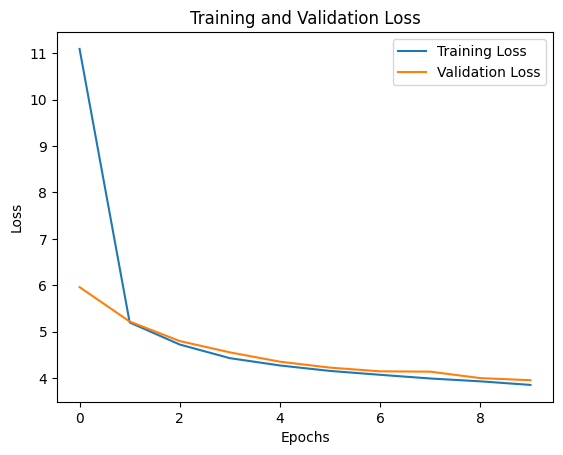

122/122 [==============================] - 0s 2ms/step
Quadratic Weighted Kappa (QWK) Score: 0.5273405517009564


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import cohen_kappa_score
import matplotlib.pyplot as plt

# Define the custom LSTM layer
custom_lstm_layer = CustomLSTM(units=64)

# Define the model
model = Sequential([
    custom_lstm_layer,
    Dense(1, activation='linear')  # Assuming you're performing regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(training_vectors, y_train,
                    epochs=10, batch_size=64,
                    validation_split=0.1, verbose=1)

# Plot loss curves
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the test set
y_pred = model.predict(testing_vectors)

# Round predictions to the nearest integer
y_pred_rounded = np.rint(y_pred).astype(int)

# Calculate Quadratic Weighted Kappa (QWK) score
qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Define the custom LSTM layer
custom_lstm_layer = CustomLSTM(units=64)

# Define the model
model = Sequential([
    CustomLSTM(units=64),
    CustomDropout(rate=0.2),  # Adding a dropout layer with dropout rate of 0.2
    CustomDense(units=1, activation=None)  # Linear activation function for regression
])


# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(training_vectors, y_train, epochs=10, batch_size=64, validation_split=0.1)


Epoch 1/10
128/128 [==============================] - 3s 11ms/step - loss: 11.5458 - val_loss: 5.9977
Epoch 2/10
128/128 [==============================] - 1s 9ms/step - loss: 5.3827 - val_loss: 5.3189
Epoch 3/10
128/128 [==============================] - 1s 8ms/step - loss: 4.8866 - val_loss: 4.8593
Epoch 4/10
128/128 [==============================] - 1s 5ms/step - loss: 4.5885 - val_loss: 4.5857
Epoch 5/10
128/128 [==============================] - 1s 6ms/step - loss: 4.4302 - val_loss: 4.4065
Epoch 6/10
128/128 [==============================] - 1s 6ms/step - loss: 4.3548 - val_loss: 4.2957
Epoch 7/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2782 - val_loss: 4.2269
Epoch 8/10
128/128 [==============================] - 1s 6ms/step - loss: 4.2274 - val_loss: 4.1279
Epoch 9/10
128/128 [==============================] - 1s 5ms/step - loss: 4.1449 - val_loss: 4.1784
Epoch 10/10
128/128 [==============================] - 1s 6ms/step - loss: 4.0291 - val_loss: 4.00

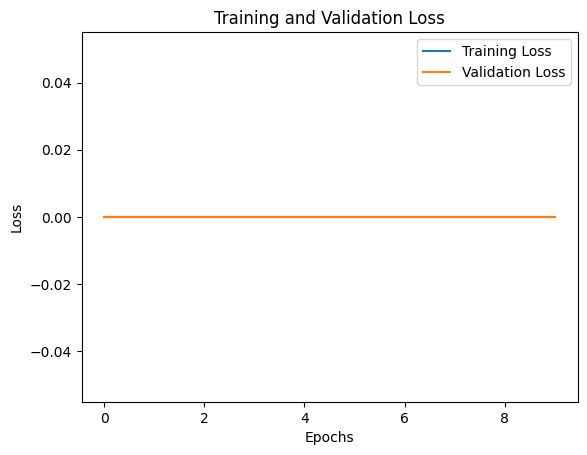

122/122 [==============================] - 1s 4ms/step
Quadratic Weighted Kappa (QWK) Score: 0.525031753784172


In [ ]:
# Plot loss curves
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the test set
y_pred = model.predict(testing_vectors)

# Round predictions to the nearest integer
y_pred_rounded = np.rint(y_pred).astype(int)

# Calculate Quadratic Weighted Kappa (QWK) score
qwk_score = cohen_kappa_score(y_test, y_pred_rounded, weights='quadratic')
print("Quadratic Weighted Kappa (QWK) Score:", qwk_score)